# INSTALLING AND IMPORTING DEPENDENCIES

In [25]:
# install dependencies

# model, performance, data automation etc
!pip install tensorflow

# cv library to work with web cams
!pip install opencv-python

# extract key points, use holistics, save them as frames
!pip install mediapipe 

# evaluation metrics, training/testing split
!pip install sklearn 

# visualisation
!pip install matplotlib 

  Using cached sklearn-0.0.post5.tar.gz (3.7 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for sklearn: filename=sklearn-0.0.post5-py3-none-any.whl size=2970 sha256=92efe90846c4d30ef9db7b319b6298c5bcf02f9e860ba8e77e4dc00b1a1ab705
  Stored in directory: c:\users\ananya\appdata\local\pip\cache\wheels\38\1f\8d\4f812c590e074c1e928f5cec67bf5053b71f38e2648739403a
Successfully built sklearn
                                              0.0/8.3 MB ? eta -:--:--
                                              0.0/8.3 MB 991.0 kB/s eta 0:00:09
                                              0.2/8.3 MB 2.5 MB/s eta 0:00:04
     -                                        0.4/8.3 MB 2.9 MB/s eta 0:00:03
     ----                                     0.8/8.3 MB 4.8 MB/s eta 0:00:02
     ------                                   1.3/8.3 MB 5.8 MB/s eta 0:00:02
     --------                                 1.8/8.3 MB 6.7 MB/s eta 0:00

In [4]:
#importing dependencies

import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
import time
import mediapipe as mp

# EXTRACTING KEYPOINTS USING MEDIAPIPE HOLISTICS

In [5]:
# Holistic model
mp_holistic = mp.solutions.holistic

# Drawing utilities
mp_drawing = mp.solutions.drawing_utils 

In [43]:
def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
    image.flags.writeable = False                  # Image is no longer writeable
    results = model.process(image)                 # Make prediction
    image.flags.writeable = True                   # Image is now writeable 
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
    return image, results

In [44]:
def draw_landmarks(image, results):
    mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_CONTOURS) # Draw face connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw left hand connections
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw right hand connections

In [45]:
def draw_styled_landmarks(image, results):
    # Draw face connections
    mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_CONTOURS, 
                             mp_drawing.DrawingSpec(color=(80,110,10), thickness=1, circle_radius=1), 
                             mp_drawing.DrawingSpec(color=(80,256,121), thickness=1, circle_radius=1)
                             ) 
    # Draw pose connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(80,22,10), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(80,44,121), thickness=2, circle_radius=2)
                             )
    # Draw left hand connections
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(121,22,76), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(121,44,250), thickness=2, circle_radius=2)
                             ) 
    # Draw right hand connections  
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS, 
                             mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                             ) 

In [7]:
cap = cv2.VideoCapture(0)

# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:

    while cap.isOpened():
        
        # Read feed
        ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
        print(results)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)

        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    
    cap.release()
    cv2.destroyAllWindows()

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

In [8]:
draw_landmarks(frame, results)

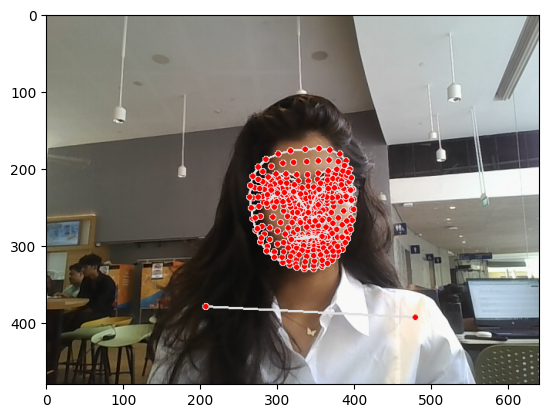

In [9]:
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

# EXTRACTING KEYPOINT VALUES

In [10]:
len(results.pose_landmarks.landmark)

33

In [11]:
pose = []
for res in results.pose_landmarks.landmark:
    test = np.array([res.x, res.y, res.z, res.visibility])
    pose.append(test)

In [12]:
len(pose)

33

In [13]:
def extract_keypoints(results):
    pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten() if results.pose_landmarks else np.zeros(33*4)
    face = np.array([[res.x, res.y, res.z] for res in results.face_landmarks.landmark]).flatten() if results.face_landmarks else np.zeros(468*3)
    lh = np.array([[res.x, res.y, res.z] for res in results.left_hand_landmarks.landmark]).flatten() if results.left_hand_landmarks else np.zeros(21*3)
    rh = np.array([[res.x, res.y, res.z] for res in results.right_hand_landmarks.landmark]).flatten() if results.right_hand_landmarks else np.zeros(21*3)
    return np.concatenate([pose, face, lh, rh])

In [14]:
result_test = extract_keypoints(results)

In [15]:
result_test

array([ 0.53147578,  0.53612524, -0.82596254, ...,  0.        ,
        0.        ,  0.        ])

In [16]:
np.save('0', result_test)

In [17]:
np.load('0.npy')

array([ 0.53147578,  0.53612524, -0.82596254, ...,  0.        ,
        0.        ,  0.        ])

# Data Collection

In [10]:
DATA_PATH = os.path.join('UCF50') # path for exported data
actions = np.array(os.listdir('UCF50'))
videoList = []
# for action in actions:
#     video = np.array(os.path.join('UCF50',action))
#     videoList.append(video)
# print(videoList)
no_sequences = 50 # 50 videos for each action
sequence_length = 30 # frames
start_folder = actions[0]

In [11]:
actions

array(['BaseballPitch', 'Basketball', 'BenchPress', 'Biking', 'Billiards',
       'BreastStroke', 'CleanAndJerk', 'Diving', 'Drumming', 'Fencing',
       'GolfSwing', 'HighJump', 'HorseRace', 'HorseRiding', 'HulaHoop',
       'JavelinThrow', 'JugglingBalls', 'JumpingJack', 'JumpRope',
       'Kayaking', 'Lunges', 'MilitaryParade', 'Mixing', 'Nunchucks',
       'PizzaTossing', 'PlayingGuitar', 'PlayingPiano', 'PlayingTabla',
       'PlayingViolin', 'PoleVault', 'PommelHorse', 'PullUps', 'Punch',
       'PushUps', 'RockClimbingIndoor', 'RopeClimbing', 'Rowing',
       'SalsaSpin', 'SkateBoarding', 'Skiing', 'Skijet', 'SoccerJuggling',
       'Swing', 'TaiChi', 'TennisSwing', 'ThrowDiscus',
       'TrampolineJumping', 'VolleyballSpiking', 'WalkingWithDog', 'YoYo'],
      dtype='<U18')

In [12]:
len(actions)

50

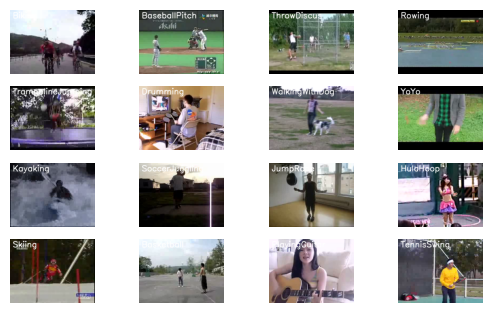

In [21]:
import random

random_range = random.sample(range(len(actions)), 16)

for counter, random_index in enumerate(random_range, 1):
    action = actions[random_index]  
#     print(action)
    videoList = os.listdir(f'UCF50/{action}')
    video = random.choice(videoList)
    video_reader = cv2.VideoCapture(f'UCF50/{action}/{video}')
    _, bgr_frame = video_reader.read()
    video_reader.release()
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
    cv2.putText(rgb_frame, action, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')

In [22]:
def avi_to_npy(video_path, output_path):
    video_capture = cv2.VideoCapture(video_path)
    frames = []
    while video_capture.isOpened():
        ret, frame = video_capture.read()
        if not ret:
            break
        frames.append(frame)
    video_array = np.array(frames)
    np.save(output_path, video_array)
    print("Conversion successful")

In [23]:
# CONVERSION FROM .AVI TO .NPY 

# os.mkdir(os.path.join('demoUCF'))
for action in actions:
    outputFolder = os.path.join('demoUCF',action)
    print(outputFolder)
#   os.mkdir(outputFolder)
    for video in np.array(os.listdir(os.path.join(DATA_PATH, action))):
#         print(video)
        tempTuple = os.path.splitext(video)
        filename = tempTuple[0]
        vidName = filename+".npy"
        outputPath = os.path.join(outputFolder, vidName)
#         print(outputPath)
#         avi_to_npy(video, outputPath)

demoUCF\BaseballPitch
demoUCF\Basketball
demoUCF\BenchPress
demoUCF\Biking
demoUCF\Billiards
demoUCF\BreastStroke
demoUCF\CleanAndJerk
demoUCF\Diving
demoUCF\Drumming
demoUCF\Fencing
demoUCF\GolfSwing
demoUCF\HighJump
demoUCF\HorseRace
demoUCF\HorseRiding
demoUCF\HulaHoop
demoUCF\JavelinThrow
demoUCF\JugglingBalls
demoUCF\JumpingJack
demoUCF\JumpRope
demoUCF\Kayaking
demoUCF\Lunges
demoUCF\MilitaryParade
demoUCF\Mixing
demoUCF\Nunchucks
demoUCF\PizzaTossing
demoUCF\PlayingGuitar
demoUCF\PlayingPiano
demoUCF\PlayingTabla
demoUCF\PlayingViolin
demoUCF\PoleVault
demoUCF\PommelHorse
demoUCF\PullUps
demoUCF\Punch
demoUCF\PushUps
demoUCF\RockClimbingIndoor
demoUCF\RopeClimbing
demoUCF\Rowing
demoUCF\SalsaSpin
demoUCF\SkateBoarding
demoUCF\Skiing
demoUCF\Skijet
demoUCF\SoccerJuggling
demoUCF\Swing
demoUCF\TaiChi
demoUCF\TennisSwing
demoUCF\ThrowDiscus
demoUCF\TrampolineJumping
demoUCF\VolleyballSpiking
demoUCF\WalkingWithDog
demoUCF\YoYo


In [24]:
DATA_PATH = 'demoUCF'

In [25]:
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    for action in actions:
        for sequence in np.array(os.listdir(os.path.join('UCF50', action))):
            video = os.path.join('UCF50', action, sequence)
            cap = cv2.VideoCapture(video)
            for frame_num in range(sequence_length):
                ret, frame = cap.read()
                image, results = mediapipe_detection(frame, holistic)
                draw_styled_landmarks(image, results)
                keypoints = extract_keypoints(results)
                npy_path = os.path.join(DATA_PATH, action, str(sequence), str(frame_num))
                print(npy_path)
                print(keypoints)
#                  np.save(npy_path, keypoints)
        cap.release()
        cv2.destroyAllWindows()

demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\0
[0.25994378 0.20099616 0.044755   ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\1
[0.26033354 0.2001307  0.06334777 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\2
[0.26058471 0.19952443 0.06770354 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\3
[0.24474081 0.20016767 0.04594961 ... 0.2883333  0.44268179 0.001855  ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\4
[0.24051709 0.20232421 0.06455574 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\5
[0.238713   0.20336987 0.05496552 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\6
[0.23173639 0.20291013 0.08385341 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c01.avi\7
[0.22868066 0.20398562 0.10927747 ... 0.         0.         0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\17
[0.78452277 0.69570202 0.14621906 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\18
[0.77877551 0.69374281 0.13957225 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\19
[0.7761265  0.69044876 0.097748   ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\20
[0.77757835 0.68462479 0.11055055 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c03.avi\21
[0.77768999 0.68163979 0.11276665 ... 0.         0.         0.

demoUCF\BaseballPitch\v_BaseballPitch_g01_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\0
[ 0.81145781  0.55942369 -0.06492104 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\7
[ 0.81624472  0.56696641 -0.1681544  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g01_c06.avi\8
[ 0.81586683  0.5642215  -0.11858133 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch

demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\17
[ 0.57862031  0.39413223 -0.11782942 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\18
[ 0.57473499  0.39284459 -0.05175079 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\19
[ 0.57466704  0.40013212 -0.17929538 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\20
[ 0.57381213  0.40207258 -0.161369   ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\21
[ 0.56050527  0.39967149 -0.15111521 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\22
[ 0.56188017  0.39755258 -0.26933056 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\23
[ 0.56274313  0.39525834 -0.24107449 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c02.avi\24
[ 0.55449325  0.39511555 -0.2693291  ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g02_c04.avi\26
[ 0.56675965  0.37248811 -0.08540685 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c04.avi\27
[ 0.56807053  0.36847165 -0.10402814 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c04.avi\28
[ 0.56723225  0.36872476 -0.1052046  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g02_c04.avi\29
[ 0.56686193  0.36872154 -0.07538435 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c01.avi\1
[0.71833026 0.1871925  0.28582269 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c01.avi\2
[0.71887273 0.18788593 0.28914744 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c01.avi\3
[0.71525639 0.19745441 0.28583044 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c01.avi\4
[0.7

demoUCF\BaseballPitch\v_BaseballPitch_g03_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUC

demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\11
[0.27691326 0.34606913 0.04344284 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\12
[0.27890354 0.34677327 0.00295637 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\13
[ 0.27909675  0.34778816 -0.05908586 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\14
[ 0.27959484  0.34840152 -0.04021237 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\15
[ 0.27925238  0.34657419 -0.07460491 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\16
[ 0.27898863  0.34530327 -0.0649479  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\17
[ 0.27927125  0.34449977 -0.08760147 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g03_c06.avi\18
[ 0.27941617  0.34436673 -0.07241543 ...  0.          0.
  0.        ]
demoUC

demoUCF\BaseballPitch\v_BaseballPitch_g04_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c01.avi\26
[ 0.5596137   0.50484383 -0.1424561  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c01.avi\28
[ 0.56460375  0.49558818 -0.2276862  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c02.avi\6
[0. 0. 0. ...

demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g04_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]

demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\8
[ 0.23968163  0.43382275 -0.16346106 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\9
[ 0.24053097  0.43117532 -0.17285842 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\10
[0.24502    0.43127501 0.15148154 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\11
[ 0.24804537  0.43136045  0.22163288 ...  0.28430387  0.40345287
 -0.02861942]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\12
[0.25425965 0.43769178 0.16316375 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\13
[0.25743553 0.43493482 0.13893458 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\14
[ 0.25830299  0.43024158 -0.14147881 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c02.avi\15
[0.2636849  0.43102407 0.07081507 ... 0.         0.         0.        

demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\18
[ 0.22612734  0.43291998 -0.18784136 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\19
[ 0.2252719   0.43188637 -0.12109208 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\20
[ 0.21837886  0.43188649 -0.07063539 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\22
[ 0.21957585  0.4366197  -0.03480545 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\24
[0.22616872 0.43169829 0.04115994 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c04.avi\25
[0.22567907 0.43667918 0.03904593 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v

demoUCF\BaseballPitch\v_BaseballPitch_g05_c06.avi\29
[ 0.2309233   0.4352445  -0.05882714 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c07.avi\0
[ 0.2450202   0.43085161 -0.06344263 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c07.avi\1
[ 0.24668279  0.43658596 -0.08087605 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c07.avi\2
[ 0.25071934  0.44391596 -0.1366632  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c07.avi\3
[ 0.25303978  0.4450312  -0.13996793 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c07.avi\4
[ 0.25553116  0.44411188 -0.09012011 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c07.avi\5
[ 0.25954434  0.44838205 -0.0717511  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g05_c07.avi\6
[ 0.26264721  0.44819227 -0.08141655 ...  0.          0.
  0.        ]
demoUCF\Basebal

demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\8
[0.26303089 0.44015238 0.3254903  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\9
[0.27144414 0.43056336 0.33390078 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\10
[0.27429625 0.43266094 0.11802106 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\11
[0.2772046  0.43682352 0.1723292  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\12
[ 0.2798751   0.43567792 -0.09252645 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\13
[ 0.28869838  0.43589643 -0.04856076 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\14
[ 0.29185694  0.43219811 -0.04449625 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c02.avi\15
[ 0.29642493  0.42926878 -0.05205917 ...  0.          0.
  0.        ]
demoUC

demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\18
[ 0.68672001  0.33438635 -0.1680074  ...  0.6856088   0.36487678
 -0.00230662]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\19
[ 0.68786776  0.33475363 -0.09921752 ...  0.68038481  0.36430001
 -0.00508388]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\20
[ 0.6873557   0.33384842 -0.065443   ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\21
[ 0.68701601  0.33386186 -0.0873656  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\22
[ 0.69068325  0.33384481 -0.1023681  ...  0.70447099  0.36430711
 -0.013719  ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\23
[0.69365394 0.33193627 0.08581698 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\24
[0.69140989 0.33184889 0.01965706 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c04.avi\25
[0.69226897 0.33186597 0.0505945  ... 0.         0.  

demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\3
[ 0.29171547  0.44550163 -0.08135716 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\4
[ 0.29237106  0.43736932 -0.03813315 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\5
[ 0.29355019  0.44088173 -0.04871833 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\6
[ 0.29259267  0.44365442 -0.04348705 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\7
[ 0.29242602  0.44133055 -0.02920549 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\8
[ 0.29389107  0.43688002 -0.04195436 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\9
[ 0.29465079  0.43606576 -0.03473646 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g06_c07.avi\10
[ 0.2943154   0.43626928 -0.02910974 ...  0.          0.
  0.        ]
demoUCF\Basebal

demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\11
[ 0.64079261  0.20092468 -0.03408347 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\12
[ 0.64124912  0.19882783 -0.02627783 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\13
[ 0.64147222  0.19764526 -0.02277116 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\14
[ 0.64149272  0.19662499 -0.02056864 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\15
[ 0.64148474  0.19627494 -0.02697905 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\16
[ 0.64146775  0.19586848 -0.02821314 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\17
[ 0.64145321  0.19555539 -0.02943784 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c02.avi\18
[ 0.64084393  0.19589759 -0.04866387 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\20
[ 0.64132917  0.20369101 -0.18411475 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\21
[ 0.64139295  0.20535558 -0.16535342 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\22
[ 0.64150304  0.20643111 -0.16933626 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\23
[ 0.64127982  0.20979334 -0.17338239 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\24
[ 0.64142573  0.20990559 -0.12953994 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\25
[ 0.64152831  0.21157643 -0.11258817 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\26
[ 0.64153022  0.21309516 -0.11686273 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c04.avi\27
[ 0.64148319  0.21432643 -0.12188818 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g07_c06.avi\28
[ 0.61553079  0.23091735 -0.22308287 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c06.avi\29
[ 0.61609125  0.23892531 -0.18218803 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c07.avi\0
[ 0.64608133  0.21518785 -0.11986493 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c07.avi\1
[ 0.64716011  0.20253307 -0.09152512 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c07.avi\2
[ 0.64907444  0.20005554 -0.06942416 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c07.avi\3
[ 0.64419091  0.19768156 -0.08012867 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c07.avi\4
[ 0.64361137  0.19542821 -0.09578188 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g07_c07.avi\5
[ 0.63398015  0.19529819 -0.17445835 ...  0.          0.
  0.        ]
demoUCF\Baseba

demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\7
[ 0.45185965  0.14115542 -0.15373415 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\8
[ 0.44754809  0.14146547 -0.10998753 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\9
[ 0.44720721  0.14194401 -0.10771324 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\10
[ 0.44794115  0.14279336 -0.13814135 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\11
[ 0.44794884  0.14365722 -0.13975392 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\12
[ 0.44750628  0.14533333 -0.14121588 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\13
[ 0.44900042  0.14850749 -0.14767569 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c02.avi\14
[ 0.44980082  0.15014678 -0.15008198 ...  0.          0.
  0.        ]
demoUCF\Bas

demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\15
[ 0.46238464  0.15794501 -0.19322762 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\16
[ 0.46484178  0.15828481 -0.18278641 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\17
[ 0.46503386  0.15848997 -0.17825694 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\18
[ 0.46745834  0.15903799 -0.17723487 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\19
[ 0.46888345  0.15918116 -0.17922698 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\20
[ 0.47188053  0.15823144 -0.18626159 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\21
[ 0.47223973  0.15796167 -0.20384185 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c04.avi\22
[ 0.47181663  0.15743309 -0.22548807 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g08_c06.avi\24
[ 0.48728228  0.16672455 -0.39251572 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c06.avi\25
[ 0.48851424  0.16779989 -0.38905007 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c06.avi\26
[ 0.48900834  0.16759673 -0.38597301 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c06.avi\27
[ 0.48907503  0.16732284 -0.38235387 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c06.avi\28
[ 0.48878893  0.16670458 -0.38024426 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c06.avi\29
[ 0.48846754  0.1670177  -0.39111611 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c07.avi\0
[ 0.44982749  0.16664603 -0.14463189 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g08_c07.avi\1
[ 0.4479292   0.16709851 -0.14185506 ...  0.          0.
  0.        ]
demoUCF\Ba

demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\3
[ 0.44095302  0.20892915 -0.17073986 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\4
[ 0.44197759  0.20540994 -0.20530233 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\5
[ 0.44135323  0.20832647 -0.18638673 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\6
[ 0.44131893  0.20962612 -0.17926668 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\7
[ 0.44145554  0.2074991  -0.18940333 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\8
[ 0.44162098  0.20820342 -0.10534732 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\9
[ 0.44171581  0.20834808 -0.12992473 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c02.avi\10
[ 0.43100253  0.2047379  -0.08266978 ...  0.          0.
  0.        ]
demoUCF\Basebal

demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\12
[ 0.44632238  0.216251   -0.14035137 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\13
[ 0.44663167  0.21704026 -0.14231673 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\14
[ 0.44679967  0.21752861 -0.14100197 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\15
[ 0.44464803  0.22539359 -0.1433866  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\16
[ 0.44316888  0.22782145 -0.13193385 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\17
[ 0.44255123  0.22890809 -0.13768162 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\18
[ 0.43933615  0.23757418 -0.15758839 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c04.avi\19
[ 0.43711287  0.23985066 -0.15747517 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\19
[ 0.45187965  0.22765316 -0.20571634 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\20
[ 0.44972768  0.23436667 -0.10487273 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\21
[ 0.44832277  0.23525329 -0.13832904 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\22
[ 0.44812375  0.23605888 -0.09865364 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\23
[ 0.44611543  0.24942276 -0.20843515 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\24
[ 0.44374546  0.2575784  -0.33671096 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\25
[ 0.43997073  0.26702443 -0.42002764 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g09_c06.avi\26
[ 0.43868336  0.26981071 -0.3800467  ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g10_c01.avi\27
[ 0.34038118  0.1830855  -0.14656498 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c01.avi\28
[ 0.3447085   0.18654193 -0.1334208  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c01.avi\29
[ 0.34627956  0.18918547 -0.14225188 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c02.avi\0
[0.43737674 0.22474697 0.04771967 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c02.avi\1
[0.50065637 0.21903957 0.22415623 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c02.avi\2
[0.50621969 0.21576983 0.21610805 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c02.avi\3
[0.50554001 0.21288951 0.21994202 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c02.avi\4
[0.50681561 0.21353045 0.24470091 ... 0.         0.         0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\4
[ 0.42899388  0.23595123 -0.13379052 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\5
[ 0.42840004  0.23686276 -0.13380153 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\6
[ 0.42786098  0.24135429 -0.11670321 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\7
[ 0.42730436  0.24201959 -0.11596759 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\8
[ 0.42499462  0.24688439 -0.11479892 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\9
[ 0.42481917  0.24891305 -0.11794224 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\10
[ 0.42403656  0.25172949 -0.12038229 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g10_c04.avi\11
[ 0.42382184  0.25250825 -0.11981253 ...  0.          0.
  0.        ]
demoUCF\Baseba

demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\13
[0.23832925 0.38456574 0.17730835 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\14
[0.238464   0.38396671 0.13080069 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\15
[0.24047422 0.38453645 0.12804416 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\16
[0.24362974 0.38388526 0.14856835 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\17
[0.24347317 0.38454717 0.19574969 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\18
[0.24406643 0.39019397 0.24829909 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\19
[0.2482405  0.39275989 0.24200508 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c01.avi\20
[0.24760056 0.39148217 0.28726038 ... 0.         0.         0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\20
[ 0.2635892   0.39127043 -0.0082571  ...  0.3102611   0.50955611
 -0.00458517]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\21
[0.26220626 0.39075074 0.0765782  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\22
[0.26370463 0.39313304 0.09823097 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\23
[0.26286063 0.39426181 0.03566342 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\24
[ 0.26622328  0.39442644 -0.02280722 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\25
[ 0.27177325  0.40598258 -0.09101304 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\26
[ 0.26961881  0.4032937  -0.05161159 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c03.avi\27
[ 0.2748211   0.40424883 -0.03552205 ...  0.          0.
  0.       

demoUCF\BaseballPitch\v_BaseballPitch_g11_c05.avi\26
[ 0.25976115  0.39009413 -0.00491807 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c05.avi\27
[ 0.26282215  0.39030123 -0.10411181 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c05.avi\28
[ 0.26354331  0.39021125 -0.10522052 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g11_c05.avi\29
[ 0.26540533  0.39245847 -0.15339021 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c01.avi\1
[0.24439928 0.39650318 0.17441922 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c01.avi\2
[0.24440181 0.39662877 0.20722666 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c01.avi\3
[0.24362007 0.39420345 0.19159009 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c01.avi\4
[0.2

demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\11
[ 0.18648723  0.43573469 -0.04146726 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\12
[0.18090543 0.42562252 0.09368819 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\13
[0.17184475 0.42541236 0.02941979 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\14
[ 0.17420259  0.42888644 -0.02861493 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g12_c03.avi\15
[ 0.18288696  0.43050736 -0.0233217  ...  0.          0.
  0.       

demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\17
[0.18777543 0.39539176 0.11626242 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\18
[0.18787545 0.39532083 0.11905638 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\19
[0.18710829 0.39518282 0.1206954  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\20
[0.1870718  0.3951644  0.13003111 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\21
[0.18698908 0.3899864  0.12216429 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\22
[0.19060126 0.39011759 0.11917341 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\23
[0.1922141  0.39091042 0.1119045  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c01.avi\24
[0.19577989 0.3958734  0.10342234 ... 0.         0.         0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g13_c03.avi\25
[0.17349111 0.39233097 0.08606289 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c03.avi\26
[0.17149118 0.39322105 0.07995577 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c03.avi\27
[0.17059568 0.3935461  0.07797439 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c03.avi\28
[0.17111807 0.39245966 0.07711618 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c03.avi\29
[0.17151931 0.39262307 0.08749338 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c04.avi\0
[0.21895635 0.40898192 0.09206896 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c04.avi\1
[0.22399707 0.41389984 0.09119885 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c04.avi\2
[0.22509822 0.41141933 0.08485571 ... 0.         0.         0.        ]
dem

demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\17
[ 0.67265618  0.16008843 -0.4745473  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\18
[ 0.67421234  0.17587064 -0.3569192  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\19
[ 0.66895044  0.1405659  -0.29769808 ...  0.70767331  0.34202591
 -0.00481588]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\20
[ 0.66823345  0.14273591 -0.17908449 ...  0.70676321  0.33867711
 -0.00613546]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\21
[ 0.66352165  0.17517649 -0.05793155 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g13_c06.avi\26
[0.

demoUCF\BaseballPitch\v_BaseballPitch_g14_c01.avi\29
[0.55799359 0.16421689 0.02355425 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c02.avi\0
[0.56462377 0.16630755 0.09101149 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c02.avi\1
[0.56864583 0.16610545 0.18356229 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c02.avi\2
[0.56781274 0.16950287 0.20970413 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c02.avi\3
[0.56808221 0.16807328 0.27313048 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c02.avi\4
[0.57305229 0.16556187 0.27181762 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c02.avi\5
[0.57657534 0.16566935 0.31603485 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c02.avi\6
[0.58016503 0.16547711 0.32259527 ... 0.         0.         0.        ]
demoUCF

demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\5
[0.52289104 0.2369685  0.2083191  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\6
[0.51921713 0.23495071 0.18565498 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\7
[0.51996827 0.23384653 0.20356102 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\8
[0.51467371 0.20974894 0.24116762 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\9
[0.51511037 0.20754994 0.22878399 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\10
[0.51345932 0.20722464 0.23659399 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\11
[0.51030594 0.20430405 0.23954859 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g14_c04.avi\12
[0.51259798 0.20407577 0.21976633 ... 0.         0.         0.        ]
demoU

demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\15
[0.50322402 0.33588761 0.08525331 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\16
[0.5031181  0.33617383 0.09102414 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\17
[0.50079954 0.33705771 0.08869885 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\18
[0.49949232 0.33857909 0.08856957 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\19
[0.49537939 0.33966109 0.08571915 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\20
[0.49483556 0.34088179 0.09010158 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\21
[0.48820671 0.34476504 0.06933751 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c02.avi\22
[0.4886083  0.34648994 0.06153043 ... 0.         0.         0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\21
[0.55899894 0.16059382 0.09030386 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\22
[0.55933744 0.15967059 0.10162999 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\23
[0.55910814 0.1594606  0.09959487 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\24
[0.55905187 0.16391811 0.06992468 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\25
[0.55886817 0.16807403 0.07429005 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\26
[0.55806196 0.16741614 0.07408033 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\27
[0.55837601 0.1654543  0.08980548 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c04.avi\28
[0.55528319 0.16725038 0.0721724  ... 0.         0.         0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\0
[ 0.57325238  0.24298672 -0.01903406 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\1
[ 0.57064605  0.23849013 -0.01781462 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\2
[ 0.56800956  0.24062786 -0.01401406 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\3
[ 0.5662263   0.24356814 -0.01932161 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\4
[ 0.56771338  0.24549235 -0.01980452 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\5
[ 0.56847394  0.24526337 -0.01443916 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\6
[0.56869882 0.24559791 0.0246234  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g15_c07.avi\7
[0.56784117 0.24444689 0.00772249 ... 0.         0.         0.        ]
demoUCF\Baseba

demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\9
[6.04483068e-01 2.42812365e-01 2.30145728e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\10
[ 0.60616136  0.24732907 -0.03729085 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\11
[ 0.60359311  0.24953865 -0.05380671 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\12
[ 0.60249496  0.2587795  -0.10117353 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\13
[ 0.60145259  0.25084054 -0.04474017 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\14
[ 0.60327256  0.2516903  -0.03818417 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\15
[ 0.60359752  0.25394693 -0.05196951 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c02.avi\16
[ 0.60135639  0.25410235 -0.13557954 ...  0.          

demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\20
[ 0.59137356  0.28193727 -0.07886203 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\21
[ 0.58670419  0.2809113  -0.04981499 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\22
[ 0.58681756  0.27932128 -0.01327375 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\23
[0.58665931 0.27992472 0.04364967 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\24
[0.58632225 0.28003177 0.00856753 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\25
[ 0.58497751  0.27721673 -0.19530068 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\26
[ 0.58507448  0.2775481  -0.20388111 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g16_c04.avi\27
[ 0.5853014   0.27808535 -0.12532219 ...  0.          0.
  0.        ]
demoUC

demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\3
[0.20817026 0.43266764 0.09958839 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\4
[0.20836823 0.43147543 0.09565697 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\5
[0.20959088 0.4310295  0.07538651 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\6
[0.20799255 0.43225288 0.08291184 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\7
[0.20711651 0.432262   0.08759269 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\8
[0.20791654 0.43226454 0.07295763 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\9
[0.2088166  0.43243149 0.0586136  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c01.avi\10
[0.20779629 0.43217817 0.0706761  ... 0.         0.         0.        ]
demoUCF

demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\9
[ 0.22125599  0.41670176 -0.01583673 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\10
[0.22855353 0.4190416  0.00610628 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\11
[ 0.22783478  0.41887859 -0.04802463 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\12
[0.22714019 0.41883281 0.04129739 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\13
[0.23056595 0.42334777 0.0198992  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\14
[ 0.22287264  0.42255342  0.04736559 ...  0.26077878  0.37287289
 -0.00743615]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\15
[ 0.22283275  0.42247066 -0.06848256 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c03.avi\16
[ 0.22402823  0.42345637 -0.05810928 ...  0.          0.
  0.        

demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\15
[ 0.2085236   0.44618607 -0.00966749 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\16
[ 0.20870033  0.44600007 -0.00838388 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\17
[ 0.20873837  0.44653705 -0.00344607 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\18
[ 0.21071558  0.45148394 -0.05611682 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\19
[ 0.21339814  0.45564267 -0.12069458 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\20
[ 0.22013648  0.46000162 -0.08985003 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\21
[ 0.22505231  0.46239689 -0.0941008  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c05.avi\22
[ 0.23080178  0.46556315 -0.10436771 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\21
[ 0.21722648  0.45409405 -0.12871094 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\22
[ 0.21782295  0.4681181  -0.12372772 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\23
[0.21681643 0.47353682 0.04897488 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\24
[ 0.22340751  0.48698747 -0.19736829 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\25
[ 0.22962618  0.49411595 -0.1733737  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\26
[ 0.22611025  0.50067824 -0.24322915 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\27
[ 0.22842498  0.50774676 -0.29397568 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g17_c07.avi\28
[ 0.23457423  0.5194999  -0.21961527 ...  0.          0.
  0.        ]
demoUCF

demoUCF\BaseballPitch\v_BaseballPitch_g18_c02.avi\28
[0.36527523 0.35916936 0.38713014 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c02.avi\29
[0.36258343 0.35881048 0.38263711 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c03.avi\0
[0.29980531 0.35098204 0.35340679 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c03.avi\1
[ 0.2981661   0.33951876 -0.14569001 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c03.avi\2
[0.29666108 0.34262848 0.1465313  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c03.avi\3
[ 0.29585326  0.34355271 -0.18897131 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c03.avi\4
[ 0.29567531  0.34483021 -0.04080791 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c03.avi\5
[0.29604954 0.3456293  0.06360912 ... 0.         0.         0.        ]
demoUCF\B

demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\6
[0.2456871  0.33260807 0.12739258 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\7
[0.24726322 0.33280066 0.1292659  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\8
[0.24831708 0.33237943 0.12807015 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\9
[0.2489254  0.33271533 0.10740115 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\10
[0.24910195 0.33308923 0.12121315 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\11
[0.24848635 0.3333306  0.14562607 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\12
[0.24845819 0.33336505 0.20568664 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c05.avi\13
[0.24863978 0.33347559 0.20219299 ... 0.         0.         0.        ]
demo

demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\16
[ 0.22996566  0.34748462 -0.10337454 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\17
[ 0.22924995  0.34737396 -0.08417209 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\18
[ 0.22564924  0.34745201 -0.06896479 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\19
[ 0.22602861  0.34754691 -0.04476433 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\20
[ 0.22779343  0.34819645 -0.0571119  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\21
[ 0.22835262  0.35010746 -0.108018   ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\22
[ 0.22838822  0.35231367 -0.10932441 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g18_c07.avi\23
[ 0.22643001  0.35783502 -0.10531206 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g19_c02.avi\24
[0.23888591 0.36069334 0.09764056 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c02.avi\25
[0.22395274 0.34679827 0.15066099 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c02.avi\26
[ 0.22410779  0.3445974  -0.11434288 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c02.avi\27
[ 0.23198417  0.34496179 -0.11581624 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c02.avi\28
[ 0.21677378  0.34232956 -0.14438894 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c02.avi\29
[ 0.21635833  0.34153733 -0.12621421 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c03.avi\1
[ 0.50114328  0.26816407 -0.44726619 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c03.avi\2
[ 0

demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\1
[ 0.1700584   0.31270593 -0.19104011 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\2
[ 0.17352885  0.31758705 -0.1329761  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\3
[ 0.17327639  0.31170484 -0.12272438 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\4
[ 0.16965117  0.31079212 -0.09207301 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\5
[ 0.17428806  0.31043774 -0.10440731 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\6
[ 0.1740734   0.31050375 -0.09237418 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\7
[ 0.18568209  0.31083626 -0.0713929  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g19_c05.avi\8
[ 0.18721813  0.31037006 -0.09192467 ...  0.          0.
  0.        ]
demoUCF\Baseball

demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\10
[ 0.46381584  0.25891906 -0.1846073  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\11
[ 0.46670192  0.258239   -0.18514776 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\12
[ 0.46881738  0.26274708 -0.1817694  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\13
[ 0.46944046  0.26315147 -0.18755671 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\14
[ 0.46959201  0.2636134  -0.19436619 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\15
[ 0.47074133  0.26550001 -0.20246527 ...  0.43635598  0.43845502
 -0.01369482]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\16
[ 0.47433186  0.26670831 -0.19868425 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c02.avi\17
[ 0.47815189  0.26889935 -0.1946459  ...  0.          0.
  0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\17
[ 0.79606593  0.33930546 -0.23717749 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\18
[ 0.79626375  0.34001407 -0.28977948 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\19
[ 0.79970801  0.32984617 -0.27426749 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\20
[ 0.80179137  0.32469285 -0.21070316 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\21
[ 0.80152524  0.32636526 -0.2245301  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\22
[ 0.80349177  0.31411937 -0.26821953 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\23
[ 0.80670607  0.32071191 -0.35925421 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g20_c04.avi\24
[ 0.80579889  0.30927998 -0.41219687 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g21_c02.avi\26
[ 0.26645938  0.20376667 -0.12010895 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g21_c02.avi\27
[ 0.27183133  0.20297049 -0.14559731 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g21_c02.avi\28
[ 0.28016114  0.20186257 -0.18401052 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g21_c02.avi\29
[ 0.28851372  0.19945952 -0.18169978 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g21_c03.avi\0
[ 0.28888109  0.15384589 -0.04959405 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g21_c03.avi\1
[ 0.29196373  0.14854492 -0.04380161 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g21_c03.avi\2
[ 0.29163289  0.1500033  -0.02986381 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g21_c03.avi\3
[ 0.29172909  0.14540172 -0.03724444 ...  0.          0.
  0.        ]
demoUCF\Base

demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\4
[ 0.23620625  0.39757672 -0.14938012 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\5
[ 0.23375757  0.38959888 -0.14763741 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\6
[ 0.23380776  0.38717481 -0.14617291 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\7
[ 0.23219447  0.40530685 -0.13998982 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\8
[ 0.2321465   0.41045824 -0.15170768 ...  0.27134165  0.40972009
 -0.01507564]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\9
[ 0.23293762  0.40250748 -0.13812241 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\10
[ 0.23394795  0.4047747  -0.16195162 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c01.avi\11
[ 0.23515069  0.40022871 -0.17924735 ...  0.          0.
  0.        ]
demoUC

demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\10
[0.20446131 0.3326751  0.04436152 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\11
[0.20744689 0.33430985 0.06696119 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\12
[0.21462436 0.33476403 0.06414048 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\13
[0.21770909 0.32996473 0.02150685 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\14
[0.22275412 0.31860295 0.00096141 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\15
[ 0.23201552  0.31574735 -0.1458019  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\16
[ 0.23142996  0.31727409 -0.1406509  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c03.avi\17
[ 0.23333454  0.33752975 -0.01012286 ...  0.          0.
  0.        ]
dem

demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\18
[ 0.28666607  0.43577415 -0.21440546 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_BaseballPitch_g22_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BaseballPitch\v_Baseb

demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\21
[ 0.3544901   0.28505796 -0.22762105 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\22
[ 0.35469687  0.28544036 -0.22301395 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\23
[ 0.3537313   0.28650701 -0.23258761 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\24
[ 0.3514905   0.28668457 -0.2901454  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\25
[ 0.35152704  0.28699654 -0.2859726  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\26
[ 0.35095757  0.28718212 -0.27602589 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\27
[ 0.35024244  0.28715235 -0.2860412  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c01.avi\28
[ 0.34991035  0.28831354 -0.26597288 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g23_c03.avi\29
[ 0.37156099  0.31117889 -0.14933912 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c04.avi\0
[ 0.35522974  0.28484491 -0.16402218 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c04.avi\1
[ 0.34888545  0.28344125 -0.13847454 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c04.avi\2
[ 0.35046095  0.28147143 -0.13658783 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c04.avi\3
[ 0.35049888  0.27819794 -0.08299266 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c04.avi\4
[ 0.35090691  0.28180414 -0.03921043 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c04.avi\5
[ 0.35393307  0.28025788 -0.03047501 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c04.avi\6
[ 0.35873225  0.28154096 -0.03153728 ...  0.          0.
  0.        ]
demoUCF\Basebal

demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\7
[ 0.3641476   0.28198963 -0.03161304 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\8
[ 0.36482912  0.28597906 -0.03533894 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\9
[ 0.36545381  0.2880556  -0.03754995 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\10
[ 0.36754996  0.29140317 -0.04359041 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\11
[ 0.37165445  0.29198378 -0.02673115 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\12
[ 0.37186119  0.29120925 -0.04618219 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\13
[ 0.37219554  0.29063907 -0.06882285 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g23_c06.avi\14
[ 0.37265202  0.28867781 -0.07240708 ...  0.          0.
  0.        ]
demoUCF\Bas

demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\14
[0.25063822 0.10398278 0.1682557  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\15
[0.25091368 0.10584377 0.16561909 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\16
[0.24177928 0.09304061 0.11254293 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\17
[0.23671362 0.08628424 0.10324851 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\18
[0.233934   0.08643195 0.11374424 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\19
[0.23399496 0.09069961 0.089678   ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\20
[0.23456617 0.09749773 0.07994229 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c01.avi\21
[0.23241587 0.09932583 0.07579921 ... 0.         0.         0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\21
[0.26961821 0.09314915 0.25909489 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\22
[0.2696203  0.09315445 0.25670576 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\23
[0.26921657 0.09077641 0.25735003 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\24
[0.26885992 0.09071188 0.26254955 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\25
[0.2688022  0.08858628 0.22725525 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\26
[0.26878089 0.08617644 0.21438646 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\27
[0.2685656  0.08390737 0.20543973 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c03.avi\28
[0.2693581  0.08441353 0.19525318 ... 0.         0.         0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g24_c05.avi\28
[0.23215342 0.12523879 0.05511827 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c05.avi\29
[ 0.23290324  0.13103028  0.05468852 ...  0.2771059   0.16753666
 -0.00656464]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c06.avi\0
[0.23622563 0.11406199 0.1614702  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c06.avi\1
[0.23661986 0.11002064 0.20408666 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c06.avi\2
[0.24038561 0.11054109 0.19084775 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c06.avi\3
[0.24032709 0.11077011 0.21851778 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c06.avi\4
[0.24380414 0.11153401 0.21182963 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g24_c06.avi\5
[0.24431793 0.1118572  0.22281435 ... 0.         0.         0.        ]

demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\5
[0.66816914 0.17907904 0.25355873 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\6
[0.66638303 0.17952558 0.22966285 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\7
[0.66369599 0.17933331 0.21652922 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\8
[0.66017479 0.17954339 0.21558949 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\9
[0.65990263 0.17959157 0.22476593 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\10
[0.66026205 0.17966415 0.23839095 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\11
[0.65959477 0.17974378 0.24328785 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c01.avi\12
[0.65975815 0.17915599 0.19432755 ... 0.         0.         0.        ]
demoU

demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\12
[ 0.65853399  0.18986741 -0.17427686 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\13
[ 0.65674615  0.19242606 -0.19598518 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\14
[ 0.65657437  0.19257529 -0.22399473 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\15
[ 0.65681535  0.19283994 -0.21717457 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\16
[ 0.65693265  0.19177541 -0.2167753  ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\17
[ 0.65708381  0.19437334 -0.29568809 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\18
[ 0.65868199  0.20116799 -0.27884513 ...  0.          0.
  0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c03.avi\19
[ 0.65543067  0.20076805 -0.30759993 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\20
[0.68375736 0.19400954 0.14295062 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\21
[0.6851784  0.19396116 0.15620838 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\22
[0.68606484 0.19388779 0.1920251  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\23
[0.6863277  0.1940632  0.18480447 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\24
[0.6848712  0.19707391 0.12309233 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\25
[0.68431729 0.1989405  0.1018097  ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\26
[0.68014562 0.20163719 0.10038648 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c05.avi\27
[0.67725408 0.2027124  0.08832655 ... 0.         0.         0.        ]


demoUCF\BaseballPitch\v_BaseballPitch_g25_c07.avi\26
[0.66723889 0.18446904 0.22496417 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c07.avi\27
[0.66909403 0.1854925  0.23835278 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c07.avi\28
[0.67215818 0.18661235 0.25921899 ... 0.         0.         0.        ]
demoUCF\BaseballPitch\v_BaseballPitch_g25_c07.avi\29
[0.6768235  0.18723392 0.22886021 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g01_c01.avi\1
[0.65669197 0.48079002 0.0022988  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c01.avi\2
[0.6568383  0.47920245 0.00346277 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c01.avi\3
[0.65644014 0.47051573 0.01896455 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c01.avi\4
[0.65673959 0.46913499 0.01426

demoUCF\Basketball\v_Basketball_g01_c03.avi\9
[0.23207457 0.49667126 0.02858971 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c03.avi\10
[0.23287252 0.49238333 0.06474414 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c03.avi\11
[0.233162   0.49129039 0.0331613  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c03.avi\12
[0.2416898  0.48594388 0.02365341 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c03.avi\13
[0.24209365 0.4879207  0.01383266 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c03.avi\14
[ 0.24403247  0.49876869  0.0234491  ...  0.25166383  0.57546973
 -0.00811277]
demoUCF\Basketball\v_Basketball_g01_c03.avi\15
[ 0.24468601  0.50005829 -0.00099796 ...  0.25169453  0.57774115
 -0.00757142]
demoUCF\Basketball\v_Basketball_g01_c03.avi\16
[0.24481185 0.49999085 0.04742114 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01

demoUCF\Basketball\v_Basketball_g01_c05.avi\20
[ 0.67752838  0.46872231 -0.01939596 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\21
[ 0.67718297  0.46852812 -0.01524546 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\22
[0.67733973 0.4683533  0.00745656 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\23
[ 0.6772424   0.46832678 -0.02994737 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\24
[ 0.67735207  0.46749982 -0.03822088 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\25
[ 0.67773086  0.46757874 -0.03305631 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\26
[ 0.67775285  0.46756521 -0.03047646 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\27
[ 0.67779291  0.46751678 -0.02830286 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g01_c05.avi\28
[ 0.6780

demoUCF\Basketball\v_Basketball_g02_c01.avi\0
[ 0.30089432  0.4441582  -0.15179107 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g02_c01.avi\1
[ 0.29537529  0.43529546 -0.12076606 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g02_c01.avi\2
[ 0.29424205  0.44458881 -0.35036495 ...  0.31919008  0.5088523
 -0.00496968]
demoUCF\Basketball\v_Basketball_g02_c01.avi\3
[ 0.29703128  0.4342168  -0.35653856 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g02_c01.avi\4
[ 0.29282671  0.41990456 -0.38968629 ...  0.30953199  0.50719285
 -0.00671717]
demoUCF\Basketball\v_Basketball_g02_c01.avi\5
[ 0.28811198  0.41453916 -0.18696299 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g02_c01.avi\6
[ 0.2903305   0.41296297 -0.15787856 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g02_c01.avi\7
[ 0.28717807  0.41315806 -0.13454267 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g02_c01.avi\8
[ 0

demoUCF\Basketball\v_Basketball_g02_c03.avi\10
[0.63200915 0.33919048 0.14498852 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\11
[0.62844074 0.33669934 0.13684484 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\12
[0.62670994 0.32855287 0.14360222 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\13
[0.62607551 0.32630578 0.14662349 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\14
[0.6222167  0.32954267 0.19094925 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\15
[0.61835188 0.32947621 0.18660131 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\16
[0.61314952 0.33178046 0.19031125 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\17
[0.61290103 0.33221456 0.1846128  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c03.avi\18
[

demoUCF\Basketball\v_Basketball_g02_c05.avi\21
[0.88560712 0.4643451  0.26103374 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c05.avi\22
[8.85215104e-01 4.61905271e-01 2.45058343e-01 ... 9.79330957e-01
 7.75792003e-01 2.22669827e-04]
demoUCF\Basketball\v_Basketball_g02_c05.avi\23
[0.88461673 0.46149108 0.24958058 ... 0.97967923 0.77265805 0.00171023]
demoUCF\Basketball\v_Basketball_g02_c05.avi\24
[0.88438129 0.44283807 0.2523444  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c05.avi\25
[0.8842122  0.43859592 0.27814481 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c05.avi\26
[0.87915343 0.42393813 0.28332183 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c05.avi\27
[0.87806636 0.41758549 0.29739976 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g02_c05.avi\28
[0.87451106 0.41121328 0.28753912 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Ba

demoUCF\Basketball\v_Basketball_g03_c02.avi\2
[0.45113382 0.38164085 0.11733934 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\3
[0.45122734 0.38882834 0.0941477  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\4
[0.45146188 0.39482287 0.08253339 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\5
[ 0.45938054  0.35898545 -0.05513682 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\6
[ 0.46233559  0.33925673 -0.10405314 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\7
[ 0.46926975  0.33310568 -0.10145573 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\8
[ 0.47013703  0.30582756 -0.04849137 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\9
[ 0.47122765  0.30255762 -0.05069923 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g03_c02.avi\10
[ 0.47238827  

demoUCF\Basketball\v_Basketball_g03_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g03_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g03_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g03_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g03_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g03_c05.avi\0
[0.55579495 0.35230532 0.17773725 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c05.avi\1
[0.55618608 0.35176432 0.1809433  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c05.avi\2
[0.55650413 0.35150811 0.18106368 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c05.avi\3
[0.56109893 0.35001293 0.1771054  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c05.avi\4
[0.56398427 0.34788704 0.18373662 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g03_c05.avi\5
[0.563905

demoUCF\Basketball\v_Basketball_g04_c01.avi\13
[0.3081935  0.4083465  0.11768197 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\14
[0.31201291 0.41241992 0.17534263 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\15
[0.31239158 0.41602066 0.19144256 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\16
[0.31673279 0.42284676 0.2159632  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\17
[0.31871098 0.4250409  0.22793815 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\18
[0.31967795 0.42427525 0.27566409 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\19
[0.3199347  0.42531869 0.25416729 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\20
[0.32086042 0.41948116 0.17001623 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g04_c01.avi\21
[

demoUCF\Basketball\v_Basketball_g04_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g04_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g04_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g04_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g04_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g04_c04.avi\28
[ 0.24636874  0.42070192 -0.14820753 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g04_c04.avi\29
[ 0.24499626  0.41809177 -0.14371018 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g05_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g05_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g05_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g05_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g05_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g05_c01.avi\5
[0. 0. 0. ...

demoUCF\Basketball\v_Basketball_g05_c03.avi\21
[0.3467477  0.50376189 0.29634777 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\22
[0.34747586 0.50744462 0.32534653 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\23
[0.35172659 0.50765342 0.22668879 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\24
[0.35338828 0.50830615 0.34854162 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\25
[0.35802975 0.5079968  0.27598444 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\26
[0.35684812 0.50531954 0.21160297 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\27
[0.35781881 0.50394577 0.31833294 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\28
[0.35946918 0.50011396 0.24333994 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g05_c03.avi\29
[

demoUCF\Basketball\v_Basketball_g06_c02.avi\4
[ 0.52486414  0.61181438 -0.15000942 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c02.avi\5
[ 0.52181041  0.6116935  -0.16574842 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c02.avi\6
[ 0.52160668  0.61468703 -0.15293892 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c02.avi\7
[ 0.51796269  0.61848712 -0.11467531 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c02.avi\8
[ 0.5121454   0.62853402 -0.10284001 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c02.avi\9
[ 0.50909793  0.63539982 -0.09456909 ...  0.46934733  0.64449161
 -0.00758956]
demoUCF\Basketball\v_Basketball_g06_c02.avi\10
[ 0.5134421   0.64112693 -0.12135857 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c02.avi\11
[ 0.51527971  0.64554673 -0.15234014 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c02.avi\12
[ 0.507

demoUCF\Basketball\v_Basketball_g06_c04.avi\28
[ 0.38516825  0.66985983 -0.15391466 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g06_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g07_c01.avi\0
[0.18398911 0.52204067 0.13840513 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c01.avi\1
[0.18376136 0.52042073 0.12630782 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c01.avi\2
[0.18377385 0.52007073 0.16871737 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c01.avi\3
[1.83550194e-01 5.19358277e-01 9.69319791e-02 ... 2.12171599e-01
 6.13417745e-01 4.42513410e-04]
demoUCF\Basketball\v_Basketball_g07_c01.avi\4
[0.18411668 0.51866972 0.01566986 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c01.avi\5
[0.18231536 0.51724118 0.06833793 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\

demoUCF\Basketball\v_Basketball_g07_c04.avi\1
[0.71692431 0.40777439 0.24022904 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\2
[0.71013558 0.41408736 0.23400557 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\3
[0.71544373 0.41948912 0.28763443 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\4
[0.71914244 0.42134824 0.29221466 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\5
[0.71907747 0.43147385 0.32296973 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\6
[0.70718139 0.45430884 0.29936609 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\7
[0.69719929 0.48367384 0.29339823 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\8
[0.69019675 0.50894755 0.36089757 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g07_c04.avi\9
[0.6904313

demoUCF\Basketball\v_Basketball_g08_c02.avi\13
[0.13531129 0.37426582 0.14632306 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\14
[0.14501789 0.37325159 0.17877305 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\15
[0.16855568 0.3736926  0.03119901 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\16
[0.16819206 0.37522262 0.07355938 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\17
[0.18237743 0.38419953 0.07061271 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\18
[0.20076904 0.38613293 0.05156542 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\19
[0.2035844  0.38649699 0.03541231 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\20
[ 0.2201045   0.38875261 -0.00516621 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g08_c02.avi\21
[0

demoUCF\Basketball\v_Basketball_g08_c04.avi\26
[0.18920699 0.45101941 0.16011412 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c04.avi\27
[0.18765044 0.45281079 0.16177762 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c04.avi\28
[0.18643002 0.45364535 0.16521767 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g08_c04.avi\29
[0.18654813 0.45385331 0.1671174  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g09_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g0

demoUCF\Basketball\v_Basketball_g09_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g09_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketb

demoUCF\Basketball\v_Basketball_g10_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g10_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUC

demoUCF\Basketball\v_Basketball_g10_c05.avi\9
[ 0.83403409  0.47071794 -0.05560991 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\10
[ 0.83422595  0.46611735 -0.07203142 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\11
[ 0.83571851  0.4957504  -0.03880626 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\12
[0.83750868 0.59428287 0.04289461 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\13
[ 0.83874446  0.5558666  -0.08237344 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\14
[ 0.83327597  0.52683949 -0.03613864 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\15
[0.83942956 0.55800253 0.20316465 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\16
[0.8372072  0.55736953 0.13558891 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g10_c05.avi\17
[ 0.811

demoUCF\Basketball\v_Basketball_g11_c03.avi\14
[0.49473137 0.3996042  0.18858553 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g11_c03.avi\15
[0.48871151 0.40176147 0.23376015 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g11_c03.avi\16
[0.4880715  0.39520416 0.18859737 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g11_c03.avi\17
[ 0.42823201  0.43237454 -0.17616516 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g11_c03.avi\18
[ 0.43278083  0.41826019 -0.18927166 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g11_c03.avi\19
[ 0.43577248  0.42251447 -0.1044773  ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g11_c03.avi\20
[ 0.43308201  0.41936734 -0.08295318 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g11_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g11_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketba

demoUCF\Basketball\v_Basketball_g12_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketba

demoUCF\Basketball\v_Basketball_g12_c04.avi\27
[ 0.46244949  0.37139052 -0.33978039 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g12_c04.avi\28
[ 0.46257013  0.36039665 -0.35911375 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g12_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g12_c05.avi\0
[ 0.54429698  0.5071044  -0.18725328 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g12_c05.avi\1
[ 0.54308856  0.50795251 -0.18724436 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g12_c05.avi\2
[ 0.54054427  0.50866944 -0.17292973 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g12_c05.avi\3
[ 0.54062855  0.50899071 -0.17531459 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g12_c05.avi\4
[ 0.53944516  0.50878102 -0.217226   ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g12_c05.avi\5
[ 0.5394901   0.5087657  -0.23716924 ...  0.          0.
  0. 

demoUCF\Basketball\v_Basketball_g13_c02.avi\9
[ 0.24528046  0.45129123 -0.15201166 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\10
[ 0.24470429  0.4466998  -0.14230129 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\11
[ 0.24420509  0.44706136 -0.14930098 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\12
[ 0.24131981  0.44703561 -0.15070806 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\13
[ 0.2402852   0.44703615 -0.14646874 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\14
[ 0.24570081  0.46679503 -0.13946702 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\15
[ 0.24771781  0.47084409 -0.14257862 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\16
[ 0.25001168  0.46996588 -0.14356342 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c02.avi\17
[ 0.263475

demoUCF\Basketball\v_Basketball_g13_c04.avi\20
[ 0.83706939  0.45573196 -0.06140091 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\21
[ 0.83686322  0.45640495 -0.03912166 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\22
[ 0.83693808  0.45784605 -0.02347489 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\23
[ 0.83412313  0.46000427 -0.08959167 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\24
[ 0.83254755  0.45928416 -0.07433495 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\25
[ 0.82246095  0.45901695 -0.11370409 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\26
[ 0.82226026  0.46029043 -0.07577182 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\27
[ 0.82131034  0.46194887 -0.06991595 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g13_c04.avi\28
[ 0.82288

demoUCF\Basketball\v_Basketball_g14_c03.avi\23
[0.56836498 0.42726681 0.01582524 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g14_c03.avi\24
[ 0.55327046  0.44745159 -0.05456198 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g14_c03.avi\25
[ 0.53944969  0.45482635 -0.202424   ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g14_c03.avi\26
[ 0.5417065   0.45239732 -0.09149534 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g14_c03.avi\27
[ 0.54183388  0.45330408 -0.08077689 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g14_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g14_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g14_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g14_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g14_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g14_c04.avi\3
[0. 0. 0. .

demoUCF\Basketball\v_Basketball_g15_c01.avi\19
[0.79257625 0.36607578 0.06753449 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\20
[0.794891   0.36348456 0.06334031 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\21
[0.79548347 0.36120239 0.07007672 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\22
[0.79496491 0.34744725 0.07037313 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\23
[0.79260939 0.33163753 0.18580405 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\24
[0.79115719 0.32719153 0.14899591 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\25
[0.78889066 0.32484579 0.11897828 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\26
[0.78777134 0.32199493 0.11076514 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c01.avi\27
[

demoUCF\Basketball\v_Basketball_g15_c04.avi\11
[0.31773847 0.4211382  0.0073837  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\12
[0.31977615 0.42134389 0.00915769 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\13
[ 0.31580588  0.42159036 -0.03358931 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\14
[ 0.30221072  0.42091495 -0.01818424 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\15
[0.30091119 0.41855076 0.0009719  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\16
[0.29375365 0.41444764 0.01637989 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\17
[0.29244846 0.41240957 0.0342377  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\18
[0.29193026 0.41225985 0.04441895 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c04.avi\19
[ 0

demoUCF\Basketball\v_Basketball_g15_c06.avi\22
[0.44946772 0.37496147 0.15217246 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c06.avi\23
[0.4564144  0.37467533 0.15295699 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c06.avi\24
[0.45452052 0.37379229 0.16360837 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c06.avi\25
[0.45422015 0.37351239 0.16597199 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c06.avi\26
[0.45483512 0.37272507 0.17195229 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c06.avi\27
[0.45490512 0.37249935 0.17358097 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c06.avi\28
[0.46060866 0.37282509 0.16343811 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c06.avi\29
[0.46444574 0.37564042 0.15164034 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g15_c07.avi\0
[0

demoUCF\Basketball\v_Basketball_g16_c02.avi\4
[0.6268732  0.55646288 0.12876247 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\5
[0.62643373 0.5572384  0.12155147 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\6
[0.62609148 0.55771375 0.12154143 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\7
[0.62435889 0.5580337  0.10064974 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\8
[0.62371343 0.55831647 0.09506976 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\9
[0.62242281 0.55655915 0.05189012 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\10
[0.62189382 0.55563104 0.05514074 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\11
[0.62192595 0.5563342  0.06146268 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c02.avi\12
[0.6218

demoUCF\Basketball\v_Basketball_g16_c05.avi\7
[ 0.3703801   0.48892388 -0.1870562  ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\8
[ 0.376077    0.49434811 -0.10288908 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\9
[ 0.37413093  0.49972832 -0.09133382 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\10
[ 0.34107235  0.45835674 -0.08894393 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\11
[ 0.34174821  0.45400792 -0.07759315 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\12
[ 0.33808789  0.45219031 -0.0422462  ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\13
[0.36496338 0.41829029 0.18312445 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\14
[0.36794442 0.41707912 0.18499123 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g16_c05.avi\15
[0.3698594

demoUCF\Basketball\v_Basketball_g17_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g17_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketb

demoUCF\Basketball\v_Basketball_g18_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g18_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Ba

demoUCF\Basketball\v_Basketball_g18_c04.avi\22
[ 0.72274405  0.56775367 -0.21636486 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c04.avi\23
[ 0.72225165  0.56855375 -0.21941721 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c04.avi\24
[ 0.73117268  0.56451362 -0.21556079 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c04.avi\25
[ 0.72884375  0.56132257 -0.18892466 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c04.avi\26
[ 0.73351789  0.56101692 -0.15324394 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c04.avi\27
[ 0.73434871  0.56129378 -0.15432587 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c04.avi\28
[ 0.73432243  0.56236386 -0.13192655 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c04.avi\29
[ 0.7346977   0.56087291 -0.12266    ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g18_c05.avi\0
[0. 0. 0. 

demoUCF\Basketball\v_Basketball_g19_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c02.avi\22
[0.63629973 0.50058639 0.01998354 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketba

demoUCF\Basketball\v_Basketball_g19_c06.avi\4
[ 0.20415702  0.47372141 -0.00606825 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\5
[ 0.21022296  0.47993055 -0.04823563 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\6
[ 0.21017924  0.49164075 -0.02067703 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\7
[ 0.2209359   0.48994115 -0.06649793 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\8
[ 0.22350927  0.49162343 -0.06366022 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\9
[ 0.22846937  0.49226126 -0.09291746 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\10
[ 0.22945885  0.5060817  -0.0789818  ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\11
[ 0.23011927  0.52659577 -0.06296598 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g19_c06.avi\12
[ 0.23156174  0

demoUCF\Basketball\v_Basketball_g19_c08.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g19_c08.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g20_c01.avi\0
[ 0.50482863  0.48805234 -0.15149117 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c01.avi\1
[ 0.5029394   0.48891035 -0.14679353 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c01.avi\2
[0.50025576 0.48511571 0.01834654 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g20_c01.avi\3
[ 0.50844759  0.48247018 -0.06398713 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c01.avi\4
[ 0.51271665  0.48119792 -0.11960497 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c01.avi\5
[ 0.50498933  0.49035856 -0.07473536 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c01.avi\6
[0.50536221 0.48842227 0.10800058 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g20_c

demoUCF\Basketball\v_Basketball_g20_c03.avi\9
[ 0.47379094  0.47123325 -0.17648709 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\10
[ 0.47450089  0.47010538 -0.12545311 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\11
[ 0.47441483  0.49026158 -0.35868815 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\12
[ 0.46833557  0.50326377 -0.16961864 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\13
[ 0.4686904   0.49161318 -0.06284943 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\14
[ 0.46937594  0.47436985 -0.12898573 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\15
[ 0.46988168  0.46742377 -0.09096319 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\16
[ 0.47123766  0.46465537 -0.05618331 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c03.avi\17
[ 0.467574

demoUCF\Basketball\v_Basketball_g20_c05.avi\20
[ 0.5778181   0.54306692 -0.10353748 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\21
[ 0.5819279   0.54803872 -0.11316299 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\22
[ 0.58821201  0.56094944 -0.12367719 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\23
[ 0.58872104  0.57193482 -0.08859767 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\24
[ 0.58745378  0.56891525 -0.10296106 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\25
[ 0.59442425  0.58282816 -0.13169752 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\26
[ 0.5909071   0.5789091  -0.12858194 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\27
[ 0.58965999  0.57928222 -0.12826473 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g20_c05.avi\28
[ 0.58559

demoUCF\Basketball\v_Basketball_g21_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Bas

demoUCF\Basketball\v_Basketball_g21_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g21_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Bas

demoUCF\Basketball\v_Basketball_g22_c02.avi\4
[0.77834493 0.62585598 0.35786855 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c02.avi\16
[ 0.43459088  0.51658571 -0.3033058  ...  0.          0.
  

demoUCF\Basketball\v_Basketball_g22_c04.avi\18
[ 0.65744638  0.45458123 -0.10440817 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g22_c04.avi\19
[0.64378655 0.43794528 0.02402719 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g22_c04.avi\22
[0.37609336 0.46176904 0.1880371  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c04.avi\23
[0.37354189 0.46186858 0.09075233 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c04.avi\24
[0.36894798 0.46084562 0.16784826 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c04.avi\25
[0.36980608 0.45969641 0.14783514 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c04.avi\26
[0.36863047 0.4585335  0.07159401 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Baske

demoUCF\Basketball\v_Basketball_g22_c07.avi\3
[0.71390897 0.51229918 0.39990601 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\4
[0.70785177 0.53081679 0.46001658 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\5
[0.69882315 0.54920632 0.4375549  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\6
[0.69654161 0.56687742 0.44257936 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\7
[0.6981566  0.58637226 0.30474916 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\8
[0.69811881 0.6081053  0.36585629 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\9
[0.69790369 0.6422469  0.40173927 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\10
[0.69886768 0.66563898 0.40712008 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g22_c07.avi\11
[0.70323

demoUCF\Basketball\v_Basketball_g23_c01.avi\16
[0.29812446 0.40348768 0.23506363 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\17
[0.2937848  0.39602497 0.20022795 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\18
[0.29118955 0.38823462 0.265571   ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\19
[0.29078385 0.38802651 0.21761994 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\20
[0.28828809 0.38387042 0.13715389 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\21
[0.28698155 0.38263831 0.16067766 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\22
[0.28460377 0.38376525 0.15628341 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\23
[0.28362203 0.38438943 0.15409441 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c01.avi\24
[

demoUCF\Basketball\v_Basketball_g23_c03.avi\27
[ 0.48064882  0.27358809 -0.09300036 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g23_c03.avi\28
[ 0.48119307  0.2552315  -0.10424509 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g23_c03.avi\29
[ 0.48991972  0.26088297 -0.10382085 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g23_c04.avi\0
[0.47841868 0.38051897 0.15603594 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c04.avi\1
[0.4785974  0.39036864 0.17101386 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c04.avi\2
[0.46740922 0.3965866  0.20909762 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c04.avi\3
[0.46915126 0.39911467 0.35200655 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c04.avi\4
[0.49652928 0.41282168 0.17212118 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c04.avi\5
[0.4998477

demoUCF\Basketball\v_Basketball_g23_c06.avi\8
[0.35246053 0.44422361 0.12691019 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\9
[0.35289818 0.4456194  0.15538357 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\10
[0.36997458 0.44449919 0.138859   ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\11
[0.38292852 0.44228983 0.12976719 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\12
[0.38514948 0.4429394  0.10281664 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\13
[ 0.41337633  0.44083235 -0.02436597 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\14
[0.41109282 0.46259019 0.02204816 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\15
[ 0.40650433  0.46357664 -0.01587292 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g23_c06.avi\16
[0.40

demoUCF\Basketball\v_Basketball_g24_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g24_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF

demoUCF\Basketball\v_Basketball_g25_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c02.avi\28
[0.31119695 0.50809819 0.05203075 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g25_c02.avi\29
[0.31186223 0.511998   0.0464533  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g25_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c03.avi\2
[ 0.10584984  0.65866834 -0.26013178 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c03.avi\4
[ 0.12800728  0.59897763 -0.42769998 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c03.avi\5
[ 0.10490189  0.63142055 -0.086614   ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c03.avi\6
[ 0.10097249 

demoUCF\Basketball\v_Basketball_g25_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c05.avi\27
[ 0.32446486  0.51598603 -0.11319151 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c05.avi\28
[ 0.33016792  0.51690924 -0.06957695 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c05.avi\29
[ 0.33095416  0.5172416  -0.08880595 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Basketball\v_Basketball_g25_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Bask

demoUCF\Basketball\v_Basketball_g25_c08.avi\20
[0.2015665  0.70768744 0.18575862 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\21
[0.19962737 0.70803249 0.18627945 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\22
[0.20474431 0.69080234 0.1503506  ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\23
[0.20622405 0.68867034 0.16622773 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\24
[0.2199187  0.67807466 0.13207221 ... 0.         0.         0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\25
[ 0.22934079  0.67414892 -0.12219187 ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\26
[ 0.24158081  0.66144377 -0.0551612  ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\27
[ 0.24268794  0.65582824 -0.0582656  ...  0.          0.
  0.        ]
demoUCF\Basketball\v_Basketball_g25_c08.avi\28
[ 0.

demoUCF\BenchPress\v_BenchPress_g01_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g01_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPre

demoUCF\BenchPress\v_BenchPress_g02_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUC

demoUCF\BenchPress\v_BenchPress_g02_c04.avi\15
[0.54885542 0.36188748 0.59782636 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPre

demoUCF\BenchPress\v_BenchPress_g02_c07.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\21
[0.56462365 0.40279931 0.62312007 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\22
[0.56401044 0.38407215 0.65738648 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\23
[0.56301665 0.37582418 0.68626839 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\24
[0.55577141 0.37290925 0.44809619 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\25
[0.55217397 0.36678821 0.49109712 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g02_c07.avi\26
[0.

demoUCF\BenchPress\v_BenchPress_g03_c03.avi\11
[ 0.44360042  0.75310642 -0.87176198 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPres

demoUCF\BenchPress\v_BenchPress_g03_c07.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g03_c07.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Ben

demoUCF\BenchPress\v_BenchPress_g04_c02.avi\25
[ 0.53737116  0.08112375 -0.18975873 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c02.avi\26
[ 0.53628767  0.08405699 -0.26592326 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c02.avi\27
[ 0.5363096   0.09025066 -0.35545304 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c02.avi\28
[ 0.53514588  0.09179655 -0.46223077 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c02.avi\29
[ 0.53459203  0.08913047 -0.4436056  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c03.avi\0
[ 0.48017573  0.12980026 -0.25870118 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c03.avi\1
[ 0.47275424  0.12098099 -0.24172065 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c03.avi\2
[ 0.46933752  0.11527927 -0.27162054 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c03.avi\3
[ 0.48160607 

demoUCF\BenchPress\v_BenchPress_g04_c05.avi\5
[ 0.4868806   0.0992693  -0.22979328 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\6
[ 0.48720685  0.12552267 -0.302389   ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\7
[ 0.4870387   0.12679368 -0.33637679 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\8
[ 0.48668399  0.1296667  -0.41238341 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\9
[ 0.48606721  0.12387335 -0.41112632 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\10
[ 0.48405591  0.12119051 -0.40753597 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\11
[ 0.48227343  0.12216762 -0.35781023 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\12
[ 0.47684765  0.11970307 -0.3623319  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c05.avi\13
[ 0.47320333  

demoUCF\BenchPress\v_BenchPress_g04_c07.avi\15
[ 0.54634744  0.091332   -0.39705545 ...  0.3098754   0.45470941
 -0.00619781]
demoUCF\BenchPress\v_BenchPress_g04_c07.avi\16
[ 0.54621434  0.09042558 -0.30350271 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c07.avi\17
[ 0.54613644  0.09004082 -0.21361205 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c07.avi\18
[ 0.5461961   0.08992629 -0.36594635 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c07.avi\19
[ 0.54558426  0.09434081 -0.40076837 ...  0.29147327  0.41880283
 -0.00217809]
demoUCF\BenchPress\v_BenchPress_g04_c07.avi\20
[ 0.54205406  0.10090464 -0.44395271 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g04_c07.avi\21
[ 0.53996038  0.09981035 -0.41600341 ...  0.28860962  0.42368194
 -0.00641471]
demoUCF\BenchPress\v_BenchPress_g04_c07.avi\22
[ 0.54059666  0.09586248 -0.29192346 ...  0.30079648  0.45148495
 -0.00086552]
demoUCF\BenchPress\v_Ben

demoUCF\BenchPress\v_BenchPress_g05_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\21
[0.55927706 0.72859442 0.58987582 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\22
[0.5640893  0.67033786 0.77485746 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\23
[0.56251097 0.64148265 0.72928458 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\24
[0.56939405 0.63594157 0.58139634 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\25
[ 0.56670082  0.70760632  0.46780577 ...  0.43445659  0.49592382
 -0.0070891 ]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\26
[0.56603265 0.70648253 0.73072219 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c03.avi\27
[0.56417513 0.63567609 0.67511976 ... 0.         0.         0.        ]
demoUCF\BenchPress

demoUCF\BenchPress\v_BenchPress_g05_c06.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\12
[0.6953066  0.5949167  0.40373284 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\13
[0.69086134 0.56442511 1.03365171 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\14
[ 0.55575663  0.78876466 -0.44296861 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\15
[ 0.55634129  0.79140478 -0.38000643 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\16
[ 0.5439744   0.79674596 -0.53626186 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\17
[ 0.54550922  0.81826347 -0.62836194 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g05_c06.avi\18
[ 0.55770814  0.8107211  -0.51581919 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPres

demoUCF\BenchPress\v_BenchPress_g06_c02.avi\9
[0.51142079 0.61305124 0.38149643 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\10
[0.51126957 0.61813325 0.65477639 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\11
[0.51123464 0.63179547 0.44635925 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\12
[0.51075137 0.65704316 0.4075709  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\13
[0.50780821 0.66240132 0.27648145 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c02.avi\19
[5.1

demoUCF\BenchPress\v_BenchPress_g06_c04.avi\26
[0.51135463 0.4888528  0.37704456 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g06_c05.avi\0
[ 0.53231961  0.67026657 -0.16723022 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c05.avi\1
[0.52546835 0.61405122 0.53486234 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c05.avi\2
[0.52261645 0.57591492 0.50223303 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c05.avi\3
[0.520778   0.54668534 0.66852319 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c05.avi\4
[0.51812351 0.58716965 0.60098994 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\B

demoUCF\BenchPress\v_BenchPress_g06_c07.avi\12
[0.5108999  0.68134969 0.28591153 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c07.avi\13
[0.51091492 0.67245543 0.44771081 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c07.avi\14
[0.50633246 0.67215598 0.5435673  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c07.avi\15
[ 0.50583768  0.65600491  0.84109223 ...  0.42609036  0.50702024
 -0.00288097]
demoUCF\BenchPress\v_BenchPress_g06_c07.avi\16
[0.50642997 0.62430108 0.57835543 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g06_c07.avi\17
[ 0.50711513  0.68304622  0.24853864 ...  0.44091341  0.50913286
 -0.00788528]
demoUCF\BenchPress\v_BenchPress_g06_c07.avi\18
[ 0.50531077  0.6887812   0.2126381  ...  0.43848407  0.49588272
 -0.00364746]
demoUCF\BenchPress\v_BenchPress_g06_c07.avi\19
[ 0.50568873  0.67193824  0.48728734 ...  0.44052732  0.48812246
 -0.00358406]
demoUCF\BenchPress\v

demoUCF\BenchPress\v_BenchPress_g07_c03.avi\2
[0.46342802 0.50138634 1.14242625 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\3
[0.45966554 0.49709755 0.98489696 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\4
[ 0.44886881  0.46706781  0.61327058 ...  0.25445816  0.36492565
 -0.01264513]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\5
[0.44657087 0.46800241 0.45100421 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\6
[0.44068748 0.46899843 0.5519098  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\7
[0.442866  0.4734028 0.3979007 ... 0.        0.        0.       ]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g07_c03.avi\10
[ 0.23484917  0.87699419 -0.40856442 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g

demoUCF\BenchPress\v_BenchPress_g07_c05.avi\15
[ 0.36905485  0.52510345  0.59880692 ...  0.22888008  0.56178999
 -0.01104175]
demoUCF\BenchPress\v_BenchPress_g07_c05.avi\16
[0.37008491 0.49972969 0.65555716 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c05.avi\17
[0.3775925  0.49399763 0.63216269 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c05.avi\18
[0.37009758 0.48911268 0.62370658 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c05.avi\19
[0.36918718 0.47369257 0.55443591 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c05.avi\20
[0.36775556 0.47811699 0.52344    ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c05.avi\21
[0.38201851 0.47717565 0.58847272 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c05.avi\22
[0.38111269 0.45235199 0.85387838 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g07_c05.a

demoUCF\BenchPress\v_BenchPress_g08_c01.avi\5
[ 0.82628679  0.54686296 -0.06621491 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\6
[ 0.81410503  0.60968345 -0.08623664 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\7
[ 0.81387043  0.61128551 -0.09531812 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\8
[ 0.75897813  0.62278068 -0.11892067 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\9
[0.69124031 0.52486557 0.00876419 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\10
[ 0.69849604  0.49916226 -0.01348874 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\11
[0.68770057 0.48996153 0.01650404 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\12
[ 0.76309782  0.52064782 -0.00189359 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c01.avi\13
[ 0.75583923

demoUCF\BenchPress\v_BenchPress_g08_c03.avi\15
[0.59937578 0.48966247 0.23721656 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\16
[0.61014056 0.50002819 0.17778882 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\17
[0.6110428  0.51594335 0.08436599 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\18
[0.61131084 0.53980106 0.20529607 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\19
[0.61167461 0.53624696 0.09809166 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\20
[0.61224049 0.53280079 0.07349676 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\21
[0.60791928 0.51877385 0.05962209 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\22
[0.59909821 0.5221923  0.07438073 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c03.avi\23
[

demoUCF\BenchPress\v_BenchPress_g08_c05.avi\26
[ 0.7053982   0.3942748  -0.29555824 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c05.avi\27
[ 0.71455342  0.37675312 -0.31196457 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c05.avi\28
[ 0.73442167  0.40836564 -0.18348554 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c05.avi\29
[ 0.72080815  0.42064035 -0.08754776 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c06.avi\0
[0.66107464 0.46346173 0.25710073 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c06.avi\1
[0.66200507 0.50150621 0.29180738 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c06.avi\2
[0.65712577 0.51337492 0.07193129 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c06.avi\3
[0.64450788 0.53064972 0.21846688 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g08_c06.avi\4
[ 0.691224

demoUCF\BenchPress\v_BenchPress_g09_c01.avi\9
[ 0.25764641  0.67384148 -0.51955551 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\10
[ 0.25530082  0.6743477  -0.36970693 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\11
[ 0.24960558  0.68868762 -0.53811979 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\12
[ 0.2500712   0.73553288 -0.41061053 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\13
[ 0.25218454  0.7455107  -0.41809607 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\14
[ 0.25619298  0.74704075 -0.43965149 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\15
[ 0.25720733  0.74227947 -0.40578231 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\16
[ 0.26778725  0.75760376 -0.32722783 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c01.avi\17
[ 0.269752

demoUCF\BenchPress\v_BenchPress_g09_c03.avi\20
[ 0.30617526  0.60049444 -0.16847852 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\26
[ 0.30513     0.58174098 -0.1270334  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\27
[ 0.30479601  0.58549434 -0.10950121 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\28
[ 0.30945387  0.6000306  -0.18343417 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c03.avi\29
[ 0.30918428  0.59859574 -0.16171172 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c04.avi\0
[ 0.30469

demoUCF\BenchPress\v_BenchPress_g09_c06.avi\10
[ 0.27867144  0.68677485 -0.52434421 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\11
[ 0.27984786  0.68612999 -0.57532954 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\12
[ 0.28016916  0.68694723 -0.46081719 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\13
[ 0.28133437  0.6877504  -0.40966755 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\14
[ 0.30623871  0.69404137 -0.42337757 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g09_c06.avi\20
[ 0.2301

demoUCF\BenchPress\v_BenchPress_g10_c01.avi\27
[ 0.49622726  0.34116536 -0.13931218 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c01.avi\28
[0.53700918 0.4047595  0.00537265 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c01.avi\29
[ 0.56753272  0.46048149 -0.38459817 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c02.avi\0
[ 0.47221309  0.24068202 -0.10712673 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c02.avi\1
[ 0.44509882  0.24608485 -0.41345596 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c02.avi\2
[ 0.44549984  0.25270325 -0.16960895 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c02.avi\3
[ 0.44738421  0.24114463 -0.18701579 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c02.avi\4
[ 0.41792408  0.19956274 -0.19478568 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c02.avi\5
[ 0.42197198  

demoUCF\BenchPress\v_BenchPress_g10_c04.avi\12
[ 0.44072405  0.48576468  0.46814808 ...  0.42917871  0.3953647
 -0.01013082]
demoUCF\BenchPress\v_BenchPress_g10_c04.avi\13
[0.42676502 0.4932681  0.37110478 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c04.avi\14
[0.43049121 0.48825374 0.37894541 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c04.avi\15
[0.4432891  0.48707092 0.2440594  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c04.avi\16
[0.43587643 0.47905672 0.12460437 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c04.avi\17
[0.43404469 0.46898508 0.23326842 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c04.avi\18
[0.43401662 0.46232143 0.15124212 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c04.avi\19
[0.43334642 0.45865977 0.17686786 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g10_c04.av

demoUCF\BenchPress\v_BenchPress_g11_c02.avi\26
[ 0.56595671  0.18244757 -0.36821765 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c02.avi\27
[ 0.56673008  0.18076046 -0.35172993 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c02.avi\28
[ 0.56635022  0.18113287 -0.33630541 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c02.avi\29
[ 0.56611598  0.18548609 -0.28628057 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c03.avi\0
[ 0.56245852  0.15762766 -0.38633227 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c03.avi\1
[ 0.55861366  0.16031386 -0.36330596 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c03.avi\2
[ 0.55289412  0.153487   -0.35313421 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c03.avi\3
[ 0.54747748  0.15599532 -0.18807168 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c03.avi\4
[ 0.54511547  

demoUCF\BenchPress\v_BenchPress_g11_c05.avi\6
[ 0.49083203  0.19506599 -0.1846045  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\7
[ 0.49097523  0.18624584 -0.11313356 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\8
[ 0.49694929  0.18247475 -0.28841186 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\9
[ 0.49658465  0.18560646 -0.26063639 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\10
[ 0.49711591  0.18518838 -0.27452108 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\11
[ 0.50193679  0.1846341  -0.26054066 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\12
[ 0.5016709   0.17602007 -0.2738277  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\13
[ 0.50030458  0.16184431 -0.22198375 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g11_c05.avi\14
[ 0.4996272  

demoUCF\BenchPress\v_BenchPress_g12_c02.avi\20
[ 0.2845605   0.12823865 -0.05273469 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi\21
[ 0.28959569  0.1295526  -0.02521207 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi\22
[0.27919152 0.12850854 0.03935995 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi\23
[0.27159783 0.12666483 0.13974883 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi\24
[0.26467115 0.11327205 0.18571016 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi\25
[0.25941882 0.10592138 0.21011312 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi\26
[ 0.2521368   0.08092902  0.26441038 ...  0.2529296   0.35461593
 -0.01119504]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi\27
[0.25823605 0.09173182 0.21934059 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c02.avi

demoUCF\BenchPress\v_BenchPress_g12_c05.avi\6
[ 0.23639221  0.15270615 -0.53998387 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\7
[ 0.23735352  0.15272041 -0.53789711 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\8
[ 0.23907606  0.15692946 -0.51048082 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\9
[ 0.2396125   0.15977153 -0.50884265 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\10
[ 0.24361655  0.15830342 -0.52516907 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\11
[ 0.24310951  0.15961048 -0.49652925 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\12
[ 0.24257489  0.15987667 -0.49988231 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\13
[ 0.24351566  0.1550713  -0.497852   ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c05.avi\14
[ 0.24337558 

demoUCF\BenchPress\v_BenchPress_g12_c07.avi\25
[ 0.22114924  0.11681152 -0.4767541  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c07.avi\26
[ 0.22746384  0.11641409 -0.49917126 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c07.avi\27
[ 0.22663018  0.12173076 -0.49667245 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c07.avi\28
[ 0.22610736  0.12413108 -0.48764396 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g12_c07.avi\29
[ 0.22576869  0.12736805 -0.49712786 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g13_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c01.avi\5
[ 0.46793765  

demoUCF\BenchPress\v_BenchPress_g13_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\18
[ 0.44156036  0.60179782 -0.72513735 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\19
[ 0.44019803  0.60158467 -0.54644334 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\20
[ 0.43142596  0.59854352 -0.44739708 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\21
[ 0.42992073  0.59311098 -0.58576524 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g13_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress

demoUCF\BenchPress\v_BenchPress_g14_c01.avi\6
[0.45669761 0.49299487 0.36088374 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\7
[0.45631093 0.49316117 0.45437059 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\8
[0.45461813 0.49091971 0.41258866 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\9
[0.43762702 0.54853326 0.33025098 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\10
[0.44059157 0.55144864 0.35710487 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\11
[0.43644181 0.58048904 0.18979713 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\12
[0.42257929 0.59086329 0.01735179 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\13
[0.42537251 0.58683223 0.17414668 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c01.avi\14
[0.42

demoUCF\BenchPress\v_BenchPress_g14_c03.avi\16
[0.45932937 0.52579093 0.17801498 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\17
[0.45893207 0.52687269 0.15589789 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\18
[0.46307415 0.53523213 0.03739356 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\19
[0.46560568 0.54326385 0.14137544 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\20
[0.46536407 0.54014331 0.18565735 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\21
[0.45970696 0.53547698 0.0950549  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\22
[0.46097988 0.52538258 0.1479865  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\23
[0.45386451 0.53002137 0.15053803 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c03.avi\24
[

demoUCF\BenchPress\v_BenchPress_g14_c06.avi\0
[0.48358694 0.42390585 0.27328491 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\1
[0.49130678 0.42702368 0.37404519 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\2
[0.50537503 0.40270865 0.45382777 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\3
[0.50660598 0.41525656 0.50207186 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\4
[0.50202566 0.40810007 0.4289245  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\5
[0.50538057 0.41542852 0.40835905 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\6
[0.50073957 0.40976098 0.37831968 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\7
[0.50064307 0.40770668 0.31501776 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g14_c06.avi\8
[0.4950916

demoUCF\BenchPress\v_BenchPress_g15_c01.avi\16
[ 0.52084476  0.13276139 -0.10199063 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c01.avi\17
[0.52062476 0.1353592  0.00561529 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c01.avi\18
[0.5199874  0.13730559 0.09642453 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c01.avi\19
[0.52073467 0.13806738 0.09993295 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c01.avi\20
[0.5205934  0.14063014 0.02940504 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c01.avi\21
[0.52018172 0.13674614 0.07436404 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c01.avi\22
[0.52001566 0.13610509 0.05634222 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c01.avi\23
[ 5.19780874e-01  1.32736653e-01 -1.26147345e-02 ...  3.99786264e-01
  3.11522126e-01 -8.06693351e-05]
demoUCF\BenchPress

demoUCF\BenchPress\v_BenchPress_g15_c03.avi\26
[0.54715532 0.12051956 0.02736985 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c03.avi\27
[0.54621714 0.13938239 0.12248729 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c03.avi\28
[0.54471064 0.14208817 0.10072352 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c03.avi\29
[ 0.54306859  0.14629227  0.15462908 ...  0.41441187  0.32279557
 -0.00315164]
demoUCF\BenchPress\v_BenchPress_g15_c04.avi\0
[ 0.49664861  0.17737432 -0.11558197 ...  0.36553973  0.40115499
 -0.01122161]
demoUCF\BenchPress\v_BenchPress_g15_c04.avi\1
[ 0.4876526   0.18163492 -0.09379975 ...  0.35758698  0.40156138
 -0.00524019]
demoUCF\BenchPress\v_BenchPress_g15_c04.avi\2
[ 0.48361716  0.18694733 -0.09685674 ...  0.35796282  0.40177828
 -0.00793081]
demoUCF\BenchPress\v_BenchPress_g15_c04.avi\3
[ 0.48932523  0.17970003 -0.06284349 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_Benc

demoUCF\BenchPress\v_BenchPress_g15_c06.avi\6
[ 0.5056408   0.17224187 -0.11164786 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\7
[ 0.5064975   0.17248109 -0.17047784 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\8
[ 0.50718743  0.17278099 -0.14630625 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\9
[ 0.50767934  0.17294767 -0.22366008 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\10
[ 0.50813043  0.17355843 -0.20288095 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\11
[ 0.5085789   0.17370179 -0.2215842  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\12
[ 0.50851262  0.17615101 -0.18020311 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\13
[ 0.50849402  0.17717537 -0.08364226 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g15_c06.avi\14
[ 0.50847268 

demoUCF\BenchPress\v_BenchPress_g16_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g16_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Be

demoUCF\BenchPress\v_BenchPress_g17_c02.avi\4
[ 0.79754561  0.6353389  -0.15647596 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\5
[ 0.79470849  0.68977696 -0.2772195  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\6
[0.73194379 0.68691999 0.0865136  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\7
[ 0.74209344  0.72649962 -0.14234248 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\8
[0.73226261 0.71731412 0.14107631 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\9
[0.73200548 0.68422312 0.08997588 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\10
[0.7382344  0.66218346 0.02638778 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\11
[0.74214309 0.65467072 0.01731581 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c02.avi\12
[ 0.742797

demoUCF\BenchPress\v_BenchPress_g17_c05.avi\1
[ 0.75473636  0.7212711  -0.27828345 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\2
[ 0.74872625  0.73822016 -0.1512209  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\3
[0.73019153 0.72773308 0.14513096 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\4
[0.70503563 0.66680259 0.24094801 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\5
[ 0.75592905  0.68636501  0.00325383 ...  0.54851621  0.50599355
 -0.03334589]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\6
[ 0.75653183  0.69311613 -0.0520171  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\7
[0.79370463 0.70342934 0.15636608 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\8
[0.78672653 0.71285456 0.04179753 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g17_c05.avi\9
[0.780

demoUCF\BenchPress\v_BenchPress_g17_c07.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g17_c07.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g17_c07.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g17_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g17_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPr

demoUCF\BenchPress\v_BenchPress_g18_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\19
[0.52371305 0.16423768 0.02005926 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\28
[ 0.33114821  0.63657081 -0.08981468 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g18_c04.avi\29
[0. 0.

demoUCF\BenchPress\v_BenchPress_g19_c01.avi\0
[ 0.51267219  0.57739913  0.39729536 ...  0.37438551  0.39509106
 -0.00477236]
demoUCF\BenchPress\v_BenchPress_g19_c01.avi\1
[ 0.49858841  0.57524109  0.37566885 ...  0.37251222  0.3907896
 -0.00091786]
demoUCF\BenchPress\v_BenchPress_g19_c01.avi\2
[ 4.91939783e-01  5.76236069e-01  3.09368819e-01 ...  3.76974344e-01
  3.95563573e-01 -4.03962680e-04]
demoUCF\BenchPress\v_BenchPress_g19_c01.avi\3
[0.47446957 0.57163912 0.223533   ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c01.avi\4
[0.46952337 0.55933529 0.24677424 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c01.avi\5
[0.46837837 0.56795734 0.08329238 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c01.avi\6
[0.45783848 0.56756401 0.07646228 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c01.avi\7
[ 0.41919541  0.61257786  0.12484092 ...  0.37087837  0.50882465
 -0.00160554]
demoU

demoUCF\BenchPress\v_BenchPress_g19_c03.avi\9
[ 0.43311405  0.6089226  -0.01532394 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\10
[0.4357636  0.61228937 0.01526669 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\11
[ 0.4168818   0.61611766 -0.09505035 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\12
[ 0.41620547  0.63728362 -0.15077564 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\13
[ 0.41774759  0.64974117 -0.11144388 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\14
[ 0.41308656  0.6417681  -0.16634889 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\15
[ 0.4107717   0.63741547 -0.12911145 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\16
[0.42093199 0.62032157 0.01399102 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c03.avi\17
[0.42233

demoUCF\BenchPress\v_BenchPress_g19_c05.avi\19
[0.45012888 0.61077517 0.00468237 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c05.avi\20
[ 0.45396501  0.58983701 -0.03717583 ...  0.36728156  0.5612669
 -0.0073536 ]
demoUCF\BenchPress\v_BenchPress_g19_c05.avi\21
[ 0.45518845  0.57965368 -0.0830317  ...  0.36990458  0.56686026
 -0.00661586]
demoUCF\BenchPress\v_BenchPress_g19_c05.avi\22
[0.47912517 0.57268047 0.10567045 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c05.avi\23
[0.48216462 0.55871695 0.04816895 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c05.avi\24
[0.47734141 0.56601262 0.14129958 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c05.avi\25
[ 0.47920451  0.56372464 -0.02088755 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c05.avi\26
[ 0.46069089  0.56614751 -0.04948524 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g19_c

demoUCF\BenchPress\v_BenchPress_g20_c02.avi\5
[0.58880872 0.52744639 0.21536469 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\6
[0.59402007 0.55667412 0.11894287 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\7
[0.60550421 0.54731643 0.1203325  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\8
[0.60214698 0.53152055 0.0981123  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\9
[0.60040933 0.5313732  0.08924057 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\10
[0.58177149 0.47546187 0.03727624 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\11
[0.58189523 0.46783298 0.01329495 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\12
[0.58446133 0.47889596 0.02028904 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g20_c02.avi\13
[ 0.59

demoUCF\BenchPress\v_BenchPress_g20_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g20_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUC

demoUCF\BenchPress\v_BenchPress_g21_c02.avi\8
[ 0.82469404  0.61818904 -0.59318531 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\9
[ 0.8236109   0.61862028 -0.03009377 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\10
[0.83954448 0.61888808 0.18195131 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g21_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\

demoUCF\BenchPress\v_BenchPress_g22_c01.avi\19
[0.35216326 0.47866353 0.53202748 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\20
[0.35751411 0.49088424 0.64171094 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\21
[0.36852974 0.46876544 0.60381752 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\22
[0.36734778 0.49066275 0.4691278  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\23
[0.39533857 0.49098983 0.55359834 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\24
[0.40239295 0.5038597  0.67306489 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\25
[0.40630445 0.50622642 0.61551678 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\26
[0.40638527 0.50580138 0.69535017 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c01.avi\27
[

demoUCF\BenchPress\v_BenchPress_g22_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\20
[0.42000905 0.46906957 0.66385013 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\21
[0.42099816 0.47025231 0.40177697 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\22
[0.42039213 0.47303629 0.6935479  ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c04.avi\23
[0.41871634 0.47826722 0.861

demoUCF\BenchPress\v_BenchPress_g22_c06.avi\27
[0.38683072 0.45798132 0.76312912 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c06.avi\28
[0.38713157 0.46197653 0.44925228 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c06.avi\29
[0.39451498 0.46920726 0.54649079 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c07.avi\0
[0.39439514 0.4610326  0.91678554 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c07.avi\1
[0.39187497 0.44266459 0.96848994 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c07.avi\2
[0.39080536 0.44060951 0.69130945 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c07.avi\3
[0.38174781 0.43107226 0.73175913 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c07.avi\4
[0.37546164 0.43236911 0.78615105 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g22_c07.avi\5
[0.3762

demoUCF\BenchPress\v_BenchPress_g23_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g23_c03.avi\0
[0.48861599 0.23501763 0.10384466 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g23_c03.avi\1
[0.49372548 0.4173837  0.44099274 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g23_c03.avi\2
[0.50984251 0.53528696 0.72072148 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g23_c03.avi\3
[0.51578569 0.55293947 0.7909802

demoUCF\BenchPress\v_BenchPress_g24_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\5
[0.47774857 0.60233223 0.19331193 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\6
[ 0.47881904  0.57128799 -0.20951207 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\7
[0.48548055 0.57694745 0.13141823 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\8
[ 0.48541284  0.55569327 -0.12052512 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c01.avi\10
[ 0.57622737  0.20580408 -0.43615255 ...  0.          0.
  0.  

demoUCF\BenchPress\v_BenchPress_g24_c03.avi\29
[0.49800259 0.61839956 0.31941316 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\2
[0.50492394 0.1872406  0.49600688 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\4
[0.47868615 0.19941148 0.25233084 ... 0.         0.         0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\6
[ 0.48567677  0.19693619 -0.11420075 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\7
[ 0.48090044  0.18882056 -0.31215173 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c04.avi\8
[ 0.48042512  0.18943605 -0.39968604 ...  0.          0.
  0.        ]
demoUCF\BenchP

demoUCF\BenchPress\v_BenchPress_g24_c07.avi\2
[ 0.37159607  0.58847237 -0.15275177 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\6
[ 0.36969697  0.65586752 -0.13343991 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\10
[ 0.37509158  0.6817075  -0.04427599 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g24_c07.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPr

demoUCF\BenchPress\v_BenchPress_g25_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\8
[ 0.84046477  0.29762307 -0.51263493 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\9
[ 0.83530104  0.28233737 -0.7953372  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\10
[ 0.8332904   0.27498278 -1.03004909 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\11
[ 0.83366549  0.29153264 -0.9330222  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\12
[ 0.83370322  0.30765218 -0.80563086 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\13
[ 0.83342344  0.36630914 -0.5595758  ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\14
[ 0.83380336  0.38807687 -0.52958691 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c03.avi\15
[ 0.83375853  0.3721717  -0.88010085 ...  0.          0.
  

demoUCF\BenchPress\v_BenchPress_g25_c06.avi\1
[ 0.3490715   0.55663848 -0.50210845 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\2
[ 0.34860599  0.5511595  -0.04579882 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\7
[ 0.86387873  0.37259713 -0.40851712 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\8
[ 0.86044133  0.36883292 -0.459649   ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\9
[ 0.85282069  0.40359637 -0.31542712 ...  0.          0.
  0.        ]
demoUCF\BenchPress\v_BenchPress_g25_c06.avi\10
[ 0.85124236  0.43074512 -0.35907993 ...  0.          0.
  0.        ]
demoUCF\BenchPres

demoUCF\Biking\v_Biking_g01_c01.avi\23
[ 0.58918869  0.25836009 -0.15559837 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c01.avi\24
[ 0.59440053  0.24846669 -0.05753083 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c01.avi\25
[ 0.59717137  0.2449241  -0.11951181 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c01.avi\26
[ 0.59830832  0.24308494 -0.10413164 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c01.avi\27
[ 0.60407645  0.24425654 -0.04284917 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c01.avi\28
[ 0.60776812  0.24193165 -0.05355141 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c01.avi\29
[ 0.61658466  0.2382362  -0.00930277 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c02.avi\0
[ 0.64837182  0.24877116 -0.04980375 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c02.avi\1
[ 0.64479005  0.26528963 -0.08875092 ...  0.          0.
  0.        ]
demoUCF\Biki

demoUCF\Biking\v_Biking_g01_c04.avi\17
[ 0.57996762  0.13251761 -0.28016931 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\26
[ 0.75167626  0.68787229 -0.23124142 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g01_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g01_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g02_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g

demoUCF\Biking\v_Biking_g02_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g02_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g02_c05.avi\0
[ 0.72529298  0.05524136 -0.1569808  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g02_c05.avi\1
[ 0.69695866  0.10116974 -0.244313   ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g02_c05.avi\2
[ 0.62754464  0.08559874 -0.27287084 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g02_c05.avi\3
[ 0.57955045  0.09709982 -0.14386483 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g02_c05.avi\4
[ 0.56950378  0.10107093 -0.33117443 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g02_c05.avi\5
[ 0.56694221  0.10014987 -0.24341998 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g02_c05.avi\6
[ 0.56901199  0.10300676 -0.31307134 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g02_c05.avi\7
[ 0.56169909  0.13717692 -0.45870462 ...  0.          0.
  0.        ]
de

demoUCF\Biking\v_Biking_g03_c02.avi\2
[ 0.55445552  0.33613923 -0.38317817 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\3
[ 0.55468172  0.33494934 -0.37890548 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\4
[ 0.54537284  0.33465987 -0.4117938  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\5
[ 0.54551798  0.34175414 -0.48326129 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\6
[ 0.54000884  0.34730721 -0.49630898 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\7
[ 0.53891504  0.34721234 -0.47936815 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\8
[ 0.53612548  0.34494075 -0.40287581 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\9
[ 0.53880519  0.34559363 -0.44092631 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c02.avi\10
[ 0.5393647   0.34361979 -0.38739607 ...  0.          0.
  0.        ]
demoUCF\Biking\v_B

demoUCF\Biking\v_Biking_g03_c04.avi\23
[ 0.48002243  0.29869127 -0.23366508 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c04.avi\24
[ 0.49235135  0.30974182 -0.1943064  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c04.avi\25
[ 0.49341965  0.31276482 -0.20717697 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c04.avi\26
[ 0.50114501  0.31739658 -0.20544496 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c04.avi\27
[ 0.50191754  0.31841943 -0.19417611 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c04.avi\28
[ 0.51277626  0.32291231 -0.26540655 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g03_c04.avi\29
[ 0.51427209  0.3251209  -0.22858815 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g04_c01.avi\1
[ 0.54340947  0.33386958 -0.26811045 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c01.avi\2
[ 0.54685497  0.33389

demoUCF\Biking\v_Biking_g04_c03.avi\20
[ 0.59071171  0.16899997 -0.16151078 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\21
[ 0.58998317  0.16808674 -0.24339592 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\22
[ 0.58768713  0.16839057 -0.21009906 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\23
[ 0.58622772  0.16010399 -0.18955356 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\24
[ 0.58577406  0.16596904 -0.1739742  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\25
[ 0.59808433  0.1709857  -0.16398081 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\26
[ 0.60596544  0.18168338 -0.18345554 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\27
[ 0.60482842  0.18631057 -0.1555831  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g04_c03.avi\28
[ 0.6063906   0.18839698 -0.18647109 ...  0.          0.
  0.        ]
demoUCF\Bi

demoUCF\Biking\v_Biking_g05_c01.avi\17
[ 0.35707852  0.419543   -0.03715101 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\18
[ 0.34866402  0.39774063 -0.0417978  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\19
[ 0.34380788  0.39471218 -0.03015843 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\20
[ 0.34011307  0.37532967 -0.07850972 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\21
[ 0.3395566   0.37137887 -0.12177856 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\22
[ 0.33910924  0.36288854 -0.12605104 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\23
[ 0.33823192  0.36256546 -0.15106419 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\24
[ 0.34072337  0.35748503 -0.18331143 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c01.avi\25
[ 0.34182426  0.35600016 -0.17447993 ...  0.          0.
  0.        ]
demoUCF\Bi

demoUCF\Biking\v_Biking_g05_c04.avi\8
[ 0.48974234  0.44180951 -0.15995745 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\9
[ 0.47129101  0.44947106 -0.09162183 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\10
[0.46861497 0.45102727 0.17777506 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\11
[0.46186042 0.45134875 0.28508812 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\12
[0.46154732 0.44810054 0.15054592 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\13
[0.45340544 0.46020725 0.14665249 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\14
[0.4538959  0.45684865 0.19902419 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\15
[0.43720645 0.45435646 0.32822749 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g05_c04.avi\16
[0.44061813 0.45350695 0.16960643 ... 0.         0.         0.        ]
demoU

demoUCF\Biking\v_Biking_g05_c07.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c07.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g05_c08.avi\10
[0.1857141  0.10206897 0.41952807 ... 0.         0.         0.        ]
demoUCF\Biking\v_

demoUCF\Biking\v_Biking_g06_c01.avi\21
[ 0.70971078  0.24415661 -0.53986222 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\22
[ 0.72529018  0.22803524 -0.70526034 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\23
[ 0.77144665  0.21209623 -0.63278508 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\24
[ 0.79942     0.17632695 -0.31649297 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\25
[ 0.82072526  0.16822635 -0.3880192  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\26
[ 0.85340863  0.19088602 -0.45499745 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\27
[ 0.87559092  0.18981698 -0.48296389 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\28
[ 0.87978661  0.18500355 -0.60974777 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c01.avi\29
[ 0.88784409  0.18827267 -0.56400335 ...  0.          0.
  0.        ]
demoUCF\Bi

demoUCF\Biking\v_Biking_g06_c04.avi\6
[ 0.62636715  0.31978431 -0.06554456 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\7
[ 0.62604988  0.30577371 -0.26421767 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\8
[ 0.61779469  0.31147662 -0.13163367 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\9
[ 0.6163528   0.31121108 -0.14116248 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\10
[ 0.61337447  0.31119919 -0.13237223 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\11
[ 0.61161965  0.30845994 -0.14779598 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\12
[ 0.61139822  0.30469841 -0.01915763 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g06_c04.avi\14
[ 0.59234899  0.30044508 -0.1950525  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g06_c04.avi\15
[ 0.59198308  0.301982

demoUCF\Biking\v_Biking_g07_c01.avi\23
[ 0.53003818  0.53597146 -0.21692264 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c01.avi\24
[ 0.52250439  0.55510652 -0.43672213 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c01.avi\25
[ 0.52087331  0.55294734 -0.42099795 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c01.avi\26
[ 0.5197553   0.56155324 -0.42378363 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c01.avi\27
[ 0.51993716  0.56244761 -0.41436163 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c01.avi\28
[ 0.52462786  0.56083703 -0.38045123 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c01.avi\29
[ 0.52689332  0.56730962 -0.38346383 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c02.avi\0
[ 0.50921017  0.52012879 -0.44143716 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c02.avi\1
[ 0.51492369  0.52962333 -0.60986149 ...  0.          0.
  0.        ]
demoUCF\Biki

demoUCF\Biking\v_Biking_g07_c04.avi\14
[ 0.29250127  0.57276136  0.42534655 ...  0.30926359  0.74170804
 -0.0154084 ]
demoUCF\Biking\v_Biking_g07_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g07_c04.avi\16
[0.286589   0.68514657 0.02869064 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g07_c04.avi\17
[0.28206646 0.66057235 0.15787612 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g07_c04.avi\18
[ 0.27503622  0.64784378 -0.12021301 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c04.avi\19
[ 0.27711266  0.6284579  -0.17710952 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g07_c04.avi\20
[0.2601372  0.54264617 0.41234359 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g07_c04.avi\21
[0.25899726 0.53285664 0.4525961  ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g07_c04.avi\22
[0.25820887 0.53674197 0.42562929 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g07_c04.avi\23
[0. 0

demoUCF\Biking\v_Biking_g08_c01.avi\17
[ 0.40192285  0.21402805 -0.38019532 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\18
[ 0.39651331  0.21593857 -0.40038973 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\19
[ 0.4015983   0.20128472 -0.37774828 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\20
[ 0.40552974  0.18602905 -0.31778398 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\21
[ 0.40024051  0.18552674 -0.4279142  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\22
[ 0.3946282   0.17624639 -0.45582661 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\23
[ 0.38995701  0.17444874 -0.51883918 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\24
[ 0.40621263  0.17439054 -0.21785605 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g08_c01.avi\25
[ 0.39176732  0.17131661 -0.28532225 ...  0.          0.
  0.        ]
demoUCF\Bi

demoUCF\Biking\v_Biking_g08_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g08_c06.avi\7
[0. 0. 0. ... 0. 0. 0.]


demoUCF\Biking\v_Biking_g09_c03.avi\11
[0.5761131  0.23606628 0.17465924 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g09_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g09_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g09_c03.avi\14
[ 0.57097572  0.25391829 -0.18091156 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g09_c03.avi\15
[ 0.57106006  0.25036061 -0.23249289 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g09_c03.avi\16
[ 0.57284606  0.25056341 -0.16934189 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g09_c03.avi\17
[ 0.5712173   0.26057336 -0.1874824  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g09_c03.avi\18
[ 0.5701707   0.24647559 -0.14361791 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g09_c03.avi\19
[ 0.56962025  0.24243216 -0.12158029 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g09_c03.avi\20
[ 0.5690701   0.26027519 -0.2041173  ...  0.          0.
  0.   

demoUCF\Biking\v_Biking_g10_c02.avi\24
[ 0.49648899  0.40956438 -0.47688788 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c02.avi\25
[ 0.49756294  0.38377953 -0.33239996 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c02.avi\26
[ 0.53047246  0.36793268 -0.26189306 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c02.avi\27
[ 0.52263868  0.36769956 -0.31984809 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c03.avi\3
[ 0.45142668  0.35218188 -0.46556687 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\

demoUCF\Biking\v_Biking_g10_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\20
[ 0.42039919  0.30284634 -0.040641   ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c06.avi\21
[ 0.41973639  0.30284408 -0.02555395 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c06.avi\22
[ 0.41493869  0.30275872 -0.00205015 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c06.avi\23
[ 0.4295159   0.30278146 -0.14999919 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g10_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g10_c06.avi\28
[0. 0. 0. ... 0. 

demoUCF\Biking\v_Biking_g11_c04.avi\4
[0.46753821 0.25927293 0.38952395 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g11_c04.avi\5
[0.46802974 0.25935414 0.39628527 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g11_c04.avi\6
[0.46651492 0.2633225  0.3591091  ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g11_c04.avi\7
[0.46373358 0.26533413 0.39011472 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g11_c04.avi\8
[0.46377841 0.25120053 0.40752363 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g11_c04.avi\9
[0.46572509 0.2490475  0.35570931 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g11_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g11_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g11_c04.avi\12
[0.45510826 0.26551795 0.29732612 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g11_c04.avi\13
[0.44406572 0.32553902 0.19077387 ... 0.         0.         0.  

demoUCF\Biking\v_Biking_g12_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g12_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]


demoUCF\Biking\v_Biking_g13_c01.avi\13
[0.47961456 0.22645006 0.36083812 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g13_c01.avi\14
[0.47117001 0.20485863 0.00329552 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g13_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g13_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Bikin

demoUCF\Biking\v_Biking_g13_c05.avi\1
[ 0.59828782  0.20018469 -0.20323038 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\2
[ 0.58610928  0.1856292  -0.00375237 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\3
[ 0.58715087  0.21274808 -0.10097058 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\4
[ 0.5865764   0.22554205 -0.13517728 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\5
[ 0.58488345  0.22188571 -0.20068416 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\6
[ 0.58134496  0.21911243 -0.18319604 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\7
[ 0.5749464   0.2231824  -0.20876566 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\8
[ 0.56915402  0.2227931  -0.24713261 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g13_c05.avi\9
[ 0.56781423  0.22848935 -0.24798267 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Bi

demoUCF\Biking\v_Biking_g14_c02.avi\0
[ 0.6506899   0.43743259 -0.00281586 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\1
[0.63281071 0.42894393 0.02618926 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\2
[ 0.62832612  0.42816001 -0.00267777 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\3
[ 0.62144363  0.43030521 -0.03466191 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\4
[ 0.60883719  0.43297991 -0.02514947 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\5
[ 0.60407275  0.43253213 -0.04174088 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\6
[ 0.60254538  0.43496105 -0.00807136 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\7
[ 0.60193968  0.43668216 -0.02604876 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c02.avi\8
[ 0.59991837  0.43687123 -0.00734363 ...  0.          0.
  0.        ]
demoUCF\Biking\v_B

demoUCF\Biking\v_Biking_g14_c04.avi\21
[0.63973832 0.46303347 0.00672307 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g14_c04.avi\22
[ 6.30068898e-01  4.55909997e-01 -4.30409622e-04 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
demoUCF\Biking\v_Biking_g14_c04.avi\23
[ 0.62381256  0.44840583 -0.02751063 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c04.avi\24
[ 0.62638289  0.44902405 -0.07446755 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c04.avi\25
[ 0.62110496  0.4442777  -0.07670775 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c04.avi\26
[ 0.61464477  0.44847631 -0.01112625 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g14_c04.avi\27
[0.60945642 0.44908917 0.00554294 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g14_c04.avi\28
[0.60773116 0.4472762  0.02769397 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g14_c04.avi\29
[0.60684121 0.44166118 0.04116778 ... 0.      

demoUCF\Biking\v_Biking_g15_c03.avi\6
[0.43439454 0.29914653 0.02955214 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\7
[0.43409151 0.27987635 0.08925108 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\8
[0.42747074 0.27637166 0.02594962 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\9
[0.42646113 0.27682501 0.025674   ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\10
[0.42448631 0.27071533 0.03346195 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\11
[0.42470828 0.27141204 0.11247033 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\12
[0.44278726 0.27293265 0.08984814 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\13
[0.47105893 0.28309542 0.13895872 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g15_c03.avi\14
[0.45828098 0.28499153 0.10735895 ... 0.         0.         0.        ]
demoU

demoUCF\Biking\v_Biking_g15_c05.avi\21
[ 0.57991087  0.20282143 -0.08112589 ...  0.46115237  0.49063048
 -0.00750699]
demoUCF\Biking\v_Biking_g15_c05.avi\22
[ 0.59411472  0.20860006 -0.04717644 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g15_c05.avi\23
[ 0.61023951  0.21421735 -0.04616458 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g15_c05.avi\24
[ 0.61350423  0.22123916 -0.05617977 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g15_c05.avi\25
[ 0.63258964  0.22927971 -0.08808216 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g15_c05.avi\26
[ 0.63629133  0.22853294 -0.10932428 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g15_c05.avi\27
[ 0.63006008  0.2278827  -0.11037985 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g15_c05.avi\28
[ 0.6406427   0.22810012 -0.06776723 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g15_c05.avi\29
[ 0.65695965  0.2317747  -0.10178217 ...  0.          0.
  0.        ]
de

demoUCF\Biking\v_Biking_g16_c04.avi\27
[ 0.37904996  0.68548125 -0.63466817 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g16_c04.avi\28
[ 0.38307828  0.6646719  -0.29708067 ...  0.36029837  0.75868255
 -0.01515447]
demoUCF\Biking\v_Biking_g16_c04.avi\29
[ 0.3845132   0.66084993 -0.44164443 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g16_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g16_c05.avi\10
[0.

demoUCF\Biking\v_Biking_g17_c03.avi\7
[ 0.57240361  0.35372052 -0.20394556 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\8
[ 0.56816667  0.35514438 -0.20588169 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\9
[ 0.56676686  0.35244924 -0.21212621 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\10
[ 0.56330383  0.34599116 -0.22228019 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\11
[ 0.56071514  0.34529024 -0.23225763 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\12
[ 0.55729431  0.33948141 -0.18016547 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\13
[ 0.55503309  0.33129206 -0.18961295 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\14
[ 0.54445368  0.32306856 -0.17378919 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c03.avi\15
[ 0.53916728  0.32114568 -0.17157644 ...  0.          0.
  0.        ]
demoUCF\Bikin

demoUCF\Biking\v_Biking_g17_c05.avi\23
[ 0.34395009  0.3091855  -0.17754331 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c05.avi\24
[ 0.34383494  0.32667702 -0.16621816 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c05.avi\25
[ 0.34692448  0.33317938 -0.17901576 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c05.avi\26
[ 0.34907871  0.34021455 -0.18126142 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c05.avi\27
[ 0.35193068  0.34031895 -0.24234214 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c05.avi\28
[ 0.35282701  0.33926228 -0.18054155 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c05.avi\29
[ 0.35538015  0.33749142 -0.2212055  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c06.avi\0
[ 0.40083829  0.29420236 -0.28445694 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g17_c06.avi\1
[ 0.40517816  0.28790003 -0.2967357  ...  0.          0.
  0.        ]
demoUCF\Biki

demoUCF\Biking\v_Biking_g18_c02.avi\22
[ 0.35537618  0.31285256 -0.17203428 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g18_c02.avi\23
[ 0.34896472  0.30496857 -0.16256253 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g18_c02.avi\24
[ 0.35843736  0.28182366 -0.14498812 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g18_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c03.avi\0
[ 0.47422904  0.41317308 -0.02817354 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g18_c03.avi\1
[0.47753653 0.4042491  0.13505097 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g18_c03.avi\2
[0.4774403  0.399277   0.16775277 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g1

demoUCF\Biking\v_Biking_g18_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g18_c05.avi\27
[0. 0. 0. ... 0.

demoUCF\Biking\v_Biking_g19_c02.avi\7
[ 0.57307887  0.38662508 -0.25226885 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\8
[ 0.56968814  0.38427237 -0.25495702 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\9
[ 0.56682932  0.39058807 -0.29204345 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\10
[ 0.56201804  0.39180973 -0.26890731 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\11
[ 0.56240565  0.39129981 -0.27766472 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\12
[0.5609864  0.38936228 0.04034715 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\13
[ 0.56035078  0.3893353  -0.17898419 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\14
[0.56110775 0.38859987 0.06483644 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g19_c02.avi\15
[ 0.56073797  0.39856306 -0.19483438 ...  0.          0.
  0.        ]
demoUCF\Bik

demoUCF\Biking\v_Biking_g19_c04.avi\23
[ 0.64270246  0.42021629 -0.19132012 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c04.avi\24
[ 0.64453179  0.4044733  -0.24828    ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c04.avi\25
[ 0.64893144  0.38109609 -0.23000774 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c04.avi\26
[ 0.65060914  0.34662044 -0.29530871 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c04.avi\27
[ 0.65423501  0.32057258 -0.30619457 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c04.avi\28
[ 0.66022688  0.29470667 -0.2441767  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g19_c04.avi\29
[ 0.65979511  0.26795778 -0.26210147 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g20_c01.avi\1
[0.37618977 0.24757367 0.14079523 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g20_c01.avi\2
[0.401728   0.276915

demoUCF\Biking\v_Biking_g20_c03.avi\9
[ 0.62610996  0.31142542 -0.04409424 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\10
[ 0.62492329  0.31165269 -0.02009179 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\11
[ 0.62438095  0.31169453 -0.01974695 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\12
[ 0.62586105  0.3133015  -0.0296378  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\13
[ 0.62615222  0.31402281 -0.0304745  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\14
[ 0.62682343  0.3156212  -0.03731623 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\15
[ 0.6271807   0.31638354 -0.03879937 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\16
[ 0.62890232  0.31940958 -0.03955891 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c03.avi\17
[ 0.63002008  0.32119185 -0.0345896  ...  0.          0.
  0.        ]
demoUCF\Bik

demoUCF\Biking\v_Biking_g20_c05.avi\26
[0.4236024  0.49671569 0.00948923 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g20_c05.avi\27
[0.42343754 0.49879625 0.00330597 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g20_c05.avi\28
[0.42352805 0.50717437 0.03114962 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g20_c05.avi\29
[0.42370242 0.51149827 0.0296401  ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g20_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g20_c06.avi\1
[ 0.04911133  0.13382451 -0.24083237 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c06.avi\2
[ 0.0461466   0.16810182 -0.20891038 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c06.avi\3
[ 0.04789365  0.16799229 -0.22086003 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c06.avi\4
[ 0.05118295  0.19683783 -0.22450975 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c06.avi\5
[ 0.05181261  0.2084

demoUCF\Biking\v_Biking_g20_c08.avi\15
[ 0.63197088  0.027294   -0.01215773 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\16
[ 0.63454735  0.02910919 -0.01505583 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\17
[ 0.6376158   0.0233147  -0.04902111 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\18
[ 0.63634598  0.04171393 -0.03738374 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\19
[ 0.63173342  0.04190718 -0.03024842 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\20
[ 0.62243533  0.04221363 -0.04326116 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\21
[ 0.61594349  0.04289205 -0.04996419 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\22
[ 0.61271262  0.04441268 -0.0794294  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g20_c08.avi\23
[ 0.61127198  0.04582017 -0.08153843 ...  0.          0.
  0.        ]
demoUCF\Bi

demoUCF\Biking\v_Biking_g21_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c01.avi\22
[0. 0. 0. ... 0. 0.

demoUCF\Biking\v_Biking_g21_c04.avi\1
[ 0.18230906  0.12361582 -0.0236499  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\2
[0.1909236  0.13030228 0.07258162 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\3
[0.16899517 0.15478534 0.21099627 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\4
[0.16011994 0.11576887 0.26553121 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g21_c04.avi\6
[ 0.45312104  0.62601626 -0.54451638 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\7
[0.48006541 0.6896494  0.28575113 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\8
[ 0.43402505  0.66071332 -0.81597078 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\9
[ 0.43846852  0.65337682 -0.62439024 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]

demoUCF\Biking\v_Biking_g21_c07.avi\6
[ 0.29510847  0.2036491  -0.09872147 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\7
[ 0.29411668  0.19989939 -0.09062759 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\8
[ 0.29153711  0.20239606 -0.07241406 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\9
[ 0.28999978  0.19995379 -0.06539282 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\10
[ 0.28883597  0.19923231 -0.06273966 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\11
[ 0.28933901  0.20165372 -0.06070455 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\12
[ 0.29111212  0.20249127 -0.05971556 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\13
[ 0.29323056  0.20022434 -0.06265819 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g21_c07.avi\14
[ 0.29782966  0.20079307 -0.07773097 ...  0.          0.
  0.        ]
demoUCF\Biking

demoUCF\Biking\v_Biking_g21_c10.avi\3
[0.54535872 0.13089254 0.25779065 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\4
[0.54346317 0.13196091 0.24595198 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\5
[0.54151756 0.14720623 0.24311475 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\6
[0.54461437 0.15368894 0.23969057 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\7
[0.53737181 0.14526248 0.24827692 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\8
[0.51801127 0.15226579 0.37945899 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\9
[0.50881398 0.15775514 0.39237019 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\10
[0.51122379 0.15523046 0.39055997 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g21_c10.avi\11
[0.46768966 0.13931145 0.23828712 ... 0.         0.         0.        ]
demoUCF\

demoUCF\Biking\v_Biking_g22_c01.avi\2
[0.29110226 0.11620441 0.12257395 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\3
[0.29147387 0.12859061 0.11704709 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\4
[0.31609303 0.14190833 0.09259242 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\5
[0.31999409 0.15227303 0.09919368 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\6
[0.32140982 0.14007336 0.06632505 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\7
[0.32467061 0.13465975 0.0795154  ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\8
[0.34208879 0.12681879 0.08365713 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\9
[0.33988252 0.12549661 0.06659313 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g22_c01.avi\10
[0.34913334 0.10712782 0.06602767 ... 0.         0.         0.        ]
demoUCF\B

demoUCF\Biking\v_Biking_g22_c03.avi\18
[ 0.67200649  0.46326816 -0.43192595 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\19
[ 0.65104067  0.45734593 -0.43420452 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\20
[ 0.66565049  0.46232876 -0.40422362 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\21
[ 0.66021705  0.46325168 -0.43560204 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\22
[ 0.68229908  0.4407506  -0.28325808 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\23
[ 0.72008741  0.43351746 -0.29206303 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\24
[ 0.70672137  0.45799759 -0.51329476 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\25
[ 0.68065345  0.45727998 -0.5144344  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g22_c03.avi\26
[ 0.67967623  0.47679523 -0.5279488  ...  0.          0.
  0.        ]
demoUCF\Bi

demoUCF\Biking\v_Biking_g23_c01.avi\15
[ 0.56959093  0.28085253  0.61568487 ...  0.518969    0.47405973
 -0.01854645]
demoUCF\Biking\v_Biking_g23_c01.avi\16
[0.5733102  0.29026407 0.59728825 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c01.avi\17
[0.57483983 0.29262927 0.66586626 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c01.avi\18
[0.57984817 0.29390958 0.60179579 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c01.avi\19
[0.57479554 0.29602882 0.50972086 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c01.avi\20
[0.57695401 0.29679728 0.53835618 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c01.avi\21
[0.58872902 0.28431806 0.63110608 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c01.avi\22
[0.59103984 0.27859095 0.66679156 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c01.avi\23
[ 0.59087145  0.27858418  0.67219007 ...  0.61529058  0.47919413
 

demoUCF\Biking\v_Biking_g23_c04.avi\16
[0.66429579 0.40403944 0.31084818 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\17
[0.66391218 0.40383905 0.32615441 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\18
[0.61099881 0.41217104 0.27697891 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\19
[0.60146594 0.41027373 0.3278597  ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\20
[0.60425055 0.40764809 0.28573388 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\21
[ 0.5352248   0.39742962 -0.16929139 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\22
[ 0.53045124  0.39701658 -0.38900441 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\23
[ 0.53101075  0.39322317 -0.04456413 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g23_c04.avi\24
[ 0.51099747  0.3938646  -0.31466061 ...  0.          0.
  0.        ]
demoU

demoUCF\Biking\v_Biking_g24_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]

demoUCF\Biking\v_Biking_g24_c08.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Biking\v_Biking_g24_c08.avi\29
[0. 0. 0. ... 0.

demoUCF\Biking\v_Biking_g25_c04.avi\5
[ 0.41306439  0.29245254 -0.00593128 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\6
[ 0.41243839  0.29166764 -0.07905819 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\7
[ 0.4109993   0.29535642 -0.18582201 ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\8
[0.41142377 0.30950075 0.12983328 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\9
[0.3933596  0.32311037 0.09341335 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\10
[0.39577892 0.35008299 0.1473037  ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\11
[0.39718348 0.35748714 0.07938941 ... 0.         0.         0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\12
[ 0.40687329  0.36777553 -0.2530303  ...  0.          0.
  0.        ]
demoUCF\Biking\v_Biking_g25_c04.avi\13
[0.40845591 0.37651628 0.05294124 ... 0.         0.         0.        ]
demoUCF\Bi

demoUCF\Billiards\v_Billards_g01_c03.avi\9
[ 0.36759222  0.15925869 -0.21912646 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\10
[ 0.3677699   0.16287607 -0.21841845 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\11
[ 0.36800346  0.16470638 -0.21623044 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\12
[ 0.36815432  0.15958878 -0.22858456 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\13
[ 0.3690446   0.15881442 -0.22133116 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\14
[ 0.37211803  0.15661122 -0.22082689 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\15
[ 0.37286067  0.1569477  -0.24349201 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\16
[ 0.37359595  0.15981539 -0.26015475 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c03.avi\17
[ 0.37477535  0.16460523 -0.26414865 

demoUCF\Billiards\v_Billards_g01_c06.avi\3
[ 0.34949416  0.16133966 -0.20171249 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\4
[ 0.35011983  0.16177651 -0.20429802 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\5
[ 0.35218978  0.16112824 -0.19962694 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\6
[ 0.35211805  0.16095997 -0.20229927 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\7
[ 0.35196981  0.16070308 -0.20175564 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\8
[ 0.35325354  0.15944093 -0.19274677 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\9
[ 0.35384816  0.15925668 -0.19468091 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\10
[ 0.35386282  0.15924494 -0.19689658 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g01_c06.avi\11
[ 0.35430804  0.15833595 -0.18335399 ...  0

demoUCF\Billiards\v_Billards_g02_c03.avi\3
[ 0.76005822  0.24801037 -0.02086515 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g02_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c03.avi\5
[ 0.75864947  0.29105219 -0.00566937 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g02_c03.avi\6
[0.76398003 0.27681842 0.03947258 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g02_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c03.avi\10
[ 0.74367046  0.24555184 -0.01283173 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g02_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c03.avi\12
[ 0.74301958  0.26338375 -0.02658328 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g02_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Bil

demoUCF\Billiards\v_Billards_g02_c06.avi\2
[ 0.66974765  0.3285898  -0.30192029 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g02_c06.avi\3
[ 0.66951889  0.31415969 -0.36446169 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g02_c06.avi\4
[ 0.70672905  0.29210168 -0.28892165 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g02_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g02_c06.avi\14
[0. 0. 

demoUCF\Billiards\v_Billards_g03_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c02.avi\24
[0. 

demoUCF\Billiards\v_Billards_g03_c05.avi\13
[ 0.47828025  0.22741523 -0.08628323 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g03_c05.avi\14
[ 0.47285214  0.23398285 -0.11610626 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g03_c05.avi\15
[ 0.47177354  0.23398386 -0.08959938 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g03_c05.avi\16
[ 0.47133833  0.23634747 -0.09165508 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g03_c05.avi\17
[ 0.46881264  0.23541215 -0.10706214 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g03_c05.avi\18
[ 0.46130958  0.23433974 -0.17305294 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g03_c05.avi\19
[ 0.46460924  0.23562831 -0.13226731 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g03_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g03_c05.avi\22
[ 0.4313795   0

demoUCF\Billiards\v_Billards_g04_c03.avi\1
[ 0.56593579  0.10467705 -0.48947257 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c03.avi\2
[ 0.56589049  0.11534522 -0.48918027 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c03.avi\3
[ 0.56660682  0.12405463 -0.51056755 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g04_c03.avi\5
[ 0.56355566  0.12793121 -0.3941938  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c03.avi\6
[ 0.56301683  0.12793121 -0.35673875 ...  0.57038045  0.17922044
 -0.01162618]
demoUCF\Billiards\v_Billards_g04_c03.avi\7
[ 0.56331986  0.10520932 -0.41499361 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c03.avi\8
[ 0.5627839   0.12362913 -0.39421451 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c03.avi\9
[ 0.55732405  0.12524237 -0.37212354 ...  0.          0.
  0.        ]
demoUCF\Billi

demoUCF\Billiards\v_Billards_g04_c05.avi\16
[ 0.48516154  0.17904772 -0.33373541 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\17
[ 0.48467651  0.17782106 -0.30524224 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\18
[ 0.48584014  0.17701946 -0.31895554 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\19
[ 0.48708582  0.17382383 -0.32989794 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\20
[ 0.48385128  0.17382607 -0.37368551 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\21
[ 0.47983927  0.17340742 -0.36228174 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\22
[ 0.48009577  0.17744093 -0.33635211 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\23
[ 0.47924528  0.1772386  -0.25304919 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g04_c05.avi\24
[ 0.47965994  0.18311568 -0.28904513

demoUCF\Billiards\v_Billards_g04_c07.avi\29
[ 0.59186178  0.01868994 -0.3434346  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g05_c01.avi\1
[ 0.30984384  0.1131335  -0.24356529 ...  0.38919255  0.27433294
 -0.00767786]
demoUCF\Billiards\v_Billards_g05_c01.avi\2
[ 0.31126803  0.10634124 -0.15197961 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c01.avi\3
[ 0.31269047  0.10445928 -0.19838664 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c01.avi\4
[ 0.31323272  0.10120551 -0.19044515 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c01.avi\5
[ 0.31762931  0.10236929 -0.18140467 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c01.avi\6
[ 0.31680673  0.10308506 -0.161718   ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c01.avi\7
[ 0.31649324  0.1021454  -0.11417188 ...  0.          0.
  0.        ]
demoUCF\Bill

demoUCF\Billiards\v_Billards_g05_c03.avi\17
[ 0.31210288  0.15757138 -0.49042273 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\18
[ 0.30853972  0.14836591 -0.49056768 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\19
[ 0.32879052  0.15039469 -0.39806983 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\20
[ 0.34120861  0.11039667 -0.30455357 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\21
[ 0.33959815  0.11473195 -0.29346943 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\22
[ 0.3636581   0.12662734 -0.31150436 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\23
[ 0.34970084  0.14159471 -0.38705438 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\24
[ 0.27801499  0.14283267 -0.51054454 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g05_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Bill

demoUCF\Billiards\v_Billards_g05_c06.avi\2
[0.5541901  0.15837002 0.03846856 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\3
[0.55069977 0.15852417 0.10144286 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\4
[0.55119395 0.15139933 0.04274333 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\5
[0.55148256 0.15510654 0.07279907 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\6
[0.5512768  0.15524243 0.10396763 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\7
[0.55037844 0.15684761 0.1034054  ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\8
[0.5507549  0.17503707 0.12950839 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\9
[0.55060208 0.17255434 0.12714298 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g05_c06.avi\10
[0.55036837 0.17922488 0.12194137 ..

demoUCF\Billiards\v_Billards_g06_c02.avi\29
[ 0.49765959  0.06299087 -0.0664283  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c03.avi\0
[ 0.50429046  0.18957856 -0.06898018 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c03.avi\1
[ 0.50007963  0.17853361 -0.16977693 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c03.avi\2
[ 0.49674433  0.16399094 -0.14748532 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c03.avi\3
[ 0.48939067  0.15421751 -0.1651051  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g06_c03.avi\5
[ 0.48602515  0.23389727 -0.03743654 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g06_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g06_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g06_c03.avi\9
[0. 

demoUCF\Billiards\v_Billards_g06_c05.avi\17
[ 0.50086033  0.1559218  -0.05847189 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\18
[ 0.50038624  0.15641318 -0.04890992 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\19
[ 0.50047219  0.15691069 -0.05441298 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\20
[ 0.50072581  0.15830055 -0.06028787 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\21
[ 0.50076413  0.1598483  -0.06149635 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\22
[ 0.50080729  0.15950756 -0.10288346 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\23
[ 0.50086844  0.15929894 -0.1169966  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\24
[ 0.50121194  0.15910964 -0.12736627 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g06_c05.avi\25
[ 0.50154573  0.15884891 -0.12146266

demoUCF\Billiards\v_Billards_g07_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g07_c03.avi\4
[0.39012718 0.17654605 0.00352319 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g07_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g07_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g07_c03.avi\7
[0.386733   0.15432331 0.02941652 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g07_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g07_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g07_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g07_c03.avi\11
[ 0.39406678  0.18676986 -0.11057999 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g07_c03.avi\12
[ 0.39582014  0.20025899 -0.08534535 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g07_c03.avi\13
[ 0.39406309  0.1989582  -0.12716618 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Bi

demoUCF\Billiards\v_Billards_g08_c01.avi\22
[ 0.40516376  0.20349631 -0.14131555 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c01.avi\23
[ 0.4041993   0.20155856 -0.14277695 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c01.avi\24
[ 0.3999086   0.17087507 -0.12044601 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c01.avi\25
[ 0.40048218  0.1736652  -0.10755567 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c01.avi\26
[ 0.40586162  0.19171433 -0.13011333 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c01.avi\27
[ 0.40581959  0.22539088 -0.04942371 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c01.avi\28
[ 4.03940439e-01  2.17874676e-01 -8.01557675e-02 ...  4.38873112e-01
  3.42762828e-01 -4.95582390e-05]
demoUCF\Billiards\v_Billards_g08_c01.avi\29
[ 0.40991861  0.21128152 -0.15150455 ...  0.44439876  0.35504803
 -0.00477573]
demoUCF\Billiards\v_Billards_g08_c02.avi

demoUCF\Billiards\v_Billards_g08_c04.avi\5
[ 0.3876259   0.19556755 -0.31180283 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\6
[ 0.38855296  0.19501118 -0.25083402 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\7
[ 0.38882878  0.19490309 -0.23570795 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\8
[ 0.38914466  0.19654104 -0.21713379 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\9
[ 0.38953739  0.19633143 -0.21046719 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\10
[ 0.38979238  0.19486213 -0.19768399 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\11
[ 0.38966161  0.19360556 -0.21725054 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\12
[ 0.3893213   0.19510505 -0.2192097  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c04.avi\13
[ 0.38932893  0.19459304 -0.21519661 ... 

demoUCF\Billiards\v_Billards_g08_c06.avi\17
[ 0.39951497  0.18229185 -0.25263748 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\18
[ 0.39782041  0.18355718 -0.25552326 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\19
[ 0.39788568  0.1876796  -0.31300706 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\20
[ 0.39916593  0.18697722 -0.29085484 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\21
[ 0.39977896  0.18769722 -0.36366689 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\22
[ 0.40025315  0.18905541 -0.32851422 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\23
[ 0.40120536  0.18855733 -0.34605423 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\24
[ 0.40296301  0.18827318 -0.27300671 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g08_c06.avi\25
[ 0.40278831  0.18817069 -0.26652575

demoUCF\Billiards\v_Billards_g09_c03.avi\2
[ 0.5924328   0.13115206 -0.32500193 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g09_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\B

demoUCF\Billiards\v_Billards_g09_c06.avi\6
[ 0.41895747  0.14566824 -0.11363985 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\7
[ 0.41890821  0.14569949 -0.11490023 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\8
[ 0.4180108   0.14571045 -0.11857609 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\9
[ 0.41795573  0.14478463 -0.12547341 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\10
[ 0.41819495  0.14475389 -0.11356167 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\11
[ 0.41820574  0.14476778 -0.12937751 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\12
[ 0.41789955  0.14466578 -0.1216173  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\13
[ 0.41791281  0.14371809 -0.13180541 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g09_c06.avi\14
[ 0.41790447  0.14313188 -0.14077941 ...

demoUCF\Billiards\v_Billards_g10_c02.avi\1
[ 0.27140918  0.12062599 -0.25585872 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\2
[ 0.26911291  0.1179584  -0.41458923 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\3
[ 0.26999411  0.12222727 -0.40003562 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\4
[ 0.270639    0.12457078 -0.41985425 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\5
[ 0.2712602   0.12363672 -0.42248806 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\6
[ 0.27158475  0.12066755 -0.3688691  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\7
[ 0.2719779   0.11783441 -0.38189059 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\8
[ 0.27205437  0.11801646 -0.39065975 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c02.avi\9
[ 0.2716985   0.11816776 -0.37734255 ...  0. 

demoUCF\Billiards\v_Billards_g10_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g10_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g10_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g10_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g10_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g10_c04.avi\25
[ 0.27686408  0.22627243 -0.37261063 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c04.avi\26
[ 0.27461761  0.22918774 -0.3486737  ...  0.24556921  0.26440701
 -0.00326358]
demoUCF\Billiards\v_Billards_g10_c04.avi\27
[ 0.27541691  0.23547278 -0.32882825 ...  0.24806973  0.26496491
 -0.00352968]
demoUCF\Billiards\v_Billards_g10_c04.avi\28
[ 0.27177459  0.23446198 -0.33179301 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g10_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g10_c05.avi\0
[ 0.28542137  0.31474659 -0.35817721 ...  0.33555248  0.4260011
 -0.00565

demoUCF\Billiards\v_Billards_g11_c02.avi\13
[ 0.41180032  0.3039194  -0.48779935 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\14
[ 0.41396493  0.29173538 -0.50681674 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\15
[ 0.41885224  0.28787106 -0.46759814 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\16
[ 0.42065349  0.28708068 -0.46246099 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\17
[ 0.41983551  0.28176844 -0.47548389 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\18
[ 0.41896477  0.28248474 -0.4795745  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\19
[ 0.41844669  0.27369526 -0.46248388 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\20
[ 0.41814393  0.27925155 -0.5094558  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c02.avi\21
[ 0.41723499  0.27510995 -0.50951749

demoUCF\Billiards\v_Billards_g11_c05.avi\5
[ 0.58450174  0.14739569 -0.23162608 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\6
[ 0.58383465  0.15235813 -0.27491766 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\7
[ 0.58331728  0.15143123 -0.25404745 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\8
[ 0.58334291  0.15552382 -0.2630997  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\9
[ 0.58209914  0.15642031 -0.29763752 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\10
[ 0.58465797  0.1606873  -0.22864458 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\11
[ 0.58462995  0.16374764 -0.26612216 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\12
[ 0.58506256  0.16156286 -0.20160361 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g11_c05.avi\13
[ 0.58542669  0.16193287 -0.20664258 ... 

demoUCF\Billiards\v_Billards_g12_c01.avi\1
[ 0.47798634  0.11560687 -0.03450812 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g12_c01.avi\2
[ 0.48266381  0.11996657 -0.03566323 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g12_c01.avi\3
[ 0.48239508  0.12796041 -0.04479713 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g12_c01.avi\4
[ 0.48210007  0.13378115 -0.0404224  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g12_c01.avi\5
[ 0.47666803  0.12434708 -0.03961993 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g12_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billar

demoUCF\Billiards\v_Billards_g12_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g12_c04.avi\28
[0. 

demoUCF\Billiards\v_Billards_g13_c01.avi\4
[ 0.56519693  0.21462689 -0.41700163 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\5
[ 0.56402129  0.21408412 -0.35081345 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\6
[ 0.56219101  0.20970494 -0.35211021 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\7
[ 0.55938923  0.20404944 -0.48845491 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\8
[ 0.55647743  0.20304927 -0.4223586  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\9
[ 0.55668205  0.20334159 -0.31669855 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\10
[ 0.55832869  0.20291778 -0.34103656 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\11
[ 0.56103247  0.20294623 -0.35786396 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c01.avi\12
[ 0.56538051  0.20488377 -0.37711456 ...  

demoUCF\Billiards\v_Billards_g13_c03.avi\27
[ 0.60487056  0.12061266 -0.02751837 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c03.avi\28
[ 6.04544938e-01  1.26702294e-01 -6.24602847e-02 ...  6.59478307e-01
  4.25149314e-02 -4.10555163e-04]
demoUCF\Billiards\v_Billards_g13_c03.avi\29
[ 0.60344493  0.12717173 -0.08574577 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c04.avi\1
[ 0.35454059  0.10806976 -0.26535174 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c04.avi\2
[ 0.35302183  0.10201456 -0.35521749 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c04.avi\3
[ 0.35277495  0.10264999 -0.3459374  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c04.avi\4
[ 0.35222226  0.10300985 -0.318234   ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c04.avi\5
[ 0.35271028  0.10251556 -0.28368977 ...  0.          0.


demoUCF\Billiards\v_Billards_g13_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g13_c06.avi\27
[ 0.5625304   0.05315126 -0.30910152 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c06.avi\28
[ 0.56214225  0.05338019 -0.27264255 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c06.avi\29
[ 0.56278914  0.05572622 -0.27388713 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g13_c07.avi\0


demoUCF\Billiards\v_Billards_g14_c02.avi\4
[ 0.38666493  0.10359337 -0.16701312 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\5
[ 0.38690853  0.10688878 -0.18744186 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\6
[ 0.38933247  0.10712155 -0.18782093 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\7
[ 0.39485031  0.10838673 -0.188704   ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\8
[ 0.38749483  0.1111103  -0.16320725 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\9
[ 0.38688192  0.11153326 -0.13385497 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\10
[ 0.38665468  0.11720679 -0.13094504 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\11
[ 0.38200885  0.13188228 -0.15182713 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g14_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\

demoUCF\Billiards\v_Billards_g14_c05.avi\2
[0.84725285 0.80744714 0.22585109 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g14_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g14_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\

demoUCF\Billiards\v_Billards_g15_c01.avi\13
[ 0.38619542  0.25177988 -0.32813948 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\14
[ 0.38564461  0.25273439 -0.36723024 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\15
[ 0.38510928  0.25282311 -0.34857529 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\16
[ 0.38573247  0.25318229 -0.33692884 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\17
[ 0.38762343  0.25338939 -0.31716543 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\18
[ 0.38717875  0.25332546 -0.34450155 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\19
[ 0.38819972  0.25215179 -0.36070174 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\20
[ 0.38799065  0.2522563  -0.34781078 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c01.avi\21
[ 0.39055815  0.25221732 -0.34121928

demoUCF\Billiards\v_Billards_g15_c04.avi\14
[ 0.44418114  0.38273248 -0.03162801 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g15_c04.avi\16
[ 0.44672471  0.36611015 -0.02402833 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g15_c04.avi\18
[ 0.44608012  0.37027088 -0.03378998 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c04.avi\19
[ 0.44533962  0.37359291 -0.05010786 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c04.avi\20
[0.44441921 0.37793297 0.07461776 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g15_c04.avi\21
[ 0.44187909  0.37910405 -0.02999282 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c04.avi\22
[ 0.44082537  0.38444316 -0.09885712 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c04.avi\23
[0.43844381 0.

demoUCF\Billiards\v_Billards_g15_c07.avi\13
[0.57280934 0.340653   0.20554845 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g15_c07.avi\14
[0.57628137 0.34675187 0.23423526 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g15_c07.avi\15
[ 0.57599574  0.32212251 -0.11703316 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c07.avi\16
[ 0.57513994  0.31660649 -0.16876057 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g15_c07.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g15_c07.avi\18
[0.58029783 0.31803721 0.20102544 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g15_c07.avi\19
[0.58041149 0.34096339 0.20158246 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g15_c07.avi\20
[0.58510858 0.33518824 0.13469061 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g15_c07.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g15_c07.avi\22
[0.5819492

demoUCF\Billiards\v_Billards_g16_c03.avi\4
[ 0.20244133  0.188538   -0.25082883 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\5
[ 0.20209292  0.19290818 -0.2024233  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\6
[ 0.20151122  0.19109181 -0.1400654  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\7
[ 0.20171849  0.18976389 -0.16302806 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\8
[ 0.20228644  0.19169821 -0.13595727 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\9
[ 0.20173553  0.19119331 -0.13763577 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\10
[ 0.19989064  0.1911785  -0.11783783 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\11
[ 0.19933578  0.19265224 -0.06972619 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g16_c03.avi\12
[ 0.1982539   0.19235107 -0.08458196 ...  

demoUCF\Billiards\v_Billards_g16_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g16_c05.avi\17
[0.25696057 0.2503171  0.01427661 ... 0.34437999 0.36530519 0.00166126]
demoUCF\Billiards\v_Billards_g16_c05.avi\18
[ 0.26201314  0.21354084 -0.39607009 ...  0.34353435  0.36941731
 -0.00120295]
demoUCF\Billiards\v_Billards_g16_c05.avi\19
[0.26168317 0.24563007 0.08388761 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g16_c05.avi\20
[ 0.26147351  0.25384551 -0.07895698 ...  0.34183091  0.36600256
  0.00055717]
demoUCF\Billiards\v_Billards_g16_c05.avi\21
[ 0.25953472  0.25313833 -0.27621126 ...  0.34253794  0.3677437
 -0.00389865]
demoUCF\Billiards\v_Billards_g16_c05.avi\22
[ 0.2566044   0.25671449 -0.19673845 ...  0.34345379  0.36382031
 -0.00476043]
demoUCF\Billiards\v_Billards_g16_c05.avi\23
[ 0.25658941  0.24252473 -0.2837939  ...  0.34293157  0.36225498
 -0.01001859]
demoUCF\Billiards\v_Billards_g16_c05.avi\24
[ 0.25584859  0.24751186 -0.25327492 ...  

demoUCF\Billiards\v_Billards_g17_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g17_c04.avi\1
[0. 0.

demoUCF\Billiards\v_Billards_g18_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\21
[ 0.73638111  0.40585977 -0.12205762 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\23
[ 0.74196607  0.42196071 -0.02780663 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Bi

demoUCF\Billiards\v_Billards_g18_c05.avi\11
[ 0.68791926  0.10167813 -0.20983395 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c05.avi\12
[0.71316355 0.10847715 0.10338467 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g18_c05.avi\13
[ 0.71505553  0.10763954 -0.26242921 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g18_c05.avi\15
[ 0.6991086   0.12094578 -0.25139591 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c05.avi\16
[ 0.70629781  0.14762972 -0.41286173 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c05.avi\17
[ 0.67858195  0.09795094 -0.32374123 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c05.avi\18
[ 0.67302811  0.09142537 -0.36527005 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g18_c05.avi\19
[ 0.67058575  0.08000918 -0.33750677 ...  0.          0.
  0.        ]
demoUCF\Bil

demoUCF\Billiards\v_Billards_g19_c01.avi\18
[ 0.69046295  0.10954579 -0.13627425 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\19
[ 0.69061768  0.10951105 -0.14817455 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\20
[ 0.69106042  0.11142895 -0.16714635 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\21
[ 0.69104707  0.11193191 -0.17541617 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\22
[ 0.69131804  0.1117084  -0.18240102 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\23
[ 0.69119459  0.1117235  -0.19267376 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\24
[ 0.69152606  0.11222973 -0.18899126 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\25
[ 0.69153416  0.11278927 -0.20295787 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c01.avi\26
[ 0.69151336  0.11303454 -0.20525792

demoUCF\Billiards\v_Billards_g19_c04.avi\3
[ 0.59443069  0.09507354 -0.32435912 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\4
[ 0.59392351  0.09499428 -0.33868471 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\5
[ 0.59401727  0.09477935 -0.334907   ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\6
[ 0.59411675  0.09624367 -0.31942433 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\7
[ 0.59689981  0.09505471 -0.23391938 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\8
[ 0.60273486  0.09211771 -0.27678567 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\9
[ 0.60441381  0.08737029 -0.32874089 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\10
[ 0.6093964   0.08012411 -0.3383761  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c04.avi\11
[ 0.60923564  0.07358611 -0.31095827 ...  0

demoUCF\Billiards\v_Billards_g19_c06.avi\27
[ 0.76684791  0.00113105 -0.34465262 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c06.avi\28
[ 7.66846478e-01  2.34373176e-04 -3.21220130e-01 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
demoUCF\Billiards\v_Billards_g19_c06.avi\29
[ 0.76694369 -0.0020647  -0.31295905 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c07.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g19_c07.avi\1
[ 0.27188015  0.11878321 -0.19713621 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c07.avi\2
[ 0.27188885  0.11875716 -0.09673159 ...  0.3523165   0.25776452
  0.00408295]
demoUCF\Billiards\v_Billards_g19_c07.avi\3
[ 0.2720522   0.11886765 -0.0476877  ...  0.35323113  0.26096019
  0.0004134 ]
demoUCF\Billiards\v_Billards_g19_c07.avi\4
[ 0.27172118  0.11875207 -0.21250597 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g19_c07.avi\5
[ 0.29110122  0.11998244 -0.23174021 ... 

demoUCF\Billiards\v_Billards_g20_c02.avi\11
[ 0.14722034  0.27594998 -0.10969986 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\12
[ 0.14744021  0.27605197 -0.14549311 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\13
[ 0.14698061  0.27624428 -0.14420335 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\14
[ 0.14675407  0.27655581 -0.14402172 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\15
[ 0.14662844  0.27710465 -0.16204333 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\16
[ 0.14653882  0.27716571 -0.18356444 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\17
[ 0.14660335  0.2775397  -0.16642697 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\18
[ 0.14682952  0.27768987 -0.1735515  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c02.avi\19
[ 0.1469427   0.27801877 -0.17864728

demoUCF\Billiards\v_Billards_g20_c04.avi\24
[ 0.16170356  0.26792338 -0.23967063 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c04.avi\25
[ 0.16172215  0.2702952  -0.33553892 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c04.avi\26
[ 0.16175391  0.27012473 -0.41161424 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c04.avi\27
[ 0.16183923  0.270082   -0.41644114 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c04.avi\28
[ 0.16242938  0.26954347 -0.40102386 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g20_c04.avi\29
[ 0.16295435  0.26918206 -0.36126646 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g21_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g21_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g21_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g21_c01.avi\4

demoUCF\Billiards\v_Billards_g21_c03.avi\22
[ 0.4248012   0.16815265 -0.2997337  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c03.avi\23
[ 0.42512035  0.16927645 -0.29598874 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c03.avi\24
[ 0.42709541  0.1730334  -0.27740189 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c03.avi\25
[ 0.42883199  0.17629102 -0.27276844 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c03.avi\26
[ 0.43015385  0.17822702 -0.28756756 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c03.avi\27
[ 0.42995009  0.17826262 -0.3006022  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c03.avi\28
[ 0.42971936  0.18289833 -0.29488426 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c03.avi\29
[ 0.42970723  0.18578683 -0.27061874 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c04.avi\0
[ 0.38892263  0.11556158 -0.14908311 

demoUCF\Billiards\v_Billards_g21_c06.avi\8
[ 0.38126004  0.12347564 -0.19697547 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\9
[ 0.37736812  0.1243143  -0.19489446 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\10
[ 0.37766507  0.1245681  -0.18225978 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\11
[ 0.37888867  0.12725313 -0.19679005 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\12
[ 0.37895304  0.12976159 -0.24075393 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\13
[ 0.37833655  0.1296515  -0.22749583 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\14
[ 0.37841585  0.12923466 -0.23423664 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\15
[ 0.37737924  0.12535547 -0.26018599 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g21_c06.avi\16
[ 0.37687778  0.12195528 -0.25014409 .

demoUCF\Billiards\v_Billards_g22_c01.avi\22
[0.73024005 0.13875794 0.23274305 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g22_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c01.avi\26
[ 0.74925143  0.22330712 -0.06967811 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g22_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c01.avi\28
[ 0.79802173  0.23172122 -0.00084602 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g22_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c02.avi\4
[0.

demoUCF\Billiards\v_Billards_g22_c04.avi\15
[ 0.76405108  0.11454318  0.24920063 ...  0.74314803  0.28481549
 -0.0117571 ]
demoUCF\Billiards\v_Billards_g22_c04.avi\16
[ 0.76738286  0.1185877   0.28423384 ...  0.74445921  0.27700931
 -0.01013879]
demoUCF\Billiards\v_Billards_g22_c04.avi\17
[ 0.7685377   0.12933162  0.28304163 ...  0.75189668  0.26669759
 -0.00473219]
demoUCF\Billiards\v_Billards_g22_c04.avi\18
[ 0.76954001  0.12807889  0.29227585 ...  0.75453293  0.27372071
 -0.00959417]
demoUCF\Billiards\v_Billards_g22_c04.avi\19
[0.77030718 0.12824638 0.03746901 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g22_c04.avi\20
[ 0.77016532  0.1439369  -0.00457841 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g22_c04.avi\21
[ 0.76880467  0.17580035  0.20101099 ...  0.76669663  0.26610196
 -0.00457104]
demoUCF\Billiards\v_Billards_g22_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g22_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\

demoUCF\Billiards\v_Billards_g23_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g23_c03.avi\9
[0. 0. 0. ... 

demoUCF\Billiards\v_Billards_g24_c01.avi\29
[ 0.38131407  0.22339688 -0.18459205 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\0
[ 0.39447656  0.18383418 -0.3206346  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\1
[ 0.39743096  0.18297395 -0.33573729 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\2
[ 0.39849055  0.18458918 -0.3225612  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\3
[ 0.39735597  0.1815553  -0.29803941 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\4
[ 0.39707831  0.18226929 -0.32377759 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\5
[ 0.39645177  0.18175964 -0.25924653 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\6
[ 0.39679894  0.18385868 -0.26699787 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c02.avi\7
[ 0.39842075  0.18465422 -0.28264955 ...  0.

demoUCF\Billiards\v_Billards_g24_c04.avi\12
[ 0.35072237  0.2032268  -0.24129502 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\13
[ 0.35078758  0.20578064 -0.266314   ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\14
[ 0.35070771  0.20660408 -0.26761657 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\15
[ 0.34985563  0.20609628 -0.24952769 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\16
[ 0.34977418  0.20664313 -0.24900422 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\17
[ 0.34934235  0.2061056  -0.24855399 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\18
[ 0.34878686  0.20588404 -0.25487769 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\19
[ 0.34831473  0.20474346 -0.23314747 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c04.avi\20
[ 0.34759545  0.2036819  -0.2048662 

demoUCF\Billiards\v_Billards_g24_c06.avi\25
[ 0.40254873  0.17861362 -0.2162772  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c06.avi\26
[ 0.40327978  0.18231207 -0.22083259 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c06.avi\27
[ 0.4048782   0.18616532 -0.21976836 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c06.avi\28
[ 0.40514493  0.18880861 -0.21923907 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g24_c06.avi\29
[ 0.4053483   0.19155169 -0.22100398 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c01.avi\0
[ 0.40717673  0.14885733 -0.29801917 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c01.avi\1
[ 0.40505379  0.14922138 -0.2827017  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c01.avi\2
[ 0.40154091  0.15041576 -0.26908121 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c01.avi\3
[ 0.40176702  0.15297802 -0.29098895 ...

demoUCF\Billiards\v_Billards_g25_c03.avi\14
[ 0.82969892  0.91657281 -0.02852569 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c03.avi\15
[ 0.83027542  0.9162876  -0.02747584 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c03.avi\16
[ 0.83139962  0.91613108 -0.02715106 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c03.avi\17
[0.83857119 0.91003489 0.01496756 ... 0.         0.         0.        ]
demoUCF\Billiards\v_Billards_g25_c03.avi\18
[ 0.83807212  0.91310817 -0.0185619  ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c03.avi\19
[ 0.83779413  0.91353798 -0.03601721 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c03.avi\20
[ 0.82569379  0.91179341 -0.05998058 ...  0.9370994   0.8510893
 -0.02792876]
demoUCF\Billiards\v_Billards_g25_c03.avi\21
[ 0.82592946  0.91219485 -0.05382399 ...  0.          0.
  0.        ]
demoUCF\Billiards\v_Billards_g25_c03.avi\22
[ 0.82784289  0.91266572 -0.

demoUCF\Billiards\v_Billards_g25_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Billiards\v_Billards_g25_c06.avi\20
[0. 0. 0

demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\11
[ 0.63702571  0.34110269 -0.02311412 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g01_c03.avi\12
[ 0.63572121

demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\1
[ 0.52897489  0.62224263 -0.10278814 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\2
[ 0.67105299  0.6163913  -0.14790456 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g02_c02.avi\12
[ 0.67127585  0.52417392 -0.32329193 ..

demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g03_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastSt

demoUCF\BreastStroke\v_BreastStroke_g03_c04.avi\24
[ 0.0857081   0.17717777 -0.03737388 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g03_c04.avi\25
[ 0.08750892  0.17761253 -0.03772814 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g03_c04.avi\26
[ 0.0750561   0.17825872 -0.02988154 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g03_c04.avi\27
[ 0.07594167  0.19091745 -0.03210609 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g03_c04.avi\28
[ 0.07666941  0.19227026 -0.0586751  ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g03_c04.avi\29
[ 0.04664392  0.19407855 -0.05633621 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g04_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c01.av

demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g04_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Br

demoUCF\BreastStroke\v_BreastStroke_g05_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g05_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke

demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\3
[ 0.31317097  0.32729039 -0.2288918  ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\4
[ 0.31361514  0.32383454 -0.17543852 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\5
[ 0.31626344  0.32435954 -0.29433888 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\7
[ 0.26894289  0.35651466 -0.05361343 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\8
[ 0.2682083   0.35734528 -0.05838401 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\9
[ 0.26885957  0.35905024 -0.12598331 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g06_c03.avi\11
[ 0.31615758  0.43722409 -0.13269645 ...  0.          0.
  0.        ]
dem

demoUCF\BreastStroke\v_BreastStroke_g07_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g07_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStro

demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g08_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Bre

demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\16
[ 0.4033317   0.51518106 -0.04488427 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\17
[ 0.40647942  0.51428866 -0.04654137 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g09_c02.avi\18
[ 0.4067688   0.51425207 -0.04152734 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_

demoUCF\BreastStroke\v_BreastStroke_g10_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g10_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStrok

demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g11_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Br

demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Breas

demoUCF\BreastStroke\v_BreastStroke_g12_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g12_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke

demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\1
[0.56753045 0.52192497 0.07935329 ... 0.         0.         0.        ]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\2
[0.56650043 0.53159511 0.13843305 ... 0.         0.         0.        ]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\3
[0.57320178 0.55365211 0.0848864  ... 0.         0.         0.        ]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\4
[0.57774431 0.57358277 0.05323222 ... 0.         0.         0.        ]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\5
[0.57998848 0.57746631 0.09282894 ... 0.         0.         0.        ]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g13_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStrok

demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g14_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Brea

demoUCF\BreastStroke\v_BreastStroke_g15_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\6
[ 0.60282016  0.27289331 -0.43759972 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\7
[ 0.65528351  0.32512605 -0.49953318 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g15_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastS

demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g16_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Br

demoUCF\BreastStroke\v_BreastStroke_g17_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g17_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke

demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\11
[ 0.28990945  0.3243705  -0.41753674 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\12
[ 0.30109507  0.32688013 -0.37452382 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\20
[ 0.36999035  0.35019034 -0.39377242 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g18_c01.avi\21
[ 0.38607877  0.33684677 -0.38328916 ...  0.          0.
 

demoUCF\BreastStroke\v_BreastStroke_g18_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c05.avi\0
[ 0.66812772  0.24736331 -0.27555469 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g18_c05.avi\1
[ 0.66356182  0.25066552 -0.29558691 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g18_c05.avi\2
[ 0.65029752  0.27237451 -0.25118139 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g18_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g18_

demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g19_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Br

demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g20_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastS

demoUCF\BreastStroke\v_BreastStroke_g21_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g21_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke

demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g22_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_Breas

demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\19
[ 0.20533013  0.41591427 -0.40250865 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g23_c02.avi\22
[0

demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\22
[0.73107648 0.26403064 0.19379151 ... 0.         0.         0.        ]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\23
[ 0.72720802  0.26478159 -0.03149218 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\24
[ 0.72916073  0.26478389 -0.02298712 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\25
[0.72995698 0.28290877 0.03991665 ... 0.         0.         0.        ]
demoUCF\BreastStroke\v_BreastStroke_g24_c01.avi\26
[0.734059

demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\2
[ 0.22870445  0.55476481 -0.37311643 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\3
[ 0.2418832   0.54981101 -0.16629501 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\4
[ 0.24769187  0.5629431  -0.17872564 ...  0.          0.
  0.        ]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c0

demoUCF\BreastStroke\v_BreastStroke_g25_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\BreastStroke\v_BreastStroke_g25_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAnd

demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\10
[ 0.50510645  0.60050899 -0.51004958 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\11
[ 0.50578338  0.5970822  -0.56012255 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\12
[ 0.50818902  0.5955022  -0.59453261 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\13
[ 0.51210964  0.58684343 -0.59983081 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\14
[ 0.51735687  0.57178706 -0.64626169 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\15
[ 0.52037585  0.56651479 -0.61190546 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\16
[ 0.52275258  0.54825705 -0.64116824 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c03.avi\17
[ 0.52451962  0.54116982 -0.60782737 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\20
[ 0.52777702  0.37802202 -0.2692726  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\21
[ 0.52477139  0.38443896 -0.04314174 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\22
[0.52540934 0.39078909 0.03322975 ... 0.         0.         0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\23
[ 0.52529943  0.39751774 -0.21246123 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\24
[ 0.52516103  0.39786333 -0.22440477 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\25
[ 0.52557576  0.40072787 -0.17714316 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\26
[ 0.52649665  0.40101084 -0.17915949 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g01_c05.avi\27
[ 0.52684772  0.39847293 -0.1939808  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_

demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c02.avi\28
[ 0.49125558  0.34497231 -0.21274571 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c02.avi\29
[ 0.49027258  0.35336721 -0.19836167 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c03.avi\0
[ 0.35414276  0.47091103 -0.4723897  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c03.avi\1
[ 0.34987694  0.47164848 -0.55360574 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c03.avi\2
[ 0.34974575  0.46862328 -0.53309381 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c03.avi\3
[ 0.35223442  0.46328029 -0.53040564 ...  0.25864348  0.76677984
 -0.00179836]
demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c03.avi\4
[ 0.35140035  0.46287352 -0.51154584 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g02_c03.avi\5
[ 0.35226524  0.46050084 -0.500835   ...  0.26907286  0.74453777
 -0.00184303]
demoUCF\CleanA

demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\6
[ 0.50843012  0.15444238 -0.99048531 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\7
[ 0.50825346  0.1492108  -0.95869434 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\8
[ 0.51008379  0.12956718 -0.97471839 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\9
[ 0.50753236  0.08280083 -0.90320998 ...  0.35602921  0.50788802
 -0.00509181]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\10
[ 0.50540167  0.05905783 -0.77701491 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\11
[ 0.50769949  0.04478061 -0.65618891 ...  0.35297599  0.47620156
 -0.00723565]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\12
[ 0.50525242  0.04438699 -0.65797818 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c01.avi\13
[ 0.5038839   0.04654741 -0.7166605  ...  0.          0.
  0.        ]
demoUCF\Clea

demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\13
[ 0.50018793  0.25087422 -1.01908755 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\14
[ 0.49943596  0.24886079 -1.08156359 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\15
[ 0.49945575  0.24832039 -1.10132301 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\16
[ 0.49695602  0.1763985  -1.03990901 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\17
[ 0.49680185  0.16772871 -1.03883684 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\18
[ 0.49685627  0.16811706 -1.03754115 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\19
[ 0.49669892  0.15936548 -1.02811635 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c03.avi\20
[ 0.49681586  0.16000427 -1.00387084 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\21
[ 0.50392878  0.53384334 -0.09324226 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\22
[ 0.50395918  0.5296706  -0.12341605 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\23
[ 0.50407237  0.52371228 -0.12305111 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\24
[ 0.50396419  0.51580107 -0.13637987 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\25
[ 0.50396907  0.51489311 -0.14453813 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\26
[ 0.5039798   0.50754559 -0.14767322 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\27
[ 0.50049955  0.46669281 -0.14013369 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g03_c05.avi\28
[ 0.49936047  0.4560222  -0.13861193 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\0
[ 0.49542198  0.52650201 -0.49226847 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\1
[ 0.51130456  0.54646838 -0.4923521  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\2
[ 0.51137489  0.50962627 -0.53428835 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\3
[ 0.5143469   0.50033426 -0.52642119 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\4
[ 0.51491803  0.48963168 -0.4827536  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\5
[ 0.51986992  0.48891357 -0.44808164 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\6
[ 0.51710904  0.46777448 -0.39913023 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c02.avi\7
[ 0.51564515  0.46012032 -0.37716377 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJ

demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\8
[ 0.50471598  0.43398994 -0.39278889 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\9
[ 0.50446564  0.42354077 -0.43721756 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\10
[ 0.50473607  0.41056412 -0.4609127  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\11
[ 0.49789906  0.38930881 -0.41532174 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\12
[ 0.49547395  0.3781884  -0.41004553 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\13
[ 0.4967227   0.3623012  -0.30873641 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\14
[ 0.49811149  0.34319717 -0.32904154 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g04_c04.avi\15
[ 0.50268048  0.32920542 -0.34673288 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_Cle

demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\16
[ 0.47878027  0.43966913 -0.61507165 ...  0.32370669  0.67252189
 -0.0020661 ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\17
[ 0.47158232  0.38070327 -0.54407537 ...  0.32323521  0.64299101
 -0.00102214]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\18
[ 0.47191054  0.38212952 -0.57738894 ...  0.32251647  0.6424526
 -0.00163624]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\19
[ 0.46342069  0.38112015 -0.52626896 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\20
[ 0.44929314  0.35464016 -0.49983448 ...  0.33077109  0.58528394
 -0.00535751]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\21
[ 0.44235581  0.32756177 -0.33491975 ...  0.33120295  0.55943483
 -0.00314667]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\22
[ 0.44598126  0.33362377 -0.33816156 ...  0.32785591  0.53143668
 -0.00258684]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c01.avi\23
[ 4.43041652e-01  3.20571095e-01 -2.96865225e-01

demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c03.avi\25
[ 0.47720021  0.52829677 -0.16381843 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c03.avi\26
[ 0.47808552  0.52135062 -0.0751406  ...  0.41170672  0.56476402
 -0.00659291]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c03.avi\27
[ 0.47824126  0.52085882 -0.10702585 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c03.avi\28
[ 0.47848788  0.51802194 -0.19480339 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c03.avi\29
[ 0.47790122  0.51653391 -0.20551427 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c04.avi\0
[ 0.52622479  0.59996259 -0.39589912 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c04.avi\1
[ 0.53135884  0.60714841 -0.50797796 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g05_c04.avi\2
[ 0.53011358  0.60451955 -0.48927602 ...  0.          0.
  0.        ]
demoUCF\CleanAndJer

demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\3
[ 0.54433972  0.54031402 -0.57565123 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\4
[ 0.54268008  0.54041642 -0.57331645 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\5
[ 0.54236162  0.54079163 -0.60011858 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\6
[ 0.54244322  0.53980333 -0.59479147 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\7
[ 0.54196519  0.53794122 -0.59267628 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\8
[ 0.54119354  0.53262049 -0.60145265 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\9
[ 0.54130363  0.52627867 -0.64254534 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c02.avi\10
[ 0.54205436  0.52423418 -0.64054215 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAnd

demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\11
[ 0.55920851  0.54503375 -0.68628174 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\12
[ 0.55888695  0.53068006 -0.69149536 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\13
[ 0.5587545   0.53036743 -0.71792161 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\14
[ 0.55565149  0.50296158 -0.76042682 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\15
[ 0.54782903  0.48310894 -0.73962432 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\16
[ 0.54457951  0.48123977 -0.74213868 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\17
[ 0.54438865  0.44805473 -0.73534912 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g06_c04.avi\18
[ 0.54208583  0.413845   -0.73337883 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\18
[ 0.48691386  0.32667401 -0.27140737 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\19
[ 0.48917931  0.38074023 -0.16789648 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\20
[ 0.49416953  0.4407886  -0.12655967 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\21
[ 0.49673539  0.44855076 -0.11765152 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\22
[ 0.4963904   0.44710189 -0.0889677  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\23
[ 0.496301    0.46418813 -0.16961369 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\24
[ 0.49293953  0.48310769 -0.16235015 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c02.avi\25
[ 0.49298912  0.50852031 -0.10208253 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c04.avi\27
[ 0.49646497  0.43459463 -0.15407184 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c04.avi\28
[ 0.49239391  0.42108229 -0.17933322 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c04.avi\29
[ 0.49025708  0.44551501 -0.15088879 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c05.avi\0
[ 0.50681126  0.45980415 -0.67280424 ...  0.35746312  0.7317881
 -0.01412433]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c05.avi\1
[ 0.510454    0.44911012 -1.05662799 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c05.avi\2
[ 0.50886524  0.42843539 -1.10321736 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c05.avi\3
[ 0.50853235  0.41847554 -1.1610862  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g07_c05.avi\4
[ 0.50999773  0.41788954 -1.15603268 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v

demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\13
[ 0.55366546  0.58679777 -0.12807782 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\14
[ 0.55552685  0.58766359 -0.13780656 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\15
[ 0.53552073  0.58294708 -0.31383049 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\18
[ 0.54117733  0.38918844 -0.1472663  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\19
[ 0.52459204  0.36550137 -0.14201038 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\20
[ 0.52309275  0.36330426 -0.14675704 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c02.avi\21
[ 0.49414143  0.33921281 -0.12746093 ...  0.          0.
  0.      

demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c04.avi\28
[ 0.59092981  0.11239419 -0.19330126 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g08_c04.avi\29
[ 0.57293445  0.09322758 -0.19233945 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c01.avi\0
[ 0.51487386  0.53610021 -1.06668639 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c01.avi\1
[ 0.50966811  0.53478599 -0.97125137 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c01.avi\2
[ 0.50606906  0.5367828  -0.98999119 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c01.avi\3
[ 0.50616574  0.53497976 -0.95446461 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c01.avi\4
[ 0.50548905  0.53273332 -0.94027269 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c01.avi\5
[ 0.50563061  0.53580022 -0.91994745 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAn

demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\6
[ 0.51095223  0.19341341 -0.85182536 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\7
[ 0.51148933  0.19077113 -0.80104411 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\8
[ 0.51064551  0.17024772 -0.7582199  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\9
[ 0.51023209  0.15581881 -0.68453354 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\10
[ 0.51011592  0.15594293 -0.67865974 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\11
[ 0.50861651  0.15562071 -0.63388097 ...  0.35453963  0.55778545
 -0.02586199]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\12
[ 0.50582683  0.16158529 -0.63715833 ...  0.34190962  0.53886831
 -0.0459126 ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g09_c03.avi\13
[ 0.50331074  0.17351501 -0.51059657 ...  0.33946288  0.51249588
 -0.02085246]
demo

demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_Cl

demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\16
[ 0.422966    0.25269356 -0.54589927 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\17
[ 0.4240303   0.23669444 -0.5016166  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\18
[ 0.42483145  0.23609281 -0.45463687 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\19
[ 0.42433548  0.20203963 -0.51931858 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\20
[ 0.42289981  0.16862746 -0.47858405 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\21
[ 0.42281833  0.16743842 -0.48378181 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\22
[ 0.44291121  0.11459792 -0.37301379 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g10_c04.avi\23
[ 0.45449933  0.11185505 -0.36422899 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c02.avi\24
[ 0.50564587  0.25218225 -0.80123532 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c02.avi\25
[ 0.50542516  0.25327215 -0.78928894 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c02.avi\26
[ 0.5055508   0.26984724 -0.81381142 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c02.avi\27
[ 0.50559491  0.2538237  -0.84194106 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c02.avi\28
[ 0.50647515  0.24299501 -0.84587955 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c02.avi\29
[ 0.50825965  0.23566006 -0.84608209 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c03.avi\0
[ 0.50772029  0.27239662 -0.36687672 ...  0.37261727  0.62780809
  0.00140818]
demoUCF\CleanAndJerk\v_CleanAndJerk_g11_c03.avi\1
[ 0.50696826  0.28183445 -0.50580448 ...  0.36953396  0.62404394
 -0.00246382]
demoUCF\Cl

demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\1
[ 0.42558676  0.52688855 -0.07290162 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\2
[ 0.42551929  0.52686936 -0.07561019 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\3
[ 0.42477545  0.52640706 -0.06750964 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\4
[ 0.42478523  0.52495044 -0.06401388 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\5
[ 0.42469925  0.52322108 -0.07301662 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\6
[ 0.42462024  0.51678127 -0.07684674 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\7
[ 0.42479926  0.51241601 -0.07778071 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c01.avi\8
[ 0.42551985  0.50756627 -0.1

demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\11
[ 0.39299521  0.46999809 -0.14835028 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\12
[ 0.3933292   0.45780721 -0.10920312 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\13
[ 0.39595032  0.44559115 -0.12368976 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\14
[ 0.39628565  0.42878458 -0.14905126 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\15
[ 0.39532083  0.40314761 -0.14837107 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\16
[ 0.40556735  0.36494049 -0.09472464 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\17
[ 0.41561621  0.33700398 -0.09723644 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c03.avi\18
[ 0.42809939  0.32373247 -0.07090726 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\20
[ 0.41650143  0.36729419 -0.16719832 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\21
[ 0.4393304   0.32568896 -0.18626966 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\22
[ 0.44997174  0.30898866 -0.15255955 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\23
[ 0.46052441  0.2966094  -0.1448594  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\24
[ 0.47118911  0.28106171 -0.14921005 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\25
[ 0.48062855  0.2682175  -0.03160064 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\26
[0.49058217 0.25624469 0.11978634 ... 0.         0.         0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c05.avi\27
[0.4953877  0.25812933 0.23990539 ... 0.         0.         0.        ]
demoUCF\CleanAndJerk\v

demoUCF\CleanAndJerk\v_CleanAndJerk_g12_c07.avi\29
[0.53983486 0.25262901 0.08059531 ... 0.         0.         0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c01.avi\0
[ 0.51111871  0.54359567 -0.84346974 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c01.avi\1
[ 0.50007278  0.55841255 -0.76903796 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c01.avi\2
[ 0.49477309  0.55822945 -0.75947493 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c01.avi\3
[ 0.49081868  0.55846423 -0.56294352 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c01.avi\4
[ 0.48643488  0.55212849 -0.43693122 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c01.avi\5
[ 0.48517099  0.55529624 -0.44997936 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c01.avi\6
[ 0.4782621   0.55749005 -0.48127151 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAn

demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\8
[ 0.46722165  0.4447909  -0.23323767 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\9
[ 0.46736032  0.44617993 -0.21679886 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\10
[ 0.46731853  0.4458206  -0.16718562 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\11
[ 0.46655369  0.44387826 -0.16183899 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\12
[ 0.46670088  0.44529495 -0.17720512 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\13
[ 0.46645084  0.44514352 -0.24831319 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\14
[ 0.46658239  0.44501522 -0.21391359 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g13_c03.avi\15
[ 0.46644664  0.4447138  -0.3654137  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_Cle

demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\21
[ 0.36489874  0.69536757 -0.41535479 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\22
[ 0.37874767  0.70744234 -0.51616919 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\25
[ 0.50400108  0.4401713  -0.40527973 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\26
[ 0.50710237  0.43176815 -0.31199789 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\27
[ 0.50499356  0.42135388 -0.30121452 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\28
[ 0.49841681  0.40862077 -0.29092425 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c01.avi\29
[ 0.48993784  0.4026801  -0.20952778 ...  0.          0.
  0.      

demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\0
[ 0.56034672  0.554488   -0.35000518 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c04.avi\12
[0. 0. 0. ..

demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c06.avi\26
[ 0.34669164  0.52915806 -0.16262873 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g14_c06.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c01.avi\0
[ 0.40692109  0.51537633 -0.33381277 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c01.avi\1
[ 0.40630484  0.52059579 -0.33395544 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c01.avi\2
[ 0.40440926  0.51148045 -0.30737397 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c01.avi\3
[ 0.40417615  0.50842434 -0.38142744 ...  0.          0.
  0.        ]
demoUCF\CleanAndJer

demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\4
[ 0.42986479  0.4785839  -0.77993101 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\5
[ 0.43006244  0.47128782 -0.76466495 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\6
[ 0.43179241  0.46440029 -0.77024263 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\7
[ 0.43143749  0.45409551 -0.80377924 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\8
[ 0.43079734  0.43086663 -0.84917277 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\9
[ 0.43170875  0.4142046  -0.77068084 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\10
[ 0.4317266   0.40163746 -0.75028467 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g15_c03.avi\11
[ 0.43277964  0.38288975 -0.71563083 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAn

demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\13
[ 0.46330452  0.12739152 -0.48787299 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\14
[ 0.47507349  0.11751301 -0.40909046 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\15
[ 0.48810998  0.11482234 -0.40213522 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\16
[ 0.49489394  0.11302173 -0.32915771 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\17
[ 0.48938781  0.1256578  -0.36661825 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\18
[ 0.48855552  0.14378096 -0.40685254 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\19
[ 0.48363233  0.15355414 -0.34300691 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c01.avi\20
[ 0.51261628  0.12113866 -0.23086026 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c03.avi\24
[ 0.54188025  0.51137334 -0.36978462 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c03.avi\25
[ 0.55530012  0.51920611 -0.37914047 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c03.avi\26
[ 0.54771739  0.50302655 -0.30797133 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c03.avi\27
[ 0.53960115  0.48276076 -0.33260506 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c03.avi\28
[ 0.517928    0.44942629 -0.33732581 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c03.avi\29
[ 0.5136168   0.43594345 -0.34198672 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c04.avi\0
[ 0.42479461  0.54399192 -0.1438396  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g16_c04.avi\1
[ 0.42076749  0.54360706 -0.15912233 ...  0.50472283  0.90115523
  0.01089616]
demoUCF\CleanAndJe

demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\2
[ 0.87079513  0.20243114 -0.15354529 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\3
[ 0.87711465  0.20324527 -0.13483235 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\4
[ 0.88556147  0.20343406 -0.14785275 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\5
[ 0.89146787  0.20690373 -0.1561878  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\6
[ 0.90290242  0.20771293 -0.1490455  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\7
[ 0.90864575  0.2102284  -0.15701489 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\8
[ 0.91179383  0.2149498  -0.12566449 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c02.avi\9
[ 0.91419852  0.2160273  -0.12286025 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJ

demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\12
[ 0.45435724  0.45526487 -0.3451497  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\13
[ 0.45272574  0.45802775 -0.3753272  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\14
[ 0.45088387  0.45507425 -0.34115773 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\15
[ 4.51192945e-01  4.66050208e-01 -4.00139898e-01 ...  4.11404580e-01
  6.68409407e-01  4.54752007e-04]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\16
[ 0.45127645  0.46976539 -0.40981159 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\17
[ 0.4483428   0.45985141 -0.38983169 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\18
[ 0.4470388   0.45925924 -0.40535226 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g17_c04.avi\19
[ 0.44140381  0.44710436 -0.35265905 ...  0.          0.
  0.  

demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\19
[ 0.49530554  0.2435531  -0.84263772 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\20
[ 0.49451098  0.24123263 -0.82276535 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\21
[ 0.4926011   0.22819616 -0.81269532 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\22
[ 0.4926168   0.22162518 -0.80767363 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\23
[ 0.49234581  0.22048646 -0.80545366 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\24
[ 0.49095988  0.21315853 -0.78250128 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\25
[ 0.49044347  0.20733927 -0.77209216 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c02.avi\26
[ 0.49066296  0.18520656 -0.68371165 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c04.avi\26
[ 0.51148289  0.27249014 -0.21313675 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c04.avi\27
[ 0.50899768  0.33458823 -0.19559771 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c04.avi\28
[ 0.50751275  0.37057084 -0.16886985 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g18_c04.avi\29
[ 0.50754726  0.41035262 -0.13245568 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c01.avi\0
[ 0.50739741  0.69599682 -0.51768035 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c01.avi\1
[ 0.50707251  0.69839126 -0.42734218 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c01.avi\2
[ 0.50546604  0.69892883 -0.41526428 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c01.avi\3
[ 0.50410825  0.71611488 -0.32760817 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_Clean

demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\3
[ 0.48862749  0.57203037 -0.65030771 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\4
[ 0.49114504  0.5699721  -0.65833819 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\5
[ 0.49206656  0.56901288 -0.59834182 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\6
[ 0.49153113  0.56805319 -0.58818251 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\7
[ 0.491638    0.56743103 -0.5939433  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\8
[ 0.49255389  0.56698281 -0.6625815  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\9
[ 0.49392527  0.56796068 -0.68187809 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g19_c03.avi\10
[ 0.49510193  0.56800169 -0.67675763 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAnd

demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\12
[ 0.57274783  0.41848031 -0.35179335 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\13
[ 0.57298964  0.39701268 -0.32853779 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\14
[ 0.57855695  0.39339477 -0.3795653  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\15
[ 0.58063537  0.39381939 -0.36975956 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\16
[ 0.57508463  0.37284786 -0.3626062  ...  0.47194231  0.64802676
  0.00504367]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\17
[ 0.55408919  0.36787507 -0.47992808 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\18
[ 0.54193735  0.34999254 -0.41641623 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c01.avi\19
[ 0.53926426  0.3356016  -0.18570161 ...  0.          0.
  0.        ]
demoUCF\CleanAnd

demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g20_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_Cl

demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\7
[ 0.53106248  0.46809438 -0.51948243 ...  0.39190865  0.72287202
 -0.01065974]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\9
[ 0.51534426  0.45163089 -0.43515983 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\10
[ 0.51535219  0.40640241 -0.36835331 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\11
[0.47648159 0.4145565  0.04791626 ... 0.         0.         0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\12
[ 0.4709785   0.34397042 -0.27203485 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\13
[ 0.42309889  0.34113061 -0.32425651 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g

demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\22
[ 0.39190796  0.34417295 -0.26973584 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\23
[ 0.36615425  0.34505463 -0.25394195 ...  0.39322603  0.75640261
 -0.00920226]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\24
[ 0.37948269  0.34140959 -0.0819522  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\25
[0.37582782 0.34147537 0.02638069 ... 0.         0.         0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\26
[ 0.37616059  0.38222656 -0.02519969 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\27
[ 0.41110739  0.45990002 -0.05282213 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\28
[ 0.38640898  0.47798902 -0.08636998 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g21_c03.avi\29
[ 0.37937248  0.49996278 -0.09637699 ...  0.4058021   0.75030905
 -0.01425185]
demoUCF

demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c01.avi\29
[ 0.55509412  0.30367091 -0.48427552 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c02.avi\0
[ 0.57295114  0.45093477 -0.64775002 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c02.avi\1
[ 0.57454526  0.4496924  -0.71600783 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c02.avi\2
[ 0.58153826  0.45141509 -0.58165061 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c02.avi\3
[ 0.58459562  0.45092848 -0.54257292 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c02.avi\4
[ 0.589131    0.44624263 -0.61537939 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c02.avi\5
[ 0.59320462  0.43016532 -0.55098879 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c02.avi\6
[ 0.59377164  0.42294696 -0.6418063  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAnd

demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\7
[ 0.49733931  0.5386917  -0.57515103 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\8
[ 0.49752933  0.53775853 -0.56634033 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\9
[ 0.51151127  0.56679904 -0.50728774 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\10
[ 0.5120753   0.54992086 -0.56944984 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\11
[ 0.51292336  0.5420478  -0.58405465 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\12
[ 0.51258796  0.54069138 -0.66051936 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\13
[ 0.50945795  0.53812987 -0.61613166 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g22_c04.avi\14
[ 0.50894243  0.53675592 -0.60589236 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_Clea

demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_CleanAndJerk_g23_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\CleanAndJerk\v_Cl

demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\12
[ 0.67102152  0.59819454 -0.50894105 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\13
[ 0.67055708  0.58175224 -0.41433105 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\14
[ 0.67026365  0.57631564 -0.43545499 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\15
[ 0.67020804  0.57612735 -0.40063921 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\16
[ 0.66839266  0.56267923 -0.38657111 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\17
[ 0.66731805  0.56212527 -0.40352994 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\18
[ 0.6673578   0.56064278 -0.35564098 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c02.avi\19
[ 0.66557527  0.54944301 -0.35678065 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_C

demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\21
[ 0.72906184  0.71378618 -0.71626997 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\22
[ 0.72917044  0.71428376 -0.75487894 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\23
[ 0.72913277  0.71448535 -0.79597169 ...  0.60942394  0.87484694
 -0.00462532]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\24
[ 0.72816694  0.71512562 -0.79559189 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\25
[ 0.72808254  0.71481955 -0.77685994 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\26
[ 0.72796053  0.71480185 -0.7753455  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\27
[ 0.72776693  0.71546912 -0.75595504 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g24_c04.avi\28
[ 0.72781789  0.71529824 -0.74077046 ...  0.          0.
  0.        ]
demoUCF\CleanAnd

demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\2
[ 0.44942245  0.54325336 -0.52417284 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\3
[ 0.44592685  0.54086673 -0.52650213 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\4
[ 0.45206943  0.52741498 -0.55880797 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\5
[ 0.45226368  0.52871019 -0.51977968 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\6
[ 0.45252651  0.51627964 -0.44388828 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\7
[ 0.45415187  0.50971287 -0.4445034  ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\8
[ 0.45547962  0.51167226 -0.41625804 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJerk_g25_c03.avi\9
[ 0.45669454  0.50900495 -0.42530528 ...  0.          0.
  0.        ]
demoUCF\CleanAndJerk\v_CleanAndJ

demoUCF\Diving\v_Diving_g01_c01.avi\13
[ 0.59222054  0.16804308 -0.54980826 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g01_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c01.avi\18
[ 0.5913108   0.13502894 -0.76130164 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g01_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c01.avi\21
[ 0.59774488  0.25563744 -0.46620807 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g01_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c01.avi\23
[ 0.59844565  0.31176364 -0.1600915  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g01_c01.avi\24
[ 0.5984394   0.3126491  -0.14812398 ...  0.          0.
  0.        ]
demoUCF\D

demoUCF\Diving\v_Diving_g01_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g01_c06.avi\4
[0. 0. 0. ... 0. 0. 0

demoUCF\Diving\v_Diving_g02_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\5
[ 0.38437513  0.31780452 -0.00884979 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g02_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\10
[ 0.34579569  0.32215092 -0.03739163 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g02_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c03.av

demoUCF\Diving\v_Diving_g02_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c06.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c07.avi\0
[ 0.42674345  0.49785009 -0.02579961 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g02_c07.avi\1
[0.42907062 0.46994525 0.04779411 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g02_c07.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g02_c07.avi\3
[ 0.43274349  0.43784514 -0.01746452 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g02_c07.avi\4
[ 0.43101376  0.45416635 -0.01080817 ...  0.          0.
  0.       

demoUCF\Diving\v_Diving_g03_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c04.avi\2
[0. 0. 0. ... 0. 0.

demoUCF\Diving\v_Diving_g03_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g03_c08.avi\12
[ 0.43083912  0.40110275 -0.08216704 ...  0.          0.
  0.        ]
demoUCF\Diving\v_D

demoUCF\Diving\v_Diving_g04_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g04_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
de

demoUCF\Diving\v_Diving_g05_c01.avi\3
[ 0.37207147  0.28972295 -0.02105171 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\4
[ 0.37204021  0.28974533 -0.01997601 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\5
[ 0.37212694  0.28974405 -0.01892072 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\6
[ 0.37392586  0.28901908 -0.01857563 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\7
[ 0.37477291  0.28849992 -0.01872578 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\8
[ 0.37582737  0.28653711 -0.01854425 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\9
[ 0.37632501  0.28529119 -0.01858915 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\10
[ 0.37631291  0.284058   -0.01723819 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g05_c01.avi\11
[ 0.37623113  0.28353861 -0.01620284 ...  0.          0.
  0.        ]
demoUCF\Diving\v_

demoUCF\Diving\v_Diving_g05_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g05_c04.avi\22
[0. 0. 0. ... 0. 0.

demoUCF\Diving\v_Diving_g06_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\3
[ 0.43539888  0.46267986 -0.05179488 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g06_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\6
[ 0.43908343  0.43479976 -0.02498631 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g06_c02.avi\7
[ 0.43671355  0.47685811 -0.06699292 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g06_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g06_c02.avi\13
[ 0.4331453

demoUCF\Diving\v_Diving_g06_c05.avi\12
[0.43921351 0.28465992 0.00585604 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\13
[0.43975562 0.26029831 0.01494338 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\14
[0.43991095 0.25981668 0.01175067 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\15
[0.44090724 0.24974884 0.00658479 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\16
[0.4438324  0.24620874 0.0130729  ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\17
[0.46449989 0.22428367 0.04778371 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\18
[0.45667869 0.22486253 0.03069509 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\19
[0.44485369 0.22218014 0.02288124 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g06_c05.avi\20
[ 0.43936867  0.21814005 -0.00115473 ...  0.          0.
  0.        ]
de

demoUCF\Diving\v_Diving_g07_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g07_c02.avi\16
[ 0.66091037  0.49781492 -0.02580214 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g07_c02.avi\17
[ 0.65349454  0.49356511 -0.12637392 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g07_c0

demoUCF\Diving\v_Diving_g08_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c02.avi\26
[0. 0. 0. ... 0.

demoUCF\Diving\v_Diving_g08_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g08_c06.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c01.avi\1
[ 0.33006239  0.83666462 -0.07852501 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c01.avi\3
[ 0.33139944  0.8451221  -0.02945446 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c01.avi\5
[ 0.33793414  0.83601582 -0.0320292  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c01.avi\7
[ 0.33218

demoUCF\Diving\v_Diving_g09_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g09_c05.avi\1
[ 0.06928483  0.65942627 -0.94888383 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c05.avi\2
[ 0.08318552  0.65911937 -0.97941554 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c05.avi\3
[ 0.08948253  0.66583323 -1.10010922 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c05.avi\4
[ 0.08915781  0.66989511 -1.0666548  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c05.avi\5
[ 0.09093039  0.67127109 -0.53330767 ...  0.          0.
  0.        ]
demoUCF\Diving\

demoUCF\Diving\v_Diving_g09_c07.avi\14
[-0.34445789  0.7205801  -0.37844414 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\15
[-0.35241863  0.7250545  -0.35773033 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\16
[-0.35462195  0.72731465 -0.34262976 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\17
[-0.37292635  0.73070586 -0.36335784 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\18
[-0.38900262  0.73041493 -0.37144595 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\19
[-0.38540715  0.73904222 -0.39107212 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\20
[-0.38144058  0.73862779 -0.37547141 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\21
[-0.3795549   0.73797727 -0.37524188 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g09_c07.avi\22
[-0.37837395  0.73792559 -0.39281428 ...  0.          0.
  0.        ]
demoUCF\Di

demoUCF\Diving\v_Diving_g10_c03.avi\19
[ 0.48071542  0.22180352 -0.02669552 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c03.avi\20
[ 0.4802019   0.22065403 -0.05559574 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c03.avi\21
[ 0.48536572  0.24567294 -0.04950414 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c03.avi\22
[ 0.47655049  0.2444631  -0.0107252  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g10_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g10_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g10_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g10_c03.avi\27
[0.51423514 0.4439491  0.00918775 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g10_c03.avi\28
[ 0.51585591  0.44935235 -0.01521534 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c03.avi\29
[ 0.52520806  0.4491621  -0.01044328 ...  0.    

demoUCF\Diving\v_Diving_g10_c07.avi\22
[ 0.52438706  0.43651745 -0.01367032 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c07.avi\23
[ 0.52425987  0.43658882 -0.01047067 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c07.avi\24
[ 0.53106642  0.43692273 -0.03501471 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c07.avi\25
[ 0.53598642  0.43671784 -0.02670232 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c07.avi\26
[ 0.54829586  0.43259498 -0.03416866 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g10_c07.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g10_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g10_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c01.avi\0
[ 0.63924313  0.41857684 -0.35838425 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c01.avi\1
[ 0.63707751  0.41884738 -0.36245596 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c01.avi\2
[ 0.6

demoUCF\Diving\v_Diving_g11_c03.avi\9
[ 0.65165251  0.49474937 -0.15448804 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\10
[ 0.65169692  0.49484077 -0.14293954 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\11
[ 0.6517207   0.49480322 -0.14189771 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\12
[ 0.65362763  0.49385223 -0.08085188 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\13
[ 0.65443444  0.49389228 -0.1321934  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\14
[ 0.65459168  0.49380401 -0.13013674 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\15
[ 0.65465677  0.49341428 -0.05317502 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\16
[ 0.65483737  0.49300334 -0.09194059 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g11_c03.avi\17
[ 0.65482306  0.49334475 -0.10285735 ...  0.          0.
  0.        ]
demoUCF\Div

demoUCF\Diving\v_Diving_g11_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g11_c06.avi\28
[0. 0. 0. ... 0.

demoUCF\Diving\v_Diving_g12_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g12_c04.avi\26
[0. 0. 0. ... 0.

demoUCF\Diving\v_Diving_g13_c01.avi\15
[0.45712438 0.18850206 0.19760346 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\16
[0.45728049 0.22419487 0.27135485 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\17
[0.46124569 0.22779241 0.25141525 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\18
[0.46702033 0.23869397 0.18696344 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\19
[0.47982177 0.24374394 0.24336818 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\20
[0.47441572 0.24245892 0.18240634 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\21
[0.47761935 0.25162527 0.20010014 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\22
[0.46379215 0.25097272 0.19804844 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g13_c01.avi\23
[0.4609541  0.25146347 0.17630838 ... 0.         0.         0.        ]
d

demoUCF\Diving\v_Diving_g13_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g13_c05.avi\22
[0. 0. 0. ... 0. 0.

demoUCF\Diving\v_Diving_g14_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\13
[ 0.59222054  0.16804308 -0.54980826 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g14_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\18
[ 0.5913108   0.13502894 -0.76130164 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g14_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\21
[ 0.59774488  0.25563744 -0.46620807 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g14_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g14_c02.avi\23
[ 0.59844565  0.31176364 -0.1600915  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g14_c02.avi\24
[ 0.5984394   0.3

demoUCF\Diving\v_Diving_g15_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c03.avi\5
[0. 0. 0. ... 0. 0. 0.

demoUCF\Diving\v_Diving_g15_c07.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\11
[ 0.81580448  0.32190996 -0.10073604 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g15_c07.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g15_c07.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_

demoUCF\Diving\v_Diving_g16_c01.avi\10
[0.5511294  0.28697205 0.03486296 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\11
[0.54484338 0.29331398 0.05452262 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\12
[0.53503728 0.29543722 0.06957666 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\13
[0.52732015 0.30256096 0.07683926 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\14
[0.57550192 0.30198669 0.04258114 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\15
[ 0.58173025  0.30204993 -0.01095816 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\16
[0.5864042  0.29907179 0.04474245 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\17
[0.58454454 0.29782212 0.04461534 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g16_c01.avi\18
[0.58738136 0.29532653 0.06090675 ... 0.         0.         0.        ]
de

demoUCF\Diving\v_Diving_g16_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g16_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]


demoUCF\Diving\v_Diving_g17_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g17_c04.avi\22
[0. 0. 0. ... 0. 0.

demoUCF\Diving\v_Diving_g18_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g18_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c01.avi\1
[0. 0. 0. ... 0. 0

demoUCF\Diving\v_Diving_g19_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g19_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c01.avi\3
[0. 0. 0. ... 0. 0. 

demoUCF\Diving\v_Diving_g20_c04.avi\13
[0.62045282 0.69508374 0.01828582 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g20_c04.avi\14
[0.62397581 0.69403911 0.01214965 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g20_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\16
[ 0.56314754  0.7477082  -0.10314105 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g20_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g20_c04.avi\24
[ 0.65932906  0.75066894 -0.01674653 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g20_c04.avi\25
[0. 0. 0. ... 0

demoUCF\Diving\v_Diving_g21_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c01.avi\23
[0. 0. 0. ... 0. 0

demoUCF\Diving\v_Diving_g21_c04.avi\8
[ 0.68262863  0.38239518 -0.40434203 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\9
[ 0.68678123  0.38704434 -0.2698935  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\10
[ 0.68856853  0.38653186 -0.18278793 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\11
[ 0.69123614  0.38931125 -0.18817635 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\12
[0.69371569 0.3857922  0.00168477 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\13
[0.69369829 0.3840504  0.24266711 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\14
[0.69489092 0.38277128 0.08151372 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\15
[ 0.69481027  0.37621003 -0.01385897 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g21_c04.avi\16
[ 0.69058901  0.36280221 -0.02134963 ...  0.          0.
  0.        ]
demoUCF\D

demoUCF\Diving\v_Diving_g21_c07.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g21_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g22_c01.avi\0
[0. 0. 0. ... 0. 

demoUCF\Diving\v_Diving_g22_c04.avi\6
[ 0.02255149  0.67462838 -0.12248367 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\7
[ 0.01262792  0.66934979 -0.10285716 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\8
[ 0.02157944  0.65825588 -0.08818351 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\9
[ 0.02397013  0.6611082  -0.08609989 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\10
[ 0.02417289  0.64935726 -0.08657909 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\11
[ 0.00759808  0.68107027 -0.08914626 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\12
[ 0.00990072  0.6601209  -0.08001344 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\13
[ 0.01895728  0.66398025 -0.07035171 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g22_c04.avi\14
[ 0.01722884  0.68639535 -0.08459213 ...  0.          0.
  0.        ]
demoUCF\Diving

demoUCF\Diving\v_Diving_g23_c01.avi\7
[0.54811394 0.30778539 0.0230316  ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\8
[0.54851896 0.32406345 0.01281331 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\9
[ 0.54856169  0.32950407 -0.02255251 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\10
[ 0.55709815  0.33533287 -0.06054613 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\11
[ 0.55900919  0.33532873 -0.0581082  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\12
[ 0.55911499  0.36230764 -0.01794193 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\13
[ 0.56622446  0.37950832 -0.01744519 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\14
[ 0.56597614  0.37694445 -0.05723532 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c01.avi\15
[ 0.56696498  0.37695295 -0.05892748 ...  0.          0.
  0.        ]
demoUCF\Div

demoUCF\Diving\v_Diving_g23_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g23_c05.avi\12
[ 0.19410864  0.24153093 -0.12282863 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c05.avi\13
[ 0.14813493  0.19840501 -0.16873546 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g23_c05.av

demoUCF\Diving\v_Diving_g24_c02.avi\3
[ 0.56552684  0.41111708 -0.2048945  ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g24_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\

demoUCF\Diving\v_Diving_g24_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Diving\v_Diving_g24_c06.avi\19
[0. 0. 0. ... 0. 0. 0.

demoUCF\Diving\v_Diving_g25_c02.avi\21
[ 0.49219561  0.43494284 -0.02225614 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\22
[ 0.49218392  0.43823764 -0.02356073 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\23
[ 0.48874894  0.43954182 -0.02079613 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\24
[ 0.49031934  0.44861829 -0.02229879 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\25
[ 0.49057025  0.4539583  -0.00345663 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\26
[ 0.49186483  0.4565517  -0.00906719 ...  0.          0.
  0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\27
[0.48871082 0.45492756 0.01269675 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\28
[0.48914456 0.45555741 0.00985345 ... 0.         0.         0.        ]
demoUCF\Diving\v_Diving_g25_c02.avi\29
[ 0.48939443  0.45646062 -0.02398737 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\Drumming\v_Drumming_g01_c02.avi\1
[ 0.56984627  0.27276337 -0.79194403 ...  0.41459343  0.25478771
 -0.01032459]
demoUCF\Drumming\v_Drumming_g01_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c02.avi\4
[ 0.61370742  0.28432423 -0.55013329 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g01_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c02.avi\6
[ 0.57876146  0.42745364 -0.154314   ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g01_c02.avi\7
[ 0.5767538   0.32961786 -0.39526242 ...  0.54336435  0.4697279
 -0.01518507]
demoUCF\Drumming\v_Drumming_g01_c02.avi\8
[ 0.57632649  0.30768287 -0.41102538 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g01_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Dru

demoUCF\Drumming\v_Drumming_g01_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\20
[ 0.54546779  0.22000566 -0.87049472 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g01_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g01_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drummin

demoUCF\Drumming\v_Drumming_g02_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoU

demoUCF\Drumming\v_Drumming_g02_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g02_c06.avi\5
[ 0.81133854  0.10646742 -0.42052674 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g02_c06.avi\6
[ 0.81244373  0.10741831 -0.31796157 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g02_c06.avi\7
[ 0.81191146  0.10788148 -0.24489677 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g02_c06.avi\8
[ 0.80952108  0.11428319 -0.30610099 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g02_c06.avi\9
[ 0.78983271  0.1214349  -0.31345028 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g02_c06.avi\10
[ 0.78018224  0.13054961 -0.29513627 ...  0.          0.
  0. 

demoUCF\Drumming\v_Drumming_g03_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
dem

demoUCF\Drumming\v_Drumming_g03_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g03_c05.avi\21
[0. 0. 0. ... 0. 0. 0.

demoUCF\Drumming\v_Drumming_g04_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g04_c04.avi\26
[0. 0. 0. ... 0. 0.

demoUCF\Drumming\v_Drumming_g05_c01.avi\9
[ 0.51259178  0.31652337 -0.23321633 ...  0.54526919  0.57940912
 -0.01163608]
demoUCF\Drumming\v_Drumming_g05_c01.avi\10
[ 0.51437092  0.31466326 -0.22736666 ...  0.54204327  0.5662142
 -0.01196797]
demoUCF\Drumming\v_Drumming_g05_c01.avi\11
[ 0.51433647  0.31150046 -0.24644831 ...  0.54910785  0.59136432
 -0.01103333]
demoUCF\Drumming\v_Drumming_g05_c01.avi\12
[ 0.51435405  0.31363481 -0.2556923  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c01.avi\13
[ 0.51531702  0.31484434 -0.25237739 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c01.avi\14
[ 0.51716042  0.31512874 -0.25930768 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c01.avi\16
[ 0.52162415  0.31564111 -0.2279913  ...  0.5375914   0.6238749
 -0.00560636]
demoUCF\Drumming\v_Drumming_g05_c01.avi\17
[ 0.52183259  0.31303146 -0.19777641 ...  0.53995317  0.5920335

demoUCF\Drumming\v_Drumming_g05_c03.avi\22
[ 0.2965838   0.44480509 -0.08811405 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c03.avi\23
[ 0.30271047  0.47835496 -0.07614423 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c03.avi\24
[ 0.30907694  0.45277119 -0.06826641 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c03.avi\25
[ 0.31530705  0.44475159 -0.08545725 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c03.avi\26
[ 0.32834721  0.41931906 -0.11072902 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c03.avi\27
[ 0.33521682  0.38985994 -0.10571854 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c03.avi\28
[ 0.33642572  0.35636929 -0.10365109 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g05_c03.avi\29
[ 0.33110419  0.35195857 -0.0877281  ...  0.38944772  0.55535871
 -0.00988495]
demoUCF\Drumming\v_Drumming_g05_c04.avi\0
[ 0.4495576   0.35159877 -0.29732805 .

demoUCF\Drumming\v_Drumming_g05_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g05_c06.avi\25
[0. 0. 0. ... 0. 0.

demoUCF\Drumming\v_Drumming_g06_c03.avi\2
[ 0.50992531  0.26525155 -0.05350123 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\3
[ 0.51076925  0.26482758 -0.05393334 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\4
[ 0.51057839  0.26362622 -0.04380723 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\5
[ 0.51055861  0.262647   -0.04152724 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\6
[ 0.5106349   0.26221427 -0.03108517 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\7
[ 0.51058227  0.261453   -0.01536551 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\8
[ 0.51045126  0.26146796 -0.02290632 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\9
[ 0.51029319  0.26153138 -0.02496216 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c03.avi\10
[ 0.51024544  0.26154459 -0.02743427 ...  0.         

demoUCF\Drumming\v_Drumming_g06_c05.avi\16
[ 0.50191993  0.26906615 -0.05668597 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\17
[ 0.50212997  0.26723433 -0.05116811 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\18
[ 0.50233328  0.26610455 -0.04740291 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\19
[ 0.50250494  0.26542082 -0.0435653  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\20
[ 0.50270718  0.26507455 -0.04129419 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\21
[ 0.50267136  0.26467654 -0.04156854 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\22
[ 0.50266516  0.26435918 -0.04171743 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\23
[ 0.50265867  0.26411366 -0.041857   ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g06_c05.avi\24
[ 0.50266278  0.26383558 -0.04780553 ...  0. 

demoUCF\Drumming\v_Drumming_g07_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g07_c03.avi\2
[ 0.65023524  0.315423

demoUCF\Drumming\v_Drumming_g07_c05.avi\8
[ 0.60342062  0.29796621 -0.39921123 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c05.avi\9
[ 0.63195574  0.28549179 -0.40508381 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c05.avi\10
[ 0.64960051  0.28468242 -0.52092522 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c05.avi\11
[ 0.6527397   0.29389703 -0.73837489 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c05.avi\12
[ 0.65857065  0.29414016 -0.61055171 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c05.avi\13
[ 0.66404665  0.29421514 -0.48651105 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c05.avi\14
[ 0.64564186  0.31565577 -0.80834275 ...  0.56600738  0.52042693
 -0.00534392]
demoUCF\Drumming\v_Drumming_g07_c05.avi\15
[ 0.64358437  0.327319   -0.73758829 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c05.avi\16
[ 6.51933551e-01  3.25326890e-01 -2.163

demoUCF\Drumming\v_Drumming_g07_c07.avi\22
[ 0.68958557  0.27801913 -0.30274612 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c07.avi\23
[ 0.68860018  0.27873331 -0.36394611 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c07.avi\24
[ 0.67849624  0.27912661 -0.35988599 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c07.avi\25
[ 0.66224015  0.28702414 -0.42674905 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c07.avi\26
[ 0.65714967  0.29398757 -0.48714614 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c07.avi\27
[ 0.65019733  0.3113097  -0.44756284 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g07_c07.avi\28
[ 6.49909735e-01  3.19347322e-01 -4.69565928e-01 ...  6.04902327e-01
  7.07998574e-01 -1.88967912e-04]
demoUCF\Drumming\v_Drumming_g07_c07.avi\29
[ 0.64247721  0.32244906 -0.45131272 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g08_c01.avi\0
[ 0.7672323   

demoUCF\Drumming\v_Drumming_g08_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g08_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
d

demoUCF\Drumming\v_Drumming_g09_c02.avi\3
[ 0.33984604  0.29117617 -0.1902397  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\4
[ 0.33606082  0.22139283 -0.09349874 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\5
[ 0.34686881  0.28352013 -0.13175587 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\6
[ 0.32998291  0.26057091 -0.09816559 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\7
[ 0.32905027  0.26185116 -0.02203247 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\8
[ 0.33865085  0.27933216 -0.05513238 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\9
[ 0.37727547  0.28970626 -0.22756155 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\10
[ 0.38815382  0.30071586 -0.18583587 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_

demoUCF\Drumming\v_Drumming_g09_c04.avi\22
[ 0.4075841   0.27974546 -0.11157186 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g09_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g09_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g09_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g09_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g09_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g09_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g09_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g10_c01.avi\0
[ 0.59659934  0.42569473 -0.39289439 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c01.avi\1
[ 0.59665543  0.4248617  -0.35171825 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c01.avi\2
[ 0.59777635  0.42391396 -0.28626555 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c01.avi\3
[ 0.60175335  0.42166612 -0.21821904

demoUCF\Drumming\v_Drumming_g10_c03.avi\6
[ 0.58009088  0.4315483  -0.29096654 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c03.avi\7
[ 0.58003032  0.42963856 -0.2811662  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c03.avi\8
[ 0.58190346  0.42782333 -0.30473697 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c03.avi\9
[ 0.58476841  0.42466781 -0.29766685 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c03.avi\10
[ 0.5854944   0.4217779  -0.29559141 ...  0.51607156  0.75934756
 -0.01253073]
demoUCF\Drumming\v_Drumming_g10_c03.avi\11
[ 0.58512044  0.41981283 -0.28317603 ...  0.51675385  0.76117396
 -0.01147038]
demoUCF\Drumming\v_Drumming_g10_c03.avi\12
[ 0.58452737  0.41848862 -0.26886237 ...  0.519041    0.75481099
 -0.01105729]
demoUCF\Drumming\v_Drumming_g10_c03.avi\13
[ 0.58319199  0.41817141 -0.24040873 ...  0.5246262   0.75467515
 -0.01707139]
demoUCF\Drumming\v_Drumming_g10_c03.avi\14
[ 0.58304554  0.4

demoUCF\Drumming\v_Drumming_g10_c05.avi\15
[ 0.58290499  0.437985   -0.25751364 ...  0.52246559  0.73188835
 -0.00881181]
demoUCF\Drumming\v_Drumming_g10_c05.avi\16
[ 0.5797801   0.4328596  -0.25227404 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c05.avi\17
[ 0.57699329  0.43055889 -0.25253844 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c05.avi\18
[ 0.57886857  0.42567152 -0.25500119 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c05.avi\19
[ 0.58496177  0.42522418 -0.26351985 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c05.avi\20
[ 0.58964503  0.423695   -0.28358245 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c05.avi\21
[ 0.59208912  0.42328021 -0.26345235 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c05.avi\22
[ 0.5918622   0.42277753 -0.25755113 ...  0.52441615  0.74134606
 -0.00457525]
demoUCF\Drumming\v_Drumming_g10_c05.avi\23
[ 0.59133035  0.42308515 -0.3

demoUCF\Drumming\v_Drumming_g10_c07.avi\27
[ 0.56014258  0.43198901 -0.24289683 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c07.avi\28
[ 0.56016254  0.43681967 -0.23836729 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g10_c07.avi\29
[ 0.56116503  0.44263694 -0.23172888 ...  0.53104377  0.73353052
 -0.00849701]
demoUCF\Drumming\v_Drumming_g11_c01.avi\0
[ 0.67655098  0.17687882 -0.15333962 ...  0.53163815  0.1933751
 -0.00228704]
demoUCF\Drumming\v_Drumming_g11_c01.avi\1
[ 0.6797238   0.10449351 -0.14523539 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c01.avi\2
[ 0.67658103  0.10377527 -0.10796122 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c01.avi\3
[ 0.67462218  0.11365468 -0.06293546 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c01.avi\4
[ 0.66529441  0.09839755 -0.11553731 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c01.avi\5
[ 0.66154611  0.10444026 -0.13951749

demoUCF\Drumming\v_Drumming_g11_c03.avi\9
[ 0.57379115  0.18122491 -0.09217107 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\10
[ 0.58702934  0.17515509 -0.14801617 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\11
[ 0.59273499  0.16813827 -0.13510267 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\12
[ 0.59344822  0.16879135 -0.13414904 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\13
[ 0.59341794  0.17003536 -0.07718351 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\14
[ 0.593234    0.17446433 -0.08481888 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\15
[ 0.5916723   0.18406965 -0.09053336 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\16
[ 0.5888232   0.18873148 -0.09496919 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c03.avi\17
[ 0.58841377  0.19912575 -0.06012391 ...  0.  

demoUCF\Drumming\v_Drumming_g11_c05.avi\21
[ 0.63998234  0.20538454 -0.19105038 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c05.avi\22
[ 0.64129275  0.20619658 -0.22968125 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c05.avi\23
[ 0.64183724  0.20678887 -0.23978476 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c05.avi\24
[ 0.64199454  0.20705548 -0.24125794 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c05.avi\25
[ 0.64200801  0.20488752 -0.22988561 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c05.avi\26
[ 0.64225054  0.20510675 -0.23555985 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c05.avi\27
[ 0.6421963   0.20533919 -0.26652187 ...  0.41096532  0.38160649
 -0.01992334]
demoUCF\Drumming\v_Drumming_g11_c05.avi\28
[ 0.64241409  0.2055085  -0.28212655 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g11_c05.avi\29
[ 0.64341223  0.20824419 -0.2717188  

demoUCF\Drumming\v_Drumming_g12_c01.avi\5
[ 7.64402747e-01  3.34627062e-01 -1.31383955e-01 ...  6.66267335e-01
  5.41577995e-01  2.39456513e-05]
demoUCF\Drumming\v_Drumming_g12_c01.avi\6
[ 0.76831615  0.31477556 -0.48591208 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c01.avi\7
[ 0.77422839  0.30786213 -0.34380278 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c01.avi\8
[ 0.76687402  0.30903256 -0.211077   ...  0.69696134  0.61968642
 -0.0095037 ]
demoUCF\Drumming\v_Drumming_g12_c01.avi\9
[ 0.77073085  0.31462157 -0.2217776  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c01.avi\10
[ 0.76854098  0.32849225 -0.2196916  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c01.avi\11
[ 0.76767027  0.32828698 -0.19353524 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c01.avi\12
[ 0.81411189  0.35705391 -0.06298082 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c01.avi\13
[ 0.805508

demoUCF\Drumming\v_Drumming_g12_c03.avi\16
[ 0.82928288  0.40931478 -0.07404094 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c03.avi\17
[ 0.83111143  0.41394776 -0.01981107 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c03.avi\18
[0.84576333 0.44081113 0.09620532 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g12_c03.avi\19
[0.84724724 0.43316126 0.01496295 ... 0.66375721 0.45465621 0.0019105 ]
demoUCF\Drumming\v_Drumming_g12_c03.avi\20
[ 0.84638023  0.4432449  -0.00316831 ...  0.67408144  0.46616453
  0.00410053]
demoUCF\Drumming\v_Drumming_g12_c03.avi\21
[ 0.85450089  0.44680631 -0.03303463 ...  0.67987663  0.47853863
 -0.00122788]
demoUCF\Drumming\v_Drumming_g12_c03.avi\22
[ 0.85596341  0.43945047 -0.04420499 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c03.avi\23
[ 0.85275871  0.45465463 -0.05253079 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g12_c03.avi\24
[ 0.85879385  0.44585741 -0

demoUCF\Drumming\v_Drumming_g12_c07.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g12_c07.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoU

demoUCF\Drumming\v_Drumming_g13_c03.avi\12
[ 0.15748574  0.33678716 -0.31098494 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c03.avi\13
[ 0.12412151  0.39292058 -0.11799784 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c03.avi\14
[ 0.12913099  0.30483139 -0.17926535 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c03.avi\15
[ 0.12811871  0.30883265 -0.17545335 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c03.avi\16
[ 0.13024816  0.29535276 -0.20660131 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c03.avi\17
[ 0.12483835  0.30096465 -0.39060405 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c03.avi\18
[ 0.11945299  0.30357817 -0.61405534 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c03.avi\19
[ 1.12970330e-01  3.37376177e-01 -4.76276964e-01 ...  1.86030090e-01
  6.58811212e-01  5.09859528e-04]
demoUCF\Drumming\v_Drumming_g13_c03.avi\20
[ 0.11472062 

demoUCF\Drumming\v_Drumming_g13_c05.avi\25
[ 0.08565025  0.56076652 -0.17125455 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c05.avi\26
[ 0.08272332  0.55988717 -0.1111538  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c05.avi\27
[ 0.09378556  0.58133698 -0.24619284 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c05.avi\28
[ 0.11607009  0.59815967 -0.27883387 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c05.avi\29
[ 0.11539875  0.59684777 -0.21759443 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c06.avi\0
[0.11339537 0.54529935 0.06571222 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g13_c06.avi\1
[ 0.11504818  0.52924132 -0.12464361 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c06.avi\2
[ 0.10359783  0.53940982 -0.13824813 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g13_c06.avi\3
[ 0.09295993  0.5217337  -0.14530359 ...  0.    

demoUCF\Drumming\v_Drumming_g14_c01.avi\21
[ 0.56929427  0.31168917 -0.12997131 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\22
[ 0.57227123  0.30226898 -0.25010401 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\23
[ 0.56309098  0.30309504 -0.27010113 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\24
[ 0.56538689  0.30318496 -0.27997917 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\25
[ 0.56157839  0.30335334 -0.42512339 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\26
[ 0.56578833  0.29866683 -0.43892631 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\27
[ 0.56926119  0.29546914 -0.40373677 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\28
[ 0.56937903  0.28785306 -0.52752942 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g14_c01.avi\29
[ 0.57626665  0.27155939 -0.45351261 ...  0. 

demoUCF\Drumming\v_Drumming_g14_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g14_c05.avi\27
[0. 0. 0. ... 0. 0.

demoUCF\Drumming\v_Drumming_g15_c03.avi\0
[ 0.3342635   0.32067236 -0.21078137 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c03.avi\1
[ 0.33427668  0.34268528 -0.11440785 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c03.avi\2
[ 0.35287246  0.38909209 -0.01227886 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c03.avi\3
[ 0.32791048  0.31632033 -0.10511167 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c03.avi\4
[ 0.3293249   0.3031705  -0.20857565 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g15_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g15_c03.avi\7
[ 0.3421565   0.30153769 -0.12442648 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c03.avi\8
[ 0.34366325  0.29304755 -0.17694892 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c03.avi\9
[ 0.34469324  0.29322773 -0.1592847

demoUCF\Drumming\v_Drumming_g15_c05.avi\16
[ 0.33135372  0.31496465 -0.51028001 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c05.avi\17
[ 0.34261829  0.30924436 -0.51728916 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g15_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g15_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g15_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g15_c05.avi\22
[ 0.35481593  0.33412188 -0.26823428 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c05.avi\23
[ 0.35558629  0.32415587 -0.23022315 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g15_c05.avi\25
[ 0.33266771  0.32705444 -0.47980088 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g15_c05.avi\26
[ 0.35206765  0.30463204 -0.3280496  ...  0.        

demoUCF\Drumming\v_Drumming_g16_c01.avi\11
[ 0.54226452  0.25113544 -0.44283423 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c01.avi\14
[ 0.53886467  0.25208527 -0.36646029 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c01.avi\16
[ 0.54195267  0.25682428 -0.32633662 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c01.avi\17
[ 0.54203624  0.25622061 -0.32956031 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c01.avi\18
[ 0.54421204  0.25198075 -0.33672419 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c01.avi\19
[ 0.54396635  0.25053483 -0.3515951  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c01.avi\20
[ 0.54414237  0.24699344 -0.24910223 ...  0.          0.
  0.        ]
d

demoUCF\Drumming\v_Drumming_g16_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\10
[ 0.53084302  0.24631718 -0.52214438 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c04.avi\14
[ 0.53071082  0.2444624  -0.26546898 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g16_c04.avi\15


demoUCF\Drumming\v_Drumming_g16_c07.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g16_c07.avi\21
[0. 0. 0. ... 0. 0. 0.

demoUCF\Drumming\v_Drumming_g17_c03.avi\11
[ 0.49874777  0.16302751 -0.51135451 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c03.avi\12
[ 0.49400377  0.15893184 -0.42759299 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g17_c03.avi\14
[ 0.49043021  0.16444626 -0.41159448 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c03.avi\15
[ 0.48647228  0.16708033 -0.37399942 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c03.avi\16
[ 0.48604923  0.17236049 -0.36533046 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c03.avi\17
[ 0.48730278  0.18175361 -0.41395473 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g17_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g17_c03.avi\20
[ 0.51346898  0.17996462 -0.59523523 ...  0.          0.
  0.        ]
d

demoUCF\Drumming\v_Drumming_g17_c05.avi\29
[ 0.51701504  0.14035313 -0.39790779 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g17_c06.avi\1
[ 0.49912405  0.15823339 -0.57425642 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c06.avi\2
[ 0.50226891  0.15594234 -0.51160276 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c06.avi\3
[ 0.50250316  0.15249084 -0.53115165 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c06.avi\4
[ 0.50253898  0.1488997  -0.52411211 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c06.avi\5
[ 0.50783479  0.14841846 -0.59600675 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c06.avi\6
[ 0.50748932  0.14844328 -0.5484308  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g17_c06.avi\7
[ 0.5090341   0.14889425 -0.4146122  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g

demoUCF\Drumming\v_Drumming_g18_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c01.avi\25
[ 0.61238325  0.55908316 -0.0362669  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g18_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_D

demoUCF\Drumming\v_Drumming_g18_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c07.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g18_c07.avi\1
[0. 0. 0. ... 0. 0. 0

demoUCF\Drumming\v_Drumming_g19_c03.avi\0
[ 0.57155335  0.33865729 -0.73387921 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\1
[ 0.57744676  0.3600978  -0.73340005 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\2
[ 0.57703573  0.34923968 -0.79092163 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\3
[ 0.57752049  0.34493369 -0.89727986 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\4
[ 0.57833421  0.33880854 -0.85346222 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\5
[ 0.58408815  0.33348384 -0.76844209 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\6
[ 0.58532804  0.32635099 -0.72494185 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\7
[ 0.58468181  0.3169575  -0.76243907 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c03.avi\8
[ 0.58392185  0.31607974 -0.79977769 ...  0.          

demoUCF\Drumming\v_Drumming_g19_c06.avi\0
[ 0.57156974  0.26142976 -0.60778743 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\1
[ 0.56514716  0.2755349  -0.62053788 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\2
[ 0.55580032  0.28580996 -0.64013571 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\3
[ 0.55848306  0.28326386 -0.72653538 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\4
[ 0.56021422  0.28243315 -0.74216992 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\5
[ 0.55810446  0.28578484 -0.87005156 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\6
[ 0.55620819  0.29451066 -0.83086336 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\7
[ 0.55809969  0.29860118 -0.76708531 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g19_c06.avi\8
[ 0.55851567  0.30819061 -0.74995458 ...  0.          

demoUCF\Drumming\v_Drumming_g20_c01.avi\26
[ 0.68886793  0.35503915 -0.16134606 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c01.avi\27
[ 0.68781048  0.35409996 -0.19718488 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c01.avi\28
[ 0.68809307  0.34899357 -0.2013607  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c01.avi\29
[ 0.68856752  0.34759128 -0.21175022 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c02.avi\0
[ 0.75227177  0.33647147 -0.24414155 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c02.avi\1
[ 0.76190579  0.3322908  -0.24468167 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c02.avi\2
[ 0.75988328  0.32768241 -0.23664756 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c02.avi\3
[ 0.75813901  0.32515877 -0.25667793 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c02.avi\4
[ 0.75577849  0.32398766 -0.27089286 ...  0.      

demoUCF\Drumming\v_Drumming_g20_c04.avi\10
[ 0.64686334  0.34583753 -0.07834098 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\11
[ 0.64104784  0.31928313 -0.04623958 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\12
[ 0.65130514  0.38061303 -0.04207014 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\13
[ 0.65567333  0.40864924 -0.11600275 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\14
[ 0.65860635  0.43637115 -0.12121852 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\15
[ 0.65864456  0.42142114 -0.1344274  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\16
[ 0.65885079  0.41927168 -0.20209178 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\17
[ 0.6606558   0.39257649 -0.18778677 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c04.avi\18
[ 0.66175324  0.37907302 -0.17885739 ...  0. 

demoUCF\Drumming\v_Drumming_g20_c06.avi\22
[ 0.65188015  0.36856702 -0.19191453 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c06.avi\23
[ 0.65978801  0.36940253 -0.19684598 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c06.avi\24
[ 0.66563982  0.36925995 -0.2295256  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c06.avi\25
[ 0.67563379  0.3694526  -0.23526104 ...  0.67797482  0.78114295
 -0.02393172]
demoUCF\Drumming\v_Drumming_g20_c06.avi\26
[ 0.68003309  0.36997315 -0.22536008 ...  0.56638074  0.87669724
 -0.02794627]
demoUCF\Drumming\v_Drumming_g20_c06.avi\27
[ 0.68785769  0.36995122 -0.25646031 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c06.avi\28
[ 0.69099617  0.37013528 -0.26717511 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c06.avi\29
[ 0.69147372  0.37041137 -0.26604837 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g20_c07.avi\0
[ 0.69982564  0.31757295 -0.28

demoUCF\Drumming\v_Drumming_g21_c02.avi\6
[ 0.61676836  0.16597281 -0.10440443 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\7
[ 0.61690807  0.16539259 -0.08991057 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\8
[ 0.61541194  0.16636573 -0.04793902 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\9
[ 0.61422122  0.16751045 -0.06524812 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\10
[ 0.61348999  0.16505896 -0.13093174 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\11
[ 0.61295915  0.16447909 -0.14897056 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\12
[ 0.6172381   0.15953825 -0.1412368  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\13
[ 0.61887062  0.1468078  -0.14530873 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c02.avi\14
[ 0.61712116  0.13651353 -0.09199952 ...  0.     

demoUCF\Drumming\v_Drumming_g21_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g21_c05.avi\9
[ 0.80174196  0.66875303 -0.14172643 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g21_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drummi

demoUCF\Drumming\v_Drumming_g22_c01.avi\20
[0.68877643 0.11863472 0.01993975 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\21
[0.69318086 0.11989289 0.0198995  ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\22
[0.69557965 0.15368643 0.05231944 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\23
[0.69796383 0.15796159 0.06686693 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\24
[0.69814312 0.1677572  0.07359241 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\25
[0.70081908 0.17149845 0.09117594 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\26
[0.70136857 0.17081456 0.0850044  ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\27
[0.69852984 0.1652039  0.07831554 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g22_c01.avi\28
[0.69691908 0.15535393 0.11232971 ...

demoUCF\Drumming\v_Drumming_g22_c04.avi\3
[ 0.71235216  0.13492805 -0.15424432 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\4
[ 0.71408737  0.13785477 -0.15977594 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\5
[ 0.71614563  0.14265196 -0.15144311 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\6
[ 0.7170397   0.14656487 -0.15927659 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\7
[ 0.71390343  0.14604919 -0.1668752  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\8
[ 0.71243751  0.14589216 -0.16161525 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\9
[ 0.71010858  0.14562555 -0.16749302 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\10
[ 0.71082699  0.14790551 -0.19545132 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g22_c04.avi\11
[ 0.71138459  0.16347748 -0.18862441 ...  0.        

demoUCF\Drumming\v_Drumming_g23_c03.avi\19
[ 0.42426556  0.65727931 -0.37339738 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g23_c03.avi\20
[ 0.42710257  0.65685403 -0.20736632 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g23_c03.avi\21
[ 0.4340345   0.65663779 -0.26941842 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g23_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c04.avi\1
[0. 0. 0. ... 

demoUCF\Drumming\v_Drumming_g23_c07.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\17
[0.63938016 0.57649785 0.13842203 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g23_c07.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\19
[0.66172284 0.64470232 0.26957437 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g23_c07.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Drumming\v_Drumming_g23_c

demoUCF\Drumming\v_Drumming_g24_c04.avi\0
[0.12313763 0.10103448 0.00619831 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\1
[0.12307668 0.10583191 0.00090767 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\2
[ 0.14103785  0.09118519 -0.00047322 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\3
[ 0.14408976  0.08665461 -0.0064593  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\4
[ 0.14486882  0.0859596  -0.01445882 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\5
[ 0.14445744  0.08826771 -0.00661015 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\6
[ 0.14645335  0.08864268 -0.02513734 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\7
[ 0.14541927  0.09698582 -0.00675885 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c04.avi\8
[ 0.14479682  0.09840587 -0.00277218 ...  0.        

demoUCF\Drumming\v_Drumming_g24_c06.avi\13
[ 0.13770354  0.10069908 -0.00089939 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c06.avi\14
[0.1400218  0.09977354 0.00957893 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g24_c06.avi\15
[0.13988508 0.09991994 0.01505691 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g24_c06.avi\16
[ 0.13962018  0.10003784  0.01312293 ...  0.11211876  0.56898838
 -0.01443939]
demoUCF\Drumming\v_Drumming_g24_c06.avi\17
[ 0.13937134  0.1001327   0.01012055 ...  0.11227195  0.5676831
 -0.00723614]
demoUCF\Drumming\v_Drumming_g24_c06.avi\18
[0.13927719 0.08711877 0.00864856 ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g24_c06.avi\19
[0.13841099 0.08779036 0.0150788  ... 0.         0.         0.        ]
demoUCF\Drumming\v_Drumming_g24_c06.avi\20
[ 0.137684    0.08654322 -0.00834292 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g24_c06.avi\21
[ 0.13737884  0.08191271 -

demoUCF\Drumming\v_Drumming_g25_c01.avi\24
[ 0.84566557  0.25506243 -0.60999697 ...  0.61960107  0.715213
 -0.00204907]
demoUCF\Drumming\v_Drumming_g25_c01.avi\25
[ 0.84510863  0.2490951  -0.50346339 ...  0.5921436   0.63575709
 -0.01897697]
demoUCF\Drumming\v_Drumming_g25_c01.avi\26
[ 0.85172069  0.24561006 -0.49162525 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c01.avi\27
[ 0.85419548  0.24398319 -0.51628131 ...  0.61459106  0.64489901
 -0.02571368]
demoUCF\Drumming\v_Drumming_g25_c01.avi\28
[ 0.86222935  0.2425171  -0.59184754 ...  0.62047571  0.6549049
 -0.0229655 ]
demoUCF\Drumming\v_Drumming_g25_c01.avi\29
[ 0.86892235  0.24340096 -0.59639013 ...  0.61342359  0.66611665
 -0.01004225]
demoUCF\Drumming\v_Drumming_g25_c02.avi\0
[ 0.86118615  0.27764255 -0.75160301 ...  0.5865857   0.71447498
 -0.00596732]
demoUCF\Drumming\v_Drumming_g25_c02.avi\1
[ 0.86028719  0.27835828 -0.58244979 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c02.avi\2
[ 0

demoUCF\Drumming\v_Drumming_g25_c04.avi\3
[ 0.83887303  0.21957368 -0.65699607 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c04.avi\4
[ 0.84090805  0.21449952 -0.5690881  ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c04.avi\5
[ 0.83808726  0.22114141 -0.61033452 ...  0.59327245  0.76071197
 -0.01033889]
demoUCF\Drumming\v_Drumming_g25_c04.avi\6
[ 0.8396703   0.22892597 -0.60518229 ...  0.61197287  0.78078318
 -0.00670349]
demoUCF\Drumming\v_Drumming_g25_c04.avi\7
[ 0.84065831  0.23523757 -0.58464003 ...  0.62200075  0.77444649
 -0.02161469]
demoUCF\Drumming\v_Drumming_g25_c04.avi\8
[ 0.8411907   0.23796579 -0.58415353 ...  0.60198408  0.71917325
 -0.00763582]
demoUCF\Drumming\v_Drumming_g25_c04.avi\9
[ 0.84193593  0.24281621 -0.38879973 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c04.avi\10
[ 0.8407191   0.24360752 -0.61271393 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c04.avi\11
[ 0.84219921  0.2431

demoUCF\Drumming\v_Drumming_g25_c06.avi\15
[ 0.79595321  0.23152688 -0.70668846 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\16
[ 0.77272421  0.23156153 -0.74827355 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\17
[ 0.76590884  0.23163489 -0.75451863 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\18
[ 0.75273597  0.23038109 -0.81707323 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\19
[ 0.74793768  0.22753844 -0.77316386 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\20
[ 0.74652272  0.22306201 -0.81606925 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\21
[ 0.74619472  0.22123311 -0.78501213 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\22
[ 0.74519181  0.22151276 -0.69309342 ...  0.          0.
  0.        ]
demoUCF\Drumming\v_Drumming_g25_c06.avi\23
[ 0.74304569  0.22187589 -0.7203759  ...  0. 

demoUCF\Fencing\v_Fencing_g01_c01.avi\28
[0.25129974 0.3736532  0.42778254 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g01_c01.avi\29
[0.24357024 0.38542926 0.47079596 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g01_c02.avi\0
[0.17570618 0.34463024 0.10260733 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g01_c02.avi\1
[0.17667027 0.35691163 0.05223857 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g01_c02.avi\2
[ 0.17842256  0.36026889  0.03006059 ...  0.28807718  0.44589946
 -0.02563138]
demoUCF\Fencing\v_Fencing_g01_c02.avi\3
[ 0.18249233  0.36272272 -0.05459391 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c02.avi\4
[0.19580233 0.35515806 0.06293528 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g01_c02.avi\5
[0.20834382 0.34366569 0.08223273 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g01_c02.avi\6
[0.21448538 0.33555052 0.03049946 ... 0.         0.     

demoUCF\Fencing\v_Fencing_g01_c04.avi\14
[ 0.77006245  0.35121441 -0.28089041 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\15
[ 0.76773131  0.34088141 -0.18711114 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\16
[ 0.76430732  0.33310097 -0.20638855 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\17
[ 0.75848663  0.33399716 -0.30776721 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\18
[ 0.75846291  0.33228117 -0.3279832  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\19
[ 0.75361955  0.33122364 -0.28998113 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\20
[ 0.75649881  0.33145052 -0.28538436 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\21
[ 0.75640905  0.34345502 -0.23091789 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g01_c04.avi\22
[ 0.74628276  0.35381004 -0.22527619 ...  0.          0.
  0.  

demoUCF\Fencing\v_Fencing_g01_c06.avi\29
[0.87971383 0.28962031 0.11332639 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\0
[ 0.79141045  0.25357595 -0.00173588 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\1
[ 0.78529835  0.24849358 -0.06138075 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\2
[ 0.78178173  0.25210354 -0.08381139 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\3
[ 0.77770072  0.2413137  -0.0813326  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\4
[ 0.78168857  0.24156834 -0.12123813 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\5
[ 0.78151804  0.23909669 -0.12465255 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\6
[ 0.78352392  0.23443359 -0.14660725 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c01.avi\7
[ 0.78313577  0.23485215 -0.13942039 ...  0.          0.
  0.        ]

demoUCF\Fencing\v_Fencing_g02_c03.avi\13
[ 0.68974161  0.33061689 -0.146248   ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\14
[ 0.69888705  0.32243106 -0.15962437 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\15
[ 0.69807017  0.31674078 -0.1458246  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\16
[ 0.71023458  0.29686433 -0.17819881 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\17
[ 0.71608961  0.28165144 -0.1667562  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\18
[ 0.71646178  0.2772204  -0.15704305 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\19
[ 0.7522217   0.26987764 -0.16830118 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\20
[ 0.77190459  0.27361351 -0.18616858 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g02_c03.avi\21
[ 0.77456868  0.27377319 -0.15798874 ...  0.          0.
  0.  

demoUCF\Fencing\v_Fencing_g02_c05.avi\27
[0.33034649 0.21878166 0.21903303 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g02_c05.avi\28
[0.34098694 0.24875386 0.15735935 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g02_c05.avi\29
[0.34779125 0.2553598  0.12115213 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g03_c01.avi\0
[ 0.18921407  0.34574851 -0.25327164 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c01.avi\1
[ 0.19146134  0.35654598 -0.2368954  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c01.avi\2
[ 0.19177791  0.3590247  -0.18514928 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c01.avi\3
[ 0.19830158  0.35605273 -0.16306572 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g03_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g03_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing

demoUCF\Fencing\v_Fencing_g03_c04.avi\8
[ 0.83556634  0.32368699 -0.26899403 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\9
[ 0.83565551  0.32169393 -0.26875669 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\10
[ 0.83572453  0.31940269 -0.23630159 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\11
[ 0.82765675  0.32592675 -0.23353739 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\12
[ 0.8234278   0.32639199 -0.17686297 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\13
[ 0.82261866  0.32846859 -0.19636589 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\14
[ 0.82145631  0.33435255 -0.1330093  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\15
[ 0.82007396  0.33777374 -0.17049852 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g03_c04.avi\16
[ 0.8145774   0.34536204 -0.16792047 ...  0.          0.
  0.    

demoUCF\Fencing\v_Fencing_g04_c02.avi\11
[ 0.79263401  0.44554669 -0.26615387 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\12
[ 0.78614223  0.44661924 -0.22932024 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\13
[ 0.78682339  0.44174385 -0.22127576 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\14
[ 0.80753362  0.40236124 -0.25577757 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\15
[ 0.80837119  0.4014281  -0.25747663 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\16
[ 0.81397009  0.40776494 -0.43881783 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\17
[ 0.81879294  0.42902577 -0.46103412 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\18
[ 0.83045179  0.42888844 -0.39203256 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c02.avi\19
[ 0.83593643  0.43699086 -0.38501936 ...  0.          0.
  0.  

demoUCF\Fencing\v_Fencing_g04_c05.avi\6
[ 0.76954311  0.36085099 -0.20384535 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\7
[ 0.76680428  0.35825139 -0.210686   ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\8
[ 0.76208794  0.35350513 -0.28021139 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g04_c05.avi\10
[ 0.20553322  0.38885206 -0.16278253 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\11
[ 0.17150794  0.39422178 -0.31728175 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\12
[0.16704001 0.39083117 0.38852233 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\13
[0.17174558 0.38467398 0.2199949  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\14
[0.17217819 0.37704799 0.24645516 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g04_c05.avi\15

demoUCF\Fencing\v_Fencing_g05_c02.avi\24
[ 0.2180336   0.63351876 -0.02704849 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g05_c02.avi\25
[0.23367873 0.63302314 0.07352345 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c02.avi\26
[0.24437794 0.6330511  0.02860247 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c02.avi\27
[0.24597271 0.63328016 0.00749573 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c02.avi\28
[ 0.28180748  0.63070643 -0.07101162 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g05_c02.avi\29
[0.27943331 0.63107145 0.00905585 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g05_c03.avi\1
[0.35504645 0.82210898 0.09403468 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c03.avi\2
[0.35407299 0.82298177 0.08875633 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c03.av

demoUCF\Fencing\v_Fencing_g05_c05.avi\9
[0.41335574 0.70574111 0.13312206 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\10
[0.41406178 0.7103036  0.1241556  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\11
[0.41478974 0.7161476  0.12346474 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\12
[0.41666326 0.71656787 0.12588926 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\13
[0.41729403 0.71826673 0.19515444 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\14
[0.41999048 0.72192609 0.18624452 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\15
[0.42491111 0.72688025 0.16565797 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\16
[0.42840463 0.73659801 0.18636096 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g05_c05.avi\17
[0.43350643 0.74317837 0.17432085 ... 0.         0.     

demoUCF\Fencing\v_Fencing_g06_c02.avi\29
[ 0.82691467  0.27977946 -0.08392113 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\0
[ 0.69741881  0.32738075 -0.03868047 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\1
[ 0.66635758  0.32672936 -0.10911329 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\2
[ 0.66475928  0.32593188 -0.10705249 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\3
[ 0.66109031  0.32215029 -0.12886135 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\4
[ 0.6689139   0.32024002 -0.09227027 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\5
[0.6891157  0.34080812 0.05930983 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\6
[0.7019155  0.34925178 0.0179107  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g06_c03.avi\7
[ 0.70517856  0.35435769 -0.09618278 ...  0.          0.
  0.        

demoUCF\Fencing\v_Fencing_g07_c01.avi\16
[ 0.78028369  0.43597806 -0.17396918 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c01.avi\17
[ 0.78386027  0.41911656 -0.30316406 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c01.avi\18
[ 0.77409863  0.41045442 -0.22422802 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c01.avi\19
[ 0.77535021  0.40935865 -0.29906532 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c01.avi\20
[ 0.7701025   0.40929833 -0.18793739 ...  0.68345487  0.46123746
 -0.00597034]
demoUCF\Fencing\v_Fencing_g07_c01.avi\21
[ 0.76578629  0.41209248 -0.24460754 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c01.avi\22
[ 0.76040798  0.43649763 -0.23980629 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c01.avi\23
[ 0.75500995  0.45179385 -0.25995636 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c01.avi\24
[ 0.74674141  0.44287547 -0.2085845  ...  0.          0

demoUCF\Fencing\v_Fencing_g07_c04.avi\1
[ 0.6014995   0.79331023 -0.14313939 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\2
[ 0.6062963   0.78802544 -0.01977002 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\3
[ 0.60797673  0.76867092 -0.03720055 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\4
[ 0.61433232  0.74915487 -0.15276995 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\5
[ 0.61636961  0.74275839 -0.15263733 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\6
[ 0.62172961  0.73907    -0.07790973 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\7
[ 0.6275363   0.73478132 -0.13574257 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\8
[0.63022375 0.73397928 0.10918971 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g07_c04.avi\9
[0.63098073 0.73355311 0.08926278 ... 0.         0.         0.        ]

demoUCF\Fencing\v_Fencing_g08_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g08_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g0

demoUCF\Fencing\v_Fencing_g09_c02.avi\17
[0.26994234 0.30346146 0.03381025 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c02.avi\18
[0.27372137 0.30698979 0.00418919 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c02.avi\19
[0.27394736 0.31317583 0.02469994 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c02.avi\20
[2.73167312e-01 3.21295440e-01 2.94056026e-05 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
demoUCF\Fencing\v_Fencing_g09_c02.avi\21
[ 0.26925427  0.32433781  0.08544657 ...  0.32260486  0.40773168
 -0.00583147]
demoUCF\Fencing\v_Fencing_g09_c02.avi\22
[0.26854795 0.32491854 0.02383317 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c02.avi\23
[0.26223895 0.32829443 0.04874074 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c02.avi\24
[0.25328904 0.32884476 0.0843496  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c02.avi\25
[0.24977541 0.32755092 

demoUCF\Fencing\v_Fencing_g09_c04.avi\28
[0.27025309 0.36567098 0.06386633 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c04.avi\29
[ 0.26951274  0.3657473  -0.00414947 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g09_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g09_c05.avi\1
[ 0.45143113  0.44392526 -0.29765919 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g09_c05.avi\2
[ 0.45555148  0.44401973 -0.12948421 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g09_c05.avi\3
[0.46357855 0.43987688 0.17952347 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c05.avi\4
[ 0.46407595  0.43353823 -0.05331847 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g09_c05.avi\5
[0.46258444 0.42619318 0.13933131 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g09_c05.avi\6
[ 0.45000339  0.42178872 -0.17821024 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g09_c05.avi\7
[0.

demoUCF\Fencing\v_Fencing_g10_c01.avi\14
[ 0.36932564  0.28702867 -0.20307246 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\15
[ 0.36941141  0.28960612 -0.16300634 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\16
[ 0.37061942  0.29508904 -0.07471091 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\17
[ 0.37076491  0.297207   -0.07483168 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\18
[ 0.3701725   0.29294938 -0.09449054 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\19
[ 0.35994363  0.28779277 -0.05977132 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\20
[ 0.35931507  0.28354821 -0.11286738 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\21
[ 0.36178187  0.27663463 -0.04801602 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c01.avi\22
[ 0.36298379  0.27849227 -0.0384289  ...  0.          0.
  0.  

demoUCF\Fencing\v_Fencing_g10_c04.avi\23
[ 0.3597692   0.39024529 -0.11454828 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c04.avi\24
[ 0.36861145  0.37542108 -0.09784108 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c04.avi\25
[ 0.37093312  0.36836401 -0.04131941 ...  0.37351874  0.53328514
 -0.0129767 ]
demoUCF\Fencing\v_Fencing_g10_c04.avi\26
[ 0.37572172  0.36531961 -0.07573047 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c04.avi\27
[ 0.37916693  0.36775342 -0.10507544 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c04.avi\28
[ 0.38011768  0.36971685 -0.12050863 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c04.avi\29
[ 0.38254982  0.36852896 -0.13545172 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c05.avi\0
[ 0.32270664  0.31362069 -0.20137516 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g10_c05.avi\1
[ 0.31101197  0.30169278 -0.19245103 ...  0.          0.


demoUCF\Fencing\v_Fencing_g11_c02.avi\10
[ 0.68051636  0.21717128 -0.02554747 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\11
[ 0.67643374  0.21584417 -0.03298056 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\12
[ 0.67362845  0.21693794 -0.0444415  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\13
[ 0.67068279  0.21929318 -0.06434061 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\14
[ 0.66935861  0.22755907 -0.05883975 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\15
[ 0.66717803  0.23335975 -0.04614696 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\16
[ 0.66788721  0.23280591 -0.04832327 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\17
[ 0.66862112  0.23354337 -0.05765358 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c02.avi\18
[ 0.67051369  0.23214835 -0.05517482 ...  0.          0.
  0.  

demoUCF\Fencing\v_Fencing_g11_c04.avi\26
[0.58374369 0.23000641 0.01503704 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g11_c04.avi\27
[ 0.57077169  0.2302507  -0.06322054 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c04.avi\28
[ 0.55901963  0.22715947 -0.06088974 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c04.avi\29
[ 0.54759544  0.22604188 -0.09281765 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g11_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g11_c05.avi\8

demoUCF\Fencing\v_Fencing_g12_c02.avi\26
[0.83929986 0.25324842 0.1968594  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c02.avi\27
[0.84056485 0.25626671 0.24984345 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c02.avi\28
[0.83921707 0.2562224  0.30525458 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c02.avi\29
[0.83108443 0.25861832 0.06662445 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c03.avi\0
[ 0.77533031  0.32106501 -0.17275859 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g12_c03.avi\1
[0.76797593 0.31926593 0.06510087 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c03.avi\2
[0.75890982 0.31651816 0.18197948 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c03.avi\3
[0.75307357 0.31812492 0.17837262 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c03.avi\4
[0.74515694 0.31859627 0.15971863 ... 0.         0.         0

demoUCF\Fencing\v_Fencing_g12_c05.avi\11
[0.79072189 0.44967529 0.03392208 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\12
[0.79327536 0.46031782 0.11576839 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\13
[0.78433776 0.46227169 0.17792666 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\14
[0.7770955  0.46086514 0.20747988 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\15
[0.77409077 0.46026373 0.22556849 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\16
[0.7659142  0.45970666 0.20551841 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\17
[0.76153791 0.45618474 0.19719955 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\18
[0.7590729  0.44297984 0.14773186 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g12_c05.avi\19
[0.75482666 0.43787268 0.12043603 ... 0.         0.    

demoUCF\Fencing\v_Fencing_g13_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g13_c

demoUCF\Fencing\v_Fencing_g14_c02.avi\3
[ 0.90338135  0.28940299 -0.27389854 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\4
[ 0.89529628  0.29160815 -0.24421601 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\5
[ 0.89496279  0.27730578 -0.2535505  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\6
[ 0.88406819  0.27166238 -0.28273302 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\7
[ 0.86775178  0.26321927 -0.29329067 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\8
[ 0.85556918  0.26237899 -0.3363221  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\9
[ 0.85598469  0.26041302 -0.38242358 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\10
[ 0.84979469  0.25982985 -0.35125551 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c02.avi\11
[ 0.84762704  0.25776523 -0.3321889  ...  0.          0.
  0.        ]

demoUCF\Fencing\v_Fencing_g14_c04.avi\21
[ 0.11850008  0.3212148  -0.02944175 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c04.avi\22
[ 0.1186561   0.31899098 -0.15380898 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c04.avi\23
[ 1.13336086e-01  3.24038416e-01 -3.59798580e-01 ...  8.34950656e-02
  5.43811142e-01  2.63666181e-04]
demoUCF\Fencing\v_Fencing_g14_c04.avi\24
[ 0.10223529  0.32518098 -0.43230215 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c04.avi\25
[ 0.08640212  0.31238574 -0.33283898 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c04.avi\26
[ 0.08859562  0.30699828 -0.31918368 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c04.avi\27
[ 0.0931475   0.30763343 -0.3078444  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c04.avi\28
[ 0.10395642  0.31094    -0.17306046 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g14_c04.avi\29
[ 0.13953435  0.33966011 -0.153

demoUCF\Fencing\v_Fencing_g15_c03.avi\18
[0.34682277 0.40466648 0.13779533 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g15_c03.avi\19
[0.34084624 0.39565435 0.19040795 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g15_c03.avi\20
[0.33449775 0.39013699 0.19275007 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g15_c03.avi\21
[0.33154136 0.39282614 0.20389152 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g15_c03.avi\22
[0.33197585 0.39463168 0.17876001 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g15_c03.avi\23
[3.30312759e-01 4.03893143e-01 1.28623143e-01 ... 3.68233025e-01
 5.50266206e-01 3.80123493e-05]
demoUCF\Fencing\v_Fencing_g15_c03.avi\24
[0.32875261 0.41189989 0.13352162 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g15_c03.avi\25
[0.32516214 0.419395   0.16104297 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g15_c03.avi\26
[0.32335624 0.42113811 0.16762

demoUCF\Fencing\v_Fencing_g16_c02.avi\7
[0.21615586 0.33323258 0.01977288 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g16_c02.avi\8
[ 0.21734264  0.33413228 -0.00906435 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g16_c02.avi\9
[ 0.2141149   0.33478442  0.00603862 ...  0.32842124  0.44391283
 -0.00211106]
demoUCF\Fencing\v_Fencing_g16_c02.avi\10
[0.2095108  0.34439364 0.08433688 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g16_c02.avi\11
[0.20903686 0.35872689 0.06722888 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g16_c02.avi\12
[0.20678076 0.35713726 0.1168246  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g16_c02.avi\13
[0.1984181  0.35867935 0.12430449 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g16_c02.avi\14
[0.19189206 0.35782909 0.14277858 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g16_c02.avi\15
[0.18941866 0.35177121 0.06789266 ... 0.         0. 

demoUCF\Fencing\v_Fencing_g16_c04.avi\25
[ 0.35525578  0.4614388  -0.21598554 ...  0.37906024  0.53682786
 -0.00185593]
demoUCF\Fencing\v_Fencing_g16_c04.avi\26
[ 0.35691807  0.46148574 -0.21663499 ...  0.37799954  0.53747112
  0.00058411]
demoUCF\Fencing\v_Fencing_g16_c04.avi\27
[ 0.35727337  0.46134204 -0.2279774  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g16_c04.avi\28
[ 0.35734576  0.46131843 -0.23836878 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g16_c04.avi\29
[ 0.35701653  0.46085498 -0.24563861 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g17_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g17_c01.avi\1
[0.37573457 0.30471998 0.00365905 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c01.avi\2
[0.37431267 0.30409065 0.01833952 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c01.avi\3
[0.37328914 0.30338651 0.00679972 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencin

demoUCF\Fencing\v_Fencing_g17_c03.avi\10
[0.49240413 0.25212494 0.10359211 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c03.avi\11
[0.49384063 0.24863641 0.0974426  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c03.avi\12
[0.49586535 0.24849868 0.09908649 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c03.avi\13
[0.49447602 0.24349292 0.07362305 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c03.avi\14
[ 0.4939715   0.24061435  0.08529301 ...  0.49690306  0.41273585
 -0.00799443]
demoUCF\Fencing\v_Fencing_g17_c03.avi\15
[0.49392208 0.23663121 0.10811396 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c03.avi\16
[0.49416184 0.23486662 0.1074877  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c03.avi\17
[0.49409977 0.23437504 0.11081375 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g17_c03.avi\18
[0.49611133 0.23333597 0.08946522 ... 0.        

demoUCF\Fencing\v_Fencing_g18_c01.avi\28
[ 0.69794524  0.38771814 -0.04610091 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c01.avi\29
[ 0.69752073  0.38757434 -0.04693149 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c02.avi\0
[ 0.70587361  0.39221376 -0.12001415 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c02.avi\1
[ 0.70971668  0.38702697 -0.1393605  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c02.avi\2
[ 0.70042133  0.38738671 -0.1734136  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c02.avi\3
[ 0.69641036  0.38069409 -0.10683654 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c02.avi\4
[ 0.69985116  0.38741285 -0.10390498 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c02.avi\5
[ 0.69992465  0.38148716 -0.11994588 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g18_c02.avi\7
[0. 0.

demoUCF\Fencing\v_Fencing_g18_c04.avi\14
[ 0.66984767  0.41639233 -0.16041365 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\15
[ 0.67246825  0.42397246 -0.18508144 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\16
[ 0.67317647  0.42413706 -0.16528027 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\17
[ 0.67372382  0.42726552 -0.17414083 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\18
[ 0.68455338  0.41425544 -0.12746689 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\19
[ 0.68291146  0.4008857  -0.01610247 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\20
[0.69078219 0.39648154 0.08729871 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\21
[0.69067508 0.39392653 0.10651028 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g18_c04.avi\22
[ 0.69476199  0.39555404 -0.12987588 ...  0.          0.
  0.

demoUCF\Fencing\v_Fencing_g19_c02.avi\29
[ 0.28436098  0.3520045  -0.08939721 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\0
[ 0.26426989  0.33785933 -0.02636308 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\1
[ 0.25854594  0.33776137 -0.00932944 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\2
[ 0.25762564  0.33861092 -0.04296757 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\3
[ 0.26547843  0.3395209  -0.04031796 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\4
[ 0.26630336  0.33954746 -0.06431164 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\5
[0.26670182 0.33990249 0.02378381 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\6
[0.26700261 0.33939007 0.00228023 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g19_c03.avi\7
[0.26892149 0.3351132  0.06680534 ... 0.         0.         0.       

demoUCF\Fencing\v_Fencing_g20_c01.avi\14
[ 0.79827362  0.3132323  -0.21376255 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c01.avi\15
[0.80698699 0.31574574 0.21219957 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g20_c01.avi\16
[0.80793172 0.31581277 0.01738288 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g20_c01.avi\17
[ 0.81756508  0.31605434 -0.18167986 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c01.avi\18
[ 0.81962615  0.32001516 -0.22659585 ...  0.75547093  0.43164846
 -0.00331828]
demoUCF\Fencing\v_Fencing_g20_c01.avi\19
[ 0.83206141  0.29004046 -0.15344495 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c01.avi\20
[ 0.83802623  0.29504207 -0.20387408 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c01.avi\21
[ 0.83703768  0.29230955 -0.24275748 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c01.avi\22
[ 0.83406126  0.27724642 -0.17915305 ...  0.         

demoUCF\Fencing\v_Fencing_g20_c03.avi\26
[ 0.72677213  0.38642293 -0.15580556 ...  0.66030252  0.50693625
 -0.00515977]
demoUCF\Fencing\v_Fencing_g20_c03.avi\27
[ 0.73144644  0.39203152 -0.15750116 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c03.avi\28
[ 0.73324788  0.4030413  -0.15676937 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c03.avi\29
[ 0.73840255  0.40985343 -0.18612735 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c04.avi\0
[ 0.73908198  0.3866649  -0.20965305 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c04.avi\1
[ 0.74334168  0.38309637 -0.15366432 ...  0.72375607  0.53613478
 -0.01538139]
demoUCF\Fencing\v_Fencing_g20_c04.avi\2
[ 0.74972039  0.38261092 -0.17624521 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g20_c04.avi\3
[ 0.74585766  0.38084799 -0.16422565 ...  0.71391588  0.50417584
 -0.0071207 ]
demoUCF\Fencing\v_Fencing_g20_c04.avi\4
[ 0.75048691  0.37464637 -0.19163463 ...  0.

demoUCF\Fencing\v_Fencing_g21_c02.avi\11
[ 0.53469801  0.26683033 -0.39471275 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\12
[ 0.53571087  0.26209936 -0.38161391 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\13
[ 0.53763133  0.25814763 -0.36741757 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\14
[ 0.54118651  0.25583526 -0.29472178 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\15
[ 0.54816866  0.26195917 -0.19622186 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\16
[ 0.5544076   0.27427498 -0.25989863 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\17
[ 0.553626    0.28481066 -0.21358278 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\18
[ 0.55377924  0.29192242 -0.25055012 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c02.avi\19
[ 0.55524141  0.29658696 -0.25594616 ...  0.          0.
  0.  

demoUCF\Fencing\v_Fencing_g21_c04.avi\25
[ 0.54017127  0.2851918  -0.43775469 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c04.avi\26
[ 0.54222167  0.28157082 -0.40796906 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c04.avi\27
[ 0.54248965  0.27948222 -0.3445459  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c04.avi\28
[ 0.54934394  0.25435227 -0.32614943 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g21_c04.avi\29
[ 0.55679303  0.24797426 -0.30094448 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g22_c01.avi\1
[ 0.79968643  0.33110076 -0.21410728 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c01.avi\2
[ 0.79168779  0.33295462 -0.15299915 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c01.avi\3
[ 0.79103386  0.33334512 -0.1798528  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c01.avi\4
[ 0

demoUCF\Fencing\v_Fencing_g22_c03.avi\8
[ 0.64609498  0.40854898 -0.13396962 ...  0.58076191  0.49537355
 -0.00575701]
demoUCF\Fencing\v_Fencing_g22_c03.avi\9
[ 0.65829432  0.41002527 -0.13304809 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c03.avi\10
[ 0.66289002  0.41379848 -0.21999946 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c03.avi\11
[ 0.66189826  0.41876164 -0.28510892 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c03.avi\12
[ 0.67357409  0.41811815 -0.21477351 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c03.avi\13
[ 0.67153478  0.42415136 -0.18054421 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c03.avi\14
[ 0.69400764  0.41395912 -0.11774689 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c03.avi\15
[ 0.69475621  0.40771824 -0.14128165 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g22_c03.avi\16
[ 0.70872778  0.39755413 -0.17645593 ...  0.          0.


demoUCF\Fencing\v_Fencing_g23_c02.avi\3
[0.63837487 0.33106127 0.1206279  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g23_c02.avi\4
[0.64170355 0.32446426 0.09606849 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g23_c02.avi\5
[0.64199507 0.316212   0.109052   ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g23_c02.avi\6
[ 6.40498519e-01  3.23189348e-01 -2.76961684e-04 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
demoUCF\Fencing\v_Fencing_g23_c02.avi\7
[ 0.63789076  0.32640213 -0.08930654 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g23_c02.avi\8
[ 0.62492877  0.36353537 -0.10357549 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g23_c02.avi\9
[ 0.62816823  0.35996678 -0.11157445 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g23_c02.avi\10
[ 0.62393892  0.3660762  -0.19686536 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g23_c02.avi\11
[ 0.61501044  0.3631579  -0.1118932

demoUCF\Fencing\v_Fencing_g23_c04.avi\29
[0.12016429 0.95600814 0.42322835 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\0
[ 0.07716601  0.57330549 -0.10969497 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\1
[ 0.20484217  0.44248098 -0.40289265 ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\2
[ 0.20002496  0.49871939 -0.5802564  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\3
[ 0.19944467  0.52127481 -0.6686458  ...  0.          0.
  0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Fencing\v_Fencing_g24_c01.avi\5
[0.17647703 0.3729122  0.17254986 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\6
[0.17691487 0.3709898  0.283418   ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\7
[0.17821603 0.37458363 0.27997398 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c01.avi\8
[ 0

demoUCF\Fencing\v_Fencing_g24_c03.avi\21
[0.27899984 0.40557536 0.02648404 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\22
[0.28443065 0.39720818 0.00977307 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\23
[0.28085905 0.39622727 0.01818169 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\24
[0.27842242 0.3971841  0.08518625 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\25
[0.24713008 0.39771429 0.11089323 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\26
[0.24885707 0.39794648 0.10017744 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\27
[0.24571511 0.39859894 0.10279423 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\28
[0.24542114 0.39893648 0.09325878 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g24_c03.avi\29
[0.24005611 0.40157285 0.09222338 ... 0.         0.    

demoUCF\Fencing\v_Fencing_g25_c02.avi\6
[0.27302215 0.38441429 0.01237768 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\7
[0.27279299 0.38124293 0.02301555 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\8
[0.27097425 0.37752491 0.01017379 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\9
[0.27188045 0.37559739 0.14152238 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\10
[0.27641088 0.37409526 0.1596237  ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\11
[0.2775476  0.37440997 0.06444721 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\12
[0.28012791 0.37696466 0.05841426 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\13
[0.28004745 0.37922364 0.00052461 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c02.avi\14
[ 0.28340703  0.39660081 -0.00638656 ...  0.          0.
  

demoUCF\Fencing\v_Fencing_g25_c04.avi\19
[0.26568252 0.35375971 0.06141295 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c04.avi\20
[0.26844358 0.35612142 0.08874171 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c04.avi\21
[0.2697311  0.35414684 0.07481809 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c04.avi\22
[0.26997384 0.35409492 0.05647862 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c04.avi\23
[0.27713877 0.35412237 0.02838944 ... 0.         0.         0.        ]
demoUCF\Fencing\v_Fencing_g25_c04.avi\24
[ 0.28450578  0.36367196  0.02616424 ...  0.37113681  0.48303118
 -0.00515225]
demoUCF\Fencing\v_Fencing_g25_c04.avi\25
[ 0.28767568  0.37226164  0.02778431 ...  0.37131879  0.485975
 -0.00580089]
demoUCF\Fencing\v_Fencing_g25_c04.avi\26
[ 0.29033861  0.37236935  0.02846426 ...  0.37781239  0.48930451
 -0.00515093]
demoUCF\Fencing\v_Fencing_g25_c04.avi\27
[ 0.29200697  0.37438223  0.02791591

demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\3
[ 0.45405656  0.42867392 -0.16031532 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\4
[ 0.45462912  0.4285937  -0.1323013  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\5
[ 0.45359081  0.42900568 -0.11482707 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\6
[ 0.45522195  0.42919394 -0.12242671 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\7
[ 0.45554003  0.42914233 -0.13485549 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\8
[ 0.45510522  0.42976382 -0.09605622 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\9
[ 0.45466185  0.43009076 -0.08825035 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\10
[ 0.45437941  0.43069994 -0.09272386 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c03.avi\11
[ 0.45461506  0.43089294 -0.093750

demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\16
[ 0.49018425  0.40845311 -0.12499256 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\17
[ 0.4900195   0.40839607 -0.12715706 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\18
[ 0.48917848  0.40850881 -0.12662037 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\19
[ 0.48863584  0.40833461 -0.17140272 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\20
[ 0.48692194  0.40728062 -0.1604455  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\21
[ 0.48613825  0.40682286 -0.15792884 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\22
[ 0.48553881  0.40684527 -0.13644023 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\23
[ 0.4855625   0.40690836 -0.11820515 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g01_c05.avi\24
[ 0.48491535  0.40694743 -0

demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\0
[0.52652138 0.39326233 0.11277256 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\1
[0.52518827 0.39277986 0.03715522 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\2
[ 0.52959168  0.39298308 -0.06720687 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\3
[ 0.52852291  0.39332134 -0.05672797 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\4
[0.52931726 0.39550433 0.02638372 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\5
[ 0.52949584  0.40414208 -0.2675007  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\6
[ 0.52881658  0.4065522  -0.21805009 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\7
[0.52789414 0.40252399 0.08397342 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c02.avi\8
[ 0.52736133  0.40682533 -0.2251

demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\15
[ 0.51313818  0.4029727  -0.33068877 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\16
[ 0.51305807  0.40297082 -0.33349484 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\17
[ 0.51296604  0.40295875 -0.33400553 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\18
[ 0.51235974  0.40252057 -0.2178677  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\19
[ 0.51163203  0.40241942 -0.25337976 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\20
[ 0.50992107  0.4031733  -0.26119083 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\21
[ 0.50981814  0.40406579 -0.28396508 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\22
[ 0.50966614  0.40455902 -0.28822625 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g02_c04.avi\23
[ 0.50700343  0.40426609 -0

demoUCF\GolfSwing\v_GolfSwing_g03_c02.avi\27
[ 0.47243088  0.34122005 -0.34564674 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c02.avi\28
[ 0.46961322  0.34122854 -0.3656593  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c02.avi\29
[ 0.46736249  0.34143409 -0.25794157 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c03.avi\0
[ 0.46769723  0.33625737 -0.11553724 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c03.avi\1
[ 0.46843275  0.33447033 -0.11276639 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c03.avi\2
[ 0.46901697  0.3320066  -0.06278245 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c03.avi\3
[ 0.46948075  0.33099607 -0.05057513 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c03.avi\4
[ 0.46958518  0.33087382 -0.04935714 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c03.avi\5
[0.47162637 0.33122331 0.00645301

demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\9
[ 0.49240571  0.34317175 -0.1382324  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\10
[ 0.4916988   0.34361532 -0.13939603 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\11
[ 0.4913736   0.34440601 -0.13988248 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\12
[ 0.4921115   0.34421846 -0.10620773 ...  0.38521022  0.79391921
 -0.00516055]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\13
[ 0.49204946  0.34610546 -0.10940631 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\14
[ 0.49211949  0.34681016 -0.09007125 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\15
[ 0.49217862  0.34724936 -0.08376102 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\16
[ 0.49224624  0.34736878 -0.08788411 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c05.avi\17
[ 0.49237078  0.3472

demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\21
[0.45668221 0.2985267  0.0405738  ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\22
[0.45551857 0.29885831 0.03738057 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\23
[0.45532441 0.29923078 0.04234178 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\24
[0.45531315 0.29949257 0.03517834 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\25
[0.45861173 0.30197516 0.0288846  ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\26
[0.45973811 0.30334213 0.02355572 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\27
[0.45857114 0.30547759 0.01990816 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\28
[ 0.45647901  0.30920511 -0.01883606 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g03_c07.avi\29
[ 0.45549521  0.3118

demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\4
[ 0.30931515  0.32203496 -0.08302944 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\5
[ 0.30931419  0.32204685 -0.08050199 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\6
[ 0.30930489  0.32205212 -0.07941706 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\7
[ 0.30926219  0.32205194 -0.07784136 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\8
[ 0.30917746  0.32205966 -0.07684942 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\9
[ 0.3090435   0.32220301 -0.075866   ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\10
[ 0.30873227  0.3223449  -0.07268777 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\11
[ 0.3085337   0.32271048 -0.07265029 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c03.avi\12
[ 0.30830804  0.32328382 -0.07220

demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\15
[ 0.29888776  0.32660007 -0.11542311 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\16
[ 0.29907313  0.32725012 -0.11609353 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\17
[ 0.29919583  0.32862309 -0.1031386  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\18
[ 0.29931936  0.32956469 -0.08648118 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\19
[ 0.29946533  0.33105078 -0.08888824 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\20
[ 0.29954726  0.33143145 -0.08953552 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\21
[ 0.2996152   0.33170637 -0.08383625 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\22
[ 0.29963893  0.33175537 -0.07682038 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g04_c05.avi\23
[ 0.29967082  0.33177254 -0

demoUCF\GolfSwing\v_GolfSwing_g05_c01.avi\28
[ 0.37072679  0.32722142 -0.33570224 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c01.avi\29
[ 0.37059408  0.32630593 -0.33495486 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c02.avi\0
[ 0.36305514  0.31162229 -0.63661224 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c02.avi\1
[ 0.35914451  0.31316841 -0.56837368 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c02.avi\2
[ 0.35141876  0.30927956 -0.61176169 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c02.avi\3
[ 0.35071307  0.31362358 -0.58700156 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c02.avi\4
[ 0.33858785  0.31983641 -0.5699442  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c02.avi\5
[ 0.33240056  0.31989744 -0.56311738 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c02.avi\6
[ 0.33667651  0.31988218 -0.548520

demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\11
[ 0.46867466  0.32856542 -0.56196773 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\12
[ 0.46878061  0.32954153 -0.40454316 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\13
[ 0.46863356  0.33064085 -0.4800632  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\14
[ 0.46859628  0.33134869 -0.49701849 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\15
[ 0.4656392   0.33026788 -0.50746578 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\16
[ 0.46385393  0.32994455 -0.50947487 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\17
[ 0.46108443  0.32994741 -0.5212453  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\18
[ 0.46041638  0.32962137 -0.52899659 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c04.avi\19
[ 0.46064314  0.32940483 -0

demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\5
[ 0.37014341  0.35575241 -0.56481731 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\6
[ 0.36846203  0.35443488 -0.56980532 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\7
[ 0.36788306  0.3550356  -0.59759748 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\8
[ 0.36644667  0.35427409 -0.62787628 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\9
[ 0.36589319  0.35427415 -0.63721687 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\10
[ 0.36491296  0.35523948 -0.63664639 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\11
[ 0.36340126  0.3547146  -0.63223255 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\12
[ 0.36334452  0.35376227 -0.62065828 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g05_c07.avi\13
[ 0.36300206  0.35325491 -0.6415

demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g06_

demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\4
[ 0.32951841  0.33356455 -0.66635966 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\5
[ 0.32684514  0.3319135  -0.66835952 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\6
[ 0.32582361  0.3324641  -0.64561462 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\7
[ 0.3236106   0.33503565 -0.67692381 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\8
[ 0.32167616  0.33578455 -0.6766181  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\9
[ 0.3190766   0.33484516 -0.69360143 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\10
[ 0.31811085  0.33462083 -0.69640356 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\11
[ 0.31885359  0.33454385 -0.70881164 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c01.avi\12
[ 0.31934285  0.33401909 -0.71479

demoUCF\GolfSwing\v_GolfSwing_g07_c03.avi\27
[ 0.42227024  0.29720175 -0.35112208 ...  0.31293952  0.22330295
 -0.00320239]
demoUCF\GolfSwing\v_GolfSwing_g07_c03.avi\28
[ 0.42615038  0.2954922  -0.23944938 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c03.avi\29
[ 0.4270483   0.29429406 -0.27951959 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c04.avi\0
[ 0.37368855  0.34593216 -0.5957858  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c04.avi\1
[ 0.36918327  0.35576007 -0.61475301 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c04.avi\2
[ 0.36801803  0.35075015 -0.6075232  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c04.avi\3
[ 0.36739603  0.35334626 -0.62088048 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c04.avi\4
[ 0.36816296  0.35208884 -0.61271769 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g07_c04.avi\5
[ 0.3675459   0.35185084 

demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\11
[ 0.48520198  0.26517788 -0.73613214 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\12
[ 0.485993    0.26521403 -0.75008404 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\13
[ 0.48656765  0.26516512 -0.754466   ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\14
[ 0.4867951   0.26563302 -0.75671339 ...  0.48269832  0.62269807
 -0.00247826]
demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\15
[ 0.48694411  0.26591048 -0.75009209 ...  0.48303306  0.62182534
 -0.00344999]
demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\16
[ 0.48695827  0.26596802 -0.7511152  ...  0.48262894  0.62108999
 -0.00578558]
demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\17
[ 0.48811507  0.26615024 -0.74854946 ...  0.4838919   0.62305135
 -0.00838378]
demoUCF\GolfSwing\v_GolfSwing_g08_c01.avi\18
[ 0.48867449  0.26615927 -0.73727411 ...  0.48626614  0.61253101
 -0.0031757 ]
demoUCF\GolfSwing\v_GolfSwing_g0

demoUCF\GolfSwing\v_GolfSwing_g08_c03.avi\23
[ 0.56681907  0.37324545 -0.6327706  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c03.avi\24
[ 0.56688696  0.37299767 -0.66624057 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c03.avi\25
[ 0.56689727  0.37261423 -0.67511809 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c03.avi\26
[ 0.56690615  0.3725535  -0.66911495 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c03.avi\27
[ 0.56653136  0.36867085 -0.66796172 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c03.avi\28
[ 0.56615943  0.36735266 -0.67398542 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c03.avi\29
[ 0.56391752  0.37388039 -0.67064238 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c04.avi\0
[ 0.48250255  0.3867254  -0.07644393 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c04.avi\1
[ 0.47742757  0.38719255 -0.2

demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\5
[ 0.46616155  0.39039931 -0.21454886 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\6
[ 0.4669742   0.3905707  -0.17415521 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\7
[ 0.46778789  0.39033896 -0.1941956  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\8
[ 0.46750841  0.39179435 -0.20226958 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\9
[ 0.4674902   0.39268818 -0.18645608 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\10
[ 0.46672374  0.39168099 -0.15605393 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\11
[ 0.46601588  0.39098653 -0.17269994 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\12
[ 0.46628118  0.39058873 -0.20509072 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g08_c06.avi\13
[ 0.46645254  0.39028481 -0.2060

demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\16
[ 0.41853809  0.29060087 -0.13791093 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\17
[ 0.41828766  0.28519478 -0.14253819 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\18
[ 0.41773969  0.28348675 -0.18743829 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\19
[ 0.41769567  0.28172824 -0.31434691 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\20
[ 0.41289073  0.28159338 -0.44815665 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\21
[ 0.41353592  0.28187141 -0.30081853 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\22
[ 0.41395274  0.28209201 -0.32629398 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\23
[ 0.41399795  0.28186789 -0.34179503 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c02.avi\24
[ 0.41483742  0.28177774 -0

demoUCF\GolfSwing\v_GolfSwing_g09_c04.avi\28
[ 0.46308526  0.29321238 -0.16868225 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g09_c04.avi\29
[ 0.46311456  0.29320064 -0.15966079 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c01.avi\0
[ 0.43529573  0.2806446  -0.69454986 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c01.avi\1
[ 0.43515459  0.2774772  -0.60972565 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c01.avi\2
[ 0.43434769  0.26414979 -0.60152686 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c01.avi\3
[ 0.43531901  0.26209381 -0.59887135 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c01.avi\4
[ 0.43523425  0.25899112 -0.57194972 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c01.avi\5
[ 0.43512815  0.26079759 -0.60627401 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c01.avi\6
[ 0.43670249  0.26233962 -0.600794

demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\10
[ 0.31245372  0.18713847 -0.11658479 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\11
[ 0.31507379  0.18684307 -0.12403122 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\12
[ 0.31625485  0.18621466 -0.08546468 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\13
[ 0.31664971  0.18606167 -0.07878056 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\14
[ 0.31710824  0.1855337  -0.06574975 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\15
[ 0.31793863  0.18525176 -0.05945119 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\16
[ 0.31801325  0.18455967 -0.06768366 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\17
[ 0.31881127  0.18332514 -0.07442869 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g10_c03.avi\18
[ 0.31915289  0.182659   -0

demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\22
[ 0.50508255  0.32737377 -0.1556482  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\23
[ 0.50481081  0.32721484 -0.15243578 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\24
[ 0.50469637  0.32618886 -0.20603792 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\25
[ 0.50371867  0.32614633 -0.21288845 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\26
[ 0.50328243  0.32613114 -0.20320758 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\27
[ 0.49879035  0.32615525 -0.22506943 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\28
[ 0.49684176  0.3261224  -0.23008859 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c01.avi\29
[ 0.49662954  0.3296288  -0.38106146 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c02.avi\0
[ 0.5181753   0.36066303 -0.

demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\4
[ 0.46431971  0.37377736 -0.5219534  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\5
[ 0.46427312  0.378427   -0.51646626 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\6
[ 0.4642559   0.38052216 -0.50010598 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\7
[ 0.4643124   0.38459352 -0.48250818 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\8
[ 0.46346626  0.3904945  -0.48939839 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\9
[ 0.46355486  0.39246637 -0.4886145  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\10
[ 0.46504036  0.39473662 -0.47416407 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\11
[ 0.4651041   0.39541093 -0.49524289 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c04.avi\12
[ 0.46556681  0.3980422  -0.50273

demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\15
[ 0.47667855  0.41043398 -0.25116047 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\16
[ 0.47674221  0.41035837 -0.21620023 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\17
[ 0.47670501  0.4107537  -0.20607118 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\18
[ 0.47687784  0.41052324 -0.19410172 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\19
[ 0.4769085   0.41036108 -0.18480869 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\20
[ 0.47688407  0.41025966 -0.18004109 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\21
[ 0.47684088  0.41017455 -0.18303682 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\22
[ 0.47687411  0.41040868 -0.178029   ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g11_c06.avi\23
[ 0.47684211  0.41038141 -0

demoUCF\GolfSwing\v_GolfSwing_g12_c01.avi\26
[ 0.47415972  0.30871317 -0.15555507 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c01.avi\27
[ 0.4718813   0.30405965 -0.10513542 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c01.avi\28
[ 0.47086102  0.30142653 -0.10637482 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c01.avi\29
[ 0.46963978  0.30345401 -0.12081663 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c02.avi\0
[ 0.49147934  0.26961318 -0.12607688 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c02.avi\1
[ 0.49338061  0.26748341 -0.13006954 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c02.avi\2
[ 0.49277845  0.26388311 -0.13387266 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c02.avi\3
[ 0.49186659  0.26394966 -0.15183654 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c02.avi\4
[ 0.49146038  0.26062572 -0.1643

demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\8
[ 0.53859264  0.29009479 -0.02388271 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\9
[ 0.53845036  0.28877744 -0.02260111 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\10
[ 0.53715187  0.2872462  -0.03024411 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\11
[ 0.5367887   0.2863746  -0.02521156 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\12
[ 0.53886634  0.28969607 -0.03586648 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\13
[ 0.53894997  0.29028317 -0.04223651 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\14
[ 0.53938472  0.29144377 -0.07396276 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\15
[ 0.5394001   0.2920033  -0.08968441 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g12_c04.avi\16
[ 0.54095101  0.29778531 -0.1

demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\19
[ 0.44040671  0.34061173 -0.13230845 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\20
[ 0.43699798  0.34314463 -0.12631957 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\21
[ 0.4375554   0.35279199 -0.18853214 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\22
[ 0.43834862  0.35858905 -0.20803073 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\23
[ 0.43758735  0.35435492 -0.15348636 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\24
[ 0.43765497  0.35384452 -0.11831412 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\25
[ 0.43697366  0.35341296 -0.14742047 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\26
[ 0.43530431  0.35584676 -0.15325472 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g13_c02.avi\27
[ 0.43879455  0.35514337 -0

demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\3
[0.49507195 0.30803835 0.38119814 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\5
[0.52864355 0.32885295 0.19609562 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\7
[0.52157462 0.33181244 0.27802691 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\8
[0.52171707 0.3314876  0.13273236 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\9
[ 0.53538597  0.35397694 -0.06346039 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\10
[ 0.54103476  0.36278403 -0.12548967 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\11
[ 0.54267746  0.36636961 -0.13140686 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c01.avi\12
[0.53565

demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\15
[ 0.60734141  0.35046479 -0.12962006 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\16
[ 0.60618806  0.35074833 -0.13179341 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\17
[ 0.60550958  0.35113075 -0.13390118 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\18
[ 0.60507852  0.35169861 -0.12923518 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\19
[ 0.60479248  0.35208502 -0.1276699  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\20
[ 0.60462654  0.35257074 -0.12627342 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\21
[ 0.60456908  0.35297769 -0.12467009 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\22
[ 0.60449612  0.35287011 -0.13973674 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g14_c03.avi\23
[ 0.60442191  0.35280418 -0

demoUCF\GolfSwing\v_GolfSwing_g15_c01.avi\26
[ 0.48387623  0.3618654  -0.40838075 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c01.avi\27
[ 0.48365131  0.36561662 -0.4423452  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c01.avi\28
[ 0.48076743  0.3780551  -0.4976511  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c01.avi\29
[ 0.4787356   0.36719552 -0.45877734 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c02.avi\0
[ 0.46951404  0.36686733 -0.51371753 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c02.avi\1
[ 0.47202453  0.38155973 -0.53750402 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c02.avi\2
[ 0.47311249  0.38303259 -0.53798419 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c02.avi\3
[ 0.4742043   0.38790205 -0.53473204 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c02.avi\4
[ 0.47698641  0.3893539  -0.5206

demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\7
[ 0.49403638  0.30199355 -0.454045   ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\8
[ 0.49310595  0.30253002 -0.5310232  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\9
[ 0.49347764  0.30400527 -0.53658092 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\10
[ 0.49339309  0.30911955 -0.53641707 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\11
[ 0.49156404  0.31493419 -0.56913984 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\12
[ 0.487252    0.32277593 -0.59258473 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\13
[ 0.48322281  0.3269417  -0.63234794 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\14
[ 0.47918683  0.32762998 -0.65674186 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g15_c04.avi\15
[ 0.47601661  0.32709721 -0.65

demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\18
[ 0.48239771  0.36220884 -0.48769626 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\19
[ 0.48312497  0.36462    -0.48432463 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\20
[ 0.48312369  0.36561954 -0.48111612 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\21
[ 0.48122248  0.36483818 -0.27697197 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\22
[ 0.47972459  0.36419234 -0.27207699 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\23
[ 0.48032108  0.36444908 -0.18394108 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\24
[ 0.47878337  0.36415592 -0.22624895 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\25
[ 0.47809911  0.36366209 -0.18673801 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g16_c02.avi\26
[ 0.47773504  0.36134943 -0

demoUCF\GolfSwing\v_GolfSwing_g16_c04.avi\29
[ 0.42316541  0.36237687 -0.26556006 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\0
[ 0.42460504  0.24277781 -0.39936388 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\1
[ 0.43656206  0.23042633 -0.35354021 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\2
[ 0.43592373  0.23685256 -0.37101412 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\3
[ 0.43557444  0.23453967 -0.3211582  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\4
[ 0.43535334  0.24675395 -0.35783541 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\5
[ 0.43330288  0.24382837 -0.30098659 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\6
[ 0.43797636  0.24070245 -0.29070795 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c01.avi\7
[ 0.44427499  0.23557349 -0.2469504

demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g17_c04.avi\0
[ 0.37214276  0.27384534 -0.25068361 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c04.avi\1
[ 0.36991709  0.27146006 -0.20321622 ...  0.          0.
  0.        ]
demoUCF\Gol

demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\6
[ 0.48426229  0.30465651 -0.00840315 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\7
[ 0.48472849  0.30240303 -0.01563643 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\8
[ 0.48410583  0.30354887 -0.00282226 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\9
[0.48258084 0.30281296 0.03099116 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\10
[0.48230419 0.30362794 0.01403769 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\11
[0.48112851 0.30358443 0.02304897 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\12
[0.48347372 0.31012452 0.04168667 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\13
[ 0.48417264  0.31020889 -0.02547124 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c06.avi\14
[ 0.48371142  0.31027958 -0

demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\18
[0.30084759 0.31319365 0.36238232 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\19
[0.30131361 0.31314945 0.36705169 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\20
[0.3015874  0.31462601 0.37537324 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\21
[0.30202025 0.31467152 0.38497734 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\22
[0.32000262 0.32038251 0.35015413 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\23
[0.32356805 0.32321602 0.34056944 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\24
[0.30831552 0.31868488 0.38806632 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\25
[0.30359411 0.31794119 0.40687069 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g17_c08.avi\26
[0.30283588 0.31873

demoUCF\GolfSwing\v_GolfSwing_g18_c02.avi\29
[ 0.52521658  0.41162026 -0.020961   ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\1
[ 0.47165817  0.46581572 -0.20238328 ...  0.42427957  0.70875829
 -0.00915519]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\2
[ 0.47164744  0.46565536 -0.15680476 ...  0.42409113  0.69999313
 -0.00655489]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\3
[ 0.4716672   0.46476203 -0.18668191 ...  0.4261837   0.69715458
 -0.00644208]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\4
[ 0.47170725  0.46495998 -0.21171656 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\5
[ 0.47168165  0.46483791 -0.24347194 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\6
[ 0.47166204  0.46529162 -0.2763271  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c03.avi\7
[ 0.47172198  0.4660095  -0.27081159 ...  0.          0.
 

demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\15
[ 0.51357281  0.42795992 -0.06275796 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\16
[ 0.51341456  0.42760372 -0.06724201 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\17
[ 0.51329118  0.42732838 -0.0580614  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\18
[ 0.51384413  0.42721269 -0.03055923 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\19
[ 0.51477635  0.42842692 -0.00168199 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\20
[0.51458204 0.42948171 0.00436002 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\21
[5.14246643e-01 4.29651946e-01 1.37223105e-04 ... 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\22
[ 0.5134871   0.42948547 -0.01663659 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g18_c05.avi\23


demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\8
[ 0.37502888  0.30410835 -0.05104291 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\9
[ 0.37443918  0.30365148 -0.04363941 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\10
[ 0.37349257  0.30381146 -0.04709127 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\11
[ 0.37307388  0.30389303 -0.04522096 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\12
[ 0.37353987  0.30357093 -0.05652215 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\13
[ 0.37388209  0.30361593 -0.05593501 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\14
[ 0.37248558  0.30275753 -0.0432266  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\15
[ 0.37173051  0.30247101 -0.04738999 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c02.avi\16
[ 0.37122527  0.30263308 -0.0

demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\21
[ 0.46953249  0.31847274 -0.53251052 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\22
[ 0.46722656  0.31499758 -0.52882868 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\23
[ 0.46566167  0.31117144 -0.52586305 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\24
[ 0.46249676  0.30890113 -0.44587508 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\25
[ 0.4576028   0.30963972 -0.3968336  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\26
[ 0.45989031  0.30771896 -0.39885128 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\27
[ 0.45882645  0.30927116 -0.48945656 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\28
[ 0.45758694  0.31036779 -0.37994891 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g19_c04.avi\29
[ 0.45848379  0.3108671  -0

demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\3
[ 0.45447955  0.32949716 -0.1824757  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\4
[ 0.4580985   0.32978332 -0.20537956 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\5
[ 0.45961589  0.32339472 -0.22028255 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\6
[ 0.46091777  0.32386556 -0.20942846 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\7
[ 0.46177393  0.31923521 -0.16349125 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\8
[ 0.46130022  0.31882223 -0.16513401 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\9
[ 0.45943609  0.31897128 -0.16423693 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\10
[ 0.45816499  0.31919137 -0.18099594 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c01.avi\11
[ 0.46059805  0.31979617 -0.167341

demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\16
[ 0.51585305  0.43239358 -0.04385713 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\17
[ 0.50970042  0.43583503 -0.13112774 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\18
[ 0.51221281  0.43428028 -0.13319871 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\19
[ 0.51302397  0.43790489 -0.13564174 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\20
[ 0.511518    0.44086048 -0.13657615 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\21
[0.52130538 0.44617972 0.14604338 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\22
[0.51723349 0.45284599 0.03337128 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\23
[0.51813859 0.45963162 0.03521051 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c03.avi\24
[0.53146183 0.46518883 0

demoUCF\GolfSwing\v_GolfSwing_g20_c05.avi\28
[ 0.44163591  0.454799   -0.10235605 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c05.avi\29
[ 0.44276929  0.45620933 -0.08732231 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c06.avi\0
[ 0.47807503  0.45884135 -0.1213734  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c06.avi\1
[ 0.48701367  0.46497792 -0.11860804 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c06.avi\2
[ 0.4894577   0.46781218 -0.15687847 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c06.avi\3
[ 0.49211606  0.46506339 -0.19113882 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c06.avi\4
[ 0.49193239  0.46591726 -0.20230727 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c06.avi\5
[ 0.49158755  0.46561578 -0.19296105 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g20_c06.avi\6
[ 0.48780447  0.46504155 -0.145265

demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\10
[ 0.34875792  0.17706521 -0.21287581 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\11
[ 0.35063139  0.18324551 -0.18265811 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\12
[ 0.35628062  0.18861292 -0.16920075 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\13
[ 0.35942766  0.19049798 -0.19335473 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\14
[ 0.36121953  0.18843457 -0.17559306 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\15
[ 0.36257607  0.18817888 -0.15936337 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\16
[ 0.36278853  0.18683176 -0.18606119 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\17
[ 0.36435777  0.18601862 -0.18704882 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c01.avi\18
[ 0.36281317  0.18519694 -0

demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\22
[ 0.36223501  0.22271533 -0.12895048 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\23
[ 0.36626929  0.22231963 -0.11544508 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\24
[ 0.36883122  0.2120855  -0.03690356 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\25
[ 0.37117618  0.20851281 -0.04813908 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\26
[ 0.37371951  0.20609738 -0.16991861 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\27
[ 0.37422052  0.20505986 -0.05415725 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\28
[ 0.37391004  0.20036353 -0.18706682 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c03.avi\29
[ 0.37606958  0.19482893 -0.12381283 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c04.avi\0
[ 0.44968748  0.20298617 -0.

demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\5
[ 0.47694427  0.21276601 -0.34049931 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\6
[ 0.47730002  0.21246149 -0.35804355 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\7
[ 0.47708216  0.21229658 -0.44065577 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\8
[ 0.47757548  0.21231318 -0.43704033 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\9
[ 0.47786826  0.21230297 -0.44145688 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\10
[ 0.47888866  0.21422106 -0.21450686 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\11
[ 0.47980356  0.21395643 -0.28150013 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\12
[ 0.4860509   0.21541397 -0.20301072 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g21_c06.avi\13
[ 0.48297462  0.23322153 -0.3391

demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\17
[ 0.45269409  0.37677395 -0.57013696 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\18
[ 0.45270783  0.37649718 -0.57012755 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\19
[ 0.45313254  0.3790887  -0.55898154 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\20
[ 0.45341483  0.38008821 -0.55779183 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\21
[ 0.45353127  0.38019049 -0.55741507 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\22
[ 0.45256954  0.38204658 -0.50715435 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\23
[ 0.45206261  0.38270122 -0.5035578  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\24
[ 0.45173746  0.38308704 -0.49774069 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c02.avi\25
[ 0.45084888  0.38213274 -0

demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\7
[ 0.46338135  0.35663632 -0.49371535 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\8
[ 0.46179944  0.35630745 -0.50020361 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\9
[ 0.4570179   0.35640746 -0.54803479 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\10
[ 0.45696393  0.35700464 -0.54492462 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\11
[ 0.45518643  0.35790715 -0.54215062 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\12
[ 0.45146671  0.36163121 -0.54768717 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\13
[ 0.45041388  0.36357823 -0.54653829 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\14
[ 0.44602364  0.36330217 -0.57843101 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g22_c05.avi\15
[ 0.44257864  0.36305004 -0.58

demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\20
[ 0.50675708  0.4228546  -0.16537377 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\21
[ 0.50668782  0.42269498 -0.15791383 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\22
[ 0.50427306  0.42262346 -0.11695274 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\23
[ 0.50427186  0.41854849 -0.1278276  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\24
[ 0.49872994  0.41810834 -0.23528886 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\25
[ 0.49561238  0.41811022 -0.26035708 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\26
[ 0.49657878  0.41782638 -0.27341929 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\27
[ 0.49367827  0.41768885 -0.31256527 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c01.avi\28
[ 0.49276718  0.41239586 -0

demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\6
[ 0.52456445  0.31630319 -0.12303778 ...  0.47316951  0.56299728
 -0.00673891]
demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\7
[ 0.52395833  0.31559455 -0.09221749 ...  0.47238916  0.56347585
 -0.00586033]
demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\8
[ 0.52349067  0.31444252 -0.09681361 ...  0.47489524  0.56414843
 -0.00610941]
demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\9
[ 0.52390182  0.31439164 -0.10314797 ...  0.47495082  0.56400567
 -0.00827875]
demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\10
[ 0.52412522  0.31431562 -0.10647245 ...  0.47447959  0.56251729
 -0.00825928]
demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\11
[ 0.52544212  0.31418484 -0.11723852 ...  0.47428676  0.56253195
 -0.00661869]
demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\12
[ 0.52688181  0.31470549 -0.11957804 ...  0.47529101  0.55976367
 -0.00881749]
demoUCF\GolfSwing\v_GolfSwing_g23_c04.avi\13
[ 0.52756029  0.31375363 -0.11354567 ...  0.47562784  0.56088716
 -0.00945167]
demoUCF\Golf

demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\16
[ 0.45005789  0.43245617 -0.07017328 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\17
[ 0.45137429  0.43257537 -0.07719065 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\18
[ 0.45218593  0.43272895 -0.07603414 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\19
[ 0.45230427  0.43272176 -0.07463832 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\20
[ 0.45233211  0.43277782 -0.0750936  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\21
[ 0.45233983  0.43271703 -0.07060303 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\22
[ 0.45235872  0.43267947 -0.05539093 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\23
[ 0.45236716  0.43265024 -0.04800798 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c06.avi\24
[ 0.45231795  0.43259034 -0

demoUCF\GolfSwing\v_GolfSwing_g23_c08.avi\28
[ 0.59502357  0.35703811 -0.40551943 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g23_c08.avi\29
[ 0.59265125  0.36253729 -0.46095118 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c01.avi\0
[ 0.4748064   0.4758977  -0.05070864 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c01.avi\1
[0.46781158 0.48685959 0.01130998 ... 0.         0.         0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c01.avi\2
[ 0.46873164  0.48366278 -0.02523946 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c01.avi\3
[ 0.47142705  0.47914809 -0.08702913 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c01.avi\4
[ 0.46818018  0.48037484 -0.11042862 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c01.avi\5
[ 0.4665184   0.48307446 -0.07695947 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c01.avi\6
[ 0.46707064  0.480959   -0.07319

demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\10
[ 0.46814102  0.47852454 -0.10586116 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\11
[ 0.46815467  0.47852516 -0.10610507 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\12
[ 0.46838665  0.47848654 -0.0993057  ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\13
[ 0.4684332   0.47847292 -0.09565217 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\14
[ 0.46844143  0.47849247 -0.09618853 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\15
[ 0.46850163  0.47864294 -0.09653381 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\16
[ 0.4681398   0.47884509 -0.09691044 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\17
[ 0.46808514  0.47895652 -0.09205381 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c03.avi\18
[ 0.46806651  0.47897702 -0

demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\21
[ 0.48981661  0.25941744 -0.31170315 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\22
[ 0.48798481  0.26483503 -0.32724881 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\23
[ 0.48259205  0.2667709  -0.19585174 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\24
[ 0.48192105  0.2664929  -0.20531276 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\25
[ 0.47898418  0.26401851 -0.14147282 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\26
[ 0.48664984  0.2599594  -0.19865328 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\27
[ 0.48975763  0.25636214 -0.22425434 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\28
[ 0.49113569  0.25370905 -0.21644016 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g24_c05.avi\29
[ 0.49308571  0.25511041 -0

demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\3
[ 0.47228083  0.39333788 -0.33667424 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\4
[ 0.47292024  0.39421695 -0.44095105 ...  0.48993978  0.60014367
 -0.01813318]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\5
[ 0.47301206  0.39581558 -0.41990751 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\6
[ 0.47285026  0.39579561 -0.39540324 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\7
[ 0.47257844  0.39571077 -0.39911258 ...  0.49362242  0.61138856
 -0.01153243]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\8
[ 0.47253928  0.39548537 -0.39619207 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\9
[ 0.47309184  0.39675224 -0.41615376 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\10
[ 0.47333175  0.39730415 -0.41879851 ...  0.49614823  0.62259763
 -0.00458194]
demoUCF\GolfSwing\v_GolfSwing_g25_c01.avi\11
[ 0.473347

demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\14
[ 0.47263688  0.21446513 -0.76119256 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\15
[ 0.47235996  0.21438877 -0.65550059 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\16
[ 0.47212592  0.21401946 -0.61712611 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\17
[ 0.47091803  0.21259792 -0.58584982 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\18
[ 0.47014126  0.2106681  -0.58419245 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\19
[ 0.46925431  0.21041225 -0.56200051 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\20
[ 0.46896043  0.21054451 -0.54945475 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\21
[ 0.46888795  0.21071926 -0.56919742 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c03.avi\22
[ 0.46882772  0.21116552 -0

demoUCF\GolfSwing\v_GolfSwing_g25_c05.avi\27
[ 0.46799865  0.29859939 -0.12573746 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c05.avi\28
[ 0.46823168  0.29909915 -0.13669169 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c05.avi\29
[ 0.46835646  0.30540964 -0.11543374 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c06.avi\0
[ 0.52115273  0.35640752 -0.18393508 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c06.avi\1
[ 0.52733636  0.36511236 -0.17293923 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c06.avi\2
[ 0.524845    0.36384615 -0.14487389 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c06.avi\3
[ 0.52367342  0.36398369 -0.12519409 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c06.avi\4
[ 0.52343267  0.36438364 -0.10761563 ...  0.          0.
  0.        ]
demoUCF\GolfSwing\v_GolfSwing_g25_c06.avi\5
[ 0.5237444   0.36654744 -0.10518

demoUCF\HighJump\v_HighJump_g01_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
de

demoUCF\HighJump\v_HighJump_g01_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g01_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
dem

demoUCF\HighJump\v_HighJump_g02_c02.avi\29
[ 0.40874368  0.31484559 -0.63491863 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g02_c03.avi\1
[ 0.75318575  0.25010276 -0.11054847 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c03.avi\2
[ 0.75105798  0.25513688 -0.12888512 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c03.avi\3
[ 0.73291683  0.28011492 -0.20111033 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c03.avi\4
[ 0.7298246   0.28754309 -0.22469103 ...  0.72602141  0.32884988
 -0.00285393]
demoUCF\HighJump\v_HighJump_g02_c03.avi\5
[ 0.71436375  0.30034474 -0.30441281 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c03.avi\6
[ 0.69611001  0.3153742  -0.23062642 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c03.avi\7
[ 0.69009292  0.32780612 -0.09034059 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_Hi

demoUCF\HighJump\v_HighJump_g02_c05.avi\16
[ 0.55025107  0.23976558 -0.33312362 ...  0.51236999  0.48303178
 -0.02554228]
demoUCF\HighJump\v_HighJump_g02_c05.avi\17
[ 0.54954898  0.24604289 -0.32158762 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c05.avi\18
[ 0.5485667   0.25941104 -0.38574541 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c05.avi\19
[ 0.5458926   0.25430003 -0.32516521 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c05.avi\20
[ 0.53907114  0.25150901 -0.31712502 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c05.avi\21
[ 0.53531307  0.22692491 -0.29010612 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c05.avi\22
[ 0.52968442  0.22379838 -0.25940821 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c05.avi\23
[ 0.52812517  0.21450958 -0.28632909 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g02_c05.avi\24
[ 0.51976216  0.20780236 -0.31661206 

demoUCF\HighJump\v_HighJump_g03_c01.avi\12
[ 0.59800816  0.3536371  -0.42400041 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c01.avi\13
[ 0.6184994   0.34385994 -0.42106557 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c01.avi\14
[ 0.63270074  0.34116879 -0.46979752 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c01.avi\15
[ 0.63838255  0.33856142 -0.4808403  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c01.avi\16
[ 0.63792408  0.3347944  -0.51525003 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c01.avi\17
[ 0.6393736   0.31464034 -0.34992379 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c01.avi\18
[ 0.63622886  0.288486   -0.28011796 ...  0.55514008  0.70728183
  0.00185184]
demoUCF\HighJump\v_HighJump_g03_c01.avi\19
[ 0.63299364  0.26163772 -0.36818063 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c01.avi\20
[ 0.62569702  0.25116581 -0.32546121 

demoUCF\HighJump\v_HighJump_g03_c04.avi\10
[ 0.70869416  0.22543097 -0.30558893 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c04.avi\11
[ 0.70074499  0.22495289 -0.21407321 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c04.avi\12
[ 0.6845457   0.22146274 -0.28001106 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c04.avi\13
[ 0.67214769  0.21581306 -0.28648001 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g03_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g03_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g03_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g03_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g03_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g03_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g03_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g03_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\

demoUCF\HighJump\v_HighJump_g04_c02.avi\28
[ 0.3673262   0.37703544 -0.17528728 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c02.avi\29
[ 0.36729079  0.37252516 -0.1838129  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c03.avi\0
[ 0.40513569  0.51302987 -0.1839096  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c03.avi\1
[ 0.40783268  0.525509   -0.14589068 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c03.avi\2
[ 0.40963545  0.52281451 -0.11381285 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c03.avi\3
[ 0.41038436  0.52184421 -0.12197293 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c03.avi\4
[ 0.41157618  0.51366657 -0.11734034 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c03.avi\5
[ 0.41372022  0.51015592 -0.13645481 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c03.avi\6
[ 0.41438451  0.52094048 -0.09252901 ...  0.        

demoUCF\HighJump\v_HighJump_g04_c05.avi\12
[ 0.40152341  0.25584441 -0.22070067 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\13
[ 0.3960793   0.25031519 -0.28887391 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\14
[ 0.3883802   0.25521061 -0.30359381 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\15
[ 0.38460684  0.26417553 -0.34432483 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\16
[ 0.3866758   0.28000087 -0.30804595 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\17
[ 0.38294607  0.28107041 -0.26180795 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\18
[ 0.38102445  0.27672163 -0.19324826 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\19
[ 0.37815264  0.26590115 -0.22587076 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g04_c05.avi\20
[ 0.37710819  0.25596368 -0.26152408 ...  0. 

demoUCF\HighJump\v_HighJump_g05_c02.avi\7
[ 0.90802926  0.35097218 -0.20187409 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g05_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c02.avi\9
[ 0.86868018  0.42481935 -0.11721586 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g05_c02.avi\10
[0.86684763 0.4331089  0.02331826 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g05_c02.avi\11
[0.86637753 0.43645534 0.05734373 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g05_c02.avi\12
[ 0.86377937  0.43585029 -0.02134496 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g05_c02.avi\13
[ 0.86398566  0.43580401 -0.03140863 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g05_c02.avi\14
[ 0.85328996  0.46084568 -0.04713434 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g05_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
de

demoUCF\HighJump\v_HighJump_g05_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g05_c05.avi\23
[0. 0. 0. ... 0. 0. 

demoUCF\HighJump\v_HighJump_g06_c03.avi\19
[ 0.54636967  0.47308844 -1.16041708 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\20
[ 0.54856759  0.47946948 -1.25247478 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\21
[ 0.54615623  0.48726863 -1.35592687 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\22
[ 0.54714829  0.49427837 -1.23128688 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\23
[ 0.54736155  0.48054427 -0.88913506 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\24
[ 0.55257237  0.45286876 -0.97461164 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\25
[ 0.5656721   0.42180568 -1.07062495 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\26
[ 0.58261049  0.31874302 -0.65532911 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g06_c03.avi\27
[ 0.58771622  0.32077789 -0.88485736 ...  0. 

demoUCF\HighJump\v_HighJump_g07_c02.avi\15
[0.50556695 0.48463762 0.16788018 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g07_c02.avi\16
[0.50527358 0.46131083 0.17475283 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g07_c02.avi\17
[0.45918703 0.44376972 0.06514628 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g07_c02.avi\18
[ 0.4700141   0.45717132 -0.02924634 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g07_c02.avi\19
[ 0.48745114  0.48658493 -0.00760007 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g07_c02.avi\20
[0.48236656 0.48554549 0.13599929 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g07_c02.avi\21
[ 0.48823318  0.47308686  0.08982991 ...  0.5886904   0.4675374
 -0.02617329]
demoUCF\HighJump\v_HighJump_g07_c02.avi\22
[0.46613055 0.47295684 0.08620407 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g07_c02.avi\23
[0.47222438 0.46743202 0.16013077

demoUCF\HighJump\v_HighJump_g07_c04.avi\27
[ 0.59941554  0.60164899 -0.04558467 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g07_c04.avi\28
[ 0.58765471  0.59702241 -0.02965893 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g07_c04.avi\29
[ 0.59149861  0.58539128 -0.02783164 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g07_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g07_c05.avi\1
[ 0.51813662  0.27788925  0.11700183 ...  0.68851221  0.4574824
 -0.04519785]
demoUCF\HighJump\v_HighJump_g07_c05.avi\2
[ 0.51434934  0.27579731  0.04775368 ...  0.67141378  0.39849296
 -0.03728516]
demoUCF\HighJump\v_HighJump_g07_c05.avi\3
[0.46990275 0.27586353 0.07517283 ... 0.67146575 0.25092989 0.00258604]
demoUCF\HighJump\v_HighJump_g07_c05.avi\4
[0.44391304 0.25396985 0.07529272 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g07_c05.avi\5
[0.44680738 0.25089273 0.060437   ... 0.         0.         0.        ]
demoUCF\H

demoUCF\HighJump\v_HighJump_g08_c01.avi\11
[ 0.40424222  0.4039354  -0.05694069 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c01.avi\12
[ 0.39958525  0.39987615 -0.05849944 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c01.avi\13
[ 0.40057412  0.40232998 -0.05468345 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c01.avi\14
[ 0.40251875  0.40351674 -0.05423253 ...  0.40523863  0.51633012
 -0.00248776]
demoUCF\HighJump\v_HighJump_g08_c01.avi\15
[ 0.4015277   0.42485604 -0.07345521 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c01.avi\16
[ 0.40024894  0.41690579 -0.04107037 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c01.avi\17
[ 0.39979339  0.41399643 -0.02898189 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c01.avi\18
[ 0.39940411  0.41296151 -0.04226167 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c01.avi\19
[ 0.39933309  0.40990654 -0.04982328 

demoUCF\HighJump\v_HighJump_g08_c04.avi\11
[0.54215187 0.48561305 0.00991951 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g08_c04.avi\12
[ 0.53915745  0.48556396 -0.03494653 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g08_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g08_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g08_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g08_c04.avi\17
[0.58016324 0.52896404 0.06040972 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g08_c04.avi\18
[ 0.57761747  0.52898067 -0.03708589 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g08_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g08_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g08_c04.avi\21
[ 0.55389607  0.59302449 -0.0101305  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJum

demoUCF\HighJump\v_HighJump_g09_c02.avi\4
[ 0.29449764  0.18280274 -0.36260188 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c02.avi\5
[ 0.30184674  0.23557891 -0.44245702 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c02.avi\6
[ 0.31586319  0.3219277  -0.34686592 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c02.avi\7
[ 0.31995606  0.32852462 -0.32040259 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c02.avi\8
[ 0.31956214  0.33160365 -0.26549363 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c02.avi\9
[ 0.32525143  0.31751797 -0.23144367 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c02.avi\10
[ 0.32991499  0.32196155 -0.28779706 ...  0.1085852   0.56982523
 -0.00956593]
demoUCF\HighJump\v_HighJump_g09_c02.avi\11
[ 0.36830291  0.31831235 -0.19192021 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c02.avi\12
[ 0.38237602  0.31279624 -0.3172031  ...  0

demoUCF\HighJump\v_HighJump_g09_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g09_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g09_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g09_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g09_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g09_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g09_c05.avi\3
[ 0.53683591  0.28409907 -0.31365123 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c05.avi\4
[ 0.53476107  0.28445584 -0.37958398 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c05.avi\5
[ 0.53275031  0.26472655 -0.48596868 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c05.avi\6
[ 0.52181023  0.24419774 -0.46224722 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c05.avi\7
[ 0.51836783  0.2133058  -0.60866123 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g09_c05.

demoUCF\HighJump\v_HighJump_g10_c02.avi\27
[ 0.71706158  0.3752051  -0.2451119  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g10_c02.avi\28
[ 0.7166903   0.37587103 -0.12522124 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g10_c02.avi\29
[ 0.71649128  0.38736841 -0.07594702 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g10_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g10_c03.avi\9
[0. 0. 0. ... 0. 0. 0.

demoUCF\HighJump\v_HighJump_g11_c01.avi\24
[ 0.36775675  0.44995695 -0.29710421 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c01.avi\25
[ 0.36937174  0.43005666 -0.24750105 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c01.avi\26
[0.36056516 0.40589464 0.10768326 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c01.avi\27
[0.35667351 0.40141422 0.01995838 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c01.avi\28
[0.35266665 0.3957206  0.01462411 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c01.avi\29
[0.35116869 0.39767185 0.07305823 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c02.avi\0
[ 0.35726494  0.35773191 -0.27581745 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c02.avi\1
[ 0.37684998  0.37400091 -0.30800849 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c02.avi\2
[ 0.39231867  0.37514192 -0.21701317 ...  0.

demoUCF\HighJump\v_HighJump_g11_c04.avi\9
[ 0.54650462  0.21618429 -0.15601411 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\10
[ 0.52605653  0.22014302 -0.14296028 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\11
[ 0.49468106  0.22896776 -0.09268279 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\12
[ 0.46897563  0.24521869 -0.1000852  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\13
[ 0.43742451  0.24731223 -0.11190972 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\14
[ 0.40149426  0.24303764 -0.12348358 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\15
[ 0.37264782  0.24995324 -0.30270129 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\16
[ 0.3374134   0.26586017 -0.36284608 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g11_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_Hig

demoUCF\HighJump\v_HighJump_g11_c06.avi\23
[0.28402612 0.38868475 0.21437256 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c06.avi\24
[0.28513262 0.39738443 0.28854758 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c06.avi\25
[0.28978139 0.38851738 0.30938655 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c06.avi\26
[0.28980345 0.37444308 0.29262942 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c06.avi\27
[0.29142639 0.36671001 0.18165909 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c06.avi\28
[0.3009302  0.37044907 0.31117171 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c06.avi\29
[0.30701053 0.37958971 0.29911259 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c07.avi\0
[0.38359195 0.3682836  0.12468655 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g11_c07.avi\1
[0.37789512 0.3612316  0.05143452 ... 0

demoUCF\HighJump\v_HighJump_g12_c02.avi\22
[0.29869121 0.56395447 0.12121843 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c02.avi\23
[0.30181485 0.56156701 0.06860869 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c02.avi\24
[0.32028195 0.56266522 0.10349585 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c02.avi\25
[0.33343381 0.56539267 0.14442779 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c02.avi\26
[0.33830237 0.56851184 0.07023811 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c02.avi\27
[0.36015666 0.57137847 0.0994897  ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c02.avi\28
[0.35976928 0.57218486 0.15134853 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c02.avi\29
[0.35570416 0.57284313 0.18199302 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g12_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJu

demoUCF\HighJump\v_HighJump_g13_c01.avi\7
[ 0.4081195   0.47153729 -0.1936827  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\8
[ 0.41139627  0.47665176 -0.22779541 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\9
[ 0.4110375   0.46908861 -0.1798757  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\10
[ 0.41210276  0.46872368 -0.17680597 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\11
[ 0.42071587  0.486146   -0.17068879 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\12
[ 0.41591388  0.48126283 -0.24742775 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\13
[ 0.41533333  0.47140393 -0.20445307 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\14
[ 0.41681433  0.4701634  -0.2414602  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c01.avi\15
[ 0.41606098  0.47040692 -0.16011649 ...  0.    

demoUCF\HighJump\v_HighJump_g13_c04.avi\7
[ 0.43506956  0.4025332  -0.26256332 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\8
[ 0.43941814  0.40708721 -0.23142135 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\9
[ 0.44025707  0.40636915 -0.1435235  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\10
[ 0.44095182  0.41439098 -0.08550997 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\11
[ 0.44362241  0.4305267  -0.13875955 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\12
[ 0.45118827  0.43997288 -0.22855277 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\13
[ 0.45494786  0.44401556 -0.1646613  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\14
[ 0.45983705  0.45240429 -0.19167607 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g13_c04.avi\15
[ 0.46517301  0.4459343  -0.19320294 ...  0.    

demoUCF\HighJump\v_HighJump_g14_c01.avi\24
[ 0.30689201  0.28651217 -0.32140154 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c01.avi\25
[ 0.3302756   0.2951791  -0.33663779 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g14_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g14_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g14_c01.avi\29
[ 0.4658331   0.34102222 -0.22202489 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c02.avi\0
[ 0.4840253   0.35540101 -0.28460318 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c02.avi\1
[ 0.48969999  0.33218911 -0.26010832 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c02.avi\2
[ 0.48524481  0.32514039 -0.19179848 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g14_c02.avi\4
[ 0.538189

demoUCF\HighJump\v_HighJump_g14_c04.avi\10
[ 0.44750243  0.51308125 -0.20113607 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c04.avi\11
[ 0.43887621  0.52197969 -0.2399257  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c04.avi\12
[ 0.44091159  0.52952689 -0.32621425 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c04.avi\13
[ 0.44744548  0.49481899 -0.0306639  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g14_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g14_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g14_c04.avi\17
[ 0.55789465  0.3958548  -0.14821433 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c04.avi\18
[ 0.57609081  0.36156934 -0.21022174 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g14_c04.avi\19
[ 0.57323468  0.32761678 -0.19052207 ...  0.          0.
  0.        ]
d

demoUCF\HighJump\v_HighJump_g15_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g15_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]

demoUCF\HighJump\v_HighJump_g16_c02.avi\13
[ 0.1153806   0.14407998 -0.49318972 ...  0.10323045  0.17650996
 -0.00753628]
demoUCF\HighJump\v_HighJump_g16_c02.avi\14
[ 0.11538011  0.14409909 -0.44793534 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c02.avi\15
[ 0.11479259  0.14410858 -0.4376525  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c02.avi\16
[ 0.1147597   0.14412683 -0.43256384 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c02.avi\17
[ 0.11459414  0.14406784 -0.4143576  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c02.avi\18
[ 0.11374755  0.14391054 -0.41519275 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c02.avi\19
[ 0.11315912  0.1445962  -0.49293679 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c02.avi\20
[ 0.1130176   0.1457061  -0.48935279 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJ

demoUCF\HighJump\v_HighJump_g16_c04.avi\27
[ 0.10745031  0.08763102 -0.26076397 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c04.avi\28
[ 0.10747337  0.08763797 -0.23720448 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c04.avi\29
[ 0.10747676  0.08768772 -0.25294125 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c05.avi\0
[ 9.60683227e-02  9.63645875e-02 -1.90928906e-01 ...  1.11722298e-01
  3.43747705e-01 -2.06058350e-04]
demoUCF\HighJump\v_HighJump_g16_c05.avi\1
[ 0.09332837  0.10274758 -0.20486328 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c05.avi\2
[ 0.09269433  0.10361809 -0.20238285 ...  0.11095139  0.34503368
 -0.00232682]
demoUCF\HighJump\v_HighJump_g16_c05.avi\3
[ 0.0927748   0.10257214 -0.19341652 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c05.avi\4
[ 0.0923891   0.10176476 -0.20355701 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g16_c05.avi\5
[0. 0. 0. .

demoUCF\HighJump\v_HighJump_g17_c02.avi\12
[0.3550708  0.18958308 0.26885837 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\13
[0.35351846 0.19057488 0.26581019 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\14
[0.35470939 0.18447731 0.29602128 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\15
[0.3572135  0.14412189 0.29383528 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\16
[0.35843152 0.13707657 0.307082   ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\17
[0.37839705 0.13551393 0.06978507 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\18
[0.38264894 0.1348342  0.08136033 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\19
[0.38791689 0.13994059 0.13166305 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c02.avi\20
[0.38658878 0.14274488 0.2557981  ...

demoUCF\HighJump\v_HighJump_g17_c04.avi\24
[0.51158321 0.24943684 0.19215958 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c04.avi\25
[0.50599736 0.26951042 0.07206909 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c04.avi\26
[0.49783143 0.31570739 0.37144902 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c04.avi\27
[0.48748612 0.34137642 0.40089026 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g17_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g17_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g18_c01.avi\0
[ 0.18975234  0.47730473 -0.38746369 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c01.avi\1
[ 0.17371005  0.47639355 -0.19211227 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c01.avi\2
[0.16565447 0.4756079  0.1608862  ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g18_c01.avi\3
[ 0.15081652  0.47796425

demoUCF\HighJump\v_HighJump_g18_c03.avi\17
[ 0.10205185  0.41857889 -0.09498796 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\18
[ 0.10291658  0.37826234 -0.10202495 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\19
[ 0.10381144  0.36698219 -0.10376064 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\20
[ 0.10571651  0.36400115 -0.09512242 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\21
[ 0.10407953  0.36297143 -0.11491469 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\22
[ 0.10547461  0.36663058 -0.11489578 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\23
[ 0.10516153  0.37007853 -0.14180829 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\24
[0.10722141 0.37315518 0.05623861 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g18_c03.avi\25
[ 0.10746077  0.37411621 -0.00624479 ...  0.

demoUCF\HighJump\v_HighJump_g19_c02.avi\4
[0.32413363 0.25660199 0.29881465 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g19_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_H

demoUCF\HighJump\v_HighJump_g19_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g19_c05.avi\12
[ 0.3717995   0.45925972 -0.39223647 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g19_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJu

demoUCF\HighJump\v_HighJump_g20_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g20_c03.avi\17
[0.29243326 0.41661543 0.24736881 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g20_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g20_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g20_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g20_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g20_c03.avi\22
[ 0.19476426  0.35427657 -0.14003479 ...  0.18387777  0.46865451
 -0.00643716]
demoUCF\HighJump\v_HighJump_g20_c03.avi\23
[ 0.19260696  0.35593897 -0.20136876 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g20_c03.avi\24
[ 0.18550447  0.35588104 -0.20562033 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g20_c03.avi\25
[ 0.17852986  0.35496712 -0.2024316  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g20_c03.avi\26
[ 0.16703074  0.34410793 -0.21336837 ...  0

demoUCF\HighJump\v_HighJump_g21_c01.avi\15
[ 0.60678881  0.33426395 -0.24091148 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\16
[ 0.59442085  0.33937293 -0.17566565 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\17
[ 0.58196914  0.35916564 -0.15533994 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\18
[ 0.57545668  0.33234197 -0.15905434 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\19
[ 0.57854438  0.3180694  -0.19235709 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\20
[ 0.57969618  0.30555707 -0.18432447 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\21
[ 0.57999408  0.31697494 -0.23701319 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\22
[ 0.58302677  0.33757031 -0.22536154 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c01.avi\23
[ 0.58236396  0.32995036 -0.09424648 ...  0. 

demoUCF\HighJump\v_HighJump_g21_c03.avi\29
[ 0.61166704  0.18267374 -0.178417   ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c04.avi\0
[ 0.57138711  0.42442244 -0.40079767 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c04.avi\1
[ 0.57048243  0.44524971 -0.08721202 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g21_c04.avi\3
[ 0.56789249  0.40975654 -0.17613351 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c04.avi\4
[ 0.56950343  0.39421368 -0.17723192 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c04.avi\5
[ 0.5729481  0.3937985 -0.0350418 ...  0.         0.         0.       ]
demoUCF\HighJump\v_HighJump_g21_c04.avi\6
[ 0.57493597  0.37674645 -0.07268562 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g21_c04.avi\7
[ 0.59056485  0.38046721 -0.07153531 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_

demoUCF\HighJump\v_HighJump_g22_c02.avi\12
[0.63920701 0.23080438 0.27226835 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c02.avi\13
[0.63401043 0.23917612 0.33023709 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c02.avi\14
[0.62725031 0.24805437 0.2334884  ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c02.avi\15
[0.62466037 0.24882165 0.23146288 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c02.avi\16
[0.61533868 0.26890242 0.173902   ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c02.avi\17
[0.61145198 0.28424147 0.20935626 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c02.avi\18
[0.60653687 0.29154456 0.28040001 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c02.avi\19
[ 0.60025799  0.29436311  0.36287823 ...  0.60796237  0.56546521
 -0.01113227]
demoUCF\HighJump\v_HighJump_g22_c02.avi\20
[0.59988153 0.293901   0.32795

demoUCF\HighJump\v_HighJump_g22_c04.avi\23
[0.42405906 0.16211611 0.35242623 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c04.avi\24
[0.42376763 0.20314378 0.36441737 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c04.avi\25
[0.42487749 0.20882973 0.37934962 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c04.avi\26
[0.42555824 0.24599771 0.50407958 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c04.avi\27
[0.4262107  0.25438783 0.49807763 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c04.avi\28
[0.42694002 0.25670451 0.42194214 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c04.avi\29
[0.43319529 0.25882998 0.27958769 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c05.avi\0
[0.42751613 0.25837699 0.25735    ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g22_c05.avi\1
[0.4184131  0.26568076 0.25230721 ... 0

demoUCF\HighJump\v_HighJump_g23_c02.avi\8
[0.49038735 0.30237082 0.09845977 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c02.avi\9
[0.5030756  0.30309206 0.12359709 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c02.avi\10
[0.50292152 0.30201933 0.14330003 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c02.avi\11
[ 5.21446884e-01  3.04820746e-01  1.37294337e-01 ...  5.33778548e-01
  4.59774971e-01 -3.12922173e-04]
demoUCF\HighJump\v_HighJump_g23_c02.avi\12
[ 0.53060234  0.29976958  0.14664444 ...  0.54105484  0.45179844
 -0.00583794]
demoUCF\HighJump\v_HighJump_g23_c02.avi\13
[0.54111779 0.29690284 0.21989658 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c02.avi\14
[0.55386323 0.29990703 0.21248493 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c02.avi\15
[0.55802184 0.30096361 0.18741843 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c02.avi\16
[

demoUCF\HighJump\v_HighJump_g23_c04.avi\25
[ 0.2431066   0.28049287 -0.39412186 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g23_c04.avi\26
[ 0.20752206  0.28305018 -0.15384601 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g23_c04.avi\27
[ 0.16562383  0.28073007 -0.12681234 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g23_c04.avi\28
[ 0.17476712  0.2680245  -0.22803649 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g23_c04.avi\29
[ 0.1554561   0.26548278 -0.22811094 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g23_c05.avi\0
[0.33623818 0.34139255 0.2410793  ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c05.avi\1
[0.33221132 0.33424225 0.34495494 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c05.avi\2
[0.33324742 0.31997207 0.26011664 ... 0.         0.         0.        ]
demoUCF\HighJump\v_HighJump_g23_c05.avi\3
[0.32737747 0.31376472 0.28358981 ... 0.      

demoUCF\HighJump\v_HighJump_g24_c01.avi\9
[ 0.61119378  0.49176565 -0.28964764 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\10
[ 0.61138409  0.49556226 -0.26865971 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\11
[ 0.60180128  0.50246459 -0.34781036 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\12
[ 0.59502304  0.50193363 -0.35471737 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\13
[ 0.59074032  0.49716678 -0.31966573 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\14
[ 0.58367479  0.49249524 -0.26527092 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\15
[ 0.57360125  0.48751202 -0.19444932 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\16
[ 0.56777465  0.47968295 -0.19910279 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c01.avi\17
[ 0.56398135  0.47392231 -0.18942901 ...  0.  

demoUCF\HighJump\v_HighJump_g24_c03.avi\21
[ 0.51688343  0.4086841  -0.0499973  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c03.avi\22
[ 0.5161773   0.40705559 -0.05041851 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c03.avi\23
[ 0.5138514   0.40744162 -0.0495509  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c03.avi\24
[ 0.5024966   0.41373301 -0.07471257 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c03.avi\25
[ 0.49870658  0.4164432  -0.07911636 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c03.avi\26
[ 0.48836485  0.42737255 -0.08249656 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c03.avi\27
[ 0.4894411   0.43515387 -0.08443066 ...  0.45952597  0.52524102
 -0.01061284]
demoUCF\HighJump\v_HighJump_g24_c03.avi\28
[ 0.47817478  0.43587676 -0.07783823 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g24_c03.avi\29
[ 0.47047716  0.43415412 -0.05617717 

demoUCF\HighJump\v_HighJump_g25_c01.avi\26
[ 0.71444422  0.0928891  -0.0966617  ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c01.avi\27
[ 0.71200955  0.09009641 -0.11637837 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c01.avi\28
[ 0.69338369  0.08810801 -0.10884769 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c01.avi\29
[ 0.67171913  0.09367333 -0.10611888 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HighJump\v_HighJump_g25_c02.avi\1
[ 0.5725683   0.21709648 -0.23640613 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c02.avi\2
[ 0.56687438  0.22082663 -0.20921281 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c02.avi\3
[ 5.58077216e-01  2.20592901e-01 -1.70500591e-01 ...  5.76271832e-01
  3.95121992e-01 -3.64533451e-04]
demoUCF\HighJump\v_HighJump_g25_c02.avi\4
[ 0.55038089  0.20942079 -0.19535281 ...  0.57122958  0.39209601


demoUCF\HighJump\v_HighJump_g25_c04.avi\10
[ 0.53383487  0.43746394 -0.27091533 ...  0.57918054  0.56111681
 -0.01507625]
demoUCF\HighJump\v_HighJump_g25_c04.avi\11
[ 0.5350849   0.43180603 -0.17982963 ...  0.55471241  0.60444939
 -0.00534249]
demoUCF\HighJump\v_HighJump_g25_c04.avi\12
[ 0.5306859   0.4294959  -0.17623952 ...  0.53729284  0.59906346
 -0.00888575]
demoUCF\HighJump\v_HighJump_g25_c04.avi\13
[ 0.5300743   0.42835924 -0.18032256 ...  0.53849602  0.59262747
 -0.00881476]
demoUCF\HighJump\v_HighJump_g25_c04.avi\14
[ 0.52731431  0.42740643 -0.24045908 ...  0.54565549  0.5923394
 -0.00377404]
demoUCF\HighJump\v_HighJump_g25_c04.avi\15
[ 0.51786363  0.42909172 -0.29190636 ...  0.57745993  0.61886084
 -0.00363775]
demoUCF\HighJump\v_HighJump_g25_c04.avi\16
[ 0.51210028  0.44637039 -0.33761153 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c04.avi\17
[ 0.51044625  0.45138687 -0.32412291 ...  0.          0.
  0.        ]
demoUCF\HighJump\v_HighJump_g25_c04.avi\1

demoUCF\HorseRace\v_HorseRace_g01_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g01_c03.avi\13

demoUCF\HorseRace\v_HorseRace_g02_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\8
[ 0.78035742  0.25479972 -0.18254252 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\9
[ 0.77778572  0.23593193 -0.23646732 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\10
[ 0.77205986  0.21923165 -0.17584154 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g02_c03.

demoUCF\HorseRace\v_HorseRace_g03_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g03_c03.av

demoUCF\HorseRace\v_HorseRace_g04_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c02.avi\10

demoUCF\HorseRace\v_HorseRace_g04_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g04_c06.avi\14

demoUCF\HorseRace\v_HorseRace_g05_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g05_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g05_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\0
[ 0.7453382   0.45628557 -0.07189681 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\1
[ 0.74807048  0.46162161 -0.10713555 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\6
[ 0.76597339  0.46428117 -0.18549183 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\7
[ 0.77245694  0.463503   -0.116917   ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g05_c04.avi\8
[ 0.77557576  0.4

demoUCF\HorseRace\v_HorseRace_g06_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g06_

demoUCF\HorseRace\v_HorseRace_g06_c06.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c01.avi\13

demoUCF\HorseRace\v_HorseRace_g07_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g07_c05.avi\12

demoUCF\HorseRace\v_HorseRace_g08_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g08_c03.avi

demoUCF\HorseRace\v_HorseRace_g09_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g09_c02.avi

demoUCF\HorseRace\v_HorseRace_g10_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g10_c02.av

demoUCF\HorseRace\v_HorseRace_g11_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c0

demoUCF\HorseRace\v_HorseRace_g11_c06.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g11_

demoUCF\HorseRace\v_HorseRace_g12_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g12_

demoUCF\HorseRace\v_HorseRace_g13_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g13_

demoUCF\HorseRace\v_HorseRace_g14_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g14_

demoUCF\HorseRace\v_HorseRace_g15_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g15_c

demoUCF\HorseRace\v_HorseRace_g16_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g16_c0

demoUCF\HorseRace\v_HorseRace_g17_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_

demoUCF\HorseRace\v_HorseRace_g17_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g17_

demoUCF\HorseRace\v_HorseRace_g18_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g18_

demoUCF\HorseRace\v_HorseRace_g19_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\26
[ 0.55056977  0.35690373 -0.20463911 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g19_c02.avi\27
[ 0.5545941

demoUCF\HorseRace\v_HorseRace_g19_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g19_

demoUCF\HorseRace\v_HorseRace_g20_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g20_

demoUCF\HorseRace\v_HorseRace_g21_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g21_c04

demoUCF\HorseRace\v_HorseRace_g22_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g22_c03.

demoUCF\HorseRace\v_HorseRace_g23_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\24
[0.81794548 0.20684375 0.07791062 ... 0.         0.         0.        ]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\25
[0.85159808 0.20860256 0.02896605 ... 0.         0.         0.        ]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\26
[0.86146402 0.2053259  0.04560193 ... 0.         0.         0.        ]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\27
[0.86170942 0.18484521 0.01078445 ... 0.         0.         0.        ]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\28
[0.87613785 0.18563217 0.00465603 ... 0.         0.         0.        ]
demoUCF\HorseRace\v_HorseRace_g23_c02.avi\29
[ 0.91284037  0.17711709 -0.01322382 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_Hor

demoUCF\HorseRace\v_HorseRace_g24_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\24
[ 0.76514643  0.47047433 -0.13057663 ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c01.avi\26
[ 0.27134734  0.39008504 -0.17488125 ...  0.          0.
  0.        ]
demoUCF\H

demoUCF\HorseRace\v_HorseRace_g24_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c05

demoUCF\HorseRace\v_HorseRace_g24_c09.avi\4
[ 0.78892404  0.50817692 -0.4651162  ...  0.          0.
  0.        ]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g24_c09.avi\17
[0. 0. 0. ... 0. 

demoUCF\HorseRace\v_HorseRace_g25_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRace\v_HorseRace_g25_c03.avi\

demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\19
[0.5322364  0.30151817 0.10605256 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\24
[ 0.54567945  0.27064478 -0.00775644 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\25
[ 0.5409652   0.25856128 -0.1026708  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\26
[ 0.5392195   0.25933906 -0.11307802 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g01_c02.avi\27
[ 0.53770608  0.26153147 -0.1204162  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_

demoUCF\HorseRiding\v_HorseRiding_g01_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c06.avi\6
[0. 0. 0.

demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\11
[0.71315223 0.47037476 0.00995011 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\12
[0.71132702 0.45459986 0.08517358 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g01_c09.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseR

demoUCF\HorseRiding\v_HorseRiding_g02_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c04.avi\2
[ 0.27309203  0.18134156 -0.18232729 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Hor

demoUCF\HorseRiding\v_HorseRiding_g02_c06.avi\23
[0.38434348 0.23350868 0.19992447 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c06.avi\24
[0.4025124  0.23271929 0.24315946 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c06.avi\25
[ 0.40774903  0.22179958 -0.15771309 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c06.avi\26
[ 0.41666991  0.21764959 -0.17762436 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c06.avi\27
[ 0.41133595  0.21603817 -0.06784399 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c06.avi\28
[ 0.41881099  0.20921068 -0.14493258 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c06.avi\29
[ 0.43370104  0.20325328 -0.08103202 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c07.avi\0
[0.42941576 0.2456491  0.11154493 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_

demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\17
[0.41766167 0.28826588 0.01958265 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\18
[0.41677785 0.28076038 0.26142934 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\19
[0.41156945 0.27616113 0.18034641 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\20
[0.40430164 0.26826438 0.17174347 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\21
[0.40319291 0.26634356 0.11442751 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\22
[0.39870423 0.26464325 0.13486797 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\23
[ 0.39740393  0.2658371  -0.05920591 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g02_c09.avi\25
[ 0.38068241  0.29174492 -0.0550

demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\2
[ 0.47538215  0.3147766  -0.28610149 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Hors

demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g03_c06.avi\25
[0

demoUCF\HorseRiding\v_HorseRiding_g04_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c02.avi\12
[0. 0. 0. ..

demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g04_c06.avi\5
[0. 0. 0

demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\12
[ 0.4703927   0.17250201 -0.02310197 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\13
[ 0.47077656  0.1714706  -0.03045631 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\14
[ 0.4692449   0.17360501 -0.0056545  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c01.avi\23
[0. 0. 

demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\1
[0.46195382 0.11399378 0.00612631 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\2
[0.45949546 0.1125083  0.00549109 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\3
[ 0.46289882  0.11177174 -0.04754218 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\4
[ 0.46454793  0.11180763 -0.06328498 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\5
[ 0.4808355   0.1179307  -0.05532651 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\6
[ 0.47862893  0.11764706 -0.07678582 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\7
[0.48011565 0.11751356 0.04765332 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.avi\8
[0.4837274  0.11459216 0.01391417 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g05_c05.av

demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g05_c08.avi\20
[ 0.56722903  0.13514736 -0.00356766 ...  0.62403649  0.40711808
 -0.02330396

demoUCF\HorseRiding\v_HorseRiding_g06_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c03.avi\2
[ 0.38474181  0.18975769 -0.06459263 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c03.avi\3
[ 0.37338582  0.19740318 -0.09646185 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06

demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\15
[0.46593946 0.25005344 0.11624342 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\16
[0.46805888 0.24938948 0.00699912 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\17
[0.46994954 0.24956372 0.39305776 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\19
[ 0.4724144   0.24805376 -0.28325585 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\20
[ 0.47241807  0.24542788 -0.36426827 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\21
[ 0.47244215  0.24424839 -0.42546231 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\22
[ 0.48211437  0.26908317 -0.44339657 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g06_c05.avi\23
[ 0.48087341  0.26167053 -0.3002133

demoUCF\HorseRiding\v_HorseRiding_g06_c08.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c08.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c08.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g06_c09.avi\10
[0. 0. 0. ..

demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\10
[ 0.38578784  0.1936831  -0.16747163 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\14
[ 0.34173614  0.3305518  -0.03583873 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\15
[ 0.33532819  0.34433573 -0.18150763 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\19
[ 0.30960506  0.16733281 -0.18765077 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c02.avi\20
[ 0.31046024  0.1670108  -0.23904

demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\16
[ 0.67417145  0.37564185 -0.04623827 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\17
[ 0.66946542  0.37208688 -0.19194882 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\18
[ 0.64447486  0.35448104 -0.11366544 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\25
[0.61184043 0.17470232 0.12864023 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c05.avi\26
[ 0.6355077   0.17494829 -0.0494

demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\20
[ 0.26624513  0.35865673 -0.58148998 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\21
[ 0.26519507  0.38453516 -0.58928275 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\22
[ 0.27113903  0.40764222 -0.59268534 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g07_c08.avi\23
[ 0.334

demoUCF\HorseRiding\v_HorseRiding_g08_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c03.avi\28
[0.29783341 0.2721822  0.18998224 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g08_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Horse

demoUCF\HorseRiding\v_HorseRiding_g08_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g08_c06.avi\29
[ 0.42370892  0.26114801 -0.10400499 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseR

demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\0
[0.53708684 0.29496679 0.13295285 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g09_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Horse

demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c01.avi\24
[0

demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\26
[ 0.40454131  0.61380184 -0.24657755 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\27
[ 0.41660804  0.60936338 -0.26107633 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\28
[ 0.41524911  0.58572763 -0.36168119 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c04.avi\29
[ 0.41072673  0.58921087 -0.32449394 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c05.avi\1
[ 0.34832084  0.2200969  -0.13123637 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10

demoUCF\HorseRiding\v_HorseRiding_g10_c07.avi\24
[ 0.33711746  0.48611507 -0.0727516  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c07.avi\25
[0.34122619 0.48164982 0.02733638 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c07.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c07.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g10_c08.avi\0
[0.34201485 0.61819357 0.14827406 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c08.avi\1
[0.33184516 0.6167329  0.26145345 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c08.avi\2
[0.33210823 0.61805618 0.31242272 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g10_c08.avi\3
[0.3281557  0.60603261 0.164168   ... 0.         0.        

demoUCF\HorseRiding\v_HorseRiding_g11_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g11_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g11_c02.avi\25
[ 0.66212404  0.29734313 -0.45111006 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g11_c02.avi\27
[ 0.68975687  0.31708938 -0.00148543 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g11_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g11_c03.avi\0
[ 0.34149489  0.63396108 -0.25565782 ...  0.39234954  0.89116162
 -0.01377284]
demoUCF\HorseRiding\v_HorseRiding_g11_c03.avi\1
[ 0.31612915  0.65287381 -0.30283242 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c03.avi\2
[ 0.32289544  0.68928683 -0.17641856 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRid

demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\16
[ 0.55772555  0.47037393 -0.15693811 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\19
[0.56780112 0.49708816 0.05299561 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\20
[0.54980195 0.4753471  0.19757558 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\21
[ 0.54749727  0.47662893  0.17027539 ...  0.50299788  0.65628433
 -0.00756008]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\22
[0.54634655 0.45269889 0.15683036 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\23
[0.54228097 0.44746265 0.17552143 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g11_c05.avi\24
[0.54499823 0.45712665 0.11331828 ... 0.         0.         0.        ]
d

demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c01.avi\26
[0

demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\17
[ 0.58317494  0.42095298 -0.68974054 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\22
[ 0.57969886  0.32514805 -0.14783958 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\23
[ 0.58274472  0.38864154 -0.09612061 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\24
[ 0.58265376  0.37287518 -0.39149234 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g12_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\H

demoUCF\HorseRiding\v_HorseRiding_g12_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g12_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c01.avi\11
[0. 0. 0. ..

demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\20
[ 0.54454827  0.35196719 -0.25251645 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\21
[ 0.55923629  0.34584787 -0.06070716 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\22
[ 0.5555374   0.33721814 -0.00707773 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\26
[ 0.5613277   0.61942893 -0.15748835 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\28
[0.54072887 0.33142975 0.02601277 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g13_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_

demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\19
[ 0.43219453  0.60339481 -0.8905195  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g14_c04.avi\20
[0.42753989 0.67023814 0.02955279 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRid

demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\1
[ 0.29566428  0.21668443 -0.2936722  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\2
[ 0.26934391  0.20511717 -0.14435816 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\5
[0.39308375 0.49827304 0.05874194 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\6
[0.39155295 0.49555051 0.05843193 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\7
[0.38886693 0.49059358 0.06342362 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g14_c08.

demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g15_c03.avi\22
[0.

demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\18
[0.56171131 0.16354384 0.01446125 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g16_c01.avi\19
[ 0.55554199  0.16301253 -0.01

demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\5
[ 0.3004311   0.24665679 -0.06774569 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\6
[ 0.30147341  0.24680357 -0.08967306 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g16_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g

demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c02.avi\13
[0. 0. 0. ..

demoUCF\HorseRiding\v_HorseRiding_g17_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\1
[ 0.45133132  0.11205113 -0.08789448 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\2
[ 0.4513734   0.11130314 -0.12080262 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\3
[ 0.45132861  0.1109666  -0.10152166 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\4
[ 0.45076388  0.11015119 -0.12980449 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\5
[ 0.44430223  0.11041767 -0.15053119 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\6
[ 0.44492596  0.12681638 -0.23759279 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g17_c06.avi\7
[ 0.44246635  0.1336

demoUCF\HorseRiding\v_HorseRiding_g18_c02.avi\28
[ 0.46577677  0.36410615 -0.09171491 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g18_c02.avi\29
[ 0.46259922  0.3676514  -0.12435347 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c0

demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g18_c06.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c01.avi\3
[0. 0.

demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c04.avi\26
[0

demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\23
[0.669613   0.08724332 0.03801578 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\24
[0.67433923 0.0826114  0.0262944  ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\25
[0.67429793 0.08905741 0.00882648 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\26
[0.67149484 0.09685458 0.01806506 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\27
[0.67045134 0.0951741  0.01831559 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\28
[ 0.67047453  0.09637223 -0.0009683  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g19_c07.avi\29
[0.66867876 0.11045349 0.00929925 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g19_c08.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\H

demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\7
[ 0.88710129  0.60856277 -0.03106996 ...  0.96467596  0.70069832
  0.00391979]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]

demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\18
[0.64613432 0.2162728  0.09412011 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\24
[0.60403806 0.21028695 0.06088019 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\25
[0.59338176 0.21148786 0.26667565 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g20_c05.avi\29
[0. 

demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c01.avi\18
[0. 0. 

demoUCF\HorseRiding\v_HorseRiding_g21_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g21_c05.avi\11
[0. 0. 0. ..

demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\7
[ 0.56535137  0.33806533 -0.59962779 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\10
[ 0.53222781  0.32273138 -0.2407649  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\11
[ 0.55139911  0.33862823 -0.29218984 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g22_c02.avi\12
[ 0.57704836  0.

demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g22_c06.avi\3
[0. 0.

demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c03.avi\1
[0. 

demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\7
[ 0.43422061  0.44736081 -0.57905483 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\12
[0.36981779 0.61083716 0.22667894 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\13
[0.37302899 0.62498933 0.36315963 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g23_c06.avi\18
[0. 0. 0

demoUCF\HorseRiding\v_HorseRiding_g24_c02.avi\25
[ 0.46428972  0.28676376 -0.3009983  ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c02.avi\26
[ 0.46385765  0.28440222 -0.27180809 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c02.avi\27
[ 0.46348614  0.28287989 -0.27382144 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c02.avi\28
[ 0.46057573  0.28021675 -0.23480508 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c02.avi\29
[ 0.45305115  0.26792285 -0.25192067 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c0

demoUCF\HorseRiding\v_HorseRiding_g24_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g24_c06.avi\0
[ 0.45489603  0.24919523 -0.02805525 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c06.avi\1
[ 0.45373544  0.24737236 -0.01764314 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c06.avi\2
[0.44954962 0.24678573 0.04056814 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c06.avi\3
[0.44771522 0.2484891  0.02352848 ... 0.         0.         0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_c06.avi\4
[ 0.44842881  0.25658825 -0.03940361 ...  0.          0.
  0.        ]
demoUCF\HorseRiding\v_HorseRiding_g24_

demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c01.avi\14
[0. 0. 0. .

demoUCF\HorseRiding\v_HorseRiding_g25_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c05.avi\11
[0. 0. 0. ..

demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c08.avi\23
[0

demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c12.avi\17
[0. 0. 0

demoUCF\HorseRiding\v_HorseRiding_g25_c15.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c15.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c15.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c16.avi\10
[0. 0. 0. ..

demoUCF\HorseRiding\v_HorseRiding_g25_c19.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c19.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c19.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c19.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c19.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c19.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c19.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c20.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c20.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c20.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c20.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c20.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c20.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c20.avi\6
[0. 0. 0.

demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HorseRiding\v_HorseRiding_g25_c23.avi\27
[0

demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\2
[ 0.50885642  0.33801231 -0.06838126 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\3
[0.50672084 0.32920977 0.00731646 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\4
[0.49773598 0.33078587 0.01119957 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\5
[ 0.50697964  0.32453823 -0.01956568 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\6
[ 0.50865859  0.31902894 -0.13925508 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\7
[ 0.50439942  0.31811568 -0.07929163 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\8
[ 0.50937319  0.31335744 -0.12808636 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\9
[ 0.50899088  0.31240276 -0.12968527 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c03.avi\10
[ 0.50900519  0.31190115 -0.25690541 ...  0.       

demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\17
[ 0.47354969  0.3200312  -0.11204586 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\18
[ 0.47242793  0.32090569 -0.23605461 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\19
[ 0.47659951  0.32631162 -0.34266159 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\20
[ 0.47721535  0.32309279 -0.34340152 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\21
[ 0.48887333  0.32837486 -0.47121635 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\22
[ 0.49762625  0.33008751 -0.37204275 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\23
[ 0.50529361  0.32847759 -0.24808547 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\24
[ 0.507972    0.33008659 -0.20976023 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g01_c05.avi\25
[ 0.51414794  0.33026627 -0.39978141 ...  0.4

demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\0
[ 0.39819711  0.20986231 -0.37937063 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\1
[ 0.38779074  0.19624975 -0.22727437 ...  0.27854487  0.34958375
 -0.00951175]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\2
[ 0.39001542  0.19015382 -0.24266954 ...  0.2714808   0.35475147
 -0.01121411]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\3
[ 0.38970229  0.18982546 -0.28629774 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\4
[ 0.38772219  0.18810184 -0.23934463 ...  0.28244546  0.33619526
 -0.00786477]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\5
[ 0.38855284  0.18637563 -0.24088033 ...  0.29412487  0.34809306
 -0.0113281 ]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\6
[ 0.38888079  0.18652968 -0.2138412  ...  0.29330805  0.34696984
 -0.01344806]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\7
[ 0.38986656  0.18561842 -0.20074777 ...  0.27462679  0.36099952
 -0.01043364]
demoUCF\HulaHoop\v_HulaHoop_g02_c01.avi\8
[ 0.39

demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\12
[ 0.43536505  0.21820645 -0.37496939 ...  0.34827307  0.37448883
 -0.01790401]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\13
[ 0.44068009  0.21798919 -0.36062092 ...  0.35036182  0.36865899
 -0.01303302]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\14
[ 0.44491887  0.21631369 -0.35031658 ...  0.35767138  0.36677825
 -0.01978572]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\15
[ 0.45048302  0.21625708 -0.34104049 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\16
[ 0.46195897  0.21619926 -0.39127636 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\17
[ 0.46696529  0.21649046 -0.39866522 ...  0.35644031  0.34317315
 -0.00971837]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\18
[ 0.4693861   0.21635987 -0.39124918 ...  0.36716014  0.35269821
 -0.01553291]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\19
[ 0.47220436  0.21503645 -0.39700085 ...  0.36138371  0.34380957
 -0.00964255]
demoUCF\HulaHoop\v_HulaHoop_g02_c03.avi\

demoUCF\HulaHoop\v_HulaHoop_g03_c01.avi\24
[ 0.65917242  0.32612792 -0.30187091 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c01.avi\25
[ 0.65820897  0.32670137 -0.2985118  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c01.avi\26
[ 0.65771884  0.32328314 -0.37581721 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c01.avi\27
[ 0.657417    0.32276386 -0.32472992 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c01.avi\28
[ 0.65719384  0.32256576 -0.30255365 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c01.avi\29
[ 0.6569652   0.32255781 -0.30429715 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c02.avi\0
[ 0.62074286  0.34637845 -0.29578608 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c02.avi\1
[ 0.61501038  0.3506847  -0.32997397 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c02.avi\2
[ 0.61410087  0.34873441 -0.34177244 ...  0.    

demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\8
[0.62333786 0.37779945 0.17211464 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\9
[0.62391359 0.37845328 0.14993671 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\10
[0.62418479 0.37760451 0.13093027 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\11
[0.62199318 0.37789556 0.14831719 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\12
[0.6214307  0.37688038 0.14183985 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\13
[0.62153929 0.37614259 0.14329796 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\14
[0.62699884 0.37551594 0.14274743 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\15
[0.6298784  0.37175843 0.11313876 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g03_c04.avi\16
[0.63137686 0.3720597  0.11125271 ... 0

demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\3
[ 0.40686136  0.32000783 -0.24212682 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\4
[ 0.40746507  0.32002845 -0.26172113 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\5
[ 0.41033393  0.31810242 -0.26710644 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\6
[ 0.41176599  0.31561276 -0.22477734 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\7
[ 0.412431    0.31424835 -0.2227041  ...  0.30978033  0.39973709
 -0.00647996]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\8
[ 0.41387615  0.31065941 -0.20821817 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\9
[ 0.41597882  0.3097344  -0.28981319 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\10
[ 0.41662621  0.3100976  -0.31212923 ...  0.35768095  0.37268281
 -0.010237  ]
demoUCF\HulaHoop\v_HulaHoop_g04_c02.avi\11
[ 0.41614541  0.30819157 -0.22983225

demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\17
[ 0.40071726  0.32519445 -0.25385261 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\18
[ 0.40025252  0.32548749 -0.26072165 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\19
[ 0.39996681  0.3254045  -0.2793889  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\20
[ 0.3970125   0.32658735 -0.39004427 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\21
[ 0.39614409  0.32650509 -0.2778309  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\22
[ 0.39533702  0.32642171 -0.26744372 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\23
[ 0.39742059  0.32148063 -0.27651516 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\24
[ 0.40059772  0.32151458 -0.33400685 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g04_c04.avi\25
[ 0.402872    0.3217037  -0.37811893 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\1
[ 0.49894494  0.3666383  -0.16862974 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\2
[ 0.49447322  0.36782899 -0.1341749  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\3
[ 0.49170622  0.36846834 -0.15245029 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\4
[ 0.4893232   0.36963469 -0.16636993 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\5
[ 0.48284236  0.37091577 -0.25309578 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\6
[ 0.4805758   0.36923066 -0.23918526 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\7
[ 0.47854343  0.36914259 -0.26366851 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\8
[ 0.47676262  0.36999986 -0.3394635  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c02.avi\9
[ 0.47779918  0.36852264 -0.39107805 ...  0.          

demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\14
[ 0.49837294  0.3468     -0.25387281 ...  0.42058668  0.24322134
 -0.0106985 ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\15
[ 0.49746299  0.34677264 -0.33619073 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\16
[ 0.49642748  0.34523425 -0.28111485 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\17
[ 0.49717212  0.34324184 -0.26876837 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\18
[ 0.50357425  0.34200761 -0.21688643 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\19
[ 0.50524968  0.34330863 -0.21968755 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\20
[ 0.504372    0.345521   -0.20482862 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\21
[ 0.49807954  0.34934822 -0.22316346 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g05_c04.avi\22
[ 0.49511465  0.3551679  -0.27429593 

demoUCF\HulaHoop\v_HulaHoop_g06_c02.avi\27
[0.49091157 0.34333631 0.07742082 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g06_c02.avi\28
[ 0.49760145  0.34264654 -0.14915781 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g06_c02.avi\29
[0.49759898 0.34258768 0.10057602 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g06_c03.avi\9
[0. 0. 0. ... 0. 0. 

demoUCF\HulaHoop\v_HulaHoop_g07_c01.avi\23
[ 0.51997101  0.18105249 -0.38708526 ...  0.28142285  0.35039371
 -0.00584335]
demoUCF\HulaHoop\v_HulaHoop_g07_c01.avi\24
[ 0.52035785  0.18149391 -0.35792437 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c01.avi\25
[ 0.52036411  0.18123221 -0.36750454 ...  0.27299237  0.3514266
 -0.00476193]
demoUCF\HulaHoop\v_HulaHoop_g07_c01.avi\26
[ 0.52169824  0.18118516 -0.35596174 ...  0.26575178  0.35075164
 -0.00559693]
demoUCF\HulaHoop\v_HulaHoop_g07_c01.avi\27
[ 0.52373356  0.17852423 -0.381219   ...  0.26711345  0.35882208
  0.00149433]
demoUCF\HulaHoop\v_HulaHoop_g07_c01.avi\28
[ 0.52402264  0.17707548 -0.37891161 ...  0.26726252  0.35805911
  0.00484257]
demoUCF\HulaHoop\v_HulaHoop_g07_c01.avi\29
[ 0.52371681  0.1751119  -0.34097803 ...  0.26426119  0.36203808
 -0.00058058]
demoUCF\HulaHoop\v_HulaHoop_g07_c02.avi\0
[ 0.52216065  0.17872629 -0.4159762  ...  0.28445008  0.34759435
 -0.0065982 ]
demoUCF\HulaHoop\v_HulaHoop_g07_c0

demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\1
[ 0.52970606  0.20165579 -0.29722235 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\2
[ 0.53143579  0.20361666 -0.30990168 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\3
[ 0.52912402  0.20406869 -0.31769371 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\4
[ 0.5280441   0.20418248 -0.33169335 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\5
[ 0.52829403  0.20540377 -0.32212532 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\6
[ 0.52802974  0.20534691 -0.32353216 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\7
[ 0.52785492  0.20521602 -0.3094855  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\8
[ 0.52737844  0.20515552 -0.31335506 ...  0.45833179  0.42214918
  0.00087037]
demoUCF\HulaHoop\v_HulaHoop_g07_c04.avi\9
[ 0.52700287  0.20412175 -0.31359845 ...  0.45

demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\12
[ 0.53709084  0.27204373 -0.09042287 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\13
[ 0.53691608  0.27588543 -0.08295585 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\14
[ 0.53672731  0.2763817  -0.08117978 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\15
[ 0.53690237  0.27738804 -0.07481356 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\16
[ 0.53687537  0.28006971 -0.06623807 ...  0.33552587  0.32100177
 -0.00660212]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\17
[ 0.53678125  0.27888319 -0.07711393 ...  0.34090593  0.31642321
  0.00396841]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\18
[ 0.53688323  0.27705178 -0.08181936 ...  0.35374027  0.31789404
 -0.0030139 ]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\19
[ 0.53686613  0.27548009 -0.07926938 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g08_c01.avi\20
[ 0.5360564   0.27497

demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\21
[ 0.49350485  0.2572453  -0.21415678 ...  0.34251693  0.40598971
 -0.0116584 ]
demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\22
[ 0.49473864  0.25465372 -0.23416683 ...  0.34621489  0.39702424
 -0.01623929]
demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\23
[ 0.49473396  0.25378489 -0.26294154 ...  0.35129181  0.39632159
 -0.03150491]
demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\24
[ 0.49464959  0.25438899 -0.26188242 ...  0.3776449   0.38236523
 -0.0317726 ]
demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\25
[ 0.49445668  0.2545231  -0.27585903 ...  0.35043287  0.40256163
 -0.01825884]
demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\26
[ 0.49436206  0.25867811 -0.19001764 ...  0.3861374   0.39265233
 -0.03079146]
demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\27
[ 0.49390826  0.26203471 -0.25097987 ...  0.35572717  0.40380803
 -0.02999558]
demoUCF\HulaHoop\v_HulaHoop_g08_c03.avi\28
[ 0.49342722  0.26340279 -0.23846903 ...  0.34859228  0.41587976
 -0.02286921]
demoUCF\HulaHoop\v_HulaH

demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\4
[ 0.57469743  0.26045972 -0.40415946 ...  0.50477475  0.5753839
 -0.00856117]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\5
[ 0.57489932  0.25224784 -0.39669412 ...  0.49592987  0.56600535
 -0.00822423]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\6
[ 0.5686419   0.24795486 -0.37989956 ...  0.47104263  0.54206592
 -0.01230567]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\7
[ 0.562415    0.24783212 -0.42121378 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\8
[ 0.55606109  0.24957891 -0.38630858 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\9
[ 0.55107427  0.2494134  -0.40542182 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\10
[ 0.53990895  0.25142586 -0.40555516 ...  0.44525847  0.53862154
 -0.00415564]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\11
[ 0.52022946  0.25691465 -0.34430018 ...  0.45471594  0.53108037
 -0.00662683]
demoUCF\HulaHoop\v_HulaHoop_g09_c01.avi\12
[ 0.5115    

demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\15
[ 0.57009804  0.33495334 -0.22066876 ...  0.54331893  0.57254231
 -0.00333568]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\16
[ 0.5652172   0.33648026 -0.20811829 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\17
[ 0.56505215  0.33662707 -0.2086231  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\18
[ 0.56562269  0.33743379 -0.2185795  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\19
[ 0.56724596  0.33540571 -0.21789065 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\20
[ 0.566589    0.32705739 -0.21686082 ...  0.50382018  0.58218157
 -0.00474477]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\21
[ 0.56771278  0.3160716  -0.21926937 ...  0.52380246  0.57707024
 -0.00131761]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\22
[ 0.57003683  0.31135449 -0.22780907 ...  0.52328789  0.58128262
 -0.00187267]
demoUCF\HulaHoop\v_HulaHoop_g09_c03.avi\23
[ 0.57718456 

demoUCF\HulaHoop\v_HulaHoop_g09_c05.avi\26
[ 0.51577306  0.27327463 -0.08034915 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c05.avi\27
[ 0.51863897  0.27020472 -0.10984709 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c05.avi\28
[ 0.52199793  0.26893404 -0.15352771 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c05.avi\29
[ 0.53194654  0.26616201 -0.18535237 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c06.avi\0
[0.70397466 0.27326    0.17603323 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c06.avi\1
[ 0.71057332  0.27633154  0.26124516 ...  0.87987101  0.30533606
 -0.00202721]
demoUCF\HulaHoop\v_HulaHoop_g09_c06.avi\2
[0.70393389 0.28140032 0.3792513  ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g09_c06.avi\3
[ 0.69459772  0.27927175  0.31464311 ...  0.88013893  0.38964579
 -0.00276812]
demoUCF\HulaHoop\v_HulaHoop_g09_c06.avi\4
[ 0.68981123  0.27902952  0.2506

demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\10
[ 0.42533964  0.50010437 -0.26784652 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\11
[0.42386144 0.50724083 0.13855749 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\12
[0.42238432 0.51896423 0.08587587 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\13
[0.41830707 0.52527273 0.09414281 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\14
[0.40770301 0.53517091 0.14532956 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\15
[0.4033975  0.53647608 0.13966979 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\16
[0.40557426 0.54263014 0.09887362 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\17
[0.41038179 0.54651248 0.07212262 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c02.avi\18
[0.41061082 0.54761803 0.05404142 ... 

demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\22
[ 0.3311649   0.74331737 -0.27861845 ...  0.27038753  0.8632018
 -0.0015167 ]
demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\23
[ 3.30726683e-01  7.42350698e-01 -2.69989789e-01 ...  2.72401810e-01
  8.59053910e-01  1.40373246e-04]
demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\24
[ 0.33583853  0.74213958 -0.27149343 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\25
[ 0.33711192  0.74364936 -0.29095834 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\26
[ 0.34609693  0.74474788 -0.34167862 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\27
[ 0.35178557  0.74503261 -0.32378513 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\28
[ 0.35547632  0.74611181 -0.32192805 ...  0.32379135  0.87624782
 -0.00929392]
demoUCF\HulaHoop\v_HulaHoop_g10_c04.avi\29
[ 0.35405272  0.74568671 -0.32026625 ...  0.32791889  0.86983991
 -0.00726194]
demoUCF\HulaHoop\v_HulaHoop_g11_c

demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\5
[ 0.45078048  0.22372007 -0.67867792 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\6
[ 0.45427331  0.21784644 -0.61610806 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\7
[ 0.45601565  0.21430503 -0.64101082 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\8
[ 0.46111646  0.2173996  -0.62940079 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\9
[ 0.46301046  0.22074969 -0.62766492 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\10
[ 0.4646886   0.22038083 -0.73128259 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\11
[ 0.46616372  0.21927749 -0.66588557 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\12
[ 0.46705779  0.21725686 -0.6473797  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g11_c03.avi\13
[ 0.46600327  0.20180163 -0.6171819  ...  0.      

demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\17
[ 0.57007486  0.25110286 -0.206389   ...  0.53961593  0.07974754
 -0.00657637]
demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\18
[ 0.57063341  0.25194633 -0.25378126 ...  0.53558195  0.07233966
 -0.00556507]
demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\19
[ 0.57086128  0.25253236 -0.29012191 ...  0.54356319  0.09421764
 -0.0058903 ]
demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\20
[ 0.5707972   0.25514528 -0.29714566 ...  0.55308962  0.08131021
 -0.00408977]
demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\21
[ 0.57103282  0.25609285 -0.27997428 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\22
[ 0.57143241  0.25601295 -0.21491225 ...  0.54389477  0.08524182
 -0.00540379]
demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\23
[ 0.57251847  0.25642565 -0.19621661 ...  0.55279863  0.0580504
 -0.00090658]
demoUCF\HulaHoop\v_HulaHoop_g12_c01.avi\24
[ 0.57427943  0.25665843 -0.20724571 ...  0.55678409  0.05554355
 -0.00072866]
demoUCF\HulaHoop\v_HulaHoop_g12_c

demoUCF\HulaHoop\v_HulaHoop_g12_c03.avi\28
[ 0.5243237   0.3260676  -0.07651673 ...  0.46507677  0.16785777
 -0.01101698]
demoUCF\HulaHoop\v_HulaHoop_g12_c03.avi\29
[ 0.52437246  0.32596633 -0.10125558 ...  0.46620438  0.1614916
 -0.01001546]
demoUCF\HulaHoop\v_HulaHoop_g12_c04.avi\0
[ 0.53035468  0.30525354 -0.24744073 ...  0.5027557   0.50301415
  0.00128515]
demoUCF\HulaHoop\v_HulaHoop_g12_c04.avi\1
[ 0.53569508  0.29884741 -0.24975471 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g12_c04.avi\2
[ 0.53886586  0.2976523  -0.24373507 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g12_c04.avi\3
[ 0.53929859  0.29464892 -0.25187236 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g12_c04.avi\4
[ 0.53982246  0.29211491 -0.22074839 ...  0.61793458  0.46928146
 -0.0249298 ]
demoUCF\HulaHoop\v_HulaHoop_g12_c04.avi\5
[ 0.5405339   0.2888597  -0.20588341 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g12_c04.avi\6
[ 0.54072279  0.28338

demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\9
[ 5.60028732e-01  2.73388833e-01 -2.80131757e-01 ...  4.65021670e-01
  4.28991854e-01 -4.02340345e-04]
demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\10
[ 5.54684162e-01  2.73883224e-01 -2.32101843e-01 ...  4.60523456e-01
  4.20928746e-01 -1.34269241e-04]
demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\11
[ 0.55123389  0.27397457 -0.19673711 ...  0.46012154  0.41676909
 -0.00188732]
demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\12
[ 0.54620039  0.27425283 -0.19482894 ...  0.46332064  0.4232069
 -0.00507777]
demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\13
[ 0.54279381  0.27700776 -0.15719917 ...  0.46080178  0.42519969
 -0.00153887]
demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\14
[ 0.53889728  0.27940074 -0.16783427 ...  0.46267101  0.43001705
 -0.0040929 ]
demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\15
[ 5.37676036e-01  2.82404602e-01 -2.07853124e-01 ...  4.57526535e-01
  4.32137132e-01 -2.33552360e-04]
demoUCF\HulaHoop\v_HulaHoop_g12_c06.avi\16
[ 0.532565    0.28711781 -0.26746

demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\21
[ 0.55251181  0.3129586  -0.16066083 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\22
[ 0.55286616  0.31223783 -0.14858481 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\23
[ 0.55407751  0.3141959  -0.15017743 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\24
[ 0.55989909  0.31364343 -0.14617333 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\25
[ 0.560619    0.31351921 -0.13088199 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\26
[ 0.55821085  0.30914679 -0.14096308 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\27
[ 0.5580669   0.3079108  -0.18522172 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\28
[ 0.55793238  0.30844873 -0.2001619  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c02.avi\29
[ 0.55365181  0.30821788 -0.19366816 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\3
[ 0.53328466  0.31037515 -0.23533008 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\4
[ 0.53054452  0.3122187  -0.2182689  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\5
[ 0.52852386  0.31229323 -0.21973474 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\6
[ 0.52354872  0.31396797 -0.27420872 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\7
[ 0.51725894  0.3137733  -0.25430131 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\8
[ 0.51471752  0.31372443 -0.25469142 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\9
[ 0.51091462  0.31344303 -0.25173083 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\10
[ 0.50977993  0.31067646 -0.23559673 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g13_c05.avi\11
[ 0.50971955  0.30479357 -0.22786777 ...  0.        

demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\18
[ 0.51741898  0.3079105  -0.38413966 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\19
[ 0.51784176  0.31614482 -0.35828573 ...  0.36944914  0.31948382
 -0.00492293]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\20
[ 0.51842487  0.32085344 -0.34153402 ...  0.37083605  0.32143855
 -0.00285414]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\21
[ 0.52287281  0.32494152 -0.3540197  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\22
[ 0.52484083  0.32694137 -0.35978755 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\23
[ 0.53047991  0.32537064 -0.38325655 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\24
[ 0.53410268  0.32423809 -0.39057702 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\25
[ 0.52778196  0.31203923 -0.38925067 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c01.avi\26
[ 0.51844049  0.30429015 -0.3

demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\0
[ 0.49690977  0.23365086 -0.39222437 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\1
[ 0.49152941  0.22097318 -0.36040571 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\2
[ 0.4937678   0.22053927 -0.3549028  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\3
[ 0.49587578  0.22720291 -0.26347691 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\4
[ 0.49648914  0.23172222 -0.2678104  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\5
[ 0.50477612  0.23141274 -0.32448256 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\6
[ 0.50759274  0.22664146 -0.35925052 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\7
[ 0.51156139  0.22607952 -0.34643203 ...  0.53015751  0.23673055
 -0.00646781]
demoUCF\HulaHoop\v_HulaHoop_g14_c04.avi\8
[ 0.51468384  0.22496727 -0.34704727 ...  0.53

demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\12
[ 0.50974351  0.29256159 -0.49793202 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\13
[ 0.51031232  0.30208728 -0.50298631 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\14
[ 0.51447517  0.30685031 -0.63304627 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\15
[ 0.51493329  0.30876943 -0.57067853 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\16
[ 0.53235787  0.30848876 -0.54684055 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\17
[ 0.53340882  0.30569413 -0.52966845 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\18
[ 0.54256308  0.30494282 -0.44449845 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\19
[ 0.55052322  0.29226342 -0.52120429 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c01.avi\20
[ 0.54871714  0.28715351 -0.54476655 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g15_c03.avi\24
[ 0.47458959  0.26386306 -0.16021428 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c03.avi\25
[ 0.4830521   0.25968039 -0.11187736 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c03.avi\26
[ 0.48421478  0.26043203 -0.1165933  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c03.avi\27
[ 0.48398629  0.25871855 -0.1146611  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c03.avi\28
[ 0.48042402  0.24650535 -0.14682826 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c03.avi\29
[ 0.47588858  0.24744673 -0.14506605 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c04.avi\0
[ 0.58996516  0.33169949 -0.17796254 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c04.avi\1
[ 0.5976789   0.34648609 -0.20894575 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g15_c04.avi\2
[ 0.59784949  0.34424371 -0.24817868 ...  0.    

demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\11
[ 0.76528227  0.08643329 -0.21239407 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\12
[ 0.7547484   0.07610895 -0.14827146 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\13
[ 0.74443626  0.07988603 -0.22294934 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\14
[ 0.73338312  0.08246158 -0.21388891 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\15
[ 0.7211892   0.08321865 -0.18277599 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\16
[ 0.72743291  0.07861806 -0.203457   ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\17
[ 0.73117894  0.07418428 -0.27027103 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\18
[ 0.7262758   0.07539368 -0.22881313 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c01.avi\19
[ 0.72656649  0.07504778 -0.21342781 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g16_c03.avi\25
[0.16231565 0.20600203 0.08098148 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c03.avi\26
[0.1659874  0.20976479 0.04902816 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c03.avi\27
[0.16758455 0.20747384 0.12818652 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c03.avi\28
[0.18732968 0.2061699  0.07165289 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c03.avi\29
[0.20074722 0.19789976 0.04051056 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c04.avi\0
[ 0.20017385  0.22964147 -0.09679566 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g16_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g16_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g16_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g16_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\HulaHoop\v_HulaHoop_g16_c04.avi\5
[0. 0.

demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\7
[0.5600881  0.43328306 0.12126505 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\8
[0.55926049 0.43324456 0.12615988 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\9
[0.55906206 0.43337303 0.15393487 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\10
[0.55929363 0.43343461 0.16908021 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\11
[0.55937439 0.43345729 0.17756715 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\12
[0.55949873 0.43354088 0.17398731 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\13
[0.55859774 0.4336046  0.16512392 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\14
[0.55815732 0.43353349 0.19973512 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c01.avi\15
[0.55799747 0.43316752 0.1861565  ... 0.

demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\20
[0.52922124 0.43239433 0.21605816 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\21
[0.5293743  0.43265167 0.22770925 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\22
[0.52955902 0.43237683 0.22977892 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\23
[0.53071845 0.43194199 0.21926045 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\24
[0.53098023 0.43190065 0.24401554 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\25
[0.53116202 0.43146044 0.24082942 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\26
[0.53001535 0.4314723  0.24898276 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\27
[0.52845889 0.43177783 0.24610034 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g17_c03.avi\28
[0.52811676 0.43202978 0.29014942 ...

demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\2
[ 0.49386364  0.17274742 -0.80856687 ...  0.41832003  0.38588607
 -0.01376209]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\3
[ 0.49183592  0.17927836 -0.79042423 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\4
[ 0.49138466  0.18016839 -0.78521156 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\5
[ 0.49261349  0.17677163 -0.74517298 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\6
[ 0.49387994  0.17370246 -0.70070112 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\7
[ 0.49529967  0.16354418 -0.65661532 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\8
[ 0.49527925  0.16347362 -0.6759783  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\9
[ 0.4953146   0.16381487 -0.6905604  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g18_c01.avi\10
[ 0.49497399  0.17097367 -0.69725841 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\12
[ 0.47272891  0.21314986 -0.6269322  ...  0.38215521  0.58695936
 -0.00473059]
demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\13
[ 0.47249943  0.21071592 -0.62476575 ...  0.38450962  0.5813309
 -0.00413665]
demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\14
[ 0.47217411  0.21051489 -0.63019997 ...  0.37397236  0.58089536
 -0.00250794]
demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\15
[ 0.47185892  0.21062799 -0.63502705 ...  0.36607295  0.58035231
 -0.00239166]
demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\16
[ 0.46973985  0.21482541 -0.61981618 ...  0.36655337  0.58306396
 -0.00250981]
demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\17
[ 0.46832147  0.21952431 -0.61708385 ...  0.37229964  0.58797497
 -0.00325575]
demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\18
[ 0.46700102  0.22092587 -0.60535538 ...  0.37248167  0.57491755
  0.00079943]
demoUCF\HulaHoop\v_HulaHoop_g18_c03.avi\19
[ 0.46461114  0.22120374 -0.61483181 ...  0.37982509  0.58644646
 -0.00233312]
demoUCF\HulaHoop\v_HulaHo

demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\22
[ 0.47197169  0.24253865 -0.29767022 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\23
[ 0.47326297  0.2425129  -0.30164033 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\24
[ 0.47301787  0.24347924 -0.30068305 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\25
[ 0.46836573  0.23800847 -0.30131873 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\26
[ 0.46213025  0.23826066 -0.27084896 ...  0.40073964  0.41730946
  0.00251416]
demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\27
[ 0.45919222  0.238299   -0.26843518 ...  0.39607924  0.4249256
 -0.0011453 ]
demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\28
[ 4.60610062e-01  2.39153594e-01 -2.68292665e-01 ...  3.82627815e-01
  4.14105713e-01  3.90635658e-04]
demoUCF\HulaHoop\v_HulaHoop_g19_c01.avi\29
[ 0.46124396  0.23977487 -0.27273279 ...  0.38281706  0.41511524
  0.00158429]
demoUCF\HulaHoop\v_HulaHoop_g19_c

demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\5
[ 0.51067477  0.12223291 -0.32769188 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\6
[ 0.51020491  0.1153218  -0.30447894 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\7
[ 0.50453591  0.1113781  -0.33416587 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\8
[ 0.50237417  0.11021497 -0.33765861 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\9
[ 0.49951091  0.11289065 -0.37719467 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\10
[ 0.49829769  0.11603773 -0.38850757 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\11
[ 0.49848804  0.12081508 -0.32838506 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\12
[ 0.49968314  0.12594622 -0.28904685 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g19_c04.avi\13
[ 0.49993998  0.12678985 -0.27942449 ...  0.      

demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\18
[ 0.54173839  0.18527421 -0.39778796 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\19
[ 0.54150593  0.19050647 -0.3921487  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\20
[ 0.54065734  0.1954924  -0.37881514 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\21
[ 0.53524619  0.20503573 -0.34197327 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\22
[ 0.53124648  0.21168052 -0.3170132  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\23
[ 0.53001314  0.21646585 -0.32793337 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\24
[ 0.52838361  0.21547978 -0.32495978 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\25
[ 0.528642    0.21892565 -0.30197674 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g20_c02.avi\26
[ 0.52916884  0.21778972 -0.28945211 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g20_c04.avi\28
[ 0.51423633  0.18493329 -0.55932772 ...  0.25249749  0.25024101
 -0.00955847]
demoUCF\HulaHoop\v_HulaHoop_g20_c04.avi\29
[ 0.51596129  0.1850109  -0.6040715  ...  0.25768572  0.25392848
 -0.01104146]
demoUCF\HulaHoop\v_HulaHoop_g20_c05.avi\0
[ 0.51415861  0.18524764 -0.52249658 ...  0.27249482  0.37131348
  0.00178323]
demoUCF\HulaHoop\v_HulaHoop_g20_c05.avi\1
[ 0.5126881   0.18535154 -0.50408423 ...  0.27021796  0.37027788
 -0.00203354]
demoUCF\HulaHoop\v_HulaHoop_g20_c05.avi\2
[ 0.51256901  0.18523505 -0.50211298 ...  0.27227849  0.36780313
 -0.0051221 ]
demoUCF\HulaHoop\v_HulaHoop_g20_c05.avi\3
[ 0.51213312  0.18530218 -0.50178963 ...  0.27599147  0.36480457
 -0.00669316]
demoUCF\HulaHoop\v_HulaHoop_g20_c05.avi\4
[ 0.51214582  0.18540661 -0.50259995 ...  0.27814451  0.35988098
 -0.00505078]
demoUCF\HulaHoop\v_HulaHoop_g20_c05.avi\5
[ 0.51277834  0.18540469 -0.50181782 ...  0.27831355  0.35794282
 -0.00608774]
demoUCF\HulaHoop\v_HulaHoop_g2

demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\6
[ 0.49268651  0.17972669 -0.55208856 ...  0.2361279   0.31969947
 -0.0092884 ]
demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\7
[ 0.49402738  0.18478276 -0.56167632 ...  0.23990357  0.32018143
 -0.00877993]
demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\8
[ 0.49570566  0.18469916 -0.55711794 ...  0.24416658  0.32076532
 -0.00549275]
demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\9
[ 0.49665779  0.18466187 -0.57063568 ...  0.243203    0.3193821
 -0.0058282 ]
demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\10
[ 0.49969631  0.18453628 -0.54594028 ...  0.24412358  0.32275626
 -0.00444225]
demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\11
[ 0.50215805  0.18300489 -0.55724919 ...  0.24320674  0.32284734
 -0.00705509]
demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\12
[ 0.50391901  0.18292755 -0.58952886 ...  0.23916531  0.32525659
 -0.00185981]
demoUCF\HulaHoop\v_HulaHoop_g20_c07.avi\13
[ 0.50563568  0.18235487 -0.56499827 ...  0.23830004  0.32887679
 -0.00480605]
demoUCF\HulaHoop\v_HulaHoop_g

demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\18
[ 0.18370543  0.43620393 -0.30896223 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\19
[ 0.18388586  0.43228203 -0.30968469 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\20
[ 0.18339187  0.43003991 -0.35101324 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\21
[ 0.18346162  0.42871591 -0.34955305 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\22
[ 0.18331663  0.4281069  -0.37799859 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\23
[ 0.18345061  0.4293012  -0.3187491  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\24
[ 0.18358265  0.4323273  -0.2744382  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\25
[ 0.1833927   0.43548065 -0.20735125 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g21_c02.avi\26
[ 0.1832643   0.43512672 -0.32131499 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\2
[ 0.4439202   0.37638205 -0.45501605 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\3
[ 0.44263673  0.37625396 -0.40155941 ...  0.38622841  0.39030907
 -0.00765558]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\4
[ 0.44315505  0.38129267 -0.47501808 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\5
[ 0.43546742  0.3873753  -0.39113206 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\6
[ 0.44364128  0.37766886 -0.38466781 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\7
[ 0.44097561  0.37500179 -0.3044683  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\8
[ 0.44078565  0.37279645 -0.30079967 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\9
[ 0.44268131  0.37448865 -0.28165263 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c01.avi\10
[ 0.44416007  0.37276188 -0.36570451 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\14
[ 0.3904818   0.36994943 -0.19786075 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\15
[ 0.39030942  0.36992607 -0.19123544 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\16
[ 0.39034367  0.3701165  -0.13296269 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\17
[ 0.39054626  0.37060961 -0.12379771 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\18
[ 0.39057153  0.37072226 -0.0490222  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\19
[ 0.39030257  0.3714532  -0.07762864 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\20
[ 0.38905936  0.3721956  -0.09932149 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\21
[ 0.38854176  0.37166637 -0.06502937 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c03.avi\22
[ 0.3866542   0.36920542 -0.13184556 ...  0. 

demoUCF\HulaHoop\v_HulaHoop_g22_c05.avi\26
[ 0.42676443  0.37525508 -0.17894417 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c05.avi\27
[ 0.42131075  0.37839279 -0.11183188 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c05.avi\28
[ 0.4194189   0.38006392 -0.12242774 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g22_c05.avi\29
[ 0.41790619  0.38176042 -0.08027375 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c01.avi\0
[ 0.51368058  0.3301571  -0.06069537 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c01.avi\1
[ 0.5156706   0.31618223 -0.12037158 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c01.avi\2
[ 0.5156163   0.3315326  -0.25198936 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c01.avi\3
[ 0.52578056  0.32881001 -0.19130482 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c01.avi\4
[ 0.52927655  0.32283053 -0.18888493 ...  0.513276

demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\8
[ 0.49507165  0.30502367 -0.07369021 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\9
[ 0.49419174  0.30731499 -0.06343749 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\10
[ 0.49631676  0.30680904 -0.06039737 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\11
[ 0.5038085   0.30583364 -0.04089453 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\12
[ 0.51414579  0.30536526 -0.03762999 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\13
[0.52096605 0.30529156 0.00481532 ... 0.         0.         0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\14
[ 0.52486008  0.29778281 -0.00548881 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\15
[ 0.53067529  0.29766035 -0.01842605 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c03.avi\16
[ 0.53968048  0.29605404 -0.03965238 ...  0.  

demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\20
[ 0.59127247  0.28276664 -0.08350208 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\21
[ 0.59259403  0.28204319 -0.07550922 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\22
[ 0.59351081  0.28165293 -0.07156719 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\23
[ 0.59529042  0.28156567 -0.08391463 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\24
[ 0.59729451  0.28162786 -0.0923285  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\25
[ 0.59875125  0.28198332 -0.105022   ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\26
[ 0.59968865  0.28217834 -0.12019998 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\27
[ 0.60152429  0.28216127 -0.11567812 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g23_c05.avi\28
[ 0.60235298  0.28141755 -0.11584909 ...  0.5

demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\0
[ 0.43732691  0.23734474 -0.31539968 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\1
[ 0.43568221  0.2374472  -0.3027738  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\2
[ 0.43614644  0.23864253 -0.3723045  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\3
[ 0.43667698  0.24100253 -0.33258843 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\4
[ 0.43694478  0.24193808 -0.21646619 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\5
[ 0.43692288  0.24260814 -0.20148635 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\6
[ 0.43655014  0.24306549 -0.24091807 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\7
[ 0.43704239  0.25157294 -0.23885767 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c02.avi\8
[ 0.4360218   0.2542153  -0.20282614 ...  0.          

demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\11
[ 0.45158571  0.25409541 -0.25175819 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\12
[ 0.45166937  0.25857201 -0.25804535 ...  0.32763207  0.50659072
 -0.00967245]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\13
[ 0.45063034  0.2612665  -0.24524537 ...  0.32571235  0.51536244
 -0.00804735]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\14
[ 0.45317847  0.25349256 -0.23734374 ...  0.33729249  0.49554619
 -0.02502954]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\15
[ 0.45685586  0.25334838 -0.231359   ...  0.33882576  0.50862581
 -0.02229769]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\16
[ 0.46524376  0.25334311 -0.2310822  ...  0.35054472  0.49452463
 -0.00473417]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\17
[ 0.46749812  0.25427443 -0.24179177 ...  0.3565951   0.49414822
 -0.0129366 ]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\18
[ 0.46766114  0.25504971 -0.16823585 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g24_c04.avi\

demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\22
[ 0.46534076  0.25447524 -0.25647298 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\23
[ 0.46631908  0.25493756 -0.3238827  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\24
[ 0.468741    0.25478703 -0.28685665 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\25
[ 0.47037673  0.25471774 -0.29030424 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\26
[ 0.47156471  0.25445852 -0.28600338 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\27
[ 0.47293386  0.25398406 -0.22417119 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\28
[ 0.47437033  0.25330272 -0.27691445 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c02.avi\29
[ 0.47524938  0.25126055 -0.28803426 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c03.avi\0
[ 0.54072154  0.24381828 -0.10796595 ...  0.  

demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\6
[ 0.47039065  0.2336733  -0.11532612 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\7
[ 0.46693105  0.23194955 -0.13300414 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\8
[ 0.46772188  0.22998354 -0.14892136 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\9
[ 0.46689382  0.23043238 -0.06634688 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\10
[ 0.46712345  0.2293593  -0.0721375  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\11
[ 0.47897559  0.22971521 -0.24542823 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\12
[ 0.49136797  0.23007935 -0.3037371  ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\13
[ 0.5066812   0.23025958 -0.33391196 ...  0.          0.
  0.        ]
demoUCF\HulaHoop\v_HulaHoop_g25_c05.avi\14
[ 0.5159719   0.2310266  -0.31970674 ...  0.47106

demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\17
[0.42703468 0.1688301  0.14904186 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\18
[0.43030748 0.15716399 0.14913249 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\19
[0.41753063 0.15595658 0.30405775 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\20
[0.41899118 0.15800932 0.25375763 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\21
[0.42128673 0.18015067 0.14869687 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\22
[ 0.4171153   0.19778046  0.10398425 ...  0.46444526  0.21885745
 -0.00998112]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\23
[0.41193873 0.20017919 0.11872407 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c02.avi\24
[0.40441173 0.19471057 0.13387685 ... 0.         0.         0.        ]
demoUCF\J

demoUCF\JavelinThrow\v_JavelinThrow_g01_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c04.avi\27
[ 0.48476881  0.23457381 -0.15206796 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c04.avi\28
[0.45817226 0.23542725 0.08511278 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g01_c04.avi\29
[0.43696755 0.25679961 0.28413519 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02

demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g02_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_Jav

demoUCF\JavelinThrow\v_JavelinThrow_g03_c02.avi\27
[ 0.4937256   0.67924422 -0.54791594 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g03_c02.avi\28
[ 0.48027807  0.68981111 -0.52600253 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g03_c02.avi\29
[ 0.46428266  0.67684162 -0.55156153 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g03_c03.avi\0
[ 0.60883868  0.29874632 -0.54010338 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g03_c03.avi\1
[ 0.63322145  0.28664404 -0.43809909 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g03_c03.avi\2
[ 0.63273132  0.27864358 -0.46314135 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g03_c03.avi\3
[ 0.64375389  0.29914433 -0.52493984 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g03_c03.avi\4
[ 0.64684981  0.30577233 -0.52194631 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_Javeli

demoUCF\JavelinThrow\v_JavelinThrow_g04_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g04_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThro

demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_Ja

demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\6
[ 0.33257732  0.26080006 -0.11307683 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\7
[ 0.3318333   0.26210842 -0.15521878 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\8
[ 0.35459223  0.26817694 -0.13481173 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\9
[0.36017388 0.27987131 0.00392149 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\10
[0.36162713 0.27626127 0.11462462 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\11
[ 0.37252682  0.26623476 -0.10269697 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\12
[ 0.3757419   0.26040196 -0.15523103 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g05_c05.avi\13
[ 0.38003772  0.25791466 -0.16265646 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_Jav

demoUCF\JavelinThrow\v_JavelinThrow_g06_c01.avi\26
[ 0.31108993  0.43772694 -0.81734419 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c01.avi\27
[ 0.31285664  0.45336017 -0.82513744 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c01.avi\28
[ 0.30731797  0.45932037 -0.4370676  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c01.avi\29
[ 0.29612139  0.45693588 -0.3624323  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c02.avi\0
[ 0.48673114  0.36490697 -0.52182871 ...  0.39174774  0.19793341
 -0.00937743]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c02.avi\1
[ 0.49571419  0.34960464 -0.45498276 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c02.avi\2
[ 0.4910875   0.34527761 -0.53739238 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c02.avi\3
[ 0.48876992  0.34450063 -0.43697852 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow

demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\3
[ 0.59548002  0.37411767 -0.43666679 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\4
[ 0.60657239  0.37605479 -0.44076794 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\5
[ 0.60266113  0.38787889 -0.40097681 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\6
[ 0.60289729  0.39921653 -0.5092352  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\7
[ 0.61071092  0.4038049  -0.58981335 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\8
[ 0.60048699  0.40873328 -0.53011394 ...  0.52105618  0.28813526
 -0.00294719]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\9
[ 0.59530187  0.40871641 -0.51853901 ...  0.51919216  0.27953234
  0.00064792]
demoUCF\JavelinThrow\v_JavelinThrow_g06_c04.avi\10
[ 0.5907259   0.40490484 -0.5244602  ...  0.          0.
  0.        ]
demoUCF\Javelin

demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\15
[ 0.22933452  0.33472145 -0.06176025 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\16
[ 0.23793633  0.33227837 -0.05505156 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\17
[ 0.23656347  0.33017829 -0.05095446 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\18
[ 0.23699811  0.33271244 -0.04855484 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\19
[ 0.24889202  0.33297977 -0.10580164 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\20
[ 0.25132644  0.33554432 -0.09357239 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\21
[ 0.26104859  0.33003065 -0.04846447 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c02.avi\22
[ 0.27288097  0.32844242 -0.07511196 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_J

demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g07_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_Javeli

demoUCF\JavelinThrow\v_JavelinThrow_g08_c02.avi\23
[ 0.36052436  0.32250151 -0.216957   ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g08_c02.avi\24
[ 0.35946432  0.32350713 -0.25955826 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g08_c02.avi\25
[ 0.35921055  0.32039192 -0.25365597 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g08_c02.avi\26
[ 0.35926956  0.31058466 -0.23288688 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g08_c02.avi\27
[ 0.36962754  0.31333256 -0.25179601 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g08_c02.avi\28
[ 0.36963683  0.32156083 -0.27464774 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g08_c02.avi\29
[ 0.37283176  0.3241815  -0.24572432 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g08_c03.avi\0
[ 0.42698187  0.35218048 -0.16608974 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_Ja

demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\3
[ 0.59236825  0.27419609 -0.22680657 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\4
[ 0.58993167  0.27395421 -0.23147118 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\5
[ 0.59002984  0.27236968 -0.23169294 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\6
[ 0.60121232  0.2644195  -0.21961217 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\7
[ 0.59443223  0.24875073 -0.34933573 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\8
[ 0.59935188  0.26064554 -0.49549288 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\9
[ 0.59988356  0.26244476 -0.47635597 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c01.avi\10
[ 0.59955347  0.26379195 -0.28232551 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinT

demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\12
[ 0.6793927   0.24765083 -0.40137735 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\13
[ 0.66719109  0.25225613 -0.38361558 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\14
[ 0.66476721  0.26180753 -0.07834894 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\15
[ 0.66495079  0.36839917 -0.7341029  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\16
[ 0.65037596  0.29488745 -0.41073704 ...  0.61496538  0.21512966
 -0.00667868]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\17
[ 0.64112335  0.29198399 -0.34072894 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\18
[ 0.63947564  0.27376345 -0.34735799 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g09_c03.avi\19
[ 0.62873626  0.25533956 -0.12801176 ...  0.          0.
  0.        ]
demoUCF\JavelinT

demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\5
[ 0.22694823  0.35933447 -0.10044728 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\14
[ 0.28751868  0.35585779 -0.28344986 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c02.avi\15
[ 0.31774759  0.30378491 -0.24401359 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g10

demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g10_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_Ja

demoUCF\JavelinThrow\v_JavelinThrow_g11_c02.avi\28
[ 0.62166023  0.27946857  0.26275247 ...  0.65246791  0.15947792
 -0.00914076]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c02.avi\29
[0.61204231 0.2855477  0.28339922 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c03.avi\0
[0.60448444 0.27449805 0.14487427 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c03.avi\1
[0.60762829 0.24173756 0.18250243 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c03.avi\2
[0.6632368  0.1297759  0.22090629 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c03.avi\3
[0.74194962 0.1025315  0.23189671 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c03.avi\4
[0.74798405 0.09706097 0.20635578 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c03.avi\5
[0.71854061 0.10143511 0.36852583 ... 0.         0.         0.        ]
demoUCF\Javelin

demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\7
[0.53036112 0.33719635 0.45246395 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\8
[0.52790558 0.34863573 0.25630584 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\9
[0.52392274 0.33852339 0.2569643  ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\10
[0.52324164 0.33582887 0.26446959 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\11
[0.52540207 0.31362921 0.13397369 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\12
[0.52191353 0.31063622 0.28946036 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\13
[0.52019429 0.30956861 0.28149876 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g11_c05.avi\14
[0.52396667 0.31145748 0.28201988 ... 0.         0.         0.        ]
demoUCF\JavelinThro

demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\22
[ 0.39305031  0.23924883 -0.22759864 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\23
[ 0.41645694  0.241888   -0.27215394 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\24
[ 0.41976991  0.2628766  -0.25547612 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\25
[ 0.43711916  0.26633978 -0.22132413 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\26
[ 0.4753302   0.26087889 -0.26894841 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\27
[ 0.48065329  0.2712684  -0.41821852 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c01

demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\6
[ 0.35749045  0.29246902 -0.2059263  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\7
[ 0.3405152   0.28961453 -0.03284004 ...  0.3580032   0.30703866
 -0.01278587]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\8
[ 0.34210974  0.29237986 -0.17759433 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\9
[ 0.34121025  0.29177609 -0.18816021 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\10
[ 0.3368654   0.29028878 -0.20636515 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\11
[ 0.32390401  0.28959069 -0.23267055 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\12
[ 0.31637987  0.28787467 -0.23405893 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g12_c04.avi\13
[ 0.31428438  0.28723833 -0.28633913 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow

demoUCF\JavelinThrow\v_JavelinThrow_g13_c02.avi\23
[ 0.2040797   0.2384901  -0.24820752 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c02.avi\24
[ 0.22518095  0.23744598 -0.34317306 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c02.avi\25
[ 0.23444048  0.23711385 -0.3911393  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c02.avi\26
[ 0.23155105  0.23584893 -0.4571279  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c02.avi\27
[ 0.26151437  0.24283446 -0.41948241 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c02.avi\28
[ 0.27197278  0.24703838 -0.25886717 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c02.avi\29
[ 0.28778821  0.2505739  -0.22499701 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g13_c03.avi\1
[ 0.55967945  0.259304

demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThr

demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\1
[ 0.15340403  0.83179325 -0.04577411 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\2
[ 0.14989784  0.80970407 -0.04294574 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\3
[ 0.15109247  0.81324542 -0.03724136 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\4
[ 0.147912    0.81771272 -0.03708679 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\5
[ 0.14826435  0.81896299 -0.03911724 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\6
[ 0.14993247  0.81874502 -0.03938783 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\7
[ 0.14898127  0.81924802 -0.04257957 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c04.avi\8
[ 0.15243445  0.81960446 -0.0

demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\16
[0.19697538 0.75969911 0.00522615 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\17
[0.1971592  0.75871617 0.00386604 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\18
[0.19631326 0.75795466 0.00246045 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\19
[0.19414505 0.76140434 0.0294462  ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\20
[0.19050933 0.76211178 0.01878106 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\21
[0.18968776 0.75927389 0.00307457 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\22
[0.19026613 0.75761181 0.00853107 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g14_c06.avi\23
[0.18634136 0.78294486 0.01504676 ... 0.         0.         0.        ]
demoUCF\JavelinT

demoUCF\JavelinThrow\v_JavelinThrow_g15_c02.avi\28
[ 0.64673495  0.29503044 -0.24826193 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c02.avi\29
[ 0.63843346  0.29632148 -0.0650484  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c03.avi\1
[0.49560094 0.29763699 0.01604691 ... 0.66219854 0.38902196 0.00207023]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c03.avi\2
[0.49561778 0.29598361 0.03060033 ... 0.65762383 0.39056537 0.00587263]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c03.avi\3
[0.49692306 0.29945764 0.04499085 ... 0.64846832 0.42035165 0.01051419]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c03.avi\4
[0.49694404 0.30875394 0.11580563 ... 0.64516306 0.4238964  0.00732996]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c03.avi\5
[0.50011176 0.31659254 0.08083628 ... 0.64348215 0.44923049 0.00181154]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c03.avi\6
[0.50188643 0.33010608

demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\8
[ 0.55475473  0.39275897 -0.0833905  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\9
[ 0.55347145  0.39230016 -0.07827769 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\10
[ 0.56037974  0.38248244 -0.14245275 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\11
[ 0.55862254  0.37201321 -0.09689532 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\12
[ 0.55729151  0.36160839 -0.10454048 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\13
[ 0.55724841  0.35369703 -0.13392118 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\14
[ 0.56640422  0.35139704 -0.13111471 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g15_c05.avi\15
[ 0.58345878  0.35741931 -0.13551335 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_Jav

demoUCF\JavelinThrow\v_JavelinThrow_g16_c01.avi\29
[ 0.37847343  0.40025631 -0.23253918 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\1
[ 0.53414989  0.3719199  -0.10831623 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\2
[ 0.53134322  0.3719945  -0.11067396 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\3
[ 0.53366351  0.36229154 -0.23837069 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\4
[ 0.53443265  0.3616721  -0.20943384 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\5
[ 0.53781509  0.36256969 -0.23567069 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\6
[ 0.53768981  0.36047471 -0.20227024 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c02.avi\7
[ 0.52868372  0.36105865 -0.

demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\19
[ 0.59176844  0.41639203 -0.12995416 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\20
[ 0.59347856  0.40514997 -0.19282682 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\21
[ 0.56404895  0.39506495 -0.10003138 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\22
[ 0.54209101  0.39135897 -0.0686502  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\23
[ 0.53671759  0.38781834 -0.0586989  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\24
[ 0.53872597  0.38692576 -0.10161626 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\25
[ 0.526106    0.38971692 -0.07243283 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g16_c04.avi\26
[ 0.53089345  0.39483148 -0.08691359 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_J

demoUCF\JavelinThrow\v_JavelinThrow_g16_c06.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\3
[0.27412069 0.45553344 0.2376897  ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\4
[0.26996157 0.45376915 0.22685745 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\5
[0.26175499 0.44780961 0.14421555 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\6
[0.25362861 0.44543752 0.10288219 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\7
[0.25334361 0.44344229 0.08410656 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c01.avi\8
[ 0.25049996  0.43866268 -0.05032522 ...  0

demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\21
[0.74515188 0.36356294 0.07710533 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\22
[0.7513231 0.3907755 0.0139222 ... 0.        0.        0.       ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\26
[0.78422552 0.40955228 0.00538446 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\27
[0.77602583 0.39978421 0.02877911 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\28
[0.77093518 0.39323488 0.04788912 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c03.avi\29
[0.76899928 0.39572981 0.00991334 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g17_c04

demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\4
[ 0.49525619  0.46309546 -0.07952818 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c01.avi\16
[0. 0. 0

demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g18_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_Ja

demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\1
[ 0.52854717  0.24760965 -0.38281301 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\2
[ 0.52635622  0.24202617 -0.25072116 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\3
[ 0.5188877   0.24413054 -0.27098697 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\4
[ 0.51701748  0.24578516 -0.27776057 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\5
[ 0.5168314   0.24590217 -0.29824105 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\6
[ 0.51824528  0.24690504 -0.30647627 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\7
[ 0.52097827  0.24260712 -0.27397403 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g19_c03.avi\8
[ 0.52606958  0.23077463 -0.22027127 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinTh

demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\11
[0.35777169 0.2659128  0.0396769  ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c01.avi\23
[

demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\21
[ 0.72171694  0.19890118 -0.07460836 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\22
[ 0.72067827  0.19135322 -0.0347994  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\23
[0.73296696 0.18490033 0.03347879 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\24
[0.75037938 0.19672532 0.22671159 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g20_c04.avi\25
[0.771974

demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\6
[ 0.46774179  0.4692404  -0.12413639 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\8
[0.48553124 0.44640821 0.0361037  ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\10
[ 0.51252478  0.44821498 -0.12712182 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\11
[ 0.51803792  0.45457095 -0.15929803 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\12
[0.52834666 0.45358831 0.02217785 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\13
[ 0.53593802  0.45058337 -0.07547645 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g21_c03.avi\14
[ 0.5396024   0.44246167 -0.12714556 ...  0.          0.
  0.        

demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\21
[ 0.34130186  0.38995653 -0.10489982 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\22
[ 0.3404893   0.39291051 -0.06813706 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\23
[ 0.34026918  0.39222622 -0.06873113 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\24
[ 0.34288731  0.39183882 -0.06813796 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c02.avi\0
[ 0.74514455  0.42474523 -0.2114614  ...  0.          0.
  0.        ]
demoUCF\JavelinT

demoUCF\JavelinThrow\v_JavelinThrow_g22_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g22_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinT

demoUCF\JavelinThrow\v_JavelinThrow_g23_c03.avi\29
[0.55989486 0.34163576 0.24307974 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\9
[0.1809279  0.53333056 0.22718684 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g23_c04.avi\10
[0.17725763 0.53291184 0.25514582 ... 

demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\11
[ 0.28247014  0.29332682 -0.33046651 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\12
[ 0.28264609  0.28531152 -0.33897001 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\13
[ 0.28315145  0.28247315 -0.31158724 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\14
[ 0.28414816  0.28282261 -0.31938395 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\15
[ 0.28521332  0.28375876 -0.33209735 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\16
[ 0.28843373  0.28405511 -0.32212323 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\17
[ 0.28920668  0.28550223 -0.33872598 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c01.avi\18
[ 0.2880618   0.29004523 -0.26227441 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_J

demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\21
[ 0.54937249  0.32917964 -0.46293187 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\22
[ 0.54818738  0.33048263 -0.35071498 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\23
[ 0.54648459  0.33323449 -0.36475095 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\24
[ 0.53873646  0.33396724 -0.31835765 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\25
[ 0.52901047  0.31606096 -0.45160264 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\26
[ 0.52732509  0.31529421 -0.36314338 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\27
[ 0.52247518  0.31751266 -0.37475559 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c03.avi\28
[ 0.52059758  0.31987211 -0.38009307 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_J

demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\12
[ 0.49513143  0.41853693 -0.10827713 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\13
[ 0.49515596  0.41804469 -0.01172864 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\14
[ 0.4984118   0.41777834 -0.10417372 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\15
[ 0.49895984  0.41811472 -0.16368817 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\16
[0.50516242 0.41192776 0.03502575 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\17
[0.51063377 0.41211292 0.02064247 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\18
[ 0.50843847  0.41054657 -0.02292256 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g24_c06.avi\19
[0.50765169 0.40667218 0.01367315 ... 0.         0.         0.        ]
demoUCF\JavelinThrow\

demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\20
[ 0.46271363  0.13875122 -0.36335915 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\21
[ 0.45128259  0.12412434 -0.2682656  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\22
[ 4.40313041e-01  1.03774659e-01 -2.78639108e-01 ...  4.34438497e-01
  8.78935456e-02 -1.47946586e-04]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\23
[ 0.42366296  0.09377755 -0.1995842  ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\24
[ 0.42159486  0.09054662 -0.21392691 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\25
[ 0.4131214   0.08951429 -0.16828325 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\26
[ 0.40579766  0.09468721 -0.06880875 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c02.avi\27
[ 0.40052119  0.09526175 -0.0784603  ...  0.          0.
  0.  

demoUCF\JavelinThrow\v_JavelinThrow_g25_c04.avi\28
[ 0.51940864  0.33501819 -0.62159824 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c04.avi\29
[ 0.51352227  0.35802346 -0.67927277 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c05.avi\0
[ 0.49882436  1.02195942 -0.65683937 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c05.avi\1
[ 0.47932401  1.06033051 -0.50973225 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c05.avi\2
[ 0.4366692   1.00776541 -0.42848754 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c05.avi\3
[ 0.46139067  0.99024189 -0.22299728 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c05.avi\4
[ 0.47193497  0.98144573 -0.26378483 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_JavelinThrow_g25_c05.avi\5
[ 0.46239203  0.97493464 -0.25770062 ...  0.          0.
  0.        ]
demoUCF\JavelinThrow\v_Javelin

demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\6
[ 0.47615641  0.43998638 -0.07788631 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\7
[ 0.47578201  0.44122073 -0.09143033 ...  0.38465759  0.65395325
 -0.00837991]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\8
[ 0.47591123  0.44122466 -0.09428966 ...  0.3938019   0.63503844
 -0.00781982]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\9
[ 0.47594947  0.44155926 -0.11461832 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\10
[ 0.47634012  0.44091043 -0.15767464 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\11
[ 0.47625199  0.43940315 -0.19171305 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\12
[ 0.47611037  0.4395687  -0.17599927 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c02.avi\13
[ 0.47558355  0.44095743 -0.11928061 ...  0.42941737  0.52299476
 -

demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\12
[ 0.49077326  0.46346104 -0.16691415 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\13
[ 0.48699909  0.46403503 -0.16594367 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\14
[ 0.48605323  0.46429104 -0.1570029  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\15
[ 0.48245049  0.46594131 -0.1341303  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\16
[ 0.48162436  0.46579534 -0.11861674 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\17
[ 0.47869033  0.46563265 -0.12115745 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\18
[ 0.47551355  0.46552685 -0.12775244 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g01_c04.avi\19
[ 0.47376791  0.4618462  -0.13064885 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\18
[ 0.53582108  0.31415877 -0.55119431 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\19
[ 0.53825444  0.31444281 -0.41719073 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\20
[ 0.54351634  0.31477243 -0.43471843 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\21
[ 0.5442012   0.31469625 -0.55803823 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\22
[ 0.54648918  0.3155424  -0.43810788 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\23
[ 0.55119014  0.31794679 -0.44233817 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\24
[ 0.55163729  0.31828451 -0.44576773 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c02.avi\25
[ 0.55086029  0.31822443 -0.44303662 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g02_c04.avi\24
[ 0.53627264  0.3200708  -0.38793439 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c04.avi\25
[ 0.53321671  0.31988123 -0.41549039 ...  0.46566212  0.69186711
 -0.02819482]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c04.avi\26
[ 0.53138471  0.31972191 -0.39677137 ...  0.45009536  0.69870955
 -0.03989005]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c04.avi\27
[ 0.53062713  0.32227147 -0.39650917 ...  0.47692764  0.6980722
 -0.02748859]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c04.avi\28
[ 0.52830708  0.32208386 -0.40269694 ...  0.46645951  0.70075274
 -0.0047927 ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c04.avi\29
[ 0.52352649  0.32192919 -0.41010684 ...  0.448773    0.73073399
 -0.01322642]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c05.avi\0
[ 0.52277982  0.31713551 -0.48674265 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g02_c05.avi\1
[ 0.52259374  0.31708303 -0.50023484 ...  

demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\0
[ 0.62047851  0.35751837 -0.44593197 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\1
[ 0.63241971  0.36440679 -0.41017169 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\2
[ 0.63462967  0.36596039 -0.41236997 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\3
[ 0.63344133  0.36784044 -0.44259357 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\4
[ 0.63315034  0.3690033  -0.54120821 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\5
[ 0.63427728  0.36793548 -0.51440293 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\6
[ 0.63376027  0.36601785 -0.50253856 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c01.avi\7
[ 0.64109582  0.36756858 -0.50644612 ...  0.          0.
  0.        ]
demoUCF\Juggling

demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\7
[ 0.64594197  0.37250987 -0.4433735  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\8
[ 0.64611107  0.37291533 -0.43116933 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\9
[ 0.64657617  0.37522992 -0.4681066  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\10
[ 0.64623547  0.37455788 -0.46245083 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\11
[ 0.64607912  0.37387216 -0.45472878 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\12
[ 0.64356762  0.3736333  -0.41326761 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\13
[ 0.64131635  0.37245485 -0.40414897 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c03.avi\14
[ 0.64039624  0.37178811 -0.4042224  ...  0.          0.
  0.        ]
demoUCF\Jug

demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\13
[ 0.66092753  0.3348282  -0.5181796  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\14
[ 0.66063738  0.33495495 -0.56822163 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\15
[ 0.66016698  0.33506796 -0.55037415 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\16
[ 0.65789825  0.33552152 -0.57175297 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\17
[ 0.65775979  0.33580214 -0.5927605  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\18
[ 0.65692359  0.3359744  -0.57048845 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\19
[ 0.65454197  0.33665857 -0.4409461  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c05.avi\20
[ 0.65371501  0.33675954 -0.47866383 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\20
[ 0.64641678  0.35125583 -0.65896088 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\21
[ 0.64565384  0.34975159 -0.66343033 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\22
[ 0.64574969  0.34853089 -0.64520085 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\23
[ 0.64704442  0.34618795 -0.62121069 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\24
[ 0.64646745  0.34613985 -0.61553293 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\25
[ 0.64687693  0.34616795 -0.56018186 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\26
[ 0.64679295  0.34638122 -0.47546762 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g03_c07.avi\27
[ 0.64609754  0.34695846 -0.4727183  ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g04_c01.avi\27
[ 0.50560737  0.58101445 -0.52730149 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c01.avi\28
[ 0.507541    0.58172989 -0.53010875 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c01.avi\29
[ 0.50813228  0.58188552 -0.54436308 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c02.avi\0
[ 0.5130831   0.5807088  -0.52424508 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c02.avi\1
[ 0.51351386  0.57911533 -0.47343764 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c02.avi\2
[ 0.51450574  0.57913291 -0.50199044 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c02.avi\3
[ 0.51472503  0.57915282 -0.49303705 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c02.avi\4
[ 0.51478994  0.57857162 -0.44132271 ...  0.          0.
  0.        ]
demoUCF\Juggl

demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\3
[ 0.53982717  0.55498034 -0.46217236 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\4
[ 0.53933674  0.55457819 -0.47181493 ...  0.53083467  0.84389019
 -0.00511031]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\5
[ 5.38845301e-01  5.54491878e-01 -5.32018125e-01 ...  5.30942082e-01
  8.37138414e-01  1.21735529e-05]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\6
[ 0.53687304  0.55492896 -0.54148567 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\7
[ 0.53421557  0.55517733 -0.48773408 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\8
[ 0.53385937  0.55926305 -0.5024581  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\9
[ 0.53327537  0.56128055 -0.49017715 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g04_c04.avi\10
[ 0.53155029  0.56077266 -0.48455873 ...  0.  

demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\9
[ 0.40440995  0.28930506 -0.66628486 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\10
[ 0.40579495  0.27707213 -0.65654391 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\11
[ 0.40690589  0.26763326 -0.60268867 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\12
[ 0.40679103  0.26306939 -0.55960727 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\13
[ 0.40418416  0.26264566 -0.57357419 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\14
[ 0.40370497  0.26200086 -0.57355183 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\15
[ 0.40535283  0.26326233 -0.68256128 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c01.avi\16
[ 0.40613461  0.26318669 -0.73544395 ...  0.          0.
  0.        ]
demoUCF\J

demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\16
[ 0.39062911  0.24629484 -0.63036352 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\17
[ 0.39130646  0.24594393 -0.64367133 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\18
[ 0.39023483  0.24626657 -0.59359246 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\19
[ 0.38949406  0.24686202 -0.59557146 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\20
[ 0.3873747   0.24686588 -0.61629927 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\21
[ 0.38657019  0.2467041  -0.61894661 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\22
[ 0.38653284  0.24562998 -0.74661952 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c03.avi\23
[ 0.38653535  0.24464002 -0.7611258  ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g05_c05.avi\24
[ 0.37692869  0.23053987 -0.6964857  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c05.avi\25
[ 0.37896663  0.23047389 -0.67799491 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c05.avi\26
[ 0.37831426  0.23042414 -0.6824246  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c05.avi\27
[ 0.37719691  0.23371965 -0.77254641 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c05.avi\28
[ 0.37699011  0.23456448 -0.82542646 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g05_c05.avi\29
[ 0.37437654  0.23501918 -0.81359398 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c01.avi\0
[ 0.49715957  0.3159976  -0.41327161 ...  0.33247808  0.87345368
 -0.01068507]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c01.avi\1
[ 0.50860792  0.33708677 -0.38314083 ...  0.33154741  0.87604713
 -0.0119

demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\0
[ 0.51148564  0.31159231 -0.28071821 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\1
[ 0.51159179  0.3156881  -0.2865243  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\2
[ 0.51207435  0.32226694 -0.33797082 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\3
[ 0.51193011  0.32178864 -0.36162072 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\4
[ 0.51180744  0.32112059 -0.3724013  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\5
[ 0.51190186  0.32064804 -0.43446714 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\6
[ 0.51210988  0.32033345 -0.43400574 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c03.avi\7
[ 0.51202977  0.31955102 -0.43222514 ...  0.          0.
  0.        ]
demoUCF\Juggling

demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\6
[ 0.50816745  0.30411747 -0.29716951 ...  0.3303498   0.80782938
 -0.00914085]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\7
[ 0.50781441  0.30245537 -0.27533996 ...  0.28831413  0.79910833
  0.00136213]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\8
[ 0.5051139   0.30098379 -0.32508045 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\9
[ 0.50332254  0.30016318 -0.34352565 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\10
[ 0.50319439  0.29886255 -0.40766501 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\11
[ 0.50307429  0.2978088  -0.39359051 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\12
[ 0.50065291  0.29793966 -0.38822204 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g06_c05.avi\13
[ 0.49880928  0.29796046 -0.27073878 ...  0.          0.
  0.      

demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\13
[ 0.49076948  0.2739318  -0.47340751 ...  0.30310607  0.61295378
 -0.01128141]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\14
[ 0.49474597  0.27757451 -0.47746307 ...  0.29520172  0.68989044
 -0.01184406]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\15
[ 0.49672318  0.27797365 -0.44582853 ...  0.29731032  0.69065046
 -0.00929379]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\16
[ 0.50517011  0.28169501 -0.57610565 ...  0.29393145  0.78813189
 -0.00501757]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\17
[ 0.50642246  0.29063004 -0.51401371 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\18
[ 0.51133579  0.30161598 -0.62760329 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\19
[ 0.5139187   0.30501577 -0.67233646 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c01.avi\20
[ 0.51466316  0.31325388 -0.6398021  ...  0.   

demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\20
[ 0.48885718  0.28627366 -0.50956023 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\21
[ 0.49902639  0.28462666 -0.59591228 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\22
[ 0.50050801  0.28542513 -0.59913886 ...  0.50753605  0.82568055
 -0.02516457]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\23
[ 0.50256693  0.28708953 -0.59828079 ...  0.54712856  0.79726702
 -0.01324735]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\24
[ 0.51591325  0.28696552 -0.62368155 ...  0.5741334   0.73210818
 -0.0200555 ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\25
[ 0.52028733  0.28675887 -0.60514098 ...  0.57863456  0.73540431
 -0.01911984]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\26
[ 0.53244126  0.28868395 -0.5911175  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c03.avi\27
[ 0.5377537   0.28892452 -0.58820027 ...  0.   

demoUCF\JugglingBalls\v_JugglingBalls_g07_c05.avi\27
[ 0.41671029  0.3033452  -0.4469839  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c05.avi\28
[ 0.41776571  0.30975389 -0.51978689 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c05.avi\29
[ 0.41741365  0.31313333 -0.42256576 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c06.avi\0
[ 0.64150918  0.30740756 -0.32708281 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c06.avi\1
[ 0.65518624  0.30300495 -0.39344189 ...  0.59397429  0.50195324
 -0.01866342]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c06.avi\2
[ 0.65642077  0.30305722 -0.37224656 ...  0.60179985  0.51419687
 -0.02520915]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c06.avi\3
[ 0.64092296  0.30367744 -0.39539871 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g07_c06.avi\4
[ 0.64287031  0.30374783 -0.50749832 ...  0.72169363  0.58212918
 -0

demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\3
[ 0.49516192  0.34915301 -0.51670003 ...  0.49622747  0.58960533
 -0.02406058]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\4
[ 0.49526137  0.35108727 -0.51630849 ...  0.49758312  0.58439791
 -0.02750532]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\5
[ 0.49620309  0.35007629 -0.45959044 ...  0.45376235  0.6961326
 -0.02218773]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\6
[ 0.49667507  0.34939104 -0.40494078 ...  0.45471346  0.69235116
 -0.03562894]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\7
[ 0.49550334  0.34822208 -0.43537959 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\8
[ 0.49497586  0.34727317 -0.42502958 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\9
[ 0.49465376  0.34678274 -0.40418005 ...  0.38113034  0.83965206
 -0.02416481]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c01.avi\10
[ 0.49462634  0.34632847 -0.36573932 ...  0.410

demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\9
[ 0.49082789  0.33391285 -0.38435954 ...  0.360127    0.93790609
 -0.01245952]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\10
[ 0.48878795  0.33379129 -0.40623051 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\11
[ 0.48640078  0.33295003 -0.40610725 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\12
[ 0.48287973  0.33176705 -0.49371821 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\13
[ 0.48112613  0.3311626  -0.48749393 ...  0.4667545   0.92696434
 -0.0177835 ]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\14
[ 0.48022842  0.3308455  -0.48709121 ...  0.45091206  0.92289734
 -0.01415487]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\15
[ 0.4801901   0.33043033 -0.42779025 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c03.avi\16
[ 0.48023525  0.33029747 -0.42487702 ...  0.          0.

demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\14
[ 0.60152328  0.35538843 -0.3758668  ...  0.6901139   0.65092558
 -0.03392495]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\15
[ 0.60327429  0.35712051 -0.3757554  ...  0.67238355  0.6421091
 -0.02592664]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\16
[ 0.60454291  0.35958859 -0.47101179 ...  0.60734499  0.75897157
 -0.03471058]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\17
[ 0.6059854   0.36136881 -0.52042472 ...  0.60445541  0.75724751
 -0.04003232]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\18
[ 0.60717434  0.36233413 -0.52044618 ...  0.60481626  0.76205838
 -0.04296581]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\19
[ 0.60841215  0.36290595 -0.48810801 ...  0.55578792  0.85420054
 -0.00579875]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\20
[ 0.60933751  0.36317673 -0.45384321 ...  0.55057788  0.84915078
 -0.01041633]
demoUCF\JugglingBalls\v_JugglingBalls_g08_c05.avi\21
[ 0.6094166   0.36475867

demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\21
[ 0.46992564  0.29738122 -0.42620954 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\22
[ 0.47040883  0.29671559 -0.43428865 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\23
[ 0.47076678  0.29662561 -0.50561684 ...  0.36465111  0.49431294
 -0.03242561]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\24
[ 0.47627109  0.30036977 -0.69717938 ...  0.38559583  0.46192375
 -0.03842297]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\25
[ 0.4784058   0.30183086 -0.76857787 ...  0.3862617   0.46491531
 -0.03242542]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\26
[ 0.48055968  0.30246401 -0.61598915 ...  0.28684121  0.45782474
 -0.03304842]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\27
[ 0.48191538  0.30248752 -0.55041575 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c02.avi\28
[ 0.48341155  0.30233458 -0.59973919 ...  0.   

demoUCF\JugglingBalls\v_JugglingBalls_g09_c04.avi\28
[ 0.4338693   0.28100607 -0.49878579 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c04.avi\29
[ 0.43417054  0.28066146 -0.48493567 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c05.avi\0
[ 0.49093062  0.29073292 -0.40273556 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c05.avi\1
[ 0.49168572  0.29030979 -0.43962449 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c05.avi\2
[ 0.48579687  0.29270017 -0.75578398 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c05.avi\3
[ 0.48856363  0.29235113 -0.63949382 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c05.avi\4
[ 0.49987969  0.32367402 -0.5125699  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g09_c05.avi\5
[ 0.5106622   0.32279503 -0.32149607 ...  0.          0.
  0.        ]
demoUCF\Juggli

demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\4
[ 0.35215694  0.25567386 -0.8233161  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\5
[ 0.339706    0.24571855 -0.67680097 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\6
[ 0.32053053  0.22485062 -0.66319376 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\7
[ 0.3244155   0.23148669 -0.67156589 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\8
[ 0.3204419   0.23448434 -0.50555307 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\9
[ 0.32105091  0.23654445 -0.69511288 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\10
[ 0.32981163  0.238332   -0.68911493 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c01.avi\11
[ 0.33239403  0.2398448  -0.75150108 ...  0.          0.
  0.        ]
demoUCF\Juggli

demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\12
[ 0.50068498  0.22236596 -0.33045623 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\13
[ 0.50800812  0.22753371 -0.32224369 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\14
[ 0.51847863  0.22921808 -0.33582363 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\15
[ 0.52493006  0.22891948 -0.31912154 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\16
[ 0.52205908  0.21517849 -0.3423166  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\17
[ 0.52045858  0.20958541 -0.44704008 ...  0.4872832   0.68089527
 -0.0481418 ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\18
[ 0.52729744  0.2101669  -0.55594885 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g10_c03.avi\19
[ 0.53241318  0.22339268 -0.50871313 ...  0.          0.
  0.        ]


demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\18
[ 0.51453364  0.24247512 -0.51180065 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\19
[ 0.50312066  0.2474039  -0.4477852  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\20
[ 0.49917239  0.24963559 -0.43593889 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\21
[ 0.49847943  0.24924435 -0.64822108 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\22
[ 0.49843335  0.24850489 -0.68508041 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\23
[ 0.49983954  0.24897757 -0.62260574 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\24
[ 0.51214039  0.24842173 -0.60334647 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c01.avi\25
[ 0.51790196  0.24807505 -0.69153744 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g11_c03.avi\23
[ 0.50529361  0.26445755 -0.63919246 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c03.avi\24
[ 0.50062507  0.26161101 -0.51205522 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c03.avi\25
[ 0.49946865  0.2599293  -0.5279156  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c03.avi\26
[ 0.49763876  0.2497278  -0.49891934 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c03.avi\27
[ 0.49715978  0.24460189 -0.46982437 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c03.avi\28
[ 0.49768218  0.24168794 -0.4611257  ...  0.32479942  0.75205833
 -0.01611223]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c03.avi\29
[ 0.50157559  0.24101856 -0.73490381 ...  0.30486149  0.80948347
 -0.01897297]
demoUCF\JugglingBalls\v_JugglingBalls_g11_c04.avi\0
[ 0.49479851  0.22801204 -0.15854993 ...  0.          0.
  0.   

demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\0
[ 0.50404108  0.46241608 -0.33286509 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\1
[ 0.49197468  0.48537242 -0.31971997 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\2
[ 0.49053374  0.48983878 -0.28379086 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\3
[ 0.49158311  0.49954522 -0.31023893 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\4
[ 0.49251479  0.50108087 -0.29851407 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\5
[ 0.49294806  0.50416869 -0.32683173 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\6
[ 0.50041348  0.49953899 -0.2273318  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c01.avi\7
[ 0.51684618  0.48959473 -0.19038044 ...  0.          0.
  0.        ]
demoUCF\Juggling

demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\8
[ 0.5039047   0.43408307 -0.31196928 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\9
[ 0.49722061  0.43569925 -0.30935484 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\10
[ 0.49466696  0.43737036 -0.31310168 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\11
[ 0.49077454  0.43934041 -0.31576186 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\12
[ 0.49668637  0.44217226 -0.3466149  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\13
[ 0.49521238  0.45037189 -0.34605923 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\14
[ 0.49380201  0.45387897 -0.33665979 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c03.avi\15
[ 0.49381208  0.45619002 -0.33493954 ...  0.          0.
  0.        ]
demoUCF\Ju

demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\15
[ 0.648081    0.30811614 -0.59006602 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\16
[ 0.64939862  0.30597386 -0.47308645 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\17
[ 0.64714926  0.30259514 -0.46929774 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\18
[ 0.64593589  0.30110857 -0.42676306 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\19
[ 0.64507747  0.30071294 -0.41432777 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\20
[ 0.63652831  0.30044317 -0.39242297 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\21
[ 0.61059648  0.29703942 -0.40422583 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g12_c05.avi\22
[ 0.58144552  0.29399383 -0.3252193  ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g13_c02.avi\27
[ 0.57397354  0.46782655 -0.23928604 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c02.avi\28
[ 0.57460606  0.46789825 -0.27884325 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c02.avi\29
[ 0.57656449  0.46796396 -0.2570824  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBalls\v_JugglingBalls_g13_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JugglingBall

demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\9
[ 0.44879231  0.44729659 -0.37882176 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\10
[ 0.44332591  0.44620761 -0.35541144 ...  0.40747184  0.84754384
 -0.01145623]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\11
[ 0.44170302  0.44553164 -0.35588461 ...  0.41819248  0.83587849
 -0.00683797]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\12
[ 0.43969163  0.4451777  -0.40701884 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\13
[ 0.43814254  0.44512591 -0.45170492 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\14
[ 0.43863901  0.44522879 -0.46166915 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\15
[ 0.43848768  0.44526327 -0.44030514 ...  0.43960822  0.67009449
 -0.00501423]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c01.avi\16
[ 0.43940902  0.44508621 -0.37049016 ...  0.          0.

demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\15
[ 0.48431212  0.43927962 -0.27549925 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\16
[ 0.48553085  0.43969667 -0.31929436 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\17
[ 0.48454148  0.43969157 -0.32469377 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\18
[ 0.48390716  0.43735144 -0.31197938 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\19
[ 0.48191437  0.43704289 -0.34394667 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\20
[ 0.47776151  0.43795291 -0.36914369 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\21
[ 0.47630602  0.43901217 -0.36210853 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c03.avi\22
[ 0.47577882  0.44266465 -0.35964993 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\21
[ 0.47826093  0.40433878 -0.30441862 ...  0.46987674  0.81421894
 -0.0077673 ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\22
[ 0.47806945  0.40314704 -0.30824921 ...  0.48475248  0.81275713
 -0.01475283]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\23
[ 0.47784272  0.40361744 -0.307055   ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\24
[ 0.4780027   0.40369385 -0.33209407 ...  0.46044087  0.69689888
 -0.01434379]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\25
[ 0.4780364   0.40452516 -0.32229573 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\26
[ 0.47984305  0.40454978 -0.31732133 ...  0.46777576  0.60053319
 -0.00680449]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\27
[ 0.47922224  0.40115842 -0.28307208 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g14_c05.avi\28
[ 0.47909832  0.40009531 -0.25375509 ...  0.   

demoUCF\JugglingBalls\v_JugglingBalls_g15_c02.avi\26
[ 0.39205563  0.03050788 -0.39752713 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g15_c02.avi\27
[ 0.40308446  0.02451073 -0.36270231 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g15_c02.avi\28
[ 0.4120267   0.02462966 -0.30846766 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g15_c02.avi\29
[ 0.4236384   0.02349717 -0.23949035 ...  0.42904207  0.73277694
  0.00540386]
demoUCF\JugglingBalls\v_JugglingBalls_g15_c03.avi\0
[ 0.42267641  0.239261   -0.07552172 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g15_c03.avi\1
[ 0.41810569  0.24610829 -0.07429643 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g15_c03.avi\2
[ 0.40782332  0.22236353 -0.02324446 ...  0.31487006  0.73544526
 -0.00116195]
demoUCF\JugglingBalls\v_JugglingBalls_g15_c03.avi\3
[ 0.39856109  0.21286441 -0.05376259 ...  0.30372229  0.73445988
 -

demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\3
[ 0.5261749   0.30722377 -0.68706948 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\4
[ 0.52307439  0.30820355 -0.62548399 ...  0.42165658  0.54549974
 -0.0421626 ]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\5
[ 0.52076441  0.31177548 -0.70316094 ...  0.30987129  0.42813048
 -0.01182282]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\6
[ 0.52071881  0.3119067  -0.78254014 ...  0.34424648  0.50862736
 -0.03061142]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\7
[ 0.52268738  0.31025693 -0.68842018 ...  0.25894064  0.5061872
 -0.02119528]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\8
[ 0.52310491  0.30888942 -0.71848458 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\9
[ 0.52349997  0.30901521 -0.7770797  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c01.avi\10
[ 0.52312976  0.30769861 -0.78319228 ...  0.33359921  0

demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\9
[ 0.54155046  0.38092583 -0.66947031 ...  0.40174067  0.79133487
 -0.01387231]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\10
[ 5.43058395e-01  3.82032394e-01 -6.60989642e-01 ...  4.24488366e-01
  8.48107398e-01 -4.47081955e-04]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\11
[ 0.54286349  0.38111296 -0.59515995 ...  0.38106823  0.88258082
 -0.00160457]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\12
[ 0.54249394  0.38072971 -0.65044576 ...  0.38848221  0.89067286
 -0.00455322]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\13
[ 0.53877479  0.38044265 -0.57262385 ...  0.41303796  0.8894484
 -0.00403295]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\14
[ 0.53577328  0.38061419 -0.57016653 ...  0.43622702  0.86202681
 -0.01015352]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\15
[ 0.52929372  0.38039589 -0.57713419 ...  0.49905983  0.75973958
 -0.01516149]
demoUCF\JugglingBalls\v_JugglingBalls_g16_c03.avi\16
[

demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\14
[ 0.53051031  0.37618273 -0.08222698 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\15
[ 0.53714484  0.37574196 -0.08229233 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\16
[ 0.54390305  0.37764487 -0.13125941 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\17
[ 0.53697228  0.37677386 -0.13658205 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\18
[ 0.54021704  0.37928501 -0.1317751  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\19
[ 0.5435046   0.38469249 -0.17413887 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\20
[ 0.56698966  0.3975586  -0.11706489 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c01.avi\21
[ 0.57710034  0.39622328 -0.11854271 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\21
[ 0.43977299  0.34096274 -0.36236447 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\22
[ 0.43989325  0.34094676 -0.34868798 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\23
[ 0.4399249   0.34135929 -0.28819457 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\24
[ 0.4400104   0.33330339 -0.21736142 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\25
[ 0.43761539  0.33368453 -0.20159015 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\26
[ 0.43473354  0.33378008 -0.23899767 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\27
[ 0.43143058  0.33313361 -0.25089496 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g17_c03.avi\28
[ 0.43052197  0.3312293  -0.25142869 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g18_c01.avi\27
[ 0.48646694  0.24432203 -0.77211082 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c01.avi\28
[ 0.483114    0.24442343 -0.73573792 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c01.avi\29
[ 0.4796249  0.2444977 -0.6994912 ...  0.         0.         0.       ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c02.avi\0
[ 0.47938222  0.22633378 -0.75620234 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c02.avi\1
[ 0.47886816  0.21783471 -0.6351133  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c02.avi\2
[ 0.47840101  0.21775243 -0.63573253 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c02.avi\3
[ 0.47608051  0.21943896 -0.62242222 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c02.avi\4
[ 0.47464886  0.22000097 -0.65062934 ...  0.          0.
  0.        ]
demoUCF\Jugg

demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\3
[ 0.53557646  0.19813327 -0.52525723 ...  0.59530163  0.80947328
 -0.01595954]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\4
[ 0.54200053  0.20116626 -0.66276675 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\5
[ 0.54427701  0.20186892 -0.68408829 ...  0.67124134  0.85738581
 -0.03039401]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\6
[ 0.54461151  0.203146   -0.62164944 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\7
[ 0.55333942  0.20426267 -0.49584669 ...  0.74488616  0.74737608
 -0.0266514 ]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\8
[ 0.56335276  0.20508493 -0.50924242 ...  0.74694014  0.73580819
 -0.03035371]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\9
[ 0.57711858  0.20552877 -0.40796763 ...  0.74078727  0.73068756
 -0.00259059]
demoUCF\JugglingBalls\v_JugglingBalls_g18_c04.avi\10
[ 0.59514463  0.21410881 -0.38742742 ...  0.  

demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\10
[ 0.4775869   0.26998621 -0.49053201 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\11
[ 0.47787255  0.27232721 -0.53339344 ...  0.50386238  0.77132046
 -0.02304609]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\12
[ 0.47728091  0.2728253  -0.52566248 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\13
[ 0.47689494  0.27422971 -0.51836443 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\14
[ 0.47678074  0.27417964 -0.45237368 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\15
[ 0.47575656  0.27421698 -0.4567225  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\16
[ 0.47551519  0.27481729 -0.400563   ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c02.avi\17
[ 0.47538957  0.27549925 -0.3741239  ...  0.          0.
  0.        ]


demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\19
[ 0.42078465  0.40137142 -0.52036178 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\20
[ 0.42664367  0.40042013 -0.54176575 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\21
[ 0.43337148  0.40155739 -0.57955557 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\22
[ 0.44229436  0.39982635 -0.4728907  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\23
[ 0.44608149  0.39807802 -0.57972527 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\24
[ 0.45116711  0.39744252 -0.48426372 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\25
[ 0.45428601  0.39653715 -0.39879102 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g19_c04.avi\26
[ 0.45801264  0.39702475 -0.52120256 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g20_c02.avi\25
[ 0.40966535  0.39034796 -0.32844853 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g20_c02.avi\26
[ 0.39086536  0.40338796 -0.35632449 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g20_c02.avi\27
[ 0.37519506  0.41717753 -0.38520512 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g20_c02.avi\28
[ 0.35548228  0.43042162 -0.39555559 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g20_c02.avi\29
[ 0.3413043   0.43243918 -0.51641887 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g20_c03.avi\0
[ 0.32582119  0.41918346 -0.65388739 ...  0.24142008  0.47581154
 -0.01533633]
demoUCF\JugglingBalls\v_JugglingBalls_g20_c03.avi\1
[ 0.3131212   0.41443962 -0.79215205 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g20_c03.avi\2
[ 0.31730276  0.41573095 -0.75231063 ...  0.24475341  0.61363506
 -0.00651

demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\2
[ 0.52507913  0.3878656  -0.3226313  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\3
[ 0.5253036   0.39007568 -0.34742117 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\4
[ 0.52597654  0.39059797 -0.25630996 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\5
[ 0.52603137  0.39333579 -0.31307983 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\6
[ 0.52481705  0.39400086 -0.36898047 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\7
[ 0.5220862   0.39615396 -0.41497222 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\8
[ 0.51962006  0.39693147 -0.4575901  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c01.avi\9
[ 0.51883692  0.39677498 -0.46949929 ...  0.          0.
  0.        ]
demoUCF\Juggling

demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\10
[ 0.48338962  0.4435288  -0.33147421 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\11
[ 0.48360914  0.4449029  -0.33230811 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\12
[ 0.48386946  0.44332704 -0.32093754 ...  0.48021901  0.74242461
 -0.00578563]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\13
[ 0.48415503  0.44292647 -0.32875928 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\14
[ 0.48437613  0.44207197 -0.33330658 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\15
[ 0.48444748  0.44139165 -0.3329083  ...  0.46145904  0.7295751
 -0.00635939]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\16
[ 0.48429251  0.44108102 -0.36056507 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g21_c03.avi\17
[ 0.48417395  0.43812114 -0.34283802 ...  0.          0.
  0.   

demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\18
[ 0.51857072  0.19577427 -0.54392087 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\19
[ 0.51915389  0.1951548  -0.49539408 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\20
[ 0.52053279  0.19316459 -0.56864512 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\21
[ 0.52167696  0.18171443 -0.4079085  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\22
[ 0.52185112  0.17868528 -0.43289614 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\23
[ 0.52254552  0.17895892 -0.55256045 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\24
[ 0.52240109  0.1799154  -0.57015765 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c01.avi\25
[ 0.5219956   0.18622023 -0.60320812 ...  0.39515245  0.38769865
 -0.02308231]


demoUCF\JugglingBalls\v_JugglingBalls_g22_c03.avi\27
[ 0.51910961  0.18817064 -0.30628994 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c03.avi\28
[ 0.52001792  0.19745035 -0.34415558 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c03.avi\29
[ 0.52063012  0.19603285 -0.35433507 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c04.avi\0
[ 0.51167154  0.18896283 -0.57485825 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c04.avi\1
[ 0.51198721  0.18753909 -0.74285948 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c04.avi\2
[ 0.51278234  0.19192488 -0.86110818 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c04.avi\3
[ 0.51312822  0.19166279 -0.84354579 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c04.avi\4
[ 0.51371872  0.19143294 -0.7747919  ...  0.          0.
  0.        ]
demoUCF\Juggl

demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\6
[ 0.53837287  0.15758432 -0.43825388 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\7
[ 0.54491383  0.15325072 -0.42578563 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\8
[ 0.54950744  0.15274923 -0.43091694 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\9
[ 0.54901505  0.17872693 -0.54937351 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\10
[ 0.5470286   0.18618301 -0.34083727 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\11
[ 0.54785085  0.18538521 -0.33493453 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\12
[ 0.54784429  0.17884067 -0.3640632  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g22_c06.avi\13
[ 0.54312474  0.17728122 -0.34570441 ...  0.          0.
  0.        ]
demoUCF\Jugg

demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\14
[ 0.51232386  0.43042982 -0.590572   ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\15
[ 0.50664908  0.42987484 -0.59155244 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\16
[ 0.50439137  0.42955467 -0.60491824 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\17
[ 0.50516492  0.42320472 -0.57808673 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\18
[ 0.50577545  0.42073128 -0.62700152 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\19
[ 0.50870353  0.42057005 -0.63284719 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\20
[ 0.51194704  0.42042923 -0.63363373 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c02.avi\21
[ 0.5216192   0.42006907 -0.61460829 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\20
[ 0.46779737  0.20894307 -0.33465013 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\21
[ 0.47776014  0.20950589 -0.38638327 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\22
[ 0.48688498  0.2099731  -0.54242623 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\23
[ 0.49525443  0.21054794 -0.61451477 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\24
[ 0.50352144  0.2099371  -0.44700822 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\25
[ 0.51113546  0.20990966 -0.37819412 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\26
[ 0.52119392  0.20670721 -0.37453741 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g23_c04.avi\27
[ 0.52815694  0.20469348 -0.39022416 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g24_c02.avi\25
[ 0.50349844  0.30083171 -0.60201144 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g24_c02.avi\26
[ 0.50073016  0.29925698 -0.51792455 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g24_c02.avi\27
[ 0.49835339  0.29904351 -0.57521027 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g24_c02.avi\28
[ 0.49725366  0.29893354 -0.58400732 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g24_c02.avi\29
[ 0.4969402   0.29973698 -0.54289347 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g24_c03.avi\0
[ 0.48884121  0.30587238 -0.72704005 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g24_c03.avi\1
[ 0.49639869  0.32555947 -0.89317644 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g24_c03.avi\2
[ 0.52462077  0.30611357 -0.67741489 ...  0.          0.
  0.        ]
demoUCF\Jug

demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\0
[ 0.44849181  0.22485027 -0.26066887 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\1
[ 0.43525738  0.21222609 -0.38834298 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\2
[ 0.43025795  0.20222399 -0.38936174 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\3
[ 0.4258194   0.20077103 -0.40093121 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\4
[ 0.42752808  0.20008498 -0.35168663 ...  0.41048065  0.26515961
 -0.00354667]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\5
[ 0.43569073  0.19769667 -0.25300759 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\6
[ 0.43170071  0.19632292 -0.2523739  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c01.avi\7
[ 0.43222421  0.19538616 -0.29912907 ...  0.          0.
  0.        ]
demoUCF\

demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\7
[ 0.45793906  0.21042538 -0.42647496 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\8
[ 0.45860696  0.20914771 -0.40646106 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\9
[ 0.4588615   0.20917347 -0.39412463 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\10
[ 0.45758095  0.20884773 -0.38454562 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\11
[ 0.45607051  0.21063833 -0.38115188 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\12
[ 0.455266    0.21395636 -0.391368   ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\13
[ 0.4554531   0.2130022  -0.44557634 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c03.avi\14
[ 0.45565143  0.21431436 -0.4370161  ...  0.          0.
  0.        ]
demoUCF\Jug

demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\15
[ 0.5713622   0.24154618 -0.26185343 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\16
[ 0.57245451  0.24370019 -0.31251818 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\17
[ 0.57392365  0.24542131 -0.29362929 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\18
[ 0.57549584  0.24485646 -0.2666392  ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\19
[ 0.57539159  0.24468929 -0.2799767  ...  0.55439967  0.54711795
 -0.01189783]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\20
[ 0.5774672   0.24376537 -0.30842131 ...  0.54396123  0.54021823
 -0.0125315 ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\21
[ 0.58007091  0.24610679 -0.30813554 ...  0.          0.
  0.        ]
demoUCF\JugglingBalls\v_JugglingBalls_g25_c05.avi\22
[ 0.57959163  0.24837676 -0.28843933 ...  0.          0.
  0.  

demoUCF\JumpingJack\v_JumpingJack_g01_c02.avi\24
[ 0.46291247  0.1765499  -0.14929861 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c02.avi\25
[ 0.46289855  0.18237223 -0.16307828 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c02.avi\26
[ 0.46301159  0.18914214 -0.13541654 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c02.avi\27
[ 0.46298298  0.20420447 -0.24072564 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c02.avi\28
[ 0.46328574  0.22556737 -0.24145408 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c02.avi\29
[ 0.46507993  0.24381422 -0.31929594 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c03.avi\0
[ 0.46360397  0.24184427 -0.44847268 ...  0.40658128  0.67673844
 -0.00470463]
demoUCF\JumpingJack\v_JumpingJack_g01_c03.avi\1
[ 0.46265593  0.24215232 -0.40867859 ...  0.4133862   0.69134843
  0.00135372]
demoUCF\JumpingJack\v_Jump

demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\3
[ 0.46042728  0.24434911 -0.21217422 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\4
[ 0.45969787  0.22491203 -0.22337463 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\5
[ 0.45805603  0.20876625 -0.22104597 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\6
[ 0.4541654   0.19497699 -0.18647668 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\7
[ 0.45325384  0.18763651 -0.21245368 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\8
[ 0.45233855  0.18647286 -0.21501788 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\9
[ 0.45318395  0.19266646 -0.21560791 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\10
[ 0.45357484  0.19634612 -0.24733415 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c05.avi\1

demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\14
[ 0.46279407  0.30700949 -0.33677214 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\15
[ 0.46356583  0.31219557 -0.31139761 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\16
[ 0.46364704  0.30367213 -0.28588086 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\17
[ 0.46294323  0.29000789 -0.28580755 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\18
[ 0.46031451  0.25554073 -0.25973251 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\19
[ 0.45944992  0.22886464 -0.27034026 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\20
[ 0.4580566   0.20618661 -0.24619989 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c07.avi\21
[ 0.45794377  0.19050984 -0.21451719 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g01_c0

demoUCF\JumpingJack\v_JumpingJack_g02_c02.avi\25
[ 0.57835358  0.08503681 -0.36389932 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c02.avi\26
[ 0.57731616  0.09144736 -0.49838978 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c02.avi\27
[ 0.57591641  0.10404854 -0.6025604  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c02.avi\28
[ 0.57623231  0.13090999 -0.6319567  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c02.avi\29
[ 0.57895601  0.15071216 -0.65893757 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c03.avi\0
[ 0.64023978  0.15717138 -0.803738   ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c03.avi\1
[ 0.64406931  0.16911688 -0.64102519 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c03.avi\2
[ 0.64605123  0.17824693 -0.66103971 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g02_c03.a

demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\5
[ 0.51363623  0.14780062 -1.11664283 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\6
[ 0.52604079  0.11134352 -1.17184258 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\7
[ 0.53075892  0.08990204 -0.93580753 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\8
[ 0.53105056  0.08197191 -1.22675264 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\9
[ 0.53340566  0.0909859  -1.21589673 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\10
[ 0.53485727  0.10031287 -1.37657523 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\11
[ 0.53357995  0.11418635 -1.11987007 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi\12
[ 0.52645004  0.16097331 -1.44715893 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c01.avi

demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\14
[ 0.56472266  0.21008764 -1.17899501 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\15
[ 0.56712496  0.25106913 -0.73823941 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\16
[ 0.56718528  0.26108634 -0.86768723 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\17
[ 0.56925857  0.25123417 -0.60756201 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\18
[ 0.57108432  0.22752836 -0.91606349 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\19
[ 0.57039088  0.18805112 -1.08583474 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\20
[ 0.56986266  0.14210293 -1.021698   ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c03.avi\21
[ 0.57086909  0.09305236 -1.00269902 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g03_c0

demoUCF\JumpingJack\v_JumpingJack_g04_c01.avi\25
[ 0.48461318  0.10785302 -0.00208    ...  0.54261702  0.31519791
  0.00663853]
demoUCF\JumpingJack\v_JumpingJack_g04_c01.avi\26
[ 0.48486105  0.12547712 -0.01215258 ...  0.54004151  0.31010902
 -0.00194148]
demoUCF\JumpingJack\v_JumpingJack_g04_c01.avi\27
[ 0.48507649  0.14142819 -0.00289904 ...  0.53641689  0.3163653
  0.00335223]
demoUCF\JumpingJack\v_JumpingJack_g04_c01.avi\28
[ 0.49184531  0.14986077  0.01367753 ...  0.54160875  0.32197344
 -0.00206481]
demoUCF\JumpingJack\v_JumpingJack_g04_c01.avi\29
[0.49136075 0.14443061 0.01282701 ... 0.         0.         0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c02.avi\0
[ 0.49130431  0.1025851  -0.08731648 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c02.avi\1
[ 0.49075145  0.08817459 -0.09376325 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c02.avi\2
[ 0.49372619  0.09313627 -0.07384165 ...  0.55750293  0.15321904
 -0.01385915]
dem

demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\4
[ 0.50078583  0.1112769  -0.11841135 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\5
[ 0.4933289   0.11622719 -0.06688177 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\6
[ 0.48771948  0.09182485 -0.14143701 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\7
[ 0.48640728  0.09111731 -0.11626635 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\8
[ 0.48365659  0.09866953 -0.09944461 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\9
[ 0.47843456  0.09571242 -0.17403439 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\10
[ 0.47902173  0.08948953 -0.2221096  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\11
[ 0.48091078  0.09630194 -0.16467127 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g04_c04.avi\

demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\13
[ 0.57096559  0.31916299 -0.36062154 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\14
[ 0.57088381  0.32171631 -0.20174077 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\15
[ 0.57080972  0.30808273 -0.19561458 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\16
[ 0.57732058  0.30087528 -0.18342575 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\17
[ 0.57848126  0.2707237  -0.19563745 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\18
[ 0.57776713  0.23802941 -0.14330563 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\19
[ 0.57734907  0.22972563 -0.11163719 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c02.avi\20
[ 0.57053655  0.22122674 -0.10282167 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c0

demoUCF\JumpingJack\v_JumpingJack_g05_c04.avi\23
[ 0.56520689  0.20377485 -0.21914056 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c04.avi\24
[ 0.56764877  0.20703501 -0.21996161 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c04.avi\25
[ 0.56843907  0.24060777 -0.27284953 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c04.avi\26
[ 0.56845915  0.27531216 -0.39044315 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c04.avi\27
[ 0.57210004  0.29871824 -0.38310641 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c04.avi\28
[ 0.57178068  0.30346105 -0.36338443 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c04.avi\29
[ 0.57076985  0.29249281 -0.33354011 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c05.avi\0
[ 0.555417    0.30504531 -0.34374577 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g05_c05

demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\3
[ 0.48842472  0.14423105 -0.25155959 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\4
[ 0.48559904  0.13240367 -0.26184803 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\5
[ 0.48579693  0.11929237 -0.20431831 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\6
[ 0.49309468  0.11674468 -0.23055761 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\7
[ 0.49215293  0.1149836  -0.22998743 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\8
[ 0.49199477  0.13517375 -0.22641721 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\9
[ 0.49440059  0.15142709 -0.26916745 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\10
[ 0.4956046   0.17033997 -0.25902694 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c01.avi\1

demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\13
[ 0.5435397   0.21591596 -0.45782381 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\14
[ 0.54265416  0.23624128 -0.43888301 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\15
[ 0.54153162  0.2372977  -0.43167797 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\16
[ 0.54055846  0.22435595 -0.42579618 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\17
[ 0.53935611  0.17958947 -0.16546285 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\18
[ 0.53952426  0.16147839 -0.26813322 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\19
[ 0.52956742  0.13089563 -0.30407721 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c03.avi\20
[ 0.52712756  0.12098747 -0.31285837 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c0

demoUCF\JumpingJack\v_JumpingJack_g06_c05.avi\24
[ 0.18379439  0.20402361 -0.1404281  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c05.avi\25
[ 0.18355063  0.20402099 -0.13806923 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c05.avi\26
[ 0.1832798   0.20401849 -0.13702831 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c05.avi\27
[ 0.18310389  0.20403299 -0.14399371 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c05.avi\28
[ 0.18284832  0.2041194  -0.14840642 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c05.avi\29
[ 0.1828275   0.20404561 -0.15004855 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c06.avi\0
[ 0.17737946  0.20601355 -0.28321865 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c06.avi\1
[ 0.17525047  0.20716542 -0.3410005  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g06_c06.

demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\5
[ 0.47900328  0.10385641 -0.29144248 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\6
[ 0.47857031  0.09747019 -0.27934167 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\7
[ 0.47822452  0.09827743 -0.27437821 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\8
[ 0.47742662  0.10779537 -0.27554667 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\9
[ 0.47595018  0.11477666 -0.29257521 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\10
[ 0.47523513  0.13943496 -0.2526426  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\11
[ 0.47513381  0.15976134 -0.24310434 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi\12
[ 0.47529942  0.19023246 -0.26536819 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c01.avi

demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\15
[ 0.48574311  0.21394791 -0.26969287 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\16
[ 0.48534942  0.20159818 -0.27595297 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\17
[ 0.48477072  0.19359674 -0.25136316 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\18
[ 0.48477674  0.16433102 -0.25690645 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\19
[ 0.4847115   0.13584347 -0.26312754 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\20
[ 0.4841854   0.12242734 -0.25056475 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\21
[ 0.48498851  0.11147275 -0.26255739 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c03.avi\22
[ 0.48545903  0.10908057 -0.30498824 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c0

demoUCF\JumpingJack\v_JumpingJack_g07_c05.avi\26
[ 0.47816914  0.12344727 -0.38416395 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c05.avi\27
[ 0.4782961   0.14360403 -0.4277634  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c05.avi\28
[ 0.478475    0.16945121 -0.38959175 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g07_c05.avi\29
[ 0.47877687  0.18472742 -0.3852087  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g08_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JumpingJack\v_JumpingJack_g08_c01.avi\1
[ 0.3164748   0.35799822 -0.28448141 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g08_c01.avi\2
[ 0.31587341  0.35773286 -0.28440195 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g08_c01.avi\3
[ 0.3159005   0.35774377 -0.28753427 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g08_c01.avi\4
[ 0.31590226  0.35772249 -0.27745146 ...  0

demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\6
[ 0.33046144  0.35383227 -0.2758576  ...  0.23867831  0.77951044
 -0.00433796]
demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\7
[ 0.33092779  0.35351041 -0.29662353 ...  0.25760037  0.75640953
 -0.00425322]
demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\8
[ 0.33103675  0.35327089 -0.30133769 ...  0.26107955  0.75827461
 -0.00307025]
demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\9
[ 0.33035463  0.35332018 -0.31948242 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\10
[ 0.32998663  0.35333326 -0.31307301 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\11
[ 0.32981831  0.35451791 -0.37494838 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\12
[ 0.32978043  0.35566905 -0.34412524 ...  0.18509333  0.91274065
  0.00103635]
demoUCF\JumpingJack\v_JumpingJack_g08_c03.avi\13
[ 0.32896894  0.35752171 -0.30813882 ...  0.          0.
  0.        ]
demoUCF\Jump

demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\16
[ 0.48965731  0.23618807 -0.27764535 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\17
[ 0.48895788  0.26567945 -0.43846017 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\18
[ 0.48792976  0.27667016 -0.27829194 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\19
[ 0.48762494  0.27389231 -0.26041719 ...  0.43037805  0.10396897
 -0.01751829]
demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\20
[ 0.48686782  0.26022378 -0.29583761 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\21
[ 0.48326188  0.251136   -0.2575514  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\22
[ 0.48017588  0.20456241 -0.25438961 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c01.avi\23
[ 0.47687602  0.16825008 -0.31700128 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJac

demoUCF\JumpingJack\v_JumpingJack_g09_c03.avi\25
[ 0.51579946  0.10109973 -0.3738898  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c03.avi\26
[ 0.51595807  0.09349379 -0.24798164 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c03.avi\27
[ 0.51601255  0.09220149 -0.24455449 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c03.avi\28
[ 0.51624966  0.10345594 -0.29490864 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c03.avi\29
[ 0.51747447  0.10509789 -0.38620979 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c04.avi\0
[ 0.50928187  0.19241796 -0.43149918 ...  0.44104135  0.67830807
  0.00102671]
demoUCF\JumpingJack\v_JumpingJack_g09_c04.avi\1
[ 0.50783914  0.22520342 -0.3843042  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c04.avi\2
[ 0.50540483  0.23987396 -0.42479363 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g

demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\4
[ 0.51762134  0.21539195 -0.41594595 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\5
[ 0.51722729  0.16056614 -0.25714394 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\6
[ 0.51583105  0.13833931 -0.28616202 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\7
[ 0.51589239  0.1270275  -0.21732409 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\8
[ 0.51505613  0.12367234 -0.25900251 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\9
[ 0.51426995  0.12815881 -0.2893768  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\10
[ 0.51344955  0.1367868  -0.28919309 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\11
[ 0.51117027  0.14222044 -0.23769669 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g09_c06.avi\

demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\15
[ 0.50612104  0.29726061 -0.36720285 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\16
[ 0.50459665  0.24749884 -0.35689002 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\17
[ 0.50127059  0.1921284  -0.34356314 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\18
[ 0.50133872  0.16343457 -0.29066125 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\19
[ 0.50543177  0.15969239 -0.31591427 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\20
[ 0.51170754  0.17026235 -0.3859596  ...  0.26027507  0.77242476
  0.00118017]
demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\21
[ 0.51605058  0.1817843  -0.4974865  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c01.avi\22
[ 0.5131107   0.25374922 -0.4948228  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJac

demoUCF\JumpingJack\v_JumpingJack_g10_c03.avi\25
[ 0.62747562  0.30796325 -0.64626175 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c03.avi\26
[ 0.63151634  0.23401411 -0.63849568 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c03.avi\27
[ 0.63483185  0.19185612 -0.69847935 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c03.avi\28
[ 0.6351943   0.17422096 -0.48683247 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c03.avi\29
[ 0.6370405   0.17025216 -0.46778306 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c04.avi\0
[ 0.53501594  0.31294096 -0.3896738  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c04.avi\1
[ 0.54121906  0.3046484  -0.43979111 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c04.avi\2
[ 0.55561107  0.29981777 -0.46501318 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c04.a

demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\5
[ 0.52508968  0.23199452 -0.4985238  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\6
[ 0.51918924  0.22108261 -0.43788537 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\7
[ 0.51015615  0.22634718 -0.39402139 ...  0.20809647  0.34639099
  0.00207959]
demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\8
[ 0.50570744  0.23266736 -0.40390071 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\9
[ 0.50643742  0.25579986 -0.37079138 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\10
[ 0.50638276  0.30241403 -0.32835191 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\11
[ 0.5071519   0.34332269 -0.23519874 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10_c06.avi\12
[ 0.50289047  0.37722915 -0.12962027 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g10

demoUCF\JumpingJack\v_JumpingJack_g11_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JumpingJack\v_JumpingJack_g11_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JumpingJack\v_JumpingJack_g11_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JumpingJack\v_JumpingJack_g11_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JumpingJack\v_JumpingJack_g11_c03.avi\0
[ 0.50656551  0.28070179 -0.35002732 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g11_c03.avi\1
[ 0.50630194  0.263455   -0.34970343 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g11_c03.avi\2
[ 0.4958652   0.24658664 -0.22681555 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g11_c03.avi\3
[ 0.49646688  0.20351784 -0.2502864  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g11_c03.avi\4
[ 0.49731693  0.18360539 -0.23382299 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g11_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JumpingJack\v_JumpingJack_g11_c03

demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\10
[ 0.53563488  0.26471725 -0.22426498 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\11
[ 0.53565627  0.26813787 -0.21895857 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\12
[ 0.53635645  0.2651166  -0.20733742 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\13
[ 0.53689587  0.2643511  -0.22631435 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\14
[ 0.53672326  0.33720315 -0.35378858 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\15
[ 0.53611052  0.33686602 -0.30314484 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\16
[ 0.53564453  0.33932847 -0.41862243 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c01.avi\17
[ 0.5355137   0.33855143 -0.47609344 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c0

demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\21
[ 0.52395058  0.2966834  -0.5351705  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\22
[ 0.5267427   0.30501845 -0.52766854 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\23
[ 0.52647948  0.30545503 -0.53805858 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\24
[ 0.52645218  0.30727416 -0.55250418 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\25
[ 0.52836549  0.37156835 -0.64509845 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\26
[ 0.52817589  0.36996916 -0.59906656 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\27
[ 0.52813762  0.36861792 -0.6609382  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c03.avi\28
[ 0.52781183  0.36679485 -0.68159878 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g12_c0

demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\13
[ 0.52573735  0.130696   -0.31076247 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\14
[ 0.52574813  0.11073234 -0.2824854  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\15
[ 0.52549762  0.08848476 -0.22507946 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\16
[ 0.52550805  0.07613405 -0.18666112 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\17
[ 0.5255093   0.06437298 -0.22499463 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\18
[ 0.5254125   0.06744027 -0.21956217 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\19
[ 0.52554071  0.06729012 -0.23193076 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c02.avi\20
[ 0.52399302  0.07165156 -0.06416837 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c0

demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\22
[0.53580064 0.0891269  0.05868291 ... 0.         0.         0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\23
[ 0.5365566  0.071249  -0.2694394 ...  0.         0.         0.       ]
demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\24
[ 0.53657353  0.05988365 -0.18787709 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\25
[ 0.53907013  0.05621582 -0.14903423 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\26
[ 0.53960037  0.05619109 -0.14923929 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\27
[ 0.5399946   0.06448458 -0.21536198 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\28
[ 0.54033816  0.0860563  -0.38841337 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c04.avi\29
[ 0.54029191  0.11465289 -0.33608058 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_

demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\2
[ 0.53854764  0.1470184  -0.47433624 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\3
[ 0.53901833  0.15709175 -0.46014079 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\4
[ 0.53873163  0.16839704 -0.45355219 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\5
[ 0.53884971  0.17591926 -0.47597519 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\6
[ 0.53901303  0.17864935 -0.50174516 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\7
[ 0.53913623  0.1741423  -0.46545491 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\8
[ 0.53911042  0.16935959 -0.30540782 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\9
[ 0.53904164  0.14469978 -0.23138094 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g13_c07.avi\10

demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\15
[ 0.46885473  0.26018807 -0.3854847  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\16
[ 0.46885148  0.24333362 -0.28739601 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\17
[ 0.4680149   0.24060102 -0.29004723 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\18
[ 0.46368727  0.19319913 -0.29738083 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\19
[ 0.46385637  0.17503172 -0.30516061 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\20
[ 0.46402317  0.16944894 -0.39972317 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\21
[ 0.46807113  0.15333959 -0.43681297 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c02.avi\22
[ 0.46960384  0.14567396 -0.41548243 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c0

demoUCF\JumpingJack\v_JumpingJack_g14_c04.avi\25
[ 0.45773095  0.12380283 -0.4351781  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c04.avi\26
[ 0.45765883  0.12566796 -0.46895137 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c04.avi\27
[ 0.45758018  0.13714795 -0.49897838 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c04.avi\28
[ 0.45753756  0.16233842 -0.44838911 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g14_c04.avi\29
[ 0.45745492  0.1893108  -0.46473923 ...  0.32626507  0.50690556
 -0.00995929]
demoUCF\JumpingJack\v_JumpingJack_g15_c01.avi\0
[ 0.507186    0.28344393 -0.31821027 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c01.avi\1
[ 0.51158398  0.28366661 -0.2923201  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c01.avi\2
[ 0.51175344  0.26932701 -0.3068673  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g

demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\5
[ 0.5114392   0.21683718 -0.23653999 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\6
[ 0.51137185  0.21263665 -0.16026448 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\7
[ 0.51137578  0.21336278 -0.22181734 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\8
[ 0.51146245  0.21521881 -0.24505746 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\9
[ 0.51115745  0.21985716 -0.25888661 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\10
[ 0.51019919  0.22767773 -0.26035509 ...  0.3642357   0.21189438
 -0.00449348]
demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\11
[ 0.50961864  0.24740981 -0.26423168 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15_c03.avi\12
[ 0.50921685  0.26571965 -0.27377322 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g15

demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\14
[ 0.55666929  0.23452215 -0.36991709 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\15
[ 0.55640084  0.24598449 -0.42099968 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\16
[ 0.55616081  0.2630921  -0.40827745 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\17
[ 0.55557644  0.26671612 -0.40176019 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\18
[ 0.55596101  0.26070967 -0.41823298 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\19
[ 0.55546391  0.25399554 -0.41392207 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\20
[ 0.55584437  0.24155599 -0.40798444 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c01.avi\21
[ 0.55645508  0.22482316 -0.43383223 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c0

demoUCF\JumpingJack\v_JumpingJack_g16_c03.avi\25
[ 0.5644713   0.17698388 -0.44052356 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c03.avi\26
[ 0.56368035  0.17447832 -0.43196335 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c03.avi\27
[ 0.56314981  0.17629533 -0.37475359 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c03.avi\28
[ 0.55997545  0.18058924 -0.24333866 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c03.avi\29
[ 0.55997306  0.18190446 -0.22761886 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c04.avi\0
[ 0.55831563  0.24319853 -0.46839815 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c04.avi\1
[ 0.55674011  0.24313131 -0.4204832  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c04.avi\2
[ 0.55487537  0.23528613 -0.42600521 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g16_c04.a

demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\6
[ 0.54497993  0.14688569 -0.61039197 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\7
[ 0.5434218   0.13430509 -0.66928977 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\8
[ 0.542458    0.12649755 -0.83873761 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\9
[ 0.54093969  0.13696    -0.81030357 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\10
[ 0.5361495   0.14826396 -0.78305447 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\11
[ 0.52768046  0.18628138 -0.6132732  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\12
[ 0.52285469  0.23643102 -0.46783552 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.avi\13
[ 0.51387179  0.28642485 -0.3939952  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c02.av

demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\17
[ 0.4886232   0.29472715 -0.34852824 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\18
[ 0.48987207  0.28263399 -0.37054992 ...  0.43878743  0.08795086
 -0.00832443]
demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\19
[ 0.48989242  0.2757847  -0.46271914 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\20
[ 0.489887    0.26072976 -0.49036121 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\21
[ 0.48948631  0.223598   -0.52065969 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\22
[ 0.48952946  0.20152107 -0.58586872 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\23
[ 0.49195066  0.18836619 -0.61245173 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g17_c04.avi\24
[ 0.49467057  0.17986408 -0.57568491 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJac

demoUCF\JumpingJack\v_JumpingJack_g18_c02.avi\28
[ 0.49203926  0.28712428 -0.39965791 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c02.avi\29
[ 0.49147025  0.2806035  -0.42087349 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c03.avi\0
[ 0.48216256  0.27302104 -0.43193132 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c03.avi\1
[ 0.47985905  0.26884893 -0.46930781 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c03.avi\2
[ 0.47939587  0.26313248 -0.43713865 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c03.avi\3
[ 0.48011962  0.2478639  -0.41221753 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c03.avi\4
[ 0.47974008  0.23292224 -0.49041992 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c03.avi\5
[ 0.47878295  0.20917985 -0.48294896 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g18_c03.avi\

demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\9
[ 0.44801229  0.16331245 -0.30650002 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\10
[ 0.44725776  0.17424975 -0.31008813 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\11
[ 0.44698983  0.17799021 -0.30702326 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\12
[ 0.4471243   0.20827866 -0.29086569 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\13
[ 0.44857383  0.2598823  -0.28934032 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\14
[ 0.44982696  0.290337   -0.330688   ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\15
[ 0.45503002  0.32911745 -0.3683185  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01.avi\16
[ 0.45888966  0.33218825 -0.35991687 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c01

demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\18
[ 0.4041284   0.25773954 -0.25462544 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\19
[ 0.39980042  0.23678292 -0.26088816 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\20
[ 0.3966729   0.23064357 -0.25209409 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\21
[ 0.39695111  0.21177167 -0.25501299 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\22
[ 0.4022716   0.1767063  -0.27300021 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\23
[ 0.40398136  0.14510657 -0.19119664 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\24
[ 0.40412489  0.12906469 -0.21027759 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c03.avi\25
[ 0.40272674  0.12955457 -0.20368424 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c0

demoUCF\JumpingJack\v_JumpingJack_g19_c05.avi\27
[ 0.42976722  0.15333077 -0.48702639 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c05.avi\28
[ 0.43022552  0.16068867 -0.49756226 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c05.avi\29
[ 0.42958459  0.15999888 -0.45563608 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c06.avi\0
[ 0.43226758  0.06724662 -0.43730909 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c06.avi\1
[ 0.43117547  0.05858837 -0.4977839  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c06.avi\2
[ 0.43172795  0.06225025 -0.51355851 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c06.avi\3
[ 0.42819056  0.06128565 -0.51222962 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c06.avi\4
[ 0.40570003  0.05985338 -0.48422748 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g19_c06.avi

demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\6
[ 0.50188398  0.2939654  -0.33382499 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\7
[ 0.50278944  0.2954205  -0.33912349 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\8
[ 0.50169843  0.29684466 -0.34009016 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\9
[ 0.50264406  0.29650149 -0.34297729 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\10
[ 0.50253832  0.29092634 -0.32786307 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\11
[ 0.5023067   0.28903326 -0.30831128 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\12
[ 0.50314218  0.28715065 -0.30329365 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.avi\13
[ 0.50647771  0.26194817 -0.24971578 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c01.av

demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\16
[ 0.51730871  0.16492698 -0.12965119 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\17
[ 0.52031314  0.16995408 -0.11207863 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\18
[ 0.52010214  0.17729075 -0.08885852 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\19
[ 0.51889926  0.18328752 -0.12889759 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\20
[ 0.52109277  0.20036632 -0.2219148  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\21
[ 0.52200419  0.20846725 -0.11705466 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\22
[ 0.52476972  0.21125692 -0.1218185  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g20_c03.avi\23
[ 0.52458888  0.24694285 -0.1936588  ...  0.48599523  0.02258206
  0.00061188]
demoUCF\JumpingJack\v_JumpingJac

demoUCF\JumpingJack\v_JumpingJack_g21_c01.avi\26
[ 0.5224663   0.1664454  -0.14338961 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c01.avi\27
[ 0.52213168  0.16753435 -0.01242527 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c01.avi\28
[ 0.52141976  0.17510657 -0.14457899 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c01.avi\29
[ 0.52018499  0.17896762 -0.18900517 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c02.avi\0
[ 0.5265795   0.22081259 -0.13853206 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c02.avi\1
[ 0.53012258  0.23086995 -0.16082968 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c02.avi\2
[ 0.53424257  0.22750697 -0.17887406 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c02.avi\3
[ 0.53669477  0.22137608 -0.1591945  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c02.av

demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\6
[ 0.47510594  0.14379855 -0.17650788 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\7
[ 0.47871137  0.1400103  -0.18959928 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\8
[ 0.48104048  0.13895439 -0.1945776  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\9
[ 0.48183861  0.13816589 -0.19543622 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\10
[ 0.48168936  0.13967438 -0.18862256 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\11
[ 0.48130688  0.13649227 -0.18769398 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\12
[ 0.48106813  0.1367386  -0.18260637 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.avi\13
[ 0.48114333  0.13911264 -0.18453541 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g21_c04.av

demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\17
[ 0.49988088  0.29809919 -0.15863305 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\18
[ 0.49858627  0.30829826 -0.16492234 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\19
[ 0.49830937  0.30561969 -0.16735117 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\20
[ 0.49868259  0.2991294  -0.16748352 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\21
[ 0.49861199  0.2956664  -0.14886902 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\22
[ 0.49790198  0.2755771  -0.1541294  ...  0.41496807  0.12114072
  0.00329534]
demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\23
[ 0.49791107  0.26038569 -0.15650097 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c02.avi\24
[ 0.49808854  0.24180652 -0.22647354 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJac

demoUCF\JumpingJack\v_JumpingJack_g22_c04.avi\27
[ 0.48266417  0.23010783 -0.21665891 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c04.avi\28
[ 0.48197889  0.24303231 -0.22253223 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g22_c04.avi\29
[ 0.48244327  0.24514772 -0.26849511 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c01.avi\0
[ 0.49799004  0.19018246 -0.30194759 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c01.avi\1
[ 0.50543886  0.18241228 -0.37389141 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c01.avi\2
[ 0.50607592  0.17383149 -0.41177741 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c01.avi\3
[ 0.50558341  0.14011116 -0.40299472 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c01.avi\4
[ 0.50488991  0.10995845 -0.34005719 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c01.avi

demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\7
[ 0.49802694  0.10038117 -0.26719803 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\8
[ 0.49837318  0.09661482 -0.28777057 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\9
[ 0.50002885  0.10093325 -0.18165806 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\10
[ 0.49949655  0.10930154 -0.22271974 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\11
[ 0.49954715  0.13430603 -0.32835519 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\12
[ 0.50012112  0.15642433 -0.30981216 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\13
[ 0.52382851  0.19010104 -0.16269176 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.avi\14
[ 0.52056181  0.22010793 -0.08733667 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g23_c03.a

demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\18
[ 0.45589733  0.25398722 -0.31646168 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\19
[ 0.45795378  0.2396888  -0.29073313 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\20
[ 0.46154681  0.21099848 -0.17189595 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\21
[ 0.46189523  0.19251443 -0.08120998 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\22
[ 0.46286258  0.18489368 -0.06602574 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\23
[ 0.46304163  0.18700658 -0.14282176 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\24
[ 0.46478611  0.19351441 -0.16638747 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c01.avi\25
[ 0.46477062  0.19544698 -0.2411052  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c0

demoUCF\JumpingJack\v_JumpingJack_g24_c03.avi\27
[ 0.47221112  0.14490478 -0.28257042 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c03.avi\28
[ 0.47038913  0.17384835 -0.24116942 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c03.avi\29
[ 0.47009769  0.21476869 -0.18917362 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c04.avi\0
[ 0.46759146  0.28382733 -0.21365419 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c04.avi\1
[ 0.46640912  0.27166951 -0.20873089 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c04.avi\2
[ 0.46457332  0.24780513 -0.2192208  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c04.avi\3
[ 0.46344107  0.23490685 -0.1938798  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c04.avi\4
[ 0.46155033  0.20691332 -0.18520287 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g24_c04.avi

demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\6
[ 0.46687746  0.1925485  -0.25196466 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\7
[ 0.47007966  0.18831272 -0.26357421 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\8
[ 0.47086215  0.18488725 -0.27390555 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\9
[ 0.47095171  0.18427505 -0.27573451 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\10
[ 0.47135168  0.18988426 -0.26898047 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\11
[ 0.47125149  0.19823442 -0.24057496 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\12
[ 0.4735364   0.21704021 -0.27286002 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.avi\13
[ 0.46829024  0.24219507 -0.27067381 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c02.av

demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\17
[ 0.4694944   0.27347434 -0.2587629  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\18
[ 0.46822816  0.26741272 -0.22120067 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\19
[ 0.46827668  0.24145009 -0.22883078 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\20
[ 0.46839958  0.21840934 -0.27312669 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\21
[ 0.46843457  0.20437719 -0.2194542  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\22
[ 0.46875206  0.19534546 -0.21925218 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\23
[ 0.46869388  0.18781437 -0.28759724 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c04.avi\24
[ 0.46873587  0.18591608 -0.33419472 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c0

demoUCF\JumpingJack\v_JumpingJack_g25_c06.avi\28
[ 0.46749824  0.23445563 -0.2016263  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c06.avi\29
[ 0.46749124  0.24925168 -0.21154444 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c07.avi\0
[ 0.47172326  0.24713463 -0.1761798  ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c07.avi\1
[ 0.47286582  0.24643852 -0.17232977 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c07.avi\2
[ 0.4728207   0.25049028 -0.22457151 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c07.avi\3
[ 0.46983224  0.24738993 -0.25046313 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c07.avi\4
[ 0.46847749  0.24660994 -0.25728938 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c07.avi\5
[ 0.46676692  0.22592798 -0.25049222 ...  0.          0.
  0.        ]
demoUCF\JumpingJack\v_JumpingJack_g25_c07.avi\

demoUCF\JumpRope\v_JumpRope_g01_c02.avi\9
[ 0.53302932  0.4235335  -0.16338021 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\10
[ 0.53238887  0.36508074 -0.27782109 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\11
[ 0.531995    0.32276595 -0.29515007 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\12
[ 0.53286529  0.30020371 -0.45816526 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\13
[ 0.53255469  0.28923213 -0.47767609 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\14
[ 0.53173381  0.28363928 -0.52781451 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\15
[ 0.53102821  0.28080177 -0.5546369  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\16
[ 0.53132808  0.28066602 -0.56943852 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c02.avi\17
[ 0.53099197  0.28245792 -0.74339408 ...  0.  

demoUCF\JumpRope\v_JumpRope_g01_c04.avi\22
[ 0.41733676  0.34239647 -0.43020549 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c04.avi\23
[ 0.4198339   0.36465654 -0.46405673 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c04.avi\24
[ 0.42398033  0.39093035 -0.42704827 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c04.avi\25
[ 0.42984086  0.41599587 -0.3872816  ...  0.45621189  0.58769625
 -0.00412251]
demoUCF\JumpRope\v_JumpRope_g01_c04.avi\26
[ 0.42659131  0.42173642 -0.42392078 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c04.avi\27
[ 0.42778105  0.40810373 -0.31498611 ...  0.48144251  0.53217518
 -0.01702322]
demoUCF\JumpRope\v_JumpRope_g01_c04.avi\28
[ 0.43018302  0.38961992 -0.2914291  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g01_c04.avi\29
[ 0.43279466  0.3573736  -0.33971959 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUC

demoUCF\JumpRope\v_JumpRope_g02_c03.avi\6
[ 0.44325686  0.08170903 -0.28684551 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\7
[ 0.44615111  0.08263191 -0.31602722 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\8
[ 0.44780764  0.0848354  -0.40970737 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\9
[ 0.44884604  0.08499246 -0.43919459 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\10
[ 0.44787359  0.08553343 -0.42720371 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\11
[ 0.44578543  0.08414154 -0.34522569 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\12
[ 0.44172081  0.08062036 -0.33129331 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\13
[ 0.43853909  0.07982306 -0.26180464 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c03.avi\14
[ 0.44005615  0.07993332 -0.21775246 ...  0.     

demoUCF\JumpRope\v_JumpRope_g02_c05.avi\21
[ 0.45333576  0.07808954 -0.40316647 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\22
[ 0.45290703  0.07876864 -0.40337339 ...  0.3449271   0.36567625
 -0.01167956]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\23
[ 0.45309168  0.07648522 -0.50729984 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\24
[ 0.45325857  0.06913795 -0.45470613 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\25
[ 0.45347095  0.05655642 -0.40063614 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\26
[ 0.45059839  0.04741473 -0.38065183 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\27
[ 0.45176083  0.04590438 -0.37130228 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\28
[ 0.45594591  0.04776072 -0.40053129 ...  0.53802788  0.22524394
 -0.01236434]
demoUCF\JumpRope\v_JumpRope_g02_c05.avi\29
[ 0.45882407  0.06060895 -0.3

demoUCF\JumpRope\v_JumpRope_g03_c01.avi\4
[ 0.44883412  0.17318802 -0.39116082 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\5
[ 0.4528327   0.17195368 -0.42397922 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\6
[ 0.4567185   0.17126344 -0.400805   ...  0.24733788  0.27301267
 -0.00300549]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\7
[ 0.45716166  0.17353994 -0.39364892 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\8
[ 0.46059531  0.181612   -0.39659429 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\9
[ 0.46509647  0.1980816  -0.4220081  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\10
[ 0.4662388   0.20070679 -0.35136169 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\11
[ 0.46770507  0.21660134 -0.34766215 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c01.avi\12
[ 0.47009784  0.23135325 -0.30212235 ...  0

demoUCF\JumpRope\v_JumpRope_g03_c03.avi\17
[ 0.46470684  0.14214739 -0.32470489 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\18
[ 0.46495762  0.14741187 -0.2883395  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\19
[ 0.46500331  0.16433571 -0.31421682 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\20
[ 0.4658559   0.17268285 -0.33306894 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\21
[ 0.46556392  0.17334343 -0.36211333 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\22
[ 0.46556887  0.1713758  -0.40716639 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\23
[ 0.4661656   0.15088437 -0.41537124 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\24
[ 0.4667519   0.14311621 -0.51983082 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g03_c03.avi\25
[ 0.46680269  0.1374422  -0.48887086 ...  0. 

demoUCF\JumpRope\v_JumpRope_g04_c02.avi\2
[0.18538466 0.37559709 0.20084572 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\3
[0.18399563 0.37599081 0.22793515 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\4
[0.18184745 0.39862797 0.19726908 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\5
[0.18363288 0.40779111 0.16791302 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\6
[0.18210919 0.40896007 0.14511299 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\7
[0.17376682 0.40691668 0.13986187 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\8
[0.17403653 0.40571463 0.13232154 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\9
[0.17383221 0.40508598 0.13269103 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c02.avi\10
[0.16516493 0.38736692 0.13655654 ... 0.     

demoUCF\JumpRope\v_JumpRope_g04_c04.avi\14
[0.20391706 0.39947549 0.14355607 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\15
[0.20394579 0.40286869 0.15310666 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\16
[0.20396098 0.40299049 0.15569249 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\17
[0.20296931 0.42453942 0.11722845 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\18
[ 2.01951534e-01  4.27587599e-01  1.12698957e-01 ...  3.07601154e-01
  5.65093815e-01 -2.65625975e-04]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\19
[0.20176387 0.42649958 0.10962566 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\20
[0.19643246 0.38609681 0.18215187 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\21
[0.19327614 0.37960991 0.17990088 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c04.avi\22
[0.192

demoUCF\JumpRope\v_JumpRope_g04_c06.avi\25
[0.08228655 0.35058546 0.10181087 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c06.avi\26
[0.08298726 0.34906307 0.10014494 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c06.avi\27
[0.08256151 0.35422426 0.11384692 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c06.avi\28
[0.08257472 0.35872793 0.11091814 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c06.avi\29
[0.08303617 0.39050871 0.09795661 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c07.avi\0
[0.19983578 0.41945082 0.01638978 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c07.avi\1
[0.20798087 0.42146093 0.01423755 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c07.avi\2
[0.22632523 0.3829121  0.20567349 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g04_c07.avi\3
[0.22698283 0.37127966 0.22157244 ... 0. 

demoUCF\JumpRope\v_JumpRope_g05_c02.avi\8
[ 0.40499368  0.2304531  -0.40432319 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\9
[ 0.40121612  0.2282996  -0.45072532 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\10
[ 0.4030365   0.22929263 -0.46541685 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\11
[ 0.4030754   0.20660931 -0.48083347 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\12
[ 0.4024806   0.19670485 -0.47926322 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\13
[ 0.40271196  0.16546519 -0.5365209  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\14
[ 0.40304381  0.16043638 -0.52762979 ...  0.21191943  0.55346334
 -0.00280537]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\15
[ 4.06002581e-01  1.62090614e-01 -5.34168184e-01 ...  2.40889087e-01
  5.40048182e-01 -4.94777982e-04]
demoUCF\JumpRope\v_JumpRope_g05_c02.avi\16
[ 0.409

demoUCF\JumpRope\v_JumpRope_g05_c04.avi\21
[ 0.47287512  0.20232771 -0.65097475 ...  0.28431779  0.4466202
 -0.00725265]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\22
[ 0.47173062  0.20173559 -0.64444405 ...  0.29192105  0.45507067
 -0.00364687]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\23
[ 0.47170568  0.20030931 -0.55606574 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\24
[ 0.46735486  0.19425355 -0.62612712 ...  0.29449639  0.47178608
 -0.01497489]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\25
[ 0.46502513  0.19272271 -0.64580017 ...  0.28933111  0.47452515
 -0.01671105]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\26
[ 0.46478137  0.18514797 -0.74370199 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\27
[ 0.4637855   0.18436939 -0.72105992 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\28
[ 0.46168813  0.19333166 -0.76329523 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g05_c04.avi\29
[ 0.46077681  

demoUCF\JumpRope\v_JumpRope_g06_c02.avi\3
[ 0.58400625  0.26027969 -0.37762213 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\4
[ 0.58530712  0.26328152 -0.40278473 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\5
[ 0.58710474  0.23815094 -0.43950087 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\6
[ 0.59022141  0.22536513 -0.43547726 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\7
[ 0.59001851  0.22867614 -0.47397742 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\8
[ 0.59055078  0.23455168 -0.43770155 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\9
[ 0.58951581  0.23428614 -0.42916474 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\10
[ 0.58872855  0.233339   -0.42639524 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c02.avi\11
[ 0.58861101  0.2594659  -0.45985156 ...  0.        

demoUCF\JumpRope\v_JumpRope_g06_c04.avi\18
[ 0.50475979  0.227614   -0.11181213 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\19
[ 0.49876577  0.23336506 -0.1263451  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\20
[ 0.49721938  0.23789296 -0.12444822 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\21
[ 0.49672955  0.23991613 -0.12551436 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\22
[ 0.49320483  0.26722059 -0.06131026 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\23
[ 0.49259967  0.27165875 -0.05193126 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\24
[ 0.49551612  0.29690945 -0.05663437 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\25
[ 0.51198852  0.28984097 -0.09561117 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g06_c04.avi\26
[ 0.51682442  0.28539103 -0.09514786 ...  0. 

demoUCF\JumpRope\v_JumpRope_g07_c02.avi\0
[ 0.83130056  0.29641819 -0.25588575 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\1
[ 0.83278263  0.32056475 -0.18637161 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\2
[ 0.83555949  0.32884878 -0.18317488 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\3
[ 0.83633888  0.33583724 -0.23683664 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\4
[ 0.83580559  0.31524733 -0.20703939 ...  0.68357277  0.4488641
 -0.00557959]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\5
[ 0.8318094   0.31188613 -0.1869438  ...  0.68191004  0.47282335
  0.00119712]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\6
[ 0.83083647  0.2766749  -0.19962296 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\7
[ 0.83292782  0.25553957 -0.13605824 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c02.avi\8
[ 0.8307023   0.24410109 -0.17622362 ..

demoUCF\JumpRope\v_JumpRope_g07_c04.avi\12
[ 0.80405492  0.28133383 -0.15230887 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\13
[ 0.80405605  0.31195623 -0.08389925 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\14
[ 0.80336732  0.32085103 -0.12429257 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\15
[ 0.80482495  0.34512293 -0.12852678 ...  0.68501711  0.50972867
 -0.00455379]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\16
[ 0.80542535  0.36491051 -0.16397691 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\17
[ 0.80643857  0.36713976 -0.18933508 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\18
[ 0.80781096  0.35335243 -0.15176845 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\19
[ 0.80081481  0.3235606  -0.10828497 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c04.avi\20
[ 0.7985943   0.31248367 -0.11839394 

demoUCF\JumpRope\v_JumpRope_g07_c06.avi\25
[ 0.80818874  0.25020683 -0.25640696 ...  0.67697108  0.40115911
 -0.0149065 ]
demoUCF\JumpRope\v_JumpRope_g07_c06.avi\26
[ 0.81084824  0.24500161 -0.26676214 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c06.avi\27
[ 0.81090099  0.21947463 -0.14700365 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c06.avi\28
[ 0.80821627  0.19981737 -0.20174977 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g07_c06.avi\29
[ 0.81281519  0.19760559 -0.20567198 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\JumpRope\v_JumpRope_g08_c01.avi\1
[ 0.46713743  0.21159741 -0.37609512 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c01.avi\2
[ 0.46745896  0.19259341 -0.51790786 ...  0.312958    0.51273298
  0.0017712 ]
demoUCF\JumpRope\v_JumpRope_g08_c01.avi\3
[ 0.46743363  0.19148108 -0.54878825 ...  0.3111017   0.51362455
  0.00325999]
d

demoUCF\JumpRope\v_JumpRope_g08_c03.avi\7
[ 0.48890138  0.26299879 -0.23825081 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\8
[ 0.49013749  0.26534984 -0.23808381 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\9
[ 0.49037099  0.26542118 -0.23716244 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\10
[ 0.48996034  0.29217166 -0.24680975 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\11
[ 0.48960128  0.29255727 -0.25210756 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\12
[ 0.49024791  0.29379129 -0.25367323 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\13
[ 0.49075919  0.29437867 -0.3089489  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\14
[ 0.49134988  0.29621074 -0.31441861 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c03.avi\15
[ 0.49115634  0.29480293 -0.30438143 ...  0.    

demoUCF\JumpRope\v_JumpRope_g08_c05.avi\20
[ 0.50284851  0.24041829 -0.33294588 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\21
[ 0.50235879  0.23093131 -0.34363031 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\22
[ 0.5026958   0.18393384 -0.31966895 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\23
[ 0.50384736  0.16891322 -0.34468615 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\24
[ 0.50374949  0.17231102 -0.46855301 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\25
[ 0.50352848  0.15503526 -0.48705831 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\26
[ 0.50286883  0.1630685  -0.49643579 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\27
[ 0.50241792  0.1615326  -0.48213863 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g08_c05.avi\28
[ 0.50206113  0.15918499 -0.25654769 ...  0.3

demoUCF\JumpRope\v_JumpRope_g09_c01.avi\1
[ 0.48225695  0.33133012 -0.28535545 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\2
[ 0.48778981  0.32246965 -0.32507616 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\3
[ 0.48129946  0.3177067  -0.32031095 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\4
[ 0.48034915  0.31529814 -0.35187259 ...  0.37273565  0.56964624
 -0.00533234]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\5
[ 0.48188663  0.31370983 -0.37353966 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\6
[ 0.48368153  0.32417324 -0.36076069 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\7
[ 0.48528099  0.34049836 -0.35540196 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\8
[ 0.48631239  0.35267144 -0.35356161 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c01.avi\9
[ 0.4869234   0.35880157 -0.33495542 ...  0.  

demoUCF\JumpRope\v_JumpRope_g09_c03.avi\15
[ 0.46980795  0.34995043 -0.29748762 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\16
[ 0.46973449  0.35562548 -0.26979262 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\17
[ 0.47383094  0.35567656 -0.28571513 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\18
[ 0.47540385  0.35373193 -0.29367244 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\19
[ 0.48287624  0.34084988 -0.34145766 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\20
[ 0.48149952  0.3313913  -0.38732624 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\21
[ 0.4834947   0.32131311 -0.39278561 ...  0.36727995  0.56692916
 -0.00384877]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\22
[ 0.48295093  0.32209656 -0.38038376 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c03.avi\23
[ 0.48227763  0.32436615 -0.32898635 

demoUCF\JumpRope\v_JumpRope_g09_c05.avi\27
[ 0.51925087  0.33867016 -0.36456761 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c05.avi\28
[ 0.52120602  0.33401027 -0.35706392 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c05.avi\29
[ 0.51986271  0.3330678  -0.34443271 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c06.avi\0
[ 0.51940858  0.33440432 -0.43649966 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c06.avi\1
[ 0.50941199  0.34231606 -0.43663806 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c06.avi\2
[ 0.50301403  0.33607146 -0.39954299 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c06.avi\3
[ 0.50439292  0.33058625 -0.37393782 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c06.avi\4
[ 0.50491053  0.32737896 -0.36905283 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g09_c06.avi\5
[ 0.51004851  0.32384175 -0.37748566 ...  0.       

demoUCF\JumpRope\v_JumpRope_g10_c01.avi\9
[ 0.4718442   0.32217532 -0.28704029 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\10
[ 0.47392431  0.32282045 -0.27953389 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\11
[ 0.47812971  0.33261591 -0.32441375 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\12
[ 0.48031482  0.3343274  -0.3349537  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\13
[ 0.48485145  0.32923344 -0.31004107 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\14
[ 0.48748001  0.32527724 -0.15632881 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\15
[ 0.4877972   0.32500952 -0.2863386  ...  0.39008671  0.52357644
 -0.01041492]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\16
[ 0.4868558   0.32510021 -0.31050622 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c01.avi\17
[ 0.4859322   0.3074953  -0.39470974 .

demoUCF\JumpRope\v_JumpRope_g10_c03.avi\22
[ 0.77024007  0.31604373 -0.02499125 ...  0.88349354  0.51949173
 -0.00230046]
demoUCF\JumpRope\v_JumpRope_g10_c03.avi\23
[ 0.76378667  0.33386278 -0.30993789 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c03.avi\24
[ 0.76249826  0.33770752 -0.31719893 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c03.avi\25
[ 0.76108676  0.33974233 -0.28932297 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c03.avi\26
[ 0.7606765   0.34114364 -0.28838918 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c03.avi\27
[ 0.76075929  0.36559525 -0.25998414 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c03.avi\28
[ 0.76147902  0.37300286 -0.28445977 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c03.avi\29
[ 0.76696956  0.36496291 -0.27852529 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g10_c04.avi\0
[0.75151926 0.28014261 0.00968881 ... 

demoUCF\JumpRope\v_JumpRope_g11_c02.avi\7
[ 0.49090558  0.25279525 -0.17711151 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\8
[ 0.49291721  0.22542879 -0.30030245 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\9
[ 0.49443045  0.21605796 -0.24441007 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\10
[ 0.49737224  0.21112515 -0.24773924 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\11
[ 0.49923548  0.21059813 -0.28251591 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\12
[ 0.50112641  0.21785668 -0.22470573 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\13
[ 0.50113416  0.22037268 -0.2238297  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\14
[ 0.50215918  0.22650851 -0.16710058 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c02.avi\15
[ 0.5019117   0.25404009 -0.16959159 ...  0.    

demoUCF\JumpRope\v_JumpRope_g11_c04.avi\20
[ 0.51499605  0.26594678 -0.20649076 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\21
[ 0.51390982  0.2460607  -0.2078207  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\22
[ 0.51465189  0.23379795 -0.20101352 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\23
[ 0.51514214  0.22334236 -0.151517   ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\24
[ 0.52025908  0.22129197 -0.05764254 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\25
[ 0.52171087  0.22240148 -0.01922487 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\26
[ 0.52202576  0.22593333 -0.03086203 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\27
[ 0.52213854  0.2290421  -0.00800039 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c04.avi\28
[0.5213815  0.25485304 0.02152033 ... 0.     

demoUCF\JumpRope\v_JumpRope_g11_c07.avi\3
[ 0.49133414  0.18242234 -0.22927563 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\4
[ 0.49198794  0.18428524 -0.13616787 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\5
[ 0.492915    0.18540914 -0.04361162 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\6
[ 0.493673    0.19232418 -0.03838997 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\7
[ 0.49272031  0.20375589 -0.00689946 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\8
[ 0.49144053  0.22154246 -0.04558984 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\9
[ 0.49178928  0.22606723 -0.05308535 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\10
[ 0.49163714  0.22776133 -0.07492109 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g11_c07.avi\11
[ 0.49183258  0.22306103 -0.05673464 ...  0.        

demoUCF\JumpRope\v_JumpRope_g12_c02.avi\17
[ 0.48445815  0.24273983 -0.3508442  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\18
[ 0.48445606  0.24203856 -0.39605278 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\19
[ 0.4844771   0.24107505 -0.36852169 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\20
[ 0.4845311   0.24515417 -0.33558542 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\21
[ 0.48514789  0.25129777 -0.26020455 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\22
[ 0.485154    0.26823387 -0.25231984 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\23
[ 0.48592791  0.28286096 -0.21201761 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\24
[ 0.48725015  0.29423958 -0.24561489 ...  0.36827698  0.45891273
 -0.00236164]
demoUCF\JumpRope\v_JumpRope_g12_c02.avi\25
[ 0.48743376  0.30211845 -0.2536273  

demoUCF\JumpRope\v_JumpRope_g12_c05.avi\1
[ 0.51684588  0.28427395 -0.23059547 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\2
[ 0.51822835  0.28054354 -0.23338124 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\3
[ 0.52011234  0.27539369 -0.25426167 ...  0.36117539  0.48152438
 -0.00420058]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\4
[ 0.52069032  0.26558396 -0.27484688 ...  0.36628661  0.4765825
 -0.00325655]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\5
[ 0.52183336  0.25235626 -0.27319732 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\6
[ 0.52355516  0.25377983 -0.39771742 ...  0.3594926   0.50919789
 -0.0055566 ]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\7
[ 0.52499515  0.25500724 -0.35214314 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\8
[ 0.52594656  0.25579295 -0.27902934 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g12_c05.avi\9
[ 0.52624726  0.26554903 -0.342

demoUCF\JumpRope\v_JumpRope_g13_c02.avi\14
[ 0.47264576  0.24273843 -0.29633614 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\15
[ 0.47099429  0.23781766 -0.27534097 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\16
[ 0.47035989  0.2121879  -0.29479975 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\17
[ 0.46930203  0.19512291 -0.3411687  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\18
[ 0.46916729  0.18070784 -0.39241481 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\19
[ 0.46974516  0.18450068 -0.36964998 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\20
[ 0.46774849  0.21458362 -0.36194101 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\21
[ 0.46614051  0.2244754  -0.33967537 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c02.avi\22
[ 0.46172634  0.24214981 -0.34026366 ...  0. 

demoUCF\JumpRope\v_JumpRope_g13_c04.avi\28
[ 0.48748583  0.15300794 -0.39979634 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c04.avi\29
[ 0.48964849  0.14104643 -0.46682793 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c05.avi\0
[ 0.53090459 -0.00854375 -0.47315106 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c05.avi\1
[ 0.54078102 -0.02461055 -0.53320324 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c05.avi\2
[ 0.5499422   0.01513989 -0.18179449 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c05.avi\3
[ 0.55613714 -0.07605729 -0.21553144 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c05.avi\4
[ 0.54978132 -0.01861303 -0.48441276 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c05.avi\5
[ 0.54444402 -0.01572648 -0.48496866 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g13_c05.avi\6
[ 0.54257834  0.12305731 -0.42763829 ...  0.3532739 

demoUCF\JumpRope\v_JumpRope_g14_c02.avi\10
[ 0.4888618   0.30074006 -0.57007527 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\11
[ 0.48882023  0.30199566 -0.56182754 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\12
[ 0.49012175  0.29838249 -0.53841448 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\13
[ 0.49011415  0.29732025 -0.51882559 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\14
[ 0.49064285  0.30692512 -0.42432913 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\15
[ 0.49098378  0.31769511 -0.42450881 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\16
[ 0.48984808  0.32795206 -0.40414223 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\17
[ 0.49004513  0.33869916 -0.41005835 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c02.avi\18
[ 0.49023375  0.35758927 -0.41897756 ...  0.5

demoUCF\JumpRope\v_JumpRope_g14_c04.avi\24
[ 0.54434544  0.29911295 -0.52300644 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c04.avi\25
[ 0.54349005  0.30720922 -0.56410664 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c04.avi\26
[ 0.54427063  0.3067238  -0.57393599 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c04.avi\27
[ 0.54572868  0.30622634 -0.55885041 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c04.avi\28
[ 0.54605222  0.30786976 -0.54707491 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g14_c04.avi\29
[ 0.54545856  0.31279102 -0.51094526 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c01.avi\0
[ 0.53748709  0.33483383 -0.39323139 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c01.avi\1
[ 0.53511488  0.33508688 -0.3293719  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c01.avi\2
[ 0.53279155  0.3362855  -0.52800727 ...  0.    

demoUCF\JumpRope\v_JumpRope_g15_c03.avi\9
[ 0.52506983  0.26928923 -0.38944983 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\10
[ 0.52118963  0.2601144  -0.44262639 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\11
[ 0.51715243  0.25846559 -0.3653625  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\12
[ 0.51586378  0.26244408 -0.34878141 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\13
[ 0.51586449  0.26300648 -0.58641177 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\14
[ 0.51559567  0.26175299 -0.43788099 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\15
[ 0.51465029  0.26480567 -0.50866228 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\16
[ 0.51368314  0.27018678 -0.48706904 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c03.avi\17
[ 0.51250404  0.28125113 -0.31177381 ...  0.  

demoUCF\JumpRope\v_JumpRope_g15_c05.avi\24
[ 0.50624734  0.32027075 -0.33022246 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c05.avi\25
[ 0.50560343  0.31165817 -0.32809606 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c05.avi\26
[ 0.50634366  0.28759623 -0.40590429 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c05.avi\27
[ 0.50416714  0.27874011 -0.39333996 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c05.avi\28
[ 0.50112408  0.26936388 -0.34351191 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c05.avi\29
[ 0.49908248  0.26875931 -0.32303509 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c06.avi\0
[ 0.52570939  0.32413518 -0.337479   ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c06.avi\1
[ 0.52965951  0.32405144 -0.40940991 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g15_c06.avi\2
[ 0.52824777  0.32120368 -0.40889803 ...  0.    

demoUCF\JumpRope\v_JumpRope_g16_c02.avi\6
[ 0.42614365  0.20411704 -0.41736382 ...  0.25463933  0.44428378
  0.00298574]
demoUCF\JumpRope\v_JumpRope_g16_c02.avi\7
[ 0.4259885   0.21672733 -0.36843544 ...  0.27005249  0.45983312
  0.00159502]
demoUCF\JumpRope\v_JumpRope_g16_c02.avi\8
[ 0.42574921  0.23675388 -0.37630507 ...  0.2562761   0.46140289
  0.00303387]
demoUCF\JumpRope\v_JumpRope_g16_c02.avi\9
[ 0.42496148  0.24788591 -0.3636069  ...  0.25547385  0.48110121
  0.0010919 ]
demoUCF\JumpRope\v_JumpRope_g16_c02.avi\10
[ 4.24905002e-01  2.52508134e-01 -3.49323690e-01 ...  2.55460203e-01
  4.90571350e-01 -2.04328666e-04]
demoUCF\JumpRope\v_JumpRope_g16_c02.avi\11
[ 0.42496079  0.24831302 -0.35494953 ...  0.26004243  0.50805485
 -0.00084557]
demoUCF\JumpRope\v_JumpRope_g16_c02.avi\12
[ 0.424683    0.24429955 -0.402592   ...  0.26858082  0.52532816
 -0.00542999]
demoUCF\JumpRope\v_JumpRope_g16_c02.avi\13
[ 0.42442313  0.23473087 -0.43858147 ...  0.27922431  0.52627265
  0.00355834]
demo

demoUCF\JumpRope\v_JumpRope_g16_c04.avi\16
[ 0.45103726  0.19597127 -0.53815091 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g16_c04.avi\17
[ 0.45044279  0.199156   -0.52308863 ...  0.30571458  0.50690526
  0.00355639]
demoUCF\JumpRope\v_JumpRope_g16_c04.avi\18
[ 0.4502081   0.20253505 -0.51703262 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g16_c04.avi\19
[ 0.4508172   0.21350239 -0.47038096 ...  0.2713967   0.50185752
  0.00519274]
demoUCF\JumpRope\v_JumpRope_g16_c04.avi\20
[ 4.50590789e-01  2.31318533e-01 -4.45682824e-01 ...  2.93051392e-01
  4.98527437e-01 -1.92269086e-04]
demoUCF\JumpRope\v_JumpRope_g16_c04.avi\21
[ 4.51870263e-01  2.48928726e-01 -4.58884299e-01 ...  2.82592297e-01
  5.00120699e-01 -4.50813968e-05]
demoUCF\JumpRope\v_JumpRope_g16_c04.avi\22
[ 0.45196444  0.25626957 -0.46419168 ...  0.2745665   0.50670844
  0.00493774]
demoUCF\JumpRope\v_JumpRope_g16_c04.avi\23
[ 0.45255917  0.25795132 -0.46579653 ...  0.          0.
  0.        ]


demoUCF\JumpRope\v_JumpRope_g16_c06.avi\25
[ 0.52046365  0.22972551 -0.43219733 ...  0.33476028  0.47346088
  0.00253947]
demoUCF\JumpRope\v_JumpRope_g16_c06.avi\26
[ 0.5197317   0.25058901 -0.43490386 ...  0.33446091  0.46891749
  0.00587095]
demoUCF\JumpRope\v_JumpRope_g16_c06.avi\27
[ 0.51969612  0.26016632 -0.4404417  ...  0.32980791  0.48619977
  0.00480308]
demoUCF\JumpRope\v_JumpRope_g16_c06.avi\28
[ 0.51997864  0.26082781 -0.44784418 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g16_c06.avi\29
[ 0.51971424  0.25378063 -0.38022336 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g16_c07.avi\0
[ 0.48111859  0.25115284 -0.34261405 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g16_c07.avi\1
[ 0.47670227  0.25573    -0.4338294  ...  0.2970956   0.44801503
  0.00743227]
demoUCF\JumpRope\v_JumpRope_g16_c07.avi\2
[ 0.47772574  0.25599667 -0.44395334 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g16_c07.avi\3
[ 0.47846705  0.2

demoUCF\JumpRope\v_JumpRope_g17_c02.avi\6
[ 0.60182005  0.24047044 -0.24662706 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\7
[ 0.6021921   0.24586798 -0.29392341 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\8
[ 0.6001159   0.24380283 -0.2710205  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\9
[ 0.59976119  0.24327917 -0.27383903 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\10
[ 0.60168076  0.21757728 -0.36066595 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\11
[ 0.60193956  0.21315242 -0.4075675  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\12
[ 0.60431546  0.20018253 -0.34366876 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\13
[ 0.60573751  0.20310153 -0.5003137  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c02.avi\14
[ 0.6066767   0.20070754 -0.45790344 ...  0.     

demoUCF\JumpRope\v_JumpRope_g17_c04.avi\19
[ 0.62101018  0.22349684 -0.47538972 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\20
[ 0.61895287  0.22969463 -0.45927867 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\21
[ 0.61047339  0.22976162 -0.15944317 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\22
[ 0.61012203  0.23040578 -0.12498946 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\23
[ 0.60935634  0.23176692 -0.14763737 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\24
[ 0.60992271  0.23151584 -0.17943344 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\25
[ 0.61027277  0.23140353 -0.13870552 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\26
[ 0.609712    0.22231501 -0.0820546  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g17_c04.avi\27
[ 0.6111027   0.22235672 -0.30509281 ...  0. 

demoUCF\JumpRope\v_JumpRope_g18_c02.avi\3
[ 0.60836267  0.35860124 -0.24663679 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\4
[ 0.61075759  0.35778433 -0.27583691 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\5
[ 0.61225545  0.35775492 -0.28995371 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\6
[ 0.61520195  0.35741422 -0.30491972 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\7
[ 0.61687368  0.35851923 -0.27894184 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\8
[ 0.61750644  0.36040768 -0.29948321 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\9
[ 0.61741173  0.36142036 -0.28874257 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\10
[ 0.61849982  0.36227003 -0.30693811 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c02.avi\11
[ 0.62016547  0.36190197 -0.32410741 ...  0.        

demoUCF\JumpRope\v_JumpRope_g18_c04.avi\18
[ 0.53976977  0.33822265 -0.07639314 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\19
[ 0.53562486  0.34903011 -0.05099691 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\20
[ 0.53288668  0.34922853 -0.06849869 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\21
[ 0.53427136  0.351751   -0.12567815 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\22
[ 0.53084195  0.34848779 -0.34376901 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\23
[ 0.53729075  0.33188066 -0.26846606 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\24
[0.53470957 0.31996909 0.01335597 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\25
[ 0.51681828  0.30361071 -0.00975469 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c04.avi\26
[ 0.51217395  0.29608479 -0.03722506 ...  0.

demoUCF\JumpRope\v_JumpRope_g18_c07.avi\3
[ 0.71650928  0.337484   -0.23415843 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\4
[ 0.72028285  0.34705618 -0.32176161 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\5
[ 0.72811383  0.35447735 -0.29728943 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\6
[ 0.72603285  0.35804489 -0.2387203  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\7
[ 0.73046058  0.35546163 -0.25400826 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\8
[ 0.72839963  0.34283623 -0.23502934 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\9
[ 0.72758251  0.33716092 -0.17763814 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\10
[ 0.72640121  0.33083567 -0.16869238 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g18_c07.avi\11
[ 0.72362292  0.328318   -0.13321081 ...  0.        

demoUCF\JumpRope\v_JumpRope_g19_c02.avi\16
[ 0.52598429  0.21540937 -0.25780004 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\17
[ 0.5277282   0.22776936 -0.2284797  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\18
[ 0.52772117  0.23680906 -0.2225446  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\19
[ 0.5275259   0.24118271 -0.18439938 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\20
[ 0.52862358  0.23891069 -0.2013952  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\21
[ 0.52766836  0.23547979 -0.35358793 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\22
[ 0.52787393  0.21737082 -0.30045542 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\23
[ 0.53087562  0.18918563 -0.2567026  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c02.avi\24
[ 0.53160334  0.16072598 -0.23644073 ...  0. 

demoUCF\JumpRope\v_JumpRope_g19_c04.avi\28
[ 0.47429681  0.26508796 -0.16502897 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g19_c04.avi\29
[ 0.47039971  0.26423687 -0.25802019 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c01.avi\0
[ 0.48296332  0.18795627 -0.24379411 ...  0.5320074   0.36394894
 -0.00821435]
demoUCF\JumpRope\v_JumpRope_g20_c01.avi\1
[ 0.48821777  0.18379158 -0.18105666 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c01.avi\2
[ 0.48975024  0.18518835 -0.16738814 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c01.avi\3
[ 0.48938704  0.19725379 -0.09763231 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c01.avi\4
[ 0.48998803  0.20375712 -0.10878785 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c01.avi\5
[ 0.48990685  0.2081873  -0.13183343 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c01.avi\6
[ 0.4905867   0.21823007 -0.16444284 ...  0.

demoUCF\JumpRope\v_JumpRope_g20_c03.avi\12
[ 0.5015527   0.18911842 -0.15693314 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\13
[ 0.50152647  0.20725837 -0.13198082 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\14
[ 0.50233567  0.21970561 -0.20756917 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\15
[ 0.50272536  0.21730062 -0.36908436 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\16
[ 0.50281835  0.21321088 -0.33411601 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\17
[ 0.50280625  0.19507957 -0.2868785  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\18
[ 0.502406    0.17984012 -0.2990782  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\19
[ 0.5010218   0.17206864 -0.31736219 ...  0.44714248  0.40893024
 -0.02121347]
demoUCF\JumpRope\v_JumpRope_g20_c03.avi\20
[ 0.50005829  0.17211662 -0.29570115 

demoUCF\JumpRope\v_JumpRope_g20_c05.avi\25
[ 0.48833889  0.18409567 -0.34354284 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c05.avi\26
[ 0.48840824  0.17866434 -0.36873657 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c05.avi\27
[ 0.48844296  0.17323323 -0.34993413 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c05.avi\28
[ 0.4884674   0.17552741 -0.33546668 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c05.avi\29
[ 0.48852944  0.18328625 -0.26931477 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c06.avi\0
[ 0.50253761  0.18249229 -0.12309796 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c06.avi\1
[ 0.50600159  0.18585502 -0.16439117 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c06.avi\2
[ 0.50906402  0.19461714 -0.12731554 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g20_c06.avi\3
[ 0.50949395  0.20361063 -0.15597942 ...  0.     

demoUCF\JumpRope\v_JumpRope_g21_c01.avi\7
[ 0.52306652  0.20749378 -0.25732794 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\8
[ 0.52375907  0.20448884 -0.23114026 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\9
[ 0.52363729  0.19175701 -0.21778114 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\10
[ 0.52350706  0.18221098 -0.2168301  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\11
[ 0.52312893  0.18006992 -0.1610221  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\12
[ 0.52305382  0.18122268 -0.1455311  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\13
[ 0.52286404  0.19686756 -0.15374291 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\14
[ 0.5227288   0.21129943 -0.14957188 ...  0.54275542  0.25866374
 -0.00468138]
demoUCF\JumpRope\v_JumpRope_g21_c01.avi\15
[ 0.52322495  0.21677133 -0.17046359 ...

demoUCF\JumpRope\v_JumpRope_g21_c03.avi\19
[ 0.49747354  0.18414864 -0.19459847 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\20
[ 0.49819666  0.17850323 -0.18198022 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\21
[ 0.49857968  0.18048202 -0.1683753  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\22
[ 0.49869484  0.18594287 -0.17237869 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\23
[ 0.49861845  0.20141301 -0.15362331 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\24
[ 0.49857754  0.21521966 -0.19538952 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\25
[ 0.49853659  0.21791953 -0.22909851 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\26
[ 0.4990955   0.22066556 -0.33633965 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c03.avi\27
[ 0.49909139  0.21829306 -0.30086175 ...  0.5

demoUCF\JumpRope\v_JumpRope_g21_c06.avi\1
[ 0.498555    0.22380789 -0.15686765 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\2
[ 0.49757186  0.23381995 -0.16505811 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\3
[ 0.49768242  0.23281361 -0.27526104 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\4
[0.49765784 0.22983828 0.04558865 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\5
[0.49758726 0.22859643 0.18694504 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\6
[ 0.49721211  0.2222584  -0.13539205 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\7
[0.4967595  0.22131181 0.12136183 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\8
[ 0.49623594  0.22081491 -0.0892585  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g21_c06.avi\9
[ 0.49533719  0.2246014  -0.12376417 ...  0.       

demoUCF\JumpRope\v_JumpRope_g22_c01.avi\15
[ 0.4910112   0.21568933 -0.47313938 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\16
[ 0.49114197  0.20391986 -0.40394205 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\17
[ 0.49120903  0.20706291 -0.36248264 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\18
[ 0.49123544  0.20618813 -0.32073396 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\19
[ 0.49264422  0.21020149 -0.32156903 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\20
[ 0.49305969  0.21280865 -0.33158648 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\21
[ 0.49572998  0.23451993 -0.23444803 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\22
[ 0.49747258  0.25560889 -0.1886279  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c01.avi\23
[ 0.49675956  0.26552311 -0.26035929 ...  0. 

demoUCF\JumpRope\v_JumpRope_g22_c03.avi\28
[ 0.45293584  0.31250581 -0.37006921 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c03.avi\29
[ 0.46606302  0.29894936 -0.38162258 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c04.avi\0
[ 0.47023052  0.27818042 -0.42371097 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c04.avi\1
[ 0.47171506  0.23521656 -0.39844623 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c04.avi\2
[ 0.47330165  0.20331106 -0.48610726 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c04.avi\3
[ 0.47727937  0.18978988 -0.50949812 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c04.avi\4
[ 0.47744074  0.19212095 -0.50002784 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c04.avi\5
[ 0.47751182  0.1862404  -0.42060009 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c04.avi\6
[ 0.47734293  0.19064434 -0.35114947 ...  0.        

demoUCF\JumpRope\v_JumpRope_g22_c06.avi\12
[ 0.50307077  0.23767656 -0.26016325 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\13
[ 0.50382566  0.22629972 -0.26381698 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\14
[ 0.50392163  0.21978664 -0.26248571 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\15
[ 0.50384009  0.21982698 -0.26579481 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\16
[ 0.50411201  0.22448081 -0.26366419 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\17
[ 0.50395685  0.22783951 -0.25755513 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\18
[ 0.50509316  0.26184875 -0.26163918 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\19
[ 0.504866    0.26448244 -0.25607598 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g22_c06.avi\20
[ 0.50506431  0.28902256 -0.33885205 ...  0. 

demoUCF\JumpRope\v_JumpRope_g23_c02.avi\24
[ 0.78147888  0.30643475 -0.21659616 ...  0.7377243   0.44284806
 -0.00446759]
demoUCF\JumpRope\v_JumpRope_g23_c02.avi\25
[ 0.78487813  0.30608669 -0.22152057 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g23_c02.avi\26
[ 0.78587997  0.30674282 -0.19342265 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g23_c02.avi\27
[ 7.89191723e-01  3.07158828e-01 -1.90912262e-01 ...  7.46141553e-01
  4.28921223e-01  3.76561715e-04]
demoUCF\JumpRope\v_JumpRope_g23_c02.avi\28
[ 0.78951156  0.30754241 -0.19296572 ...  0.74606645  0.42958558
 -0.0016878 ]
demoUCF\JumpRope\v_JumpRope_g23_c02.avi\29
[ 0.78819555  0.30697772 -0.19399355 ...  0.74865466  0.43021926
 -0.00365735]
demoUCF\JumpRope\v_JumpRope_g23_c03.avi\0
[ 0.73238027  0.22661754 -0.12519173 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g23_c03.avi\1
[ 0.72632033  0.2181965  -0.09430002 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g23_c0

demoUCF\JumpRope\v_JumpRope_g23_c05.avi\5
[ 0.84609288  0.25450894 -0.15759267 ...  0.80705893  0.49416927
 -0.00848844]
demoUCF\JumpRope\v_JumpRope_g23_c05.avi\6
[ 0.84424001  0.25129357 -0.15537687 ...  0.8013407   0.49657881
 -0.00901725]
demoUCF\JumpRope\v_JumpRope_g23_c05.avi\7
[ 0.8448633   0.2504698  -0.14845735 ...  0.79898047  0.49626231
 -0.01003257]
demoUCF\JumpRope\v_JumpRope_g23_c05.avi\8
[ 0.84590751  0.25258592 -0.09763338 ...  0.8050772   0.49408013
 -0.01014716]
demoUCF\JumpRope\v_JumpRope_g23_c05.avi\9
[ 0.84779721  0.2540257  -0.09804685 ...  0.80455023  0.49191874
 -0.01021787]
demoUCF\JumpRope\v_JumpRope_g23_c05.avi\10
[ 0.84811813  0.25468275 -0.10727887 ...  0.78987658  0.49537709
 -0.00874879]
demoUCF\JumpRope\v_JumpRope_g23_c05.avi\11
[ 0.84819824  0.25487199 -0.11529082 ...  0.79619926  0.49431226
 -0.00747123]
demoUCF\JumpRope\v_JumpRope_g23_c05.avi\12
[ 0.84760332  0.25523835 -0.09161937 ...  0.79315972  0.49200502
 -0.00871765]
demoUCF\JumpRope\v_JumpRope_g

demoUCF\JumpRope\v_JumpRope_g24_c02.avi\17
[ 0.51779807  0.18365015 -0.30648011 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\18
[ 0.52149463  0.15911534 -0.44570357 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\19
[ 0.52306998  0.14969639 -0.52185142 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\20
[ 0.52776039  0.14671631 -0.51415282 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\21
[ 0.52916491  0.14825787 -0.52197301 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\22
[ 0.52930677  0.14909716 -0.4470056  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\23
[ 0.53020078  0.15122682 -0.3116529  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\24
[ 0.53007561  0.18151847 -0.31370851 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c02.avi\25
[ 0.53036988  0.19455862 -0.2987783  ...  0. 

demoUCF\JumpRope\v_JumpRope_g24_c05.avi\0
[ 0.57014561  0.11613987 -0.33945128 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\1
[ 0.56566346  0.11955525 -0.31945425 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\2
[ 0.56682885  0.12957218 -0.31011665 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\3
[ 0.56482702  0.1307237  -0.33429927 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\4
[ 0.56451428  0.13655044 -0.33415022 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\5
[ 0.56332147  0.16357681 -0.32637522 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\6
[ 0.5600208   0.18206845 -0.30630368 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\7
[ 0.56038696  0.18803978 -0.27865461 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c05.avi\8
[ 0.55968487  0.18279929 -0.27321166 ...  0.          

demoUCF\JumpRope\v_JumpRope_g24_c07.avi\14
[ 0.45634651  0.14943001 -0.35177273 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\15
[ 0.45798311  0.14878081 -0.31272459 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\16
[ 0.45880967  0.15062405 -0.27469006 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\17
[ 0.45948091  0.15313716 -0.26978329 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\18
[ 0.46338639  0.18010436 -0.26560411 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\19
[ 0.46374494  0.19532833 -0.24144614 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\20
[ 0.46499723  0.20205657 -0.24640563 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\21
[ 0.46542865  0.20010503 -0.26628208 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g24_c07.avi\22
[ 0.46519971  0.20161436 -0.34576786 ...  0. 

demoUCF\JumpRope\v_JumpRope_g25_c02.avi\26
[ 0.6386205   0.08820202 -0.53357905 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c02.avi\27
[ 0.64123946  0.10037162 -0.53086698 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c02.avi\28
[ 0.64612091  0.11214683 -0.46297556 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c02.avi\29
[ 0.65089548  0.14861444 -0.45323628 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c03.avi\0
[ 0.5439499   0.25703728 -0.23931608 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c03.avi\1
[ 0.53820306  0.23814763 -0.2065016  ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c03.avi\2
[ 0.5468691   0.21375188 -0.25709683 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c03.avi\3
[ 0.55100572  0.18069819 -0.32259136 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c03.avi\4
[ 0.55092579  0.15070885 -0.45737815 ...  0.      

demoUCF\JumpRope\v_JumpRope_g25_c05.avi\9
[ 0.46071404  0.15981309 -0.42278066 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\10
[ 0.45601565  0.16686386 -0.34293291 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\11
[ 0.45537362  0.19052726 -0.32356811 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\12
[ 0.45087489  0.22042248 -0.34651661 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\13
[ 0.44696921  0.23557268 -0.38948718 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\14
[ 0.44299978  0.23731455 -0.33836302 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\15
[ 0.44184527  0.23822953 -0.35083747 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\16
[ 0.44173217  0.23579362 -0.28468823 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g25_c05.avi\17
[ 0.44388875  0.22852284 -0.41319671 ...  0.28

demoUCF\JumpRope\v_JumpRope_g26_c01.avi\20
[ 0.45743313  0.1922012  -0.35428444 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\21
[ 0.46851739  0.21692714 -0.35312587 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\22
[ 0.46589178  0.2433503  -0.32550135 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\23
[ 0.46062717  0.27346474 -0.24025306 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\24
[ 0.45404321  0.2817432  -0.26473904 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\25
[ 0.45905575  0.27964875 -0.25335607 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\26
[ 0.45884901  0.27256885 -0.16376278 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\27
[ 0.4586482   0.26451427 -0.19427291 ...  0.          0.
  0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c01.avi\28
[ 0.45892057  0.26035449 -0.17775345 ...  0. 

demoUCF\JumpRope\v_JumpRope_g26_c04.avi\3
[0.21815118 0.1682567  0.29252201 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\4
[0.21810815 0.15740123 0.34730691 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\5
[0.21507278 0.15479103 0.33108112 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\6
[0.20880346 0.15697987 0.38002476 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\7
[0.20288226 0.17216498 0.43462259 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\8
[0.20000914 0.17864619 0.40309501 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\9
[0.19650391 0.19520684 0.37667987 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\10
[0.1952267  0.20769174 0.36555773 ... 0.         0.         0.        ]
demoUCF\JumpRope\v_JumpRope_g26_c04.avi\11
[0.19297777 0.20704409 0.30436081 ... 0.    

demoUCF\Kayaking\v_Kayaking_g01_c02.avi\17
[ 0.44208193  0.26331288 -0.42227212 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\18
[ 0.44079152  0.25783122 -0.41076881 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\19
[ 0.4420864   0.25619534 -0.5398075  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\20
[ 0.44047099  0.2509906  -0.4611662  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\21
[ 0.43448147  0.24618594 -0.43119112 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\22
[ 0.42725205  0.25089741 -0.61615056 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\23
[ 0.42714399  0.25342017 -0.68539965 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\24
[ 0.42865366  0.2531029  -0.5224151  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c02.avi\25
[ 0.4234001   0.25378376 -0.62620157 ...  0. 

demoUCF\Kayaking\v_Kayaking_g01_c05.avi\1
[ 0.43470779  0.27296355 -0.20484869 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\2
[ 0.43313837  0.27054742 -0.2219266  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\3
[ 0.43381619  0.27199265 -0.13231924 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\4
[ 0.43411097  0.27580017 -0.24484675 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\5
[ 0.43535638  0.2837908  -0.24349782 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\6
[ 0.43668357  0.28456369 -0.25974327 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\7
[ 0.43829972  0.28489339 -0.26025361 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\8
[ 0.43833098  0.28350398 -0.32949984 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g01_c05.avi\9
[ 0.44134098  0.28694656 -0.14618599 ...  0.          

demoUCF\Kayaking\v_Kayaking_g02_c01.avi\19
[ 0.20563741  0.39365548 -0.26491895 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\20
[0.20416451 0.38666153 0.19786099 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\21
[0.20238686 0.38483313 0.19464043 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\22
[0.1942585  0.38531741 0.10803646 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\23
[0.18527578 0.38363782 0.06120852 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\24
[ 0.17880777  0.38678369 -0.19499859 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\25
[0.17877403 0.38019001 0.0400042  ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\26
[0.18144384 0.37431711 0.14378437 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g02_c01.avi\27
[0.18290131 0.37625864 0.10064429 ... 0

demoUCF\Kayaking\v_Kayaking_g03_c01.avi\9
[ 0.44126806  0.35483104 -0.27027559 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\10
[0.4466413  0.35483038 0.08483595 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\11
[ 0.45081496  0.3594324  -0.19962001 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\12
[ 0.45422205  0.35580519 -0.17890443 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\13
[ 0.45684418  0.35387105 -0.15263745 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\14
[ 0.45562381  0.35665205 -0.21261056 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\15
[ 0.45890635  0.35899058 -0.1460361  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\16
[ 0.46091875  0.36611393 -0.28154239 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Ka

demoUCF\Kayaking\v_Kayaking_g03_c04.avi\7
[ 0.52431828  0.35516217 -0.14904742 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\8
[ 0.50359285  0.35567901 -0.15165757 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\9
[ 0.49395663  0.37166917 -0.25012261 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\10
[0.48645306 0.3760761  0.05283252 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\11
[ 0.47756338  0.3885029  -0.01706261 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\12
[ 0.4731707   0.40591934 -0.31809622 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\13
[ 0.46303374  0.40842158 -0.29132396 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\14
[ 0.46186405  0.41103032 -0.34008139 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g03_c04.avi\15
[ 0.46688944  0.40593919 -0.21305129 ...  0.   

demoUCF\Kayaking\v_Kayaking_g04_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g04_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoU

demoUCF\Kayaking\v_Kayaking_g05_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demo

demoUCF\Kayaking\v_Kayaking_g05_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g05_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\4
[ 0.37329298  0.425401   -0.26444003 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\5
[ 0.37070125  0.4354372  -0.511011   ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c01.avi\11
[0

demoUCF\Kayaking\v_Kayaking_g06_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoU

demoUCF\Kayaking\v_Kayaking_g06_c09.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g06_c09.avi\19
[0. 0. 0. ... 0. 0. 0.]


demoUCF\Kayaking\v_Kayaking_g07_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g07_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
dem

demoUCF\Kayaking\v_Kayaking_g08_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g08_c04.avi\22
[0. 0. 0. ... 0. 0. 0

demoUCF\Kayaking\v_Kayaking_g09_c01.avi\18
[ 0.49422294  0.29357323 -0.2943441  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\19
[ 0.48988253  0.32082567 -0.25589651 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\20
[ 0.49428767  0.3161636  -0.09936327 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\21
[ 0.4942812   0.31651333 -0.25126943 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\22
[ 0.50266355  0.3350912  -0.29267335 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\23
[ 0.50866622  0.33702919 -0.38282397 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\24
[ 0.52069491  0.33278194 -0.2504569  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\25
[ 0.54798526  0.33538452 -0.24382284 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c01.avi\26
[ 0.55137521  0.33949095 -0.1953464  ...  0.5

demoUCF\Kayaking\v_Kayaking_g09_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\1
[ 0.58018744  0.66596591 -0.34410861 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\2
[ 0.5780645   0.66369003 -0.24319427 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\3
[ 0.5754441   0.66350341 -0.08785519 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\9
[ 0.5756216   0.52209425 -0.18658386 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c04.avi\10
[ 0.57503641  0.51967102 -0.24969657 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g09_c04.av

demoUCF\Kayaking\v_Kayaking_g10_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demo

demoUCF\Kayaking\v_Kayaking_g10_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g10_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demo

demoUCF\Kayaking\v_Kayaking_g11_c03.avi\12
[ 0.31560534  0.33903083 -0.07403598 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\13
[ 0.3150346   0.3390654  -0.50059772 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\14
[ 0.31301913  0.32798463 -0.52213013 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\15
[ 0.31118122  0.31961012 -0.47551474 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\16
[0.30350083 0.28474429 0.21178564 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\17
[0.29742247 0.28034657 0.19297311 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\18
[0.29451585 0.276517   0.40964025 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\19
[0.29168314 0.27095893 0.34109193 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c03.avi\20
[0.29098389 0.26473996 0.52239329 ... 0. 

demoUCF\Kayaking\v_Kayaking_g11_c06.avi\8
[ 0.4607822   0.22600484 -0.30197179 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\9
[ 0.47553745  0.23681113 -0.5920161  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\10
[ 0.48396739  0.24180731 -0.66140074 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\11
[ 0.48805475  0.23867045 -0.3942143  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g11_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Ka

demoUCF\Kayaking\v_Kayaking_g12_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g12_c03.avi\23
[0. 0. 0. ... 0. 0. 

demoUCF\Kayaking\v_Kayaking_g13_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g13_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
de

demoUCF\Kayaking\v_Kayaking_g14_c02.avi\2
[ 0.50103724  0.31624457 -0.88364947 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\3
[ 0.50825864  0.31805032 -0.45095363 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\4
[ 0.52174485  0.31744516  0.0169225  ...  0.41937193  0.41924328
 -0.00460199]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\5
[ 0.54295433  0.31244311 -0.01159265 ...  0.42819482  0.41457659
 -0.01207236]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\6
[0.58388221 0.30205101 0.24311826 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\7
[0.60348415 0.30927557 0.39057198 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\8
[ 0.61280268  0.30623394  0.36616129 ...  0.47591534  0.41131738
 -0.01406019]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\9
[0.6216861  0.31280497 0.20003393 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c02.avi\10
[ 0.6258443   0.33544004 -

demoUCF\Kayaking\v_Kayaking_g14_c04.avi\19
[ 0.51630276  0.40386266 -0.36924705 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\20
[ 0.50976664  0.40109935 -0.28241271 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\21
[ 0.49871022  0.39398569 -0.38382831 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\22
[ 0.48428994  0.39193067 -0.30661941 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\23
[ 0.47045222  0.39214593 -0.18306579 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\24
[ 0.45217425  0.38240618 -0.1986317  ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\25
[ 0.43353549  0.37638757 -0.12267371 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\26
[ 0.41315046  0.37788734 -0.18672785 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g14_c04.avi\27
[ 0.4100903   0.37620428 -0.19104269 ...  0. 

demoUCF\Kayaking\v_Kayaking_g15_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\17
[ 0.6404413   0.63968796 -0.46310157 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\18
[ 0.64051867  0.63604152 -0.29082566 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\19
[ 0.63693511  0.64565635 -0.38762757 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\20
[ 0.63726366  0.64977586 -0.43511686 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\21
[ 0.63668561  0.6433112  -0.35448617 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\22
[ 0.63119918  0.63693565 -0.26415592 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\23
[ 0.62645203  0.63736135 -0.26030266 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g15_c04.avi\24
[ 0.62322247  0.62852836 

demoUCF\Kayaking\v_Kayaking_g15_c08.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g15_c08.avi\25
[0. 0. 0. ... 0. 0.

demoUCF\Kayaking\v_Kayaking_g16_c01.avi\27
[ 0.29516429  0.56471848 -0.10873751 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c01.avi\28
[ 0.29625255  0.55990386 -0.07494532 ...  0.27127478  0.85591024
 -0.00773846]
demoUCF\Kayaking\v_Kayaking_g16_c01.avi\29
[ 0.29781598  0.55975759 -0.04662932 ...  0.2737149   0.86009413
 -0.0113135 ]
demoUCF\Kayaking\v_Kayaking_g16_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g16_c02.avi\1
[ 0.55282599  0.51442569 -0.01675591 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c02.avi\2
[0.5482446  0.51827091 0.00496376 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c02.avi\3
[0.55916452 0.49634808 0.12028384 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g16_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g16_c02.avi\6
[0.56987041 0.34939969 0.14351189 ... 0.         0.         0

demoUCF\Kayaking\v_Kayaking_g16_c04.avi\21
[0.54211724 0.30777913 0.27070737 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\22
[0.53922665 0.30492848 0.23940572 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\23
[0.53229368 0.30679891 0.20602016 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\24
[0.52943909 0.30718189 0.22439933 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\25
[0.51360261 0.30736405 0.32158011 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\26
[0.49961624 0.31067666 0.42355227 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\27
[0.49612251 0.31191379 0.43070596 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\28
[0.47080094 0.31158027 0.46334296 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g16_c04.avi\29
[0.47028369 0.31158939 0.46881765 ...

demoUCF\Kayaking\v_Kayaking_g17_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c02.avi\1
[0. 0. 0. ... 0. 0. 0

demoUCF\Kayaking\v_Kayaking_g17_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g17_c05.avi\24
[0. 0. 0. ... 0. 0.

demoUCF\Kayaking\v_Kayaking_g18_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]

demoUCF\Kayaking\v_Kayaking_g18_c07.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g18_c07.avi\18
[0. 0. 0. ... 0. 0. 0.]
d

demoUCF\Kayaking\v_Kayaking_g19_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g19_c03.avi\24
[0. 0. 0. ... 0. 0.

demoUCF\Kayaking\v_Kayaking_g20_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoU

demoUCF\Kayaking\v_Kayaking_g20_c04.avi\22
[-0.5047794   0.65131855 -1.39418948 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c04.avi\23
[-0.50016916  0.64857316 -0.88385743 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c04.avi\24
[-0.55855799  0.67640483 -0.97403491 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c04.avi\25
[-0.54801732  0.67042267 -1.12825251 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c04.avi\26
[-0.53819138  0.6653645  -1.12637424 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c04.avi\27
[-0.53483641  0.66589278 -1.21983659 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c04.avi\28
[-0.5109449   0.655792   -1.28457713 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c04.avi\29
[-0.50868487  0.60420078 -1.11957872 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g20_c05.avi\0
[-0.51417816  0.65920079 -1.18639827 ...  0.  

demoUCF\Kayaking\v_Kayaking_g20_c08.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c08.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c08.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c08.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c08.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c08.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c09.avi\8
[0. 0. 0. ... 0. 0. 0.]
demo

demoUCF\Kayaking\v_Kayaking_g20_c13.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g20_c13.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoU

demoUCF\Kayaking\v_Kayaking_g21_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c02.avi\23
[0. 0. 0. ... 0. 0. 

demoUCF\Kayaking\v_Kayaking_g21_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g21_c06.avi\26
[0. 0. 0. ... 0. 0.

demoUCF\Kayaking\v_Kayaking_g22_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c03.avi\2
[0. 0. 0. ... 0. 0. 0.

demoUCF\Kayaking\v_Kayaking_g22_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g22_c06.avi\29
[0. 0. 0. ... 0. 0.

demoUCF\Kayaking\v_Kayaking_g23_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]

demoUCF\Kayaking\v_Kayaking_g23_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g23_c06.avi\26
[0. 0. 0. ... 0. 0.

demoUCF\Kayaking\v_Kayaking_g24_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Kayaking\v_Kayaking_g24_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]


demoUCF\Kayaking\v_Kayaking_g25_c02.avi\19
[ 0.93864757  0.5808121  -0.06565104 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\20
[ 0.93644714  0.58267659 -0.03605685 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\21
[ 0.93708849  0.5818584  -0.01453499 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\22
[0.93381006 0.58158964 0.00530589 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\23
[ 0.93419838  0.57848644 -0.00290112 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\24
[ 0.94045556  0.57722801 -0.04284438 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\25
[ 0.94057429  0.57557333 -0.05022964 ...  0.          0.
  0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\26
[0.94042176 0.57195055 0.05307228 ... 0.         0.         0.        ]
demoUCF\Kayaking\v_Kayaking_g25_c02.avi\27
[0.93853188 0.57562923 0.03458472 ... 0.   

demoUCF\Lunges\v_Lunges_g01_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
d

demoUCF\Lunges\v_Lunges_g01_c05.avi\24
[ 0.92499888  0.37960434 -0.04923069 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g01_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g01_c06.avi\0
[ 0.41158438  0.20138219 -0.33017758 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g01_c06.avi\1
[ 0.41089901  0.20103508 -0.34254164 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g01_c06.avi\2
[ 0.40720087  0.20132232 -0.26317924 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g01_c06.avi\3
[ 0.40158349  0.20317695 -0.28710523 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g01_c06.avi\4
[ 0.40030509  0.20385773 -0.28554603 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g01_c0

demoUCF\Lunges\v_Lunges_g01_c09.avi\0
[0.51342511 0.13229105 0.80659741 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\1
[0.51254296 0.13000949 0.79188573 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\2
[0.51318318 0.1193361  0.77407277 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\3
[0.51434541 0.11447971 0.72367746 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\4
[0.51338619 0.11350108 0.70163041 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\5
[0.51236546 0.11068846 0.6245209  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\6
[0.51089066 0.10531294 0.59993881 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\7
[0.51256871 0.09414984 0.56107181 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g01_c09.avi\8
[0.51568574 0.09178022 0.57419407 ... 0.         0.         0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g02_c01.avi\22
[0.57316947 0.16185732 0.26080841 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c01.avi\23
[0.57123822 0.16368534 0.41745591 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c01.avi\24
[0.56606489 0.16783997 0.40507832 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c01.avi\25
[0.5598579  0.17011531 0.20767383 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c01.avi\26
[0.55402201 0.17553397 0.18089244 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c01.avi\27
[0.54334891 0.17532279 0.12295678 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c01.avi\28
[0.54188246 0.1795401  0.17182831 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c01.avi\29
[0.53610402 0.17852636 0.23861174 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c02.avi\0
[0.63349086 0.10770621 0.25171068 ... 0.         0.         0.        ]
de

demoUCF\Lunges\v_Lunges_g02_c04.avi\7
[0.59863716 0.15588029 0.17367853 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\8
[0.59809947 0.15529451 0.15580942 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\9
[0.59884709 0.15623954 0.20436716 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\10
[ 0.59858662  0.15462799 -0.06029528 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\11
[ 0.59881222  0.15416571 -0.10821085 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\12
[0.60048205 0.15429024 0.1800255  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\13
[0.60096288 0.15490535 0.2177771  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\14
[0.60253024 0.15503749 0.18062006 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g02_c04.avi\15
[ 0.60491991  0.15500763 -0.11976884 ...  0.          0.
  0.        ]
demoUCF

demoUCF\Lunges\v_Lunges_g03_c02.avi\25
[ 0.39873081  0.16838256 -0.07927812 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c02.avi\26
[ 0.3926374   0.17116268 -0.0995502  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c02.avi\27
[ 0.39175165  0.18452509 -0.06838807 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c02.avi\28
[ 0.39031929  0.18897992 -0.05652378 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c02.avi\29
[ 0.40233558  0.17315535 -0.08852241 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g03_c03.avi\1
[ 0.56202078  0.24314567 -0.79981393 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c03.avi\2
[ 0.56037772  0.24459182 -0.64202696 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c03.avi\3
[ 0.55928737  0.24578898 -0.62462646 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g03_c03.avi\4
[ 0.54672521  0.2489390

demoUCF\Lunges\v_Lunges_g04_c01.avi\19
[ 0.46839708  0.23492637 -0.10844962 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\20
[ 0.46793693  0.23825498 -0.14711681 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\21
[ 0.46669966  0.2441545  -0.15929717 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\22
[ 0.46622401  0.24896692 -0.18976316 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\23
[ 0.46615586  0.25544533 -0.2327604  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\24
[ 0.46599674  0.26242539 -0.24989729 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\25
[ 0.46578699  0.26563936 -0.22171298 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\26
[ 0.46610078  0.26765999 -0.22742005 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c01.avi\27
[ 0.46607241  0.26722544 -0.1890274  ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g04_c04.avi\4
[ 0.60684526  0.19408491 -0.26441672 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\5
[ 0.60252178  0.1968589  -0.24565823 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\6
[ 0.59885013  0.19823202 -0.26247081 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\7
[ 0.59559548  0.20195623 -0.28079283 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\8
[ 0.59140277  0.20381404 -0.28809869 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\9
[ 0.58757555  0.20455994 -0.28548574 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\10
[ 0.58584917  0.20452547 -0.30452314 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\11
[ 0.58708411  0.20198932 -0.2763783  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g04_c04.avi\12
[ 0.58793533  0.19718952 -0.28905007 ...  0.          0.
  0.        ]
demoUCF\Lunges\v

demoUCF\Lunges\v_Lunges_g05_c02.avi\19
[0.24179952 0.01140144 0.06413582 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g05_c02.avi\20
[ 0.23566484  0.01137147 -0.03020123 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g05_c02.avi\21
[ 0.24077849 -0.00133164  0.04032996 ...  0.47011167  0.24864419
 -0.03607213]
demoUCF\Lunges\v_Lunges_g05_c02.avi\22
[ 0.24473044 -0.01262987  0.06623953 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g05_c02.avi\23
[ 0.25016755 -0.01233063 -0.20513932 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g05_c02.avi\24
[ 0.26660097 -0.01531668 -0.03692846 ...  0.47160897  0.24936318
 -0.01496061]
demoUCF\Lunges\v_Lunges_g05_c02.avi\25
[ 0.27838597 -0.01327719 -0.0024159  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g05_c02.avi\26
[0.30054551 0.00864357 0.19164445 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g05_c02.avi\27
[0.30992192 0.02383821 0.1444097  ... 0.         0.         0. 

demoUCF\Lunges\v_Lunges_g06_c01.avi\6
[ 0.47273499  0.03245442 -0.26042992 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\7
[ 0.47486845  0.03275518 -0.2756063  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\8
[ 0.45445314  0.0399066  -0.33590984 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\9
[ 0.45270896  0.05074809 -0.31473514 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\10
[ 0.45647034  0.05944138 -0.32704288 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\11
[ 0.45815331  0.07185153 -0.32650664 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\12
[ 0.44516191  0.13786915 -0.32814357 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\13
[ 0.43896979  0.14977871 -0.30872697 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c01.avi\14
[ 0.44079185  0.15501948 -0.333278   ...  0.          0.
  0.        ]
demoUCF\Lunges

demoUCF\Lunges\v_Lunges_g06_c03.avi\23
[ 0.44213647 -0.02679071 -0.38537878 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c03.avi\24
[ 0.42140168 -0.01273673 -0.22220306 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c03.avi\25
[ 0.42451686 -0.00083092 -0.2048115  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c03.avi\26
[ 0.42390865 -0.001084   -0.20547076 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c03.avi\27
[ 0.42291841 -0.01242332 -0.18487598 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c03.avi\28
[ 0.37023276  0.02161744 -0.20555227 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c03.avi\29
[ 0.36631277  0.02838409 -0.20260938 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c04.avi\0
[ 0.56517833  0.06279536 -0.20843944 ...  0.55280387  0.66220164
  0.00780124]
demoUCF\Lunges\v_Lunges_g06_c04.avi\1
[ 0.58242238  0.0687746  -0.21056831 ...  0.550843    0.6750949
  0.0080064

demoUCF\Lunges\v_Lunges_g06_c06.avi\7
[ 0.35764292 -0.06222024 -0.46514979 ...  0.31003925  0.425883
 -0.01324883]
demoUCF\Lunges\v_Lunges_g06_c06.avi\8
[ 0.36651301 -0.04343219 -0.48139882 ...  0.2869609   0.36062637
 -0.01155309]
demoUCF\Lunges\v_Lunges_g06_c06.avi\9
[ 0.36682695  0.0146355  -0.5172649  ...  0.28729329  0.35961822
 -0.01426316]
demoUCF\Lunges\v_Lunges_g06_c06.avi\10
[ 0.36708525  0.01877573 -0.55456841 ...  0.28731233  0.36158764
 -0.01446768]
demoUCF\Lunges\v_Lunges_g06_c06.avi\11
[ 0.37492436  0.01699094 -0.5507105  ...  0.28709102  0.36204055
 -0.0153576 ]
demoUCF\Lunges\v_Lunges_g06_c06.avi\12
[ 0.34447294 -0.05228223 -0.52370155 ...  0.29166025  0.41953477
 -0.00988221]
demoUCF\Lunges\v_Lunges_g06_c06.avi\13
[ 0.34077561 -0.0406945  -0.56486088 ...  0.29066122  0.41895691
 -0.00911792]
demoUCF\Lunges\v_Lunges_g06_c06.avi\14
[ 0.33665699 -0.03682027 -0.55243558 ...  0.29147351  0.41978341
 -0.00986505]
demoUCF\Lunges\v_Lunges_g06_c06.avi\15
[ 0.30196816  0.001121

demoUCF\Lunges\v_Lunges_g06_c08.avi\20
[ 0.46219128  0.23312926 -0.47812304 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c08.avi\21
[ 0.46585304  0.13532686 -0.59647244 ...  0.4676415   0.46737233
 -0.0011159 ]
demoUCF\Lunges\v_Lunges_g06_c08.avi\22
[ 4.67586905e-01  1.32021382e-01 -5.51714897e-01 ...  4.70705271e-01
  4.45720792e-01 -4.19552787e-04]
demoUCF\Lunges\v_Lunges_g06_c08.avi\23
[ 0.46816641  0.12974593 -0.52769148 ...  0.4691436   0.44102746
 -0.00087991]
demoUCF\Lunges\v_Lunges_g06_c08.avi\24
[ 0.46929827  0.12605624 -0.50747645 ...  0.46648028  0.4358415
 -0.00319328]
demoUCF\Lunges\v_Lunges_g06_c08.avi\25
[ 0.46929055  0.04184721 -0.57803237 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c08.avi\26
[ 0.46968013  0.03407963 -0.58723789 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g06_c08.avi\27
[ 4.71408904e-01  3.26337628e-02 -5.58376551e-01 ...  4.74420100e-01
  3.68388891e-01  5.16618427e-04]
demoUCF\Lunges\v_Lunges_g06_c08.a

demoUCF\Lunges\v_Lunges_g07_c02.avi\4
[ 0.48976201  0.32292289 -0.18893506 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\5
[ 0.49528351  0.31998536 -0.20301107 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\6
[ 0.49482003  0.31376806 -0.20177066 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\7
[ 0.49452895  0.31381285 -0.19521827 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\8
[ 0.49093992  0.31539938 -0.18779206 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\9
[ 0.48649812  0.31955704 -0.19290119 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\10
[ 0.4814001   0.32565448 -0.19648622 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\11
[ 0.4773992   0.33029014 -0.15821956 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c02.avi\12
[ 0.4740127   0.34081373 -0.1663883  ...  0.          0.
  0.        ]
demoUCF\Lunges\v

demoUCF\Lunges\v_Lunges_g07_c04.avi\19
[ 0.48089546  0.35606146 -0.16705471 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\20
[ 0.48074231  0.36151513 -0.17661376 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\21
[ 0.48109341  0.36536089 -0.16712599 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\22
[ 0.48470825  0.37108889 -0.16693136 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\23
[ 0.49946842  0.37665284 -0.18239735 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\24
[ 0.49607915  0.37228984 -0.18948594 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\25
[ 0.49258599  0.35349324 -0.23293605 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\26
[ 0.49413195  0.35218599 -0.23680441 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c04.avi\27
[ 0.49924582  0.34035099 -0.21596861 ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g07_c07.avi\6
[ 0.56007826  0.40046054 -0.26971948 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\7
[ 0.56342995  0.40306404 -0.39365989 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\8
[ 0.56875229  0.40141773 -0.31113797 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\9
[ 0.56669164  0.39061558 -0.2683627  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\10
[ 0.56716359  0.38078445 -0.25777751 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\11
[ 0.5706358   0.37165204 -0.27639887 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\12
[ 0.57306778  0.3643153  -0.30547994 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\13
[ 0.5875662   0.36447179 -0.26015469 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c07.avi\14
[ 0.59103251  0.36072987 -0.2561788  ...  0.          0.
  0.        ]
demoUCF\Lunges

demoUCF\Lunges\v_Lunges_g07_c09.avi\21
[ 0.47045764  0.41244492 -0.16683954 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\22
[ 0.47643095  0.4153648  -0.17926429 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\23
[ 0.48868123  0.42550766 -0.21884346 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\24
[ 0.49258208  0.43025616 -0.20595376 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\25
[ 0.49401236  0.43675262 -0.19732942 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\26
[ 0.49904314  0.43726581 -0.17211311 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\27
[ 0.5104866   0.43883282 -0.17653552 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\28
[ 0.50784898  0.42811775 -0.17506889 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g07_c09.avi\29
[ 0.50761706  0.42551026 -0.17109782 ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g08_c01.avi\9
[ 0.53307164  0.1080339  -0.18539563 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\10
[ 0.53263283  0.10939948 -0.19610706 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\11
[ 0.5219816   0.12209157 -0.19360502 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\12
[ 0.51726067  0.12029585 -0.20705137 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\13
[ 0.50696903  0.13160211 -0.22967188 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\14
[ 0.49740162  0.15187602 -0.20317709 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\15
[ 0.49935645  0.15761498 -0.22281523 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\16
[ 0.47376356  0.17644224 -0.16446389 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c01.avi\17
[ 0.47638249  0.18523534 -0.15233114 ...  0.          0.
  0.        ]
demoUCF\Lun

demoUCF\Lunges\v_Lunges_g08_c03.avi\25
[ 0.57155269  0.08353118 -0.17421278 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c03.avi\26
[ 0.56210095  0.08794462 -0.17601985 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c03.avi\27
[ 0.55857611  0.08924878 -0.1765798  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c03.avi\28
[ 0.55001515  0.09971661 -0.17393062 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c03.avi\29
[ 0.53471303  0.10977427 -0.15618289 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c04.avi\0
[ 0.58478993  0.08052842 -0.16336454 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c04.avi\1
[ 0.59274113  0.07483098 -0.19231997 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c04.avi\2
[ 0.5958159   0.07329395 -0.20890987 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g08_c04.avi\3
[ 0.59790182  0.07397734 -0.16958746 ...  0.          0.
  0.        ]
demoUCF\Lunges

demoUCF\Lunges\v_Lunges_g09_c02.avi\19
[0.4708094  0.36172056 0.05218994 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g09_c02.avi\20
[0.45831409 0.35895339 0.05634538 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g09_c02.avi\21
[0.45464271 0.3573446  0.05747416 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g09_c02.avi\22
[0.45249647 0.35632017 0.03931921 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g09_c02.avi\23
[0.44924575 0.35594779 0.04469593 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g09_c02.avi\24
[0.4447279  0.35440663 0.10643633 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g09_c02.avi\25
[0.4309358  0.35427013 0.16589282 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g09_c02.avi\26
[0.4239777  0.35411313 0.13271084 ... 0.57268417 0.46134764 0.00339999]
demoUCF\Lunges\v_Lunges_g09_c02.avi\27
[0.42169428 0.35397241 0.09317885 ... 0.57058734 0.4560293  0.00608849]
d

demoUCF\Lunges\v_Lunges_g10_c01.avi\3
[ 0.51542574  0.30174941 -0.15154997 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c01.avi\4
[ 0.51300782  0.3078045  -0.16583148 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c01.avi\5
[ 0.51247942  0.31152403 -0.16649303 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c01.avi\6
[ 0.51414311  0.30725771 -0.14921921 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c01.avi\7
[ 0.5150882   0.30355799 -0.15320037 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c01.avi\8
[ 0.51279879  0.30174658 -0.15642007 ...  0.42673698  0.2906934
 -0.01099654]
demoUCF\Lunges\v_Lunges_g10_c01.avi\9
[ 0.50833678  0.30523226 -0.17817891 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c01.avi\10
[ 0.50639331  0.3038016  -0.19065063 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c01.avi\11
[ 0.50650823  0.30300063 -0.19755939 ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g10_c03.avi\21
[ 0.64449668  0.36712039 -0.65037942 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\22
[ 0.61250252  0.3446703  -0.55208176 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\23
[ 0.56844592  0.22381498 -0.41512498 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\24
[ 0.57846415  0.18968408 -0.4797225  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\25
[ 0.52908635  0.17675172 -0.37052459 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\26
[ 0.54805577  0.17997169 -0.31544679 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\27
[ 0.5392462   0.16319099 -0.34191406 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\28
[ 0.52444643  0.19043149 -0.38373062 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g10_c03.avi\29
[ 0.53689885  0.17077401 -0.35545152 ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g10_c06.avi\8
[0.56951749 0.04722032 0.17535836 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\9
[0.56439728 0.05836378 0.18123902 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\10
[0.5583055  0.06464235 0.17046784 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\11
[0.53886878 0.07293074 0.16087827 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\12
[0.52402288 0.077002   0.19264983 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\13
[0.51880181 0.08346082 0.1790064  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\14
[0.50874841 0.08654131 0.18574117 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\15
[0.50114918 0.08928144 0.18088469 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g10_c06.avi\16
[0.49191579 0.10411271 0.14861044 ... 0.         0.         0.        ]
dem

demoUCF\Lunges\v_Lunges_g11_c02.avi\22
[ 0.52776808  0.21708928 -0.24945781 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c02.avi\23
[ 0.5276953   0.21530764 -0.23606125 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c02.avi\24
[ 0.52627218  0.21489714 -0.20506492 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c02.avi\25
[ 0.52211136  0.20393997 -0.23910168 ...  0.38042238  0.26541793
 -0.01259372]
demoUCF\Lunges\v_Lunges_g11_c02.avi\26
[ 0.51452971  0.19637543 -0.23342589 ...  0.37500307  0.25566003
 -0.01062832]
demoUCF\Lunges\v_Lunges_g11_c02.avi\27
[ 0.51410246  0.18710166 -0.23083416 ...  0.38016763  0.250193
 -0.008458  ]
demoUCF\Lunges\v_Lunges_g11_c02.avi\28
[ 0.51488996  0.18911026 -0.2277815  ...  0.38197565  0.24743441
 -0.00741405]
demoUCF\Lunges\v_Lunges_g11_c02.avi\29
[ 0.51528096  0.19018055 -0.23853715 ...  0.38636634  0.26264429
 -0.00927603]
demoUCF\Lunges\v_Lunges_g11_c03.avi\0
[ 0.55192184  0.32620281 -0.21507712 ...  0.

demoUCF\Lunges\v_Lunges_g11_c05.avi\7
[ 0.48632184  0.26729116 -0.1291149  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c05.avi\8
[ 0.48504871  0.26716051 -0.12891656 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c05.avi\9
[ 0.48492965  0.26713303 -0.11934908 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c05.avi\10
[ 0.47739848  0.26710862 -0.12231985 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c05.avi\11
[ 0.47094196  0.26731709 -0.11403222 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c05.avi\12
[ 0.46968094  0.2661708  -0.09735402 ...  0.41538581  0.20439263
 -0.00265317]
demoUCF\Lunges\v_Lunges_g11_c05.avi\13
[ 0.4710713   0.26697716 -0.10486306 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c05.avi\14
[ 0.48280114  0.26991385 -0.10503831 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c05.avi\15
[ 0.48481566  0.27244818 -0.11097207 ...  0.          0.
  0.        ]
demoU

demoUCF\Lunges\v_Lunges_g11_c07.avi\24
[ 0.50256711  0.28517732 -0.23302487 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c07.avi\25
[ 0.50360823  0.29613799 -0.19814807 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c07.avi\26
[ 0.5041737   0.3045837  -0.18476497 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c07.avi\27
[ 0.50504476  0.318371   -0.14005594 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c07.avi\28
[ 0.50548804  0.31916884 -0.15076549 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c07.avi\29
[ 0.50555927  0.33380964 -0.1435449  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c08.avi\0
[ 0.507604    0.26993519 -0.06994511 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c08.avi\1
[ 0.50689137  0.2594943  -0.07062653 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g11_c08.avi\2
[ 0.50815213  0.25768596 -0.05902934 ...  0.          0.
  0.        ]
demoUCF\Lunge

demoUCF\Lunges\v_Lunges_g12_c02.avi\9
[ 0.57476866  0.12556614 -0.34939533 ...  0.54293323  0.22249287
 -0.00797431]
demoUCF\Lunges\v_Lunges_g12_c02.avi\10
[ 0.56370121  0.10900664 -0.3621636  ...  0.52085841  0.1868238
 -0.01189439]
demoUCF\Lunges\v_Lunges_g12_c02.avi\11
[ 0.51949495  0.11451171 -0.35189641 ...  0.48257151  0.19303086
 -0.00994201]
demoUCF\Lunges\v_Lunges_g12_c02.avi\12
[ 0.52349114  0.11856615 -0.28717709 ...  0.49031886  0.19408466
 -0.01559076]
demoUCF\Lunges\v_Lunges_g12_c02.avi\13
[ 0.52627939  0.1396172  -0.32959741 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c02.avi\14
[ 0.52621293  0.16643506 -0.27848107 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c02.avi\15
[ 0.52747798  0.22695491 -0.26685545 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c02.avi\16
[ 0.54072344  0.24283814 -0.29244334 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c02.avi\17
[ 0.54044789  0.25612059 -0.36559311 ...  0.       

demoUCF\Lunges\v_Lunges_g12_c04.avi\22
[ 0.41987151  0.05766821 -0.41809136 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c04.avi\23
[ 0.4197464   0.07813744 -0.3339954  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c04.avi\24
[ 0.42420086  0.11047187 -0.27432758 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c04.avi\25
[ 0.44371319  0.13386874 -0.2994681  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c04.avi\26
[ 0.45561141  0.16461882 -0.45866102 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c04.avi\27
[ 0.47612032  0.22793764 -0.52617234 ...  0.41331547  0.36790439
 -0.01678596]
demoUCF\Lunges\v_Lunges_g12_c04.avi\28
[ 0.48735395  0.26466179 -0.51152468 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c04.avi\29
[ 0.4901433   0.27651536 -0.47688302 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g12_c05.avi\0
[ 0.38749221  0.13454509 -0.0861867  ...  0.          0.
  0.        ]
dem

demoUCF\Lunges\v_Lunges_g13_c02.avi\7
[0.53157973 0.35364819 0.09385045 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\8
[0.52760619 0.33446756 0.13947535 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\9
[0.53001356 0.32988119 0.03704172 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\10
[0.53432661 0.32019216 0.07919595 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\11
[0.53395283 0.32186952 0.24817264 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\12
[0.53341937 0.31380492 0.22399004 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\13
[0.5331772  0.30919439 0.16369836 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\14
[0.53301245 0.3065756  0.10203187 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c02.avi\15
[0.52935463 0.30737862 0.05779217 ... 0.         0.         0.        ]
demo

demoUCF\Lunges\v_Lunges_g13_c04.avi\23
[ 0.59833628  0.39323539 -0.35601601 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g13_c04.avi\24
[ 0.60270816  0.38478428 -0.16706769 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g13_c04.avi\25
[ 0.6020385   0.365747   -0.13195112 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g13_c04.avi\26
[0.60357106 0.36400977 0.02798472 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c04.avi\27
[ 0.60411072  0.3565816  -0.12105735 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g13_c04.avi\28
[ 0.60453057  0.34858355 -0.01278519 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g13_c04.avi\29
[0.6040684  0.34367812 0.04297673 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g13_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g13_c05.avi\1
[ 0.49844795  0.38532081 -0.04739747 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g13_c05.avi\2
[ 0.50267166  0.392

demoUCF\Lunges\v_Lunges_g14_c01.avi\16
[ 0.42900318  0.25899085 -0.20358726 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c01.avi\17
[ 0.42347437  0.25731653 -0.20423003 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c01.avi\18
[ 0.42320484  0.25606117 -0.20547681 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c01.avi\19
[ 0.42433104  0.25202665 -0.21768408 ...  0.3053681   0.2916511
 -0.00913996]
demoUCF\Lunges\v_Lunges_g14_c01.avi\20
[ 0.42675066  0.2489209  -0.24291956 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c01.avi\21
[ 0.42740852  0.24814062 -0.23563774 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c01.avi\22
[ 0.45816928  0.24426886 -0.20172682 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c01.avi\23
[ 0.46758741  0.24364339 -0.22705182 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c01.avi\24
[ 0.47287044  0.24327497 -0.23431671 ...  0.          0.
  0.        ]
dem

demoUCF\Lunges\v_Lunges_g14_c04.avi\1
[ 0.4867143  0.3198376 -0.2318888 ...  0.         0.         0.       ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\2
[ 0.49927774  0.32977876 -0.23228201 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\3
[ 0.50084817  0.33773747 -0.20668705 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\4
[ 0.50270575  0.34650952 -0.20283993 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\5
[ 0.50820673  0.34839138 -0.20119233 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\6
[ 0.53109944  0.35893136 -0.22431612 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\7
[ 0.53682864  0.36753634 -0.22442706 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\8
[ 0.53483921  0.37952167 -0.22520199 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c04.avi\9
[ 0.53653878  0.38715425 -0.21020059 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_L

demoUCF\Lunges\v_Lunges_g14_c06.avi\23
[ 0.46212578  0.33985242 -0.21461494 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c06.avi\24
[ 0.46225643  0.34704429 -0.23231331 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c06.avi\25
[ 0.4626469   0.35333681 -0.23389971 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c06.avi\26
[ 0.46579093  0.36945477 -0.29044476 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c06.avi\27
[ 0.46753874  0.37967539 -0.28670853 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c06.avi\28
[ 0.47150499  0.38916907 -0.28370488 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c06.avi\29
[ 0.47302121  0.39604542 -0.27109447 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c07.avi\0
[ 0.42924601  0.3859351  -0.30774677 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g14_c07.avi\1
[ 0.42909646  0.37874892 -0.28824419 ...  0.          0.
  0.        ]
demoUCF\Lung

demoUCF\Lunges\v_Lunges_g15_c01.avi\9
[ 0.54442757  0.26890334 -0.74032295 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g15_c01.avi\10
[ 0.54097468  0.28938755 -0.7486487  ...  0.40814701  0.70867276
  0.00361225]
demoUCF\Lunges\v_Lunges_g15_c01.avi\11
[ 0.53968441  0.29884005 -0.65286344 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g15_c01.avi\12
[ 0.54106605  0.30213404 -0.66846603 ...  0.44451013  0.69915813
 -0.01348165]
demoUCF\Lunges\v_Lunges_g15_c01.avi\13
[ 0.54076296  0.30384332 -0.69674069 ...  0.42343658  0.71305788
 -0.00161409]
demoUCF\Lunges\v_Lunges_g15_c01.avi\14
[ 0.54089189  0.29376715 -0.70925391 ...  0.42076492  0.67609191
 -0.00373247]
demoUCF\Lunges\v_Lunges_g15_c01.avi\15
[ 0.54308635  0.2848722  -0.69842666 ...  0.41806126  0.6294964
  0.00516068]
demoUCF\Lunges\v_Lunges_g15_c01.avi\16
[ 0.54527843  0.25891057 -0.74606121 ...  0.41051567  0.56744093
  0.00132466]
demoUCF\Lunges\v_Lunges_g15_c01.avi\17
[ 0.54701871  0.22325788 -0.7450677

demoUCF\Lunges\v_Lunges_g15_c03.avi\22
[ 0.5599519   0.32844275 -0.49942502 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g15_c03.avi\23
[ 0.55976379  0.33149007 -0.47794491 ...  0.49278665  0.65384698
  0.00304683]
demoUCF\Lunges\v_Lunges_g15_c03.avi\24
[ 0.56083608  0.33033246 -0.42649993 ...  0.49105954  0.64888126
 -0.01123168]
demoUCF\Lunges\v_Lunges_g15_c03.avi\25
[ 0.56184763  0.32410094 -0.40651169 ...  0.48692286  0.64156055
 -0.01096056]
demoUCF\Lunges\v_Lunges_g15_c03.avi\26
[ 0.56268209  0.32031438 -0.55901629 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g15_c03.avi\27
[ 0.56479418  0.30699542 -0.6150226  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g15_c03.avi\28
[ 0.56679744  0.29604509 -0.58063716 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g15_c03.avi\29
[ 0.56665337  0.27661309 -0.55587935 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g15_c04.avi\0
[ 0.63905197  0.15546907 -0.54371154 ...  0.63024235  0.36

demoUCF\Lunges\v_Lunges_g16_c02.avi\7
[ 0.44925493  0.19867347 -0.48701769 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\8
[ 0.45005465  0.20274457 -0.4961423  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\9
[ 0.45016772  0.20507391 -0.49871463 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\10
[ 0.45092154  0.20636494 -0.5205574  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\11
[ 0.4538106   0.20345923 -0.50766528 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\12
[ 0.45618409  0.20171224 -0.5110693  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\13
[ 0.45862332  0.20084961 -0.50449848 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\14
[ 0.46187672  0.1998895  -0.49391636 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c02.avi\15
[ 0.46200165  0.18932514 -0.49387783 ...  0.          0.
  0.        ]
demoUCF\Lunge

demoUCF\Lunges\v_Lunges_g16_c04.avi\24
[ 0.68348217  0.12530667 -0.15241511 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c04.avi\25
[ 0.67298388  0.12547699 -0.08002511 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c04.avi\26
[ 0.64464736  0.12234685 -0.19986179 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c04.avi\27
[ 0.6490013   0.12627882 -0.21117643 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c04.avi\28
[ 0.63298631  0.13830003 -0.23425284 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g16_c04.avi\29
[ 0.63431358  0.14631256 -0.26820278 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c01.avi\0
[ 0.56311834  0.15869589 -0.17318352 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c01.avi\1
[ 0.55400193  0.15658264 -0.31764612 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c01.avi\2
[ 0.55064029  0.15563676 -0.40466529 ...  0.          0.
  0.        ]
demoUCF\Lunge

demoUCF\Lunges\v_Lunges_g17_c03.avi\15
[ 0.61732775  0.17958301 -0.31622723 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\16
[ 0.62148041  0.18579467 -0.34169275 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\17
[ 0.62387079  0.18557507 -0.32209736 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\18
[ 0.62433261  0.19644043 -0.31533688 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\19
[ 0.62816107  0.20209642 -0.31319022 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\20
[ 0.63410258  0.2067893  -0.27656627 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\21
[ 0.63867259  0.21718994 -0.24759407 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\22
[ 0.64322788  0.22346033 -0.26447716 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g17_c03.avi\23
[ 0.64024299  0.22611018 -0.08987865 ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g18_c02.avi\0
[0.4723134  0.30756253 0.15209755 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\1
[0.47270647 0.30872467 0.22778478 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\2
[0.47277468 0.30722398 0.18145387 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\3
[0.47296491 0.30654487 0.18605509 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\4
[0.47356814 0.30716884 0.18302974 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\5
[0.47479096 0.30720103 0.15895931 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\6
[0.47740442 0.30673301 0.15791462 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\7
[0.47731718 0.30663395 0.11123599 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c02.avi\8
[0.47719878 0.30675951 0.10490394 ... 0.         0.         0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g18_c04.avi\15
[0.50452542 0.37526998 0.04976469 ... 0.54005569 0.19012871 0.00781738]
demoUCF\Lunges\v_Lunges_g18_c04.avi\16
[0.50440842 0.37965372 0.05087498 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c04.avi\17
[0.50199997 0.38320535 0.03718473 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c04.avi\18
[0.50064421 0.38405418 0.0581755  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c04.avi\19
[0.50008619 0.38927937 0.0906638  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c04.avi\20
[0.50116175 0.39019373 0.11141226 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c04.avi\21
[0.50110483 0.39478192 0.09950671 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c04.avi\22
[0.50037855 0.39879709 0.09121888 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g18_c04.avi\23
[0.50022566 0.40087214 0.09353112 ... 0.         0.         0.        ]
d

demoUCF\Lunges\v_Lunges_g19_c02.avi\14
[ 0.51349026  0.23657846 -0.40345129 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\15
[ 0.51373899  0.23287553 -0.40012988 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\16
[ 0.51390147  0.24622798 -0.42849198 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\17
[ 0.51403344  0.25659731 -0.42757624 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\18
[ 0.51425087  0.25740221 -0.4446376  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\19
[ 0.5048157   0.25788668 -0.4291099  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\20
[ 0.50087184  0.26335207 -0.45617828 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\21
[ 0.5010429   0.26806289 -0.44802856 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c02.avi\22
[ 0.49659926  0.27367315 -0.45611826 ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g19_c05.avi\1
[ 0.62022889  0.37593499 -0.66379398 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\2
[ 0.60160851  0.38845283 -0.6455012  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\3
[ 0.59635293  0.38124591 -0.76791561 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\4
[ 0.59741497  0.37336588 -0.78521812 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\5
[ 0.60284418  0.36656237 -0.8248288  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\6
[ 0.60271472  0.36593524 -0.82288009 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\7
[ 0.6025337   0.36464921 -0.81342208 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\8
[ 0.60825574  0.35290745 -0.79134101 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c05.avi\9
[ 0.62011772  0.34956676 -0.77569187 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lu

demoUCF\Lunges\v_Lunges_g19_c07.avi\16
[ 0.53542972 -0.03976528 -0.70970201 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\17
[ 0.53463584 -0.03376377 -0.69326675 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\18
[ 0.52888674 -0.04599271 -0.51268494 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\19
[ 0.52903205 -0.04798028 -0.43556213 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\20
[ 0.53127563 -0.04475391 -0.50610125 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\21
[ 0.53165233 -0.04405737 -0.64025044 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\22
[ 0.53238189 -0.00307528 -0.73401392 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\23
[ 0.53293711 -0.00687722 -0.54474425 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g19_c07.avi\24
[ 0.53065115 -0.0184036  -0.58474922 ...  0.          0.
  0.        ]
demoUCF\Lu

demoUCF\Lunges\v_Lunges_g19_c10.avi\0
[0.51158053 0.35237849 0.73157489 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g19_c10.avi\1
[ 0.50313509  0.33855426  0.43583411 ...  0.56501329  0.58798569
 -0.00871327]
demoUCF\Lunges\v_Lunges_g19_c10.avi\2
[0.50158662 0.33623153 0.32195622 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g19_c10.avi\3
[0.50628906 0.32633403 0.29887301 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g19_c10.avi\4
[0.50224864 0.32694122 0.31941813 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g19_c10.avi\5
[0.50132829 0.32789484 0.3829326  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g19_c10.avi\6
[0.50353521 0.33921003 0.56630003 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g19_c10.avi\7
[0.50434029 0.31602651 0.28011534 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g19_c10.avi\8
[0.50375497 0.30739948 0.18508282 ... 0.         0.         0.        ]
dem

demoUCF\Lunges\v_Lunges_g20_c02.avi\15
[ 0.43976313  0.34633929 -0.03311339 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g20_c02.avi\16
[ 4.39565837e-01  3.34652483e-01 -3.82944039e-04 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
demoUCF\Lunges\v_Lunges_g20_c02.avi\17
[ 0.43947601  0.31065756 -0.01647269 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g20_c02.avi\18
[ 0.43936047  0.25600058 -0.05601211 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g20_c02.avi\19
[ 0.43883044  0.22867261 -0.07630628 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g20_c02.avi\20
[ 0.43870655  0.20627278 -0.14622569 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g20_c02.avi\21
[ 0.43856183  0.18930046 -0.13717641 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g20_c02.avi\22
[ 0.43833175  0.17600098 -0.12536353 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g20_c02.avi\23
[ 0.43829298  0.16684362 -0.14717558 ...  0.     

demoUCF\Lunges\v_Lunges_g21_c01.avi\1
[ 0.52642739  0.1451281  -0.17936453 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c01.avi\2
[ 0.51592326  0.13541006 -0.17435524 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c01.avi\3
[ 0.51017296  0.13678037 -0.16853534 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c01.avi\4
[ 0.49918804  0.14427777 -0.16178122 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c01.avi\5
[ 0.49790797  0.14101052 -0.15973434 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c01.avi\6
[ 0.49542594  0.14670333 -0.13018534 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c01.avi\7
[ 0.4937776   0.1479567  -0.15666012 ...  0.49966425  0.54556715
 -0.01178751]
demoUCF\Lunges\v_Lunges_g21_c01.avi\8
[ 0.49436435  0.14824899 -0.17561139 ...  0.49516895  0.54701471
 -0.00480042]
demoUCF\Lunges\v_Lunges_g21_c01.avi\9
[ 0.49450612  0.1500499  -0.17805904 ...  0.          0.
  0.        ]
dem

demoUCF\Lunges\v_Lunges_g21_c03.avi\16
[0.42652759 0.2270209  0.00731638 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\17
[0.42386848 0.22998132 0.00312112 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\18
[0.4204289  0.22178143 0.00768159 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\19
[0.4154734  0.21891803 0.01025832 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\20
[ 0.40885472  0.21927227 -0.02838494 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\21
[ 0.40270978  0.22143164 -0.01865334 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\22
[ 0.39931604  0.2392717  -0.02589084 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\23
[ 0.3936961   0.26022288 -0.0142818  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g21_c03.avi\24
[ 0.38819912  0.25426415 -0.01156308 ...  0.          0.
  0.        ]
demoUC

demoUCF\Lunges\v_Lunges_g22_c01.avi\0
[ 4.30888832e-01  2.33409405e-01 -2.39226222e-01 ...  3.68397295e-01
  4.67755765e-01 -3.47365334e-04]
demoUCF\Lunges\v_Lunges_g22_c01.avi\1
[ 0.42543775  0.23268852 -0.26837164 ...  0.38200462  0.47294387
  0.00328428]
demoUCF\Lunges\v_Lunges_g22_c01.avi\2
[ 0.42875499  0.23408893 -0.24446817 ...  0.38514483  0.46797287
  0.00216362]
demoUCF\Lunges\v_Lunges_g22_c01.avi\3
[ 0.4334732   0.23572887 -0.21011451 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c01.avi\4
[ 0.43675628  0.23376846 -0.22679181 ...  0.37952128  0.47183019
  0.00081615]
demoUCF\Lunges\v_Lunges_g22_c01.avi\5
[ 4.38165814e-01  2.32838482e-01 -2.11401105e-01 ...  3.83641958e-01
  4.73404109e-01  3.88546294e-04]
demoUCF\Lunges\v_Lunges_g22_c01.avi\6
[ 0.44014996  0.2345697  -0.2136271  ...  0.38362044  0.47240093
 -0.00165292]
demoUCF\Lunges\v_Lunges_g22_c01.avi\7
[ 0.4419384   0.23661371 -0.24464837 ...  0.39221424  0.47809201
  0.0041534 ]
demoUCF\Lunges\v_Lunges_

demoUCF\Lunges\v_Lunges_g22_c03.avi\12
[ 0.42725021  0.21540283 -0.20242631 ...  0.36924523  0.45582974
 -0.00858937]
demoUCF\Lunges\v_Lunges_g22_c03.avi\13
[ 0.42481834  0.21474528 -0.20276491 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c03.avi\14
[ 0.42466873  0.21437508 -0.22251637 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c03.avi\15
[ 0.42344505  0.21390562 -0.22451003 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c03.avi\16
[ 0.42094192  0.21287146 -0.21667688 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c03.avi\17
[ 0.42032272  0.2121527  -0.21417728 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c03.avi\18
[ 0.41875228  0.21266811 -0.21535854 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c03.avi\19
[ 0.41732669  0.21374859 -0.24603403 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g22_c03.avi\20
[ 0.41575995  0.21398547 -0.23640755 ...  0.          0.
  0.        ]
de

demoUCF\Lunges\v_Lunges_g23_c01.avi\24
[ 0.57654589  0.32241458 -0.2963478  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c01.avi\25
[ 0.58460534  0.32973024 -0.31496105 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c01.avi\26
[ 0.57513452  0.32339147 -0.30348048 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c01.avi\27
[ 0.57515877  0.33146992 -0.30484256 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c01.avi\28
[ 0.57121599  0.34323636 -0.30880871 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c01.avi\29
[ 0.57980239  0.37261215 -0.33693355 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c02.avi\0
[0.48283482 0.35510042 0.14561486 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g23_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g23_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g23_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Lunges\v_Lunges_g23_c02.avi\4
[0. 0.

demoUCF\Lunges\v_Lunges_g23_c04.avi\22
[ 0.63028884  0.09649129 -0.34239829 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c04.avi\23
[ 0.59917408  0.12853236 -0.46073207 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c04.avi\24
[ 0.63791108  0.13210832 -0.56477404 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c04.avi\25
[ 0.63054699  0.17039156 -0.54016936 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c04.avi\26
[ 0.62270409  0.19921215 -0.01615447 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c04.avi\27
[ 0.62255228  0.2466415  -0.46392423 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c04.avi\28
[ 0.61719573  0.26057014 -0.28574494 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c04.avi\29
[ 0.61269861  0.29085642 -0.50206089 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g23_c05.avi\0
[ 0.57224     0.06458242 -0.33490545 ...  0.          0.
  0.        ]
demoUCF\Lun

demoUCF\Lunges\v_Lunges_g24_c01.avi\12
[ 0.60889757  0.20168188 -0.36423546 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c01.avi\13
[ 0.59584838  0.20434658 -0.31974378 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c01.avi\14
[ 0.5863077   0.21573086 -0.34714708 ...  0.53193307  0.27287656
 -0.01369996]
demoUCF\Lunges\v_Lunges_g24_c01.avi\15
[ 0.57067078  0.22884597 -0.3722828  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c01.avi\16
[ 0.5642482   0.2429013  -0.41093683 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c01.avi\17
[ 0.55409777  0.25972971 -0.38427615 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c01.avi\18
[ 0.54972625  0.27466586 -0.35238972 ...  0.49888119  0.35956341
 -0.02884031]
demoUCF\Lunges\v_Lunges_g24_c01.avi\19
[ 0.54750174  0.28915149 -0.41155761 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c01.avi\20
[ 0.52924651  0.31191626 -0.40909687 ...  0.          0.
  0.    

demoUCF\Lunges\v_Lunges_g24_c03.avi\27
[ 0.60503072  0.18561827 -0.31170994 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c03.avi\28
[ 0.59960657  0.18877378 -0.30650526 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c03.avi\29
[ 0.59544456  0.1912293  -0.27015948 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c04.avi\0
[ 0.64400518  0.17597613 -0.33378863 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c04.avi\1
[ 0.65030837  0.16859034 -0.31772137 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c04.avi\2
[ 0.65506577  0.16944711 -0.31469268 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c04.avi\3
[ 0.65998709  0.17074724 -0.31211013 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c04.avi\4
[ 0.65368074  0.16944751 -0.31278759 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g24_c04.avi\5
[ 0.65006983  0.17010508 -0.311483   ...  0.          0.
  0.        ]
demoUCF\Lunges\v

demoUCF\Lunges\v_Lunges_g25_c02.avi\14
[0.45880237 0.30108416 0.16298608 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\15
[0.46524239 0.30093732 0.21015783 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\16
[0.46739835 0.30164796 0.1596047  ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\17
[ 0.4765915   0.30719671 -0.1852363  ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\18
[ 0.48042178  0.31307906 -0.17267258 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\19
[ 0.47693968  0.30868372 -0.07143073 ...  0.          0.
  0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\20
[0.47363886 0.30630419 0.09279649 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\21
[0.47254983 0.30446628 0.04224054 ... 0.         0.         0.        ]
demoUCF\Lunges\v_Lunges_g25_c02.avi\22
[0.46471745 0.35523117 0.13170655 ... 0.         0.         0.        ]
demo

demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c01.avi\12
[0. 0. 

demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\4
[0.5007531  0.38731992 0.10850799 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\5
[ 0.51872694  0.39118335 -0.15094782 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\6
[ 0.52865702  0.38499075 -0.17452309 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\7
[ 0.53573024  0.38424551 -0.22527571 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\8
[ 0.53836411  0.38396534 -0.11967263 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\9
[ 0.53703988  0.38421661 -0.18476759 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\10
[ 0.53790402  0.38122576 -0.07532771 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c04.avi\11
[ 0.5543043   0.38086298 -0.14616765 ...  0.          0.
  0.       

demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\20
[ 0.33189401  0.37105685 -0.23787424 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\21
[ 0.32543069  0.39710826 -0.21324761 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\22
[ 0.30688071  0.3890273  -0.12663595 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g01_c07.avi\23
[ 0.30649495  

demoUCF\MilitaryParade\v_MilitaryParade_g02_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g02_c04.avi\7
[0. 0

demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g03_c03.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g04_c02.avi\23
[ 0.14457366  0.47064722 -0.10484259 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g04_c02.avi\24
[ 0.11825963  0.45368817 -0.09706096 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g04_c02.avi\25
[ 0.10600384  0.45337221 -0.12804899 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g04_c02.avi\26
[ 0.08977334  0.46472618 -0.14966066 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g04_c02.avi\27
[ 0.09920295  0.47215965 -0.19829631 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g04_c02.avi\28
[ 0.10684802  0.48174247 -0.2096688  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g04_c02.avi\29
[ 0.07816779  0.47790772 -0.10760228 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g04_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_

demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\19
[ 0.47774547  0.63906181 -0.18046997 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\20
[ 0.46874005  0.63571584 -0.17686485 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\21
[ 0.46998352  0.63243932 -0.21259837 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c01.avi\29
[0. 0. 0. ... 

demoUCF\MilitaryParade\v_MilitaryParade_g05_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g05_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c01.avi\3
[ 0.8033582   0.26737234 -0.1452904  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c01.avi\4
[ 0.80407345  0.27065286 -0.17553005 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c01.avi\5
[ 0.80205166  0.27239233 -0.14320095 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c01.avi\6
[ 0.80260783  0.27869168 -0.14599404 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_Mili

demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\21
[ 0.72820413  0.46246785 -0.09250321 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\22
[ 0.72935122  0.45955142 -0.07648239 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\23
[ 0.73208374  0.4517208  -0.1450853  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\24
[ 0.73382008  0.43934694 -0.27368224 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\25
[ 0.73422468  0.4398604  -0.22958705 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\26
[ 0.7349835   0.44218487 -0.17748463 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\27
[ 0.73779452  0.44391868 -0.16283873 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g06_c03.avi\28
[ 0.73683846  0.45330194 -0.22546057 ...  0.          0.
  0.  

demoUCF\MilitaryParade\v_MilitaryParade_g07_c01.avi\28
[ 0.85951978  0.54471648 -0.13972858 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c01.avi\29
[ 0.86303854  0.56284517 -0.12169634 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c02.avi\0
[ 0.79880512  0.5627771  -0.0849087  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c02.avi\1
[ 0.78949523  0.56392539 -0.08152697 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c02.avi\2
[ 0.78515679  0.56191766 -0.13280943 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c02.avi\3
[ 0.79647762  0.56054968 -0.17961285 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c02.avi\4
[ 0.8001591   0.55703944 -0.12648021 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c02.avi\5
[ 0.79883748  0.54000282 -0.05918153 ...  0.79393345  0.55243099
 -0.

demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g07_c05.avi\2

demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\25
[0.32997429 0.39479485 0.1690367  ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demo

demoUCF\MilitaryParade\v_MilitaryParade_g08_c05.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c05.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g08_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c01.avi\6
[0. 

demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c04.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g09_c07.avi\26
[ 0.18425339  0.35567272 -0.22197625 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c07.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c07.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g09_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Milit

demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g10_c04.avi\2

demoUCF\MilitaryParade\v_MilitaryParade_g11_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c03.avi\1
[ 0.61591822  0.37513402 -0.16696912 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c03.avi\2
[ 0.60556352  0.35266343 -0.22641352 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c03.avi\5
[ 0.61095804  0.38522768 -0.1245869  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c03.avi\6
[ 0.6112234   0.39421

demoUCF\MilitaryParade\v_MilitaryParade_g11_c05.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c05.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c05.avi\27
[ 0.46523184  0.37994432 -0.2355262  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c05.avi\28
[ 0.46205229  0.38710719 -0.17440882 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g11_c05.avi\29
[ 0.46269673  0.38888636 -0.23206358 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c01.avi\2
[ 0.52050549  0.4419964  -0.64289778 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_Mi

demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g12_c04.avi\12
[0. 0. 

demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g13_c02.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\21
[ 0.65514082  0.49708554 -0.1412572  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\22
[ 0.66631055  0.50375265 -0.11490421 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\23
[ 0.6732105   0.50690955 -0.09374554 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\24
[ 0.68212545  0.5050624  -0.04993909 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\25
[ 0.69543135  0.50229222 -0.02957825 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\26
[ 0.71415555  0.50064844 -0.10888667 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\27
[ 0.72566766  0.50034863 -0.11579801 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c01.avi\28
[ 0.74000865  0.50042862 -0.03088095 ...  0.          0.
  0.  

demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\12
[ 0.93558276  0.49605274 -0.11525099 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\13
[ 0.93171751  0.4964343  -0.08526509 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\14
[ 0.93579453  0.49606615 -0.34122032 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g14_c04.avi\22
[0. 0. 0. ... 

demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c02.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g15_c05.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c05.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g15_c06.avi\10
[0. 0. 

demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\8
[ 0.08465798  0.34218487 -0.48836908 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\9
[ 0.12261739  0.27650118 -0.23249941 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\11
[ 0.11179409  0.34689757 -0.34609994 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\12
[ 0.05129101  0.35648564 -0.45629653 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v

demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\21
[ 0.26429993  0.36914313 -0.1889452  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\22
[ 0.26350573  0.35817394 -0.12544957 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g16_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade

demoUCF\MilitaryParade\v_MilitaryParade_g17_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c04.avi\3
[ 0.76578027  0.39617828 -0.25019929 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c04.avi\4
[ 0.76841199  0.39450455 -0.26188821 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c04.avi\5
[ 0.77388394  0.39034015 -0.26591751 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g17_c04.avi\6
[ 0.77359772  0.38916

demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\9
[ 0.9342739   0.43812928 -0.03919572 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\10
[ 0.9346267   0.44009283 -0.08836921 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\11
[ 0.93662214  0.44118556 -0.09473474 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\12
[ 0.94270217  0.4415015  -0.11751121 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\13
[ 0.95291883  0.44467583 -0.09544272 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\14
[ 0.96190292  0.43705785 -0.14114393 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\

demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g18_c05.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g19_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c03.avi\9
[0. 0. 

demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g19_c06.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\22
[0.82775325 0.24342719 0.0033537  ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g20_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF

demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\21
[0.15749118 0.36261719 0.0046039  ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\22
[ 0.16756612  0.37772799 -0.02220114 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\23
[0.14615995 0.36931568 0.0290161  ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\24
[0.14792272 0.36635083 0.05400522 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\25
[0.14872286 0.35697308 0.10608326 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\26
[0.15694048 0.34526503 0.09151298 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\27
[0.17163858 0.34562567 0.22740784 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c01.avi\28
[0.16999824 0.34497201 0.35276639 ... 0.         0.      

demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\11
[ 0.12625659  0.74291188 -0.11189238 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\12
[ 0.11335333  0.60288197 -0.10841902 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\13
[ 0.10716601  0.64347374 -0.13611798 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\14
[ 0.08926596  0.63740236 -0.1438663  ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\15
[ 0.01681218  0.46708706 -0.18384337 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\16
[ 0.02406721  0.51503199 -0.19884352 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\17
[ 0.0079159   0.49017599 -0.21425147 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g21_c04.avi\18
[ 0.06752668  0.49928364 -0.19758609 ...  0.          0.
  0.  

demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\17
[ 0.16646841  0.55458939 -0.06810392 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\18
[ 0.14912663  0.52852178 -0.069158   ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\19
[ 0.15565918  0.54929215 -0.06994437 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\20
[ 0.16854249  0.56873882 -0.08068586 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\21
[ 0.18116677  0.58176512 -0.08279468 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\22
[ 0.18678178  0.59727615 -0.15177365 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\23
[ 0.18459336  0.59667784 -0.13994171 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g22_c02.avi\24
[ 0.1300872   0.59651148 -0.23582061 ...  0.          0.
  0.  

demoUCF\MilitaryParade\v_MilitaryParade_g23_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g23_c02.avi\5
[0.

demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c01.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g24_c04.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c04.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c04.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c04.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g24_c04.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c01.avi\7
[0. 0

demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\15
[ 0.81304848  0.46014759 -0.28167152 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\16
[ 0.81579196  0.44757536 -0.03156406 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\17
[0.8122555  0.44866762 0.05479141 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\18
[0.81098759 0.44657859 0.07131319 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\19
[0.81054801 0.44791651 0.04307899 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\20
[0.80977774 0.46536928 0.09923461 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\21
[0.80356538 0.46328798 0.15973318 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c03.avi\22
[0.80442953 0.46230984 0.0742483  ... 0.         0.       

demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c06.avi\

demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\15
[0.91240501 0.07202038 0.12685876 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\16
[0.92231083 0.05416426 0.22199991 ... 0.         0.         0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\18
[ 0.40439662  0.154861   -0.23709242 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\19
[ 0.42199659  0.13547675 -0.23823741 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\20
[ 0.43645167  0.12981859 -0.23965797 ...  0.          0.
  0.        ]
demoUCF\MilitaryParade\v_MilitaryParade_g25_c09.avi\21
[ 0.44829828  0.1159619  -0.31599659 ...  0.          0.
  0.        ]
demoU

demoUCF\Mixing\v_Mixing_g01_c04.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c04.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c04.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c04.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c04.avi\11
[ 0.41624945  0.33480698 -0.07816396 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c04.avi\12
[ 0.4334178   0.31817979 -0.08993197 ...  0.53766549  0.28856918
 -0.0309245 ]
demoUCF\Mixing\v_Mixing_g01_c04.avi\13
[ 0.43700886  0.31928518 -0.03208335 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c04.avi\15
[ 0.45664555  0.32276401 -0.24312747 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c04.avi\16
[ 0.43245119  0.32243001 -0.21278957 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c04.avi\17
[ 0.43563676  0.32419711 -0.2

demoUCF\Mixing\v_Mixing_g01_c08.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\6
[ 0.32452026  0.28067583 -0.32856825 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c08.avi\7
[ 0.31176725  0.28455171 -0.19897094 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c08.avi\8
[ 0.3072558   0.28509098 -0.12268487 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c08.avi\9
[ 0.30964926  0.29911518 -0.09677129 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g01_c08.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g01_c08.avi\12
[0. 0. 0. ... 0. 0. 0.]
dem

demoUCF\Mixing\v_Mixing_g02_c04.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g02_c04.avi\25
[0. 0. 0. ... 0.

demoUCF\Mixing\v_Mixing_g03_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g03_c03.avi\4
[0. 0. 0. ... 0. 0. 0

demoUCF\Mixing\v_Mixing_g03_c06.avi\2
[ 0.59163266  0.36299905 -0.56555068 ...  0.6490255   0.35541731
 -0.01688168]
demoUCF\Mixing\v_Mixing_g03_c06.avi\3
[ 0.57676423  0.35234633 -0.50847793 ...  0.64977115  0.36614797
 -0.00970604]
demoUCF\Mixing\v_Mixing_g03_c06.avi\4
[ 0.57409525  0.35197264 -0.49035677 ...  0.65009177  0.36882544
 -0.00724971]
demoUCF\Mixing\v_Mixing_g03_c06.avi\5
[ 0.56765395  0.35378355 -0.46129864 ...  0.64673698  0.37476218
 -0.00302969]
demoUCF\Mixing\v_Mixing_g03_c06.avi\6
[ 0.56565452  0.36023521 -0.45961028 ...  0.64105922  0.38044295
 -0.00203931]
demoUCF\Mixing\v_Mixing_g03_c06.avi\7
[ 0.56702256  0.36206809 -0.44816598 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g03_c06.avi\8
[ 0.55936283  0.36337864 -0.45658106 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g03_c06.avi\9
[ 0.55226874  0.36457685 -0.43208623 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g03_c06.avi\10
[ 0.54409599  0.36575469 -0.47266084 ...  0.     

demoUCF\Mixing\v_Mixing_g04_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g04_c01.avi\22
[0. 0. 0. ... 0. 0.

demoUCF\Mixing\v_Mixing_g04_c04.avi\13
[ 0.8324272   0.56469005 -0.38417718 ...  0.85118985  0.74987775
 -0.07039678]
demoUCF\Mixing\v_Mixing_g04_c04.avi\14
[ 0.78116155  0.48215428 -0.7950418  ...  0.85400969  0.75873327
 -0.08214603]
demoUCF\Mixing\v_Mixing_g04_c04.avi\15
[ 0.78881556  0.46294928 -1.04666913 ...  0.83620054  0.78323722
 -0.10103163]
demoUCF\Mixing\v_Mixing_g04_c04.avi\16
[ 0.72336859  0.56801039 -0.85240781 ...  0.83300883  0.78009099
 -0.09995171]
demoUCF\Mixing\v_Mixing_g04_c04.avi\17
[ 0.66627085  0.54841971 -0.7411083  ...  0.83393162  0.77468008
 -0.09573685]
demoUCF\Mixing\v_Mixing_g04_c04.avi\18
[ 0.67367887  0.52870291 -0.7000342  ...  0.83279586  0.74800432
 -0.1015927 ]
demoUCF\Mixing\v_Mixing_g04_c04.avi\19
[ 0.64802492  0.62391317 -0.62360662 ...  0.83796006  0.79568505
 -0.09659944]
demoUCF\Mixing\v_Mixing_g04_c04.avi\20
[ 0.62367189  0.61142004 -0.67734897 ...  0.83592218  0.7903021
 -0.10269783]
demoUCF\Mixing\v_Mixing_g04_c04.avi\21
[ 0.58966672  0.67

demoUCF\Mixing\v_Mixing_g04_c06.avi\23
[ 0.47830519  0.6340242  -0.41709647 ...  0.77937084  0.57841921
 -0.01274063]
demoUCF\Mixing\v_Mixing_g04_c06.avi\24
[ 0.48870984  0.64315879 -0.54875362 ...  0.76076388  0.59412563
 -0.01507831]
demoUCF\Mixing\v_Mixing_g04_c06.avi\25
[ 0.50617975  0.64142603 -0.55727112 ...  0.76647097  0.58310699
 -0.01314688]
demoUCF\Mixing\v_Mixing_g04_c06.avi\26
[ 0.51155192  0.63207257 -0.74340111 ...  0.77700937  0.5767082
 -0.01152578]
demoUCF\Mixing\v_Mixing_g04_c06.avi\27
[ 0.54005551  0.60772735 -0.32486045 ...  0.78314698  0.57678199
 -0.00910496]
demoUCF\Mixing\v_Mixing_g04_c06.avi\28
[ 0.53267205  0.60015875 -0.02119322 ...  0.7785728   0.57520157
 -0.01136629]
demoUCF\Mixing\v_Mixing_g04_c06.avi\29
[ 0.5338726   0.60329384 -0.75346541 ...  0.78327501  0.56679332
 -0.00845427]
demoUCF\Mixing\v_Mixing_g04_c07.avi\0
[ 0.51953924  0.50854427 -0.65056926 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g04_c07.avi\1
[0.4271442  0.21974698 0.094

demoUCF\Mixing\v_Mixing_g05_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g05_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]


demoUCF\Mixing\v_Mixing_g05_c06.avi\25
[ 0.04273794  0.61475092 -0.13637868 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c06.avi\26
[ 0.03151327  0.4868466  -0.10115252 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c06.avi\27
[ 0.01744085  0.31280243 -0.41460004 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c06.avi\28
[ 0.09634021  0.25152609 -0.62323791 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c06.avi\29
[ 0.11709174  0.26263747 -0.86404449 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c07.avi\0
[ 0.13219419  0.31391329 -0.67301279 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c07.avi\1
[ 0.11048818  0.32045555 -0.53996062 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c07.avi\2
[ 0.1171294   0.3192893  -0.49722677 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g05_c07.avi\3
[ 0.13539745  0.29963529 -0.21804294 ...  0.          0.
  0.        ]
demoUCF\Mixing

demoUCF\Mixing\v_Mixing_g06_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g06_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g06_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g06_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g06_c03.avi\0
[ 0.69052827  0.23646122 -0.81644881 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c03.avi\1
[ 0.69103259  0.23681383 -0.77147025 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c03.avi\2
[ 0.69129014  0.23792249 -0.72601813 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c03.avi\3
[ 0.69162506  0.23807693 -0.63006967 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c03.avi\4
[ 0.69225222  0.23815031 -0.61242747 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c03.avi\5
[ 0.69238138  0.23834988 -0.67617792 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c03.avi\6
[ 0.69216907  0.23802765 -0.65596294 ...  0.          0.

demoUCF\Mixing\v_Mixing_g06_c05.avi\13
[ 0.68345165  0.24781388 -0.41515476 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\14
[ 0.6835655   0.24806519 -0.39793083 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\15
[ 0.68365091  0.24808556 -0.39388019 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\16
[ 0.685067    0.24807699 -0.34577075 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\17
[ 0.68618149  0.24801715 -0.33041272 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\18
[ 0.68755627  0.24800648 -0.32984999 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\19
[ 0.68910819  0.24795993 -0.32206342 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\20
[ 0.69005305  0.24779205 -0.31438002 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g06_c05.avi\21
[ 0.69059473  0.2477854  -0.34821948 ...  0.          0.
  0.        ]
demoUCF\Mi

demoUCF\Mixing\v_Mixing_g07_c02.avi\7
[ 0.76818848  0.59247226 -0.69461    ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c02.avi\8
[ 0.75147426  0.60904145 -1.69560075 ...  0.75751048  0.78200346
  0.03419485]
demoUCF\Mixing\v_Mixing_g07_c02.avi\9
[ 0.7613517   0.60737294 -1.0644635  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c02.avi\10
[ 0.82769901  0.61349469 -0.74677896 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c02.avi\11
[ 0.75153059  0.58556759 -0.81862581 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c02.avi\12
[ 0.66944492  0.58813095 -0.80964595 ...  0.75794429  0.77751517
  0.05293447]
demoUCF\Mixing\v_Mixing_g07_c02.avi\13
[ 0.67319024  0.61615741 -0.80746728 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c02.avi\14
[ 0.67615116  0.59083736 -0.61829084 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c02.avi\15
[ 0.67733687  0.57785815 -0.64801538 ...  0.74869257  0.78662884
  0

demoUCF\Mixing\v_Mixing_g07_c04.avi\22
[ 0.77190238  0.62930107 -0.41301388 ...  0.75659293  0.86225665
  0.04251999]
demoUCF\Mixing\v_Mixing_g07_c04.avi\23
[ 0.77862555  0.62264127 -0.38117456 ...  0.81613934  0.87235773
  0.03065799]
demoUCF\Mixing\v_Mixing_g07_c04.avi\24
[ 0.78221875  0.62263107 -0.37578109 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c04.avi\25
[ 0.78921676  0.65417206 -0.53576958 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c04.avi\26
[ 0.79310536  0.65040356 -0.57294691 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c04.avi\27
[ 0.79499274  0.64581519 -0.55350631 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c04.avi\28
[ 0.81524515  0.59533685 -0.4757058  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c04.avi\29
[ 0.82556927  0.58549881 -0.38822016 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g07_c05.avi\0
[ 0.52596426  0.56619191 -0.57183707 ...  0.76322496  0.700095
 -0

demoUCF\Mixing\v_Mixing_g08_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g08_c04.avi\2
[0. 0. 0. ... 0. 0.

demoUCF\Mixing\v_Mixing_g09_c02.avi\12
[ 0.44999677  0.29525751 -0.56160623 ...  0.36233875  0.82963008
 -0.04814196]
demoUCF\Mixing\v_Mixing_g09_c02.avi\13
[ 0.44918829  0.29622433 -0.52590907 ...  0.35586852  0.82742536
 -0.04752871]
demoUCF\Mixing\v_Mixing_g09_c02.avi\14
[ 0.44772416  0.29647487 -0.4933044  ...  0.35918     0.83052945
 -0.05030452]
demoUCF\Mixing\v_Mixing_g09_c02.avi\15
[ 0.44633037  0.29773653 -0.48843798 ...  0.3633638   0.83079571
 -0.05008218]
demoUCF\Mixing\v_Mixing_g09_c02.avi\16
[ 0.44381291  0.29840389 -0.45772347 ...  0.37241489  0.82995969
 -0.04433598]
demoUCF\Mixing\v_Mixing_g09_c02.avi\17
[ 0.44276151  0.29866382 -0.45577902 ...  0.35707581  0.82901925
 -0.04943211]
demoUCF\Mixing\v_Mixing_g09_c02.avi\18
[ 0.44192472  0.29918841 -0.46176201 ...  0.35565606  0.82896858
 -0.05112397]
demoUCF\Mixing\v_Mixing_g09_c02.avi\19
[ 0.44121367  0.30006596 -0.41023809 ...  0.35966331  0.8305425
 -0.04413059]
demoUCF\Mixing\v_Mixing_g09_c02.avi\20
[ 0.44069749  0.30

demoUCF\Mixing\v_Mixing_g09_c05.avi\11
[ 0.30211732  0.60798633 -0.20399229 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\12
[ 0.29465353  0.5951544  -0.19780362 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\13
[ 0.26987547  0.58320022 -0.10975953 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\14
[ 0.27416399  0.58127213 -0.13243984 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\15
[ 0.27044225  0.58253843 -0.17511435 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\16
[ 0.27079606  0.58182931 -0.22528449 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\17
[ 0.26567119  0.58282346 -0.22115998 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\18
[ 0.26229483  0.58199036 -0.2158958  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g09_c05.avi\19
[ 0.26516533  0.58216411 -0.22898038 ...  0.          0.
  0.        ]
demoUCF\Mi

demoUCF\Mixing\v_Mixing_g10_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\17
[0.40493131 0.39312759 0.15925491 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g10_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\M

demoUCF\Mixing\v_Mixing_g10_c04.avi\28
[ 0.53708994  0.58818406 -1.04325461 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g10_c04.avi\29
[ 0.4741993   0.57044756 -0.85571367 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g10_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\5
[ 0.65631187  0.59537435 -0.50007921 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g10_c05.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\7
[ 0.65405077  0.59894496 -0.45203382 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g10_c05.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g10_c05.avi\10
[0. 0. 0. ... 0. 0. 0.]
dem

demoUCF\Mixing\v_Mixing_g11_c02.avi\19
[0.76224327 0.23318215 0.24933508 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\20
[0.75709486 0.2193715  0.29197419 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\21
[0.75851303 0.23068029 0.2062017  ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\22
[0.76151741 0.23139744 0.34132445 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\23
[0.76102906 0.22160695 0.30778134 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\24
[0.75575811 0.19638135 0.19345093 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\25
[ 0.76141226  0.16877788 -0.00757148 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\26
[ 0.73126721  0.14419407 -0.15837273 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g11_c02.avi\27
[ 0.74345845  0.14916447 -0.08868288 ...  0.          0.
  0.        ]
demo

demoUCF\Mixing\v_Mixing_g11_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\18
[ 0.73412353  0.39362347 -0.74838412 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g11_c06.avi\19
[ 0.68148148  0.49120152 -0.96667492 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g11_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g11_c06.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_

demoUCF\Mixing\v_Mixing_g12_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c02.avi\3
[ 0.45451862  0.34497082 -0.39429623 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c02.avi\4
[ 0.37916565  0.45608881 -0.3840459  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c02.avi\5
[ 0.39039093  0.60762382 -0.39065033 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c02.avi\6
[ 0.4509449   0.58275574 -0.90353191 ...  0.          0.
  0.        ]


demoUCF\Mixing\v_Mixing_g12_c04.avi\15
[0.15023887 0.71095651 0.16365518 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\16
[0.19297528 0.680866   0.09521721 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\17
[0.18965371 0.70372981 0.61599487 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\18
[0.18776122 0.70400989 0.63441634 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\19
[ 0.17156859  0.69434434 -0.06870174 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\20
[ 0.14121991  0.7054742  -0.05300026 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\21
[0.13954662 0.70366919 0.13664998 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\22
[0.14878216 0.69412607 0.00716261 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g12_c04.avi\23
[0.15081492 0.69430852 0.10551263 ... 0.         0.         0.        ]
dem

demoUCF\Mixing\v_Mixing_g12_c07.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c08.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c08.avi\1
[ 0.38016066  0.32270098 -0.56698817 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c08.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c08.avi\3
[ 0.3251352   0.51147544 -0.62437147 ...  0.51459932  0.29742223
 -0.03205539]
demoUCF\Mixing\v_Mixing_g12_c08.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c08.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c08.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c08.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g12_c08.avi\8
[ 0.36816224  0.39497566 -0.50983179 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c08.avi\9
[ 0.38586229  0.36484578 -0.40544111 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g12_c08.avi\10
[ 0.38118935  0.36538878 -0.3150906  ...  0.          0.
  0.        ]
demoUCF\Mix

demoUCF\Mixing\v_Mixing_g13_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g13_c03.avi\12
[ 0.68741089  0.29863179 -1.5340941  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g13_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g13_c03.avi\15
[ 0.6709187   0.41528976 -0.81912565 ...  0.76112163  0.47727004
 -0.09047883]
demoUCF\Mixing\v_Mixing_g13_c03.avi\16
[ 0.4965865   0.46898922 -0.63851178 ...  0.62077761  0.05587409
 -0.10075456]
demoUCF\Mixing\v_Mixing_g13_c03.avi\17
[ 0.38763341  0.46605322 -0.65446395 ...  0.59764016  0.09789634
 -0.09779406]
demoUCF\Mixing\v_Mixing_g13_c03.avi\18
[ 0.46566194  0.49384797 -0.47394127 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c03.avi\19
[ 0.49010009  0.48915088 -0.56014925 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g13_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
d

demoUCF\Mixing\v_Mixing_g13_c06.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g13_c06.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g13_c06.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g13_c06.avi\5
[ 0.47535992  0.57459468 -0.78508037 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c06.avi\6
[ 0.44806451  0.56039441 -0.78514558 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c06.avi\7
[ 0.37253481  0.56075555 -0.7799179  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c06.avi\8
[ 0.28736535  0.56098688 -0.77519739 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c06.avi\9
[-0.01195547  0.47377399 -0.66384739 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c06.avi\10
[ 0.14873752  0.52023351 -1.14976037 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c06.avi\11
[ 0.19483869  0.53739446 -1.33625078 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g13_c06.avi\12
[ 0.516759

demoUCF\Mixing\v_Mixing_g14_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c04.avi\0
[0. 0. 0. ... 0. 

demoUCF\Mixing\v_Mixing_g14_c06.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c06.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c06.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c07.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c07.avi\1
[ 0.07143712  0.18678069 -0.30787629 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g14_c07.avi\2
[ 0.06269282  0.21296494 -0.00073924 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g14_c07.avi\3
[ 0.04811271  0.23750585 -0.06694487 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g14_c07.avi\4
[0.03690637 0.23168932 0.21261232 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g14_c07.avi\5
[0.0155383  0.24759762 0.70409828 ... 0.         0.         0.        ]
demoUCF\Mixing\v_Mixing_g14_c07.avi\6
[-0.02269122  0.28694412  0.31443998 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g14_c07.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g14_c07

demoUCF\Mixing\v_Mixing_g15_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g15_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g15_c02.avi\10
[ 0.48636809  0.48853275 -0.7877087  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g15_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g15_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g15_c02.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g15_c02.avi\15
[ 0.50985128  0.43354851 -0.70601833 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c02.avi\16
[ 0.50513923  0.43352181 -0.3545368  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c02.avi\17
[ 0.50235868  0.43423095 -0.41417819 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c02.avi\18
[ 0.50191301  0.43701985 -0.45825911 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c02.avi\19
[ 0.49923903  0.44033188 -0.4743613

demoUCF\Mixing\v_Mixing_g15_c05.avi\13
[ 0.30942699  0.49571723 -0.27190864 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\14
[ 0.30592462  0.4960646  -0.22385642 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\15
[ 0.30512908  0.49669537 -0.22825353 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\16
[ 0.30409616  0.50177574 -0.24928567 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\17
[ 0.29796848  0.50317675 -0.24728748 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\18
[ 0.29502517  0.50303465 -0.2410523  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\19
[ 0.29563707  0.50252169 -0.24136269 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\20
[ 0.30177969  0.50139219 -0.23513463 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g15_c05.avi\21
[ 0.30148795  0.49385133 -0.18882638 ...  0.          0.
  0.        ]
demoUCF\Mi

demoUCF\Mixing\v_Mixing_g16_c01.avi\13
[ 0.63555479  0.33678874 -0.70095611 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\14
[ 0.57910407  0.30075422 -1.02242112 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\15
[ 0.55140072  0.27752647 -0.92470837 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\16
[ 0.56463122  0.29906055 -1.22433424 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\17
[ 0.55443472  0.26679224 -1.02954745 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\18
[ 0.53771287  0.27987427 -1.15204084 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\19
[ 0.73597842  0.26308116 -1.08237004 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\20
[ 0.71300137  0.26678303 -0.58312464 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c01.avi\21
[ 0.70388162  0.3953138  -0.94689149 ...  0.          0.
  0.        ]
demoUCF\Mi

demoUCF\Mixing\v_Mixing_g16_c03.avi\28
[ 0.67694044  0.33297351 -1.10292494 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c03.avi\29
[ 0.65355295  0.25082192 -1.26565754 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c04.avi\0
[ 0.56823111  0.28072089 -0.43308777 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c04.avi\1
[ 0.62161672  0.42436984 -0.7158922  ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c04.avi\2
[ 0.66491348  0.539882   -0.27940717 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c04.avi\3
[ 0.70677865  0.61526793 -1.00524259 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c04.avi\4
[ 0.69568294  0.50926584 -0.64164197 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c04.avi\5
[ 0.67331219  0.49273893 -0.59517533 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g16_c04.avi\6
[ 0.67007464  0.47688082 -0.51257825 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_

demoUCF\Mixing\v_Mixing_g17_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\9
[-0.03643978  0.22473958 -0.32878518 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g17_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g17_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mi

demoUCF\Mixing\v_Mixing_g18_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g18_c04.avi\3
[0. 0. 0. ... 0. 0. 

demoUCF\Mixing\v_Mixing_g19_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g19_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g19_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g19_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g19_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g19_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g19_c03.avi\21
[ 0.42653346  0.3586551  -1.68614697 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g19_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g19_c03.avi\23
[ 0.42007667  0.29686138 -0.58811474 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g19_c03.avi\24
[ 0.44542152  0.28148013 -0.86401111 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g19_c03.avi\25
[ 0.43816805  0.28925946 -1.21714664 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g19_c03.avi\26
[ 0.44257742  0.30016223 -1.03491712 ...  0.          0.
  0.        ]
demoUCF\M

demoUCF\Mixing\v_Mixing_g20_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c04.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c04.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c04.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g20_c04.avi\4
[0. 0. 0. ... 0. 0. 0

demoUCF\Mixing\v_Mixing_g21_c03.avi\21
[ 0.44166788  0.3506045  -2.26203084 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\22
[ 0.46357077  0.3718603  -2.08384275 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\23
[ 0.46752301  0.39272821 -1.79144347 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\24
[ 0.47290578  0.41125575 -1.49752414 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\25
[ 0.48009109  0.42178807 -1.71068001 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\26
[ 0.48107266  0.43087518 -1.66729581 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\27
[ 0.47580963  0.42971995 -1.67512834 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\28
[ 0.47529778  0.43063992 -1.54700804 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g21_c03.avi\29
[ 0.47466984  0.44703689 -1.73807693 ...  0.          0.
  0.        ]
demoUCF\Mi

demoUCF\Mixing\v_Mixing_g22_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g22_c03.avi\20
[0. 0. 0. ... 0. 0. 0

demoUCF\Mixing\v_Mixing_g23_c03.avi\5
[ 0.05968217  0.34254634 -0.05730357 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g23_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g23_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixin

demoUCF\Mixing\v_Mixing_g24_c02.avi\15
[ 0.48133439  0.53182131 -0.21965286 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\16
[ 0.46630287  0.36251202 -0.28177673 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\17
[ 0.46035498  0.37884626 -0.31154937 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\18
[ 0.51670718  0.38395396 -0.23278204 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\19
[ 0.50023359  0.70113856 -0.24968059 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\20
[ 0.48706919  0.71414304 -0.44345731 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\21
[ 0.44483572  0.65107    -0.90919334 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\22
[ 0.43888482  0.64159989 -0.81389093 ...  0.          0.
  0.        ]
demoUCF\Mixing\v_Mixing_g24_c02.avi\23
[ 0.40706497  0.62742108 -1.02772236 ...  0.          0.
  0.        ]
demoUCF\Mi

demoUCF\Mixing\v_Mixing_g25_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Mixing\v_Mixing_g25_c01.avi\23
[0. 0. 0. ... 0. 0

demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\5
[ 0.46177849  0.38372067 -0.15264829 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\6
[ 0.46170536  0.38569295 -0.15566392 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\7
[ 0.46138692  0.38579801 -0.11920144 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\8
[ 0.45774502  0.38887826 -0.11787932 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\9
[ 0.45782572  0.38950866 -0.11573074 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\10
[ 0.45936266  0.39111558 -0.13965616 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\11
[ 0.46263522  0.39186987 -0.10219188 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\12
[ 0.46352324  0.39148501 -0.07915533 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c01.avi\13
[ 0.46818501  0.39255813 -0.0824

demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\19
[ 0.35714319  0.37848967 -0.19375578 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\20
[ 0.35685518  0.37810987 -0.16703637 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\21
[ 0.35477519  0.37491992 -0.12786455 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\22
[ 0.35591668  0.37382793 -0.07299692 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\24
[ 0.3545346   0.37563127 -0.07827236 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\25
[ 0.35505971  0.37588888 -0.10441653 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\26
[ 0.36002871  0.38811693 -0.11078523 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g01_c03.avi\27
[ 0.3653807   0.3914341  -0.09779845 ...  0.          0.
  0.        ]
dem

demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\1
[ 0.47595057  0.28495067 -0.35752907 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\2
[ 0.47665334  0.28156453 -0.32511991 ...  0.43476143  0.563483
 -0.00402413]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\3
[ 0.47885919  0.28175306 -0.28672677 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\4
[ 0.47954684  0.28349286 -0.29500368 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\5
[ 0.48076525  0.28454909 -0.30188823 ...  0.43678382  0.57529777
 -0.00883362]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\6
[ 0.48208803  0.28511259 -0.30365449 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\7
[ 0.48272714  0.28567627 -0.29732189 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\8
[ 0.48878446  0.29042673 -0.30368069 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c02.avi\9
[ 0.49522153  0.292749

demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\12
[ 0.47757882  0.3440364  -0.45638514 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\13
[ 0.47850785  0.34425685 -0.44999275 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\14
[ 0.48029226  0.34788015 -0.41755897 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\15
[ 0.48163629  0.34874058 -0.36263207 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\16
[ 0.48366261  0.34786695 -0.30797812 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\17
[ 0.48356166  0.34831223 -0.30507308 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\18
[ 0.48424292  0.35167891 -0.32704297 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\19
[ 0.48592028  0.35162967 -0.3117283  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c04.avi\20
[ 0.48644203  0.35098404 -0

demoUCF\Nunchucks\v_Nunchucks_g02_c06.avi\24
[ 0.46742541  0.38425735 -0.33269298 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c06.avi\25
[ 0.47469497  0.37007487 -0.19469988 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c06.avi\26
[ 0.47842056  0.3701137  -0.33252317 ...  0.57048398  0.5440762
 -0.01631361]
demoUCF\Nunchucks\v_Nunchucks_g02_c06.avi\27
[ 0.48027286  0.36958483 -0.32868427 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c06.avi\28
[ 0.48310918  0.37107703 -0.28661931 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g02_c06.avi\29
[ 0.48446363  0.36136955 -0.29901943 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c01.avi\1
[ 0.33530584  0.37206423 -0.1312152  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c01.avi\2
[ 0.33527106  0.37166852 -0.13990885 ...  0.          0.
  0.        ]

demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\6
[ 0.42056209  0.41131353 -0.15921921 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\7
[ 0.42035985  0.41191256 -0.15713049 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\8
[ 0.4152967   0.41086423 -0.22835429 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\9
[ 0.41711578  0.41226533 -0.22774318 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\10
[ 0.4132278   0.41410702 -0.22640705 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\11
[ 0.40755287  0.41325244 -0.17141506 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\12
[ 0.40662843  0.41496384 -0.20704433 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\13
[ 0.40376154  0.41739625 -0.18511243 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c03.avi\14
[ 0.40545279  0.42043701 -0.188

demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\20
[ 0.48931271  0.41320446 -0.03933573 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\21
[ 0.48020059  0.41760337 -0.15419956 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\22
[ 0.47263116  0.41925812 -0.17102605 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\23
[ 0.4645988   0.4186984  -0.19967782 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g03_c06.avi\24
[ 0.4550

demoUCF\Nunchucks\v_Nunchucks_g04_c01.avi\29
[ 0.43560141  0.31110889 -0.39988515 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\0
[ 0.44412646  0.31379637 -0.34226167 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\1
[ 0.44729465  0.31570688 -0.3243793  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\2
[ 0.454281    0.31577972 -0.29632893 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\3
[ 0.45372921  0.31880778 -0.29705358 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\4
[ 0.45411497  0.31999347 -0.29534265 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\5
[ 0.45431733  0.32087785 -0.28730825 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\6
[ 0.45404583  0.32460505 -0.26933381 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c02.avi\7
[ 0.45365772  0.32465479 -0.3018611

demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\11
[ 0.41596636  0.32683453 -0.36019391 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\12
[ 0.41906786  0.32704404 -0.3740226  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\13
[ 0.41988316  0.32718813 -0.33698186 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\14
[ 0.4213509   0.32726988 -0.31957054 ...  0.31436414  0.33539474
 -0.01852352]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\15
[ 0.42218605  0.3273114  -0.30995005 ...  0.33226633  0.35409486
 -0.03210117]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\16
[ 0.42318678  0.32742119 -0.29791933 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\17
[ 0.42507204  0.32873645 -0.30109894 ...  0.27776858  0.29965311
 -0.03762603]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\18
[ 0.42621905  0.33024204 -0.31355631 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c04.avi\19
[ 0

demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\22
[ 0.39188284  0.35406491 -0.34588999 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\23
[ 0.3887845   0.35527125 -0.3259635  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\24
[ 0.38558033  0.35687009 -0.32350835 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\25
[ 0.38341287  0.35922399 -0.38002729 ...  0.32420802  0.70181119
 -0.00382712]
demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\26
[ 0.38038424  0.362039   -0.40083709 ...  0.31697977  0.69792652
 -0.00281751]
demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\27
[ 0.377386    0.36823714 -0.39165127 ...  0.31738645  0.69435424
 -0.0042964 ]
demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\28
[ 3.73197675e-01  3.71029586e-01 -3.70340109e-01 ...  3.25034261e-01
  6.90725565e-01 -6.51640003e-04]
demoUCF\Nunchucks\v_Nunchucks_g04_c06.avi\29
[ 0.36974311  0.37557852 -0.38936511 ...  0.32758525  0.68591595
 -0.00125115]
demoUCF\

demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\2
[ 0.70002043  0.45011508 -0.69912398 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\3
[ 0.70597219  0.44085723 -0.64561903 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\4
[ 0.73278224  0.42140883 -0.46685475 ...  0.52333039  0.8318156
  0.00356288]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\5
[ 0.73795694  0.41277117 -0.48166466 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\6
[ 0.73409426  0.41527274 -0.60844499 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\7
[ 0.75580376  0.3848494  -0.42024356 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\8
[ 0.75847185  0.37244356 -0.4571448  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\9
[ 0.76061708  0.36867365 -0.41523543 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g05_c03.avi\10
[ 0.75915468  0.32581156 -0.

demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\13
[ 0.50209397  0.16039483 -0.29555732 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\14
[0.52575111 0.20883347 0.31449485 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\15
[0.53452349 0.28995228 0.1151522  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\16
[ 0.53828114  0.30701965 -0.0170326  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\17
[ 0.51894045  0.32148561 -0.04137755 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\18
[ 0.51018006  0.33101305 -0.03246402 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\19
[ 0.50652725  0.33500183 -0.04295661 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\20
[ 0.50059807  0.32454732 -0.05306538 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c01.avi\21
[ 0.49066314  0.3212423  

demoUCF\Nunchucks\v_Nunchucks_g06_c03.avi\27
[ 0.62376589  0.41115618 -0.07921256 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c03.avi\28
[0.61079204 0.41477898 0.06908767 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c03.avi\29
[0.59487641 0.41882655 0.00147674 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c04.avi\0
[ 0.48317647  0.36430138 -0.16304067 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c04.avi\1
[ 0.47893348  0.36555699 -0.24583033 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c04.avi\2
[ 0.48423964  0.36420521 -0.32071206 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c04.avi\3
[ 0.49540654  0.35816556 -0.29207206 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g06_c04.avi\4
[ 0.51176578  0.36374709 -0.31117404 ...  0.44296372  0.59342629
 -0.00517245]
demoUCF\Nunchucks\v_Nunchucks_g06_c04.avi\5
[ 0.51724684  0.3649963

demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\9
[ 0.5765869   0.17485099 -0.32644752 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\10
[ 0.57619268  0.17461079 -0.31456679 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\11
[ 0.57471216  0.17464969 -0.2507703  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\12
[ 0.57374501  0.17211552 -0.27455267 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\13
[ 0.57566547  0.17155811 -0.29466152 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\14
[ 0.5761041   0.16497009 -0.26042289 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\15
[ 0.57677805  0.16417094 -0.26022214 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\16
[ 0.57619327  0.1635464  -0.29314503 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c02.avi\17
[ 0.57552254  0.16329475 -0.

demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\21
[ 0.44904956  0.15514058 -0.18697543 ...  0.20193464  0.32270265
 -0.02323767]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\22
[ 0.45367461  0.15513667 -0.19330449 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\23
[ 0.4556725   0.15465374 -0.19125801 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\24
[ 0.46146441  0.15314785 -0.19934648 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\25
[ 0.46151724  0.15135188 -0.19922283 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\26
[ 0.46040931  0.15190329 -0.18082893 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\27
[ 0.45998454  0.1525946  -0.24533513 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\28
[ 0.45968628  0.1504472  -0.25953954 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g07_c04.avi\29
[ 0.46446982  0.149

demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\2
[0.50888461 0.37718165 0.0791341  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\3
[ 0.50415564  0.37195098 -0.00229845 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\4
[ 0.50516546  0.36335152 -0.13976958 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\5
[ 0.50345087  0.35976547 -0.21781027 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\6
[ 0.50506949  0.35508764 -0.24006644 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\7
[ 0.5074203   0.34600797 -0.20206983 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\8
[ 0.51094788  0.33171898 -0.20827384 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\9
[ 0.51144844  0.31515685 -0.25324389 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c03.avi\10
[ 0.52081531  0.30776313 -0.287931

demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\14
[ 0.51706111  0.264007   -0.40826011 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\15
[ 0.52320975  0.26525789 -0.38882464 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\16
[ 0.53995049  0.27018076 -0.33071971 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\17
[ 0.54697585  0.27384815 -0.32077116 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\18
[ 0.55424672  0.27827448 -0.29905996 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\19
[ 0.55756992  0.28208944 -0.32102063 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\20
[ 0.56522906  0.28503311 -0.32435358 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\21
[ 0.57692826  0.28852445 -0.32702166 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c05.avi\22
[ 0.58431351  0.2887471  -0

demoUCF\Nunchucks\v_Nunchucks_g08_c07.avi\25
[0.54207313 0.31453019 0.01752083 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c07.avi\26
[0.54149914 0.31396696 0.05133656 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c07.avi\27
[0.54194558 0.31350693 0.0504506  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c07.avi\28
[0.54159623 0.31425101 0.02315949 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g08_c07.avi\29
[ 0.54185319  0.31434867 -0.04464895 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c01.avi\0
[ 0.53493655  0.30251598 -0.4023385  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c01.avi\1
[ 0.5289079   0.29953733 -0.40658107 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c01.avi\2
[ 0.5269317  0.2967743 -0.3430981 ...  0.         0.         0.       ]
demoUCF\Nunchucks\v_Nunchucks_g09_c01.avi\3
[ 0.53154838  0.29481378 -

demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\7
[ 0.53900981  0.30455166 -0.34406638 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\8
[ 0.53869748  0.30456364 -0.34904554 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\9
[ 0.5381946   0.30275613 -0.37433341 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\10
[ 0.53767729  0.30110022 -0.35280162 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\11
[ 0.53735727  0.30134737 -0.34406114 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\12
[ 0.53762764  0.3010903  -0.06592537 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\13
[ 0.53746861  0.29995728 -0.29288107 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\14
[ 0.53533411  0.29742712 -0.35682517 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c03.avi\15
[ 0.53383243  0.29691762 -0.41

demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\19
[ 0.61703408  0.34408894 -0.3391186  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\20
[ 0.62364471  0.34453338 -0.34688053 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\21
[ 0.62903225  0.34760386 -0.18015863 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\22
[ 0.62869513  0.34967366 -0.16465969 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\23
[ 0.62812769  0.35062817 -0.1438261  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\24
[ 0.6200465   0.35022703 -0.16966313 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\25
[ 0.61686981  0.34992847 -0.17848018 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\26
[ 0.60913169  0.34569246 -0.31339973 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g09_c05.avi\27
[ 0.60355902  0.34372917 -0

demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\1
[0.45649633 0.38497269 0.04396939 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\2
[0.45238337 0.38490281 0.06784787 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\3
[0.45356637 0.38877887 0.0371846  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\4
[0.45376247 0.39239293 0.0172995  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\5
[0.45387977 0.39437485 0.01434185 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\6
[0.45128065 0.39384779 0.0181075  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\7
[0.44844937 0.3944492  0.0095388  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\8
[0.4420453  0.39380905 0.03573243 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c03.avi\9
[0.43420625 0.39350766 0.039

demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\12
[ 0.50949383  0.42292646 -0.24389443 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\13
[ 0.50817901  0.42345083 -0.3018364  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\14
[ 0.50446022  0.42301521 -0.27806917 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\15
[ 0.50297612  0.41658932 -0.25974986 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\16
[ 0.48981842  0.41733342 -0.21469644 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\17
[ 0.48921084  0.41629544 -0.20692483 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\18
[ 0.48889598  0.41861266 -0.13064414 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\19
[ 0.490848    0.41481304 -0.31344536 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g10_c05.avi\20
[ 0.49099612  0.41500887 -0

demoUCF\Nunchucks\v_Nunchucks_g11_c01.avi\24
[0.42739612 0.27518982 0.15170616 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c01.avi\25
[0.4260796  0.26842377 0.16674285 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c01.avi\26
[0.42692152 0.27319086 0.12376249 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c01.avi\27
[0.41803056 0.27016151 0.14756551 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c01.avi\28
[0.41354093 0.26834571 0.09518213 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c01.avi\29
[0.41252002 0.26536655 0.01339714 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c02.avi\0
[ 0.42419869  0.19445823 -0.05545738 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c02.avi\1
[ 0.4246026   0.20070577 -0.0298692  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c02.avi\2
[ 0.42096442  0.20841619

demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\5
[0.56008023 0.30674627 0.10118828 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\6
[0.55966872 0.30973989 0.10185134 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\7
[0.56071222 0.31860539 0.12099761 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\8
[0.55828369 0.3187525  0.17518468 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\9
[0.55511081 0.31183228 0.25081968 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\10
[0.55351257 0.31130949 0.12938714 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\11
[0.55705911 0.31018254 0.036048   ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\12
[0.56145    0.31026271 0.03962743 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c04.avi\13
[ 0.5724057   0.32650012

demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\18
[0.47174135 0.29693529 0.22458795 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\19
[0.47071886 0.30058676 0.20240769 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\20
[0.46789837 0.30031732 0.18924484 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\21
[0.46223965 0.30067691 0.24161556 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\22
[0.46154642 0.30103567 0.17690971 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\23
[0.46202984 0.3119517  0.3013888  ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\24
[0.46347284 0.31851205 0.29140612 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\25
[0.48078662 0.31682077 0.25171509 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g11_c06.avi\26
[0.47690296 0.31583

demoUCF\Nunchucks\v_Nunchucks_g12_c02.avi\29
[ 0.49862823  0.32209703 -0.41571021 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.avi\0
[ 5.39252400e-01  3.84029269e-01 -3.14862937e-01 ...  4.47090983e-01
  8.24123859e-01 -4.08451160e-04]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.avi\1
[ 0.54547608  0.39274091 -0.26887628 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.avi\2
[ 0.54640615  0.39877945 -0.38621935 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.avi\3
[ 0.54860705  0.39648354 -0.44581214 ...  0.40169051  0.82936269
 -0.01157532]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.avi\4
[ 0.54907906  0.39678016 -0.44312462 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.avi\5
[ 0.54866797  0.39789778 -0.41887268 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.avi\6
[ 0.54718012  0.39825991 -0.3551937  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c03.a

demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\9
[ 0.49042326  0.37238404 -0.38782459 ...  0.62263095  0.85445535
 -0.02113648]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\10
[ 0.49162298  0.3739669  -0.38437286 ...  0.6196053   0.76006347
 -0.01201586]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\11
[ 0.49076834  0.3804116  -0.38207036 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\12
[ 0.49041137  0.38195184 -0.53670681 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\13
[ 0.48928466  0.38180745 -0.63880265 ...  0.70263696  0.44582927
 -0.04197498]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\14
[ 0.4907698   0.38162073 -0.49639893 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\15
[ 0.48995906  0.39516634 -0.58846045 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\16
[ 0.46838078  0.41476628 -0.39796749 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g12_c05.avi\17
[0.4

demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\20
[ 0.63883418  0.36426347 -0.20254345 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\21
[ 0.63733417  0.3639634  -0.23527849 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\22
[ 0.63688487  0.36350483 -0.24476548 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\23
[ 0.62398446  0.36338073 -0.23333105 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\24
[ 0.61782515  0.3630124  -0.22717485 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\25
[ 0.61433601  0.36264658 -0.20398004 ...  0.33744752  0.88497126
 -0.00257613]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\26
[ 0.61073744  0.36285609 -0.21181647 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\27
[ 0.60955518  0.36334115 -0.21025848 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c02.avi\28
[ 0.60701478  0.363

demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\0
[ 0.53566062  0.2507312  -0.15848181 ...  0.75270426  0.47084442
 -0.0126955 ]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\1
[ 0.54194587  0.26353142 -0.2343863  ...  0.76598442  0.35889578
 -0.02901351]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\2
[ 0.54456985  0.26471788 -0.241932   ...  0.73779833  0.34537888
 -0.02281288]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\3
[ 0.54127437  0.26581436 -0.24750023 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\4
[ 0.53921592  0.26834595 -0.23976131 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\5
[ 0.53667963  0.27016532 -0.22615668 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\6
[ 0.52614212  0.26826862 -0.25660098 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\7
[ 0.52002633  0.26657173 -0.26595178 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c05.avi\8
[ 0.4994494 

demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\10
[ 0.53781152  0.2891762  -0.18447769 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\11
[ 0.55354285  0.29244852 -0.15508506 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\12
[ 0.55761153  0.29495177 -0.15808037 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\13
[ 0.57075399  0.29758984 -0.13275966 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\14
[ 0.57403052  0.2990604  -0.11013565 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\15
[ 0.5861513   0.30121347 -0.08640817 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\16
[ 0.59333313  0.30113587 -0.07424714 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\17
[ 0.5959208   0.30161515 -0.07256395 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g13_c07.avi\18
[ 0.60235637  0.30490142 -0

demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\22
[ 0.46825171  0.25070482 -0.24761145 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\23
[ 0.46244496  0.24874282 -0.25020862 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\24
[ 0.45772654  0.24666129 -0.23378499 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\25
[ 0.45568767  0.24546497 -0.19119547 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\26
[ 0.45214787  0.24508902 -0.18359368 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\27
[ 0.44906345  0.24457002 -0.17479244 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\28
[ 0.44955999  0.24436423 -0.16377661 ...  0.31559807  0.37948611
 -0.00698677]
demoUCF\Nunchucks\v_Nunchucks_g14_c02.avi\29
[ 0.45024127  0.24447349 -0.16298994 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g14_c03.avi\0
[ 0.51165712  0.2653

demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\1
[ 0.56536788  0.19126005 -0.26751921 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\2
[ 0.56487238  0.18864901 -0.25130039 ...  0.43672377  0.22920658
 -0.00632634]
demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\3
[ 0.56345457  0.19322468 -0.23511235 ...  0.43797752  0.2269647
 -0.00143931]
demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\4
[ 0.56339365  0.19238086 -0.23139851 ...  0.43842435  0.22592802
 -0.00161805]
demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\5
[ 0.56453168  0.1951599  -0.2231808  ...  0.44187665  0.23058185
 -0.00178793]
demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\6
[ 0.56533802  0.19490604 -0.22023249 ...  0.44210225  0.23063113
 -0.00201544]
demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\7
[ 0.5650301   0.19548543 -0.22224469 ...  0.43955746  0.23374759
 -0.0050795 ]
demoUCF\Nunchucks\v_Nunchucks_g15_c01.avi\8
[ 0.56468266  0.19389039 -0.22454163 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15

demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\11
[ 0.48376474  0.15786664 -0.23901251 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\12
[ 0.48488608  0.15679444 -0.23330125 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\13
[ 0.48541611  0.15602915 -0.23168179 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\14
[ 0.48633319  0.15501679 -0.20723753 ...  0.29587412  0.23967409
 -0.00802389]
demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\15
[ 0.48660797  0.15424918 -0.18989959 ...  0.28491375  0.20838754
 -0.00164887]
demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\16
[ 0.49011749  0.15282328 -0.19592114 ...  0.28165114  0.20753591
 -0.0056692 ]
demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\17
[ 0.49463859  0.15139814 -0.20516007 ...  0.29349568  0.20895089
  0.00423907]
demoUCF\Nunchucks\v_Nunchucks_g15_c03.avi\18
[ 0.49726757  0.1508393  -0.20885964 ...  0.29358822  0.20672281
  0.00087279]
demoUCF\Nunchucks\v_Nunchucks_g1

demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\21
[ 6.22434616e-01  1.59028232e-01 -1.30869001e-01 ...  5.02180278e-01
  4.77745920e-01 -2.76306993e-04]
demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\22
[ 0.61797303  0.15804616 -0.11682105 ...  0.49893352  0.43664351
 -0.00746303]
demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\23
[ 0.61584777  0.15820578 -0.11437286 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\24
[ 0.61099851  0.15693167 -0.13198757 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\25
[ 0.60541916  0.15244523 -0.14811888 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\26
[ 0.59918314  0.15111899 -0.17360528 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\27
[ 0.59523237  0.14669131 -0.16730621 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g15_c05.avi\28
[ 0.59425282  0.14370593 -0.16209382 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g1

demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\3
[ 0.59351873  0.32383206 -0.10318793 ...  0.657094    0.56589752
 -0.00207075]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\4
[ 0.59716785  0.32163864 -0.13660894 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\5
[ 0.60110325  0.32307252 -0.1045654  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\6
[ 0.60488075  0.32526043 -0.09827305 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\7
[ 0.60624552  0.32301673 -0.09599583 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\8
[ 0.60787779  0.32334068 -0.04199066 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\9
[ 0.60476267  0.32639557 -0.03412702 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\10
[0.60326397 0.32806054 0.03050498 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c02.avi\11
[0.60302651 0.33080053 0.

demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\15
[ 0.60402763  0.30485719 -0.28724304 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\16
[ 0.59960729  0.30987409 -0.27228132 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\17
[ 0.59607035  0.30972207 -0.25536874 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\18
[ 0.59570158  0.30944869 -0.26818788 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\19
[ 0.596847    0.30955669 -0.25615373 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\20
[ 0.59706885  0.30874377 -0.22928098 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\21
[ 0.59716511  0.3080909  -0.24791202 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\22
[ 0.59757644  0.30719584 -0.263244   ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g16_c04.avi\23
[ 0.59766495  0.30557102 -0

demoUCF\Nunchucks\v_Nunchucks_g17_c02.avi\28
[ 0.45251355  0.35839805 -0.38947797 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c02.avi\29
[ 0.4547728   0.35741386 -0.38487718 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c03.avi\0
[ 0.35724667  0.39765152 -0.25004891 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c03.avi\1
[ 0.35502616  0.40554225 -0.3993699  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c03.avi\2
[ 0.3545146   0.41268367 -0.3757143  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c03.avi\3
[ 0.35605925  0.41520244 -0.38537461 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c03.avi\4
[ 0.35664779  0.41781574 -0.33844954 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c03.avi\5
[ 0.35998893  0.41781598 -0.42518336 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c03.avi\6
[ 0.365803    0.41763708 -0.415798

demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\10
[ 0.45674554  0.36803076 -0.29303089 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\11
[ 0.4563202   0.36823845 -0.27936172 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\12
[ 0.45621982  0.36973622 -0.31864944 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\13
[ 0.45558867  0.37037453 -0.33116943 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\14
[ 0.45477468  0.37110454 -0.32696128 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\15
[ 0.45383191  0.37159604 -0.32115659 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\16
[ 0.45121485  0.37177658 -0.39522654 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\17
[ 0.44951457  0.37187913 -0.38497382 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c05.avi\18
[ 0.44841272  0.37204394 -0

demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\21
[ 0.38403934  0.38542283 -0.25516081 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\22
[ 0.38227636  0.38902146 -0.24530432 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\23
[ 0.37429264  0.39123306 -0.24071844 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\24
[ 0.3675203   0.39607143 -0.25745267 ...  0.43149933  0.64731163
 -0.00928899]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\25
[ 0.3648479   0.40404195 -0.26705882 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\26
[ 0.35867444  0.41404355 -0.19546476 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\27
[ 0.35805744  0.42621508 -0.11891053 ...  0.39323527  0.67528504
 -0.00879815]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\28
[ 0.35853249  0.43308702 -0.11972163 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g17_c07.avi\29
[ 0.3594018

demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\3
[ 5.45873463e-01  1.81585401e-01 -3.96696180e-01 ...  2.93239295e-01
  6.46277606e-01  4.94604697e-04]
demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\4
[ 0.5474146   0.18157633 -0.38641196 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\5
[ 0.54718363  0.18158311 -0.38247433 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\6
[ 0.54560238  0.18159312 -0.39589792 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\7
[ 0.54450947  0.18160911 -0.38012165 ...  0.30651322  0.55787122
 -0.00815256]
demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\8
[ 0.54376268  0.18164466 -0.37600696 ...  0.30646169  0.551754
 -0.02322072]
demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\9
[ 0.54347003  0.1822342  -0.37330061 ...  0.31909963  0.53494954
 -0.01418916]
demoUCF\Nunchucks\v_Nunchucks_g18_c03.avi\10
[ 5.42839885e-01  1.82829276e-01 -3.60744685e-01 ...  3.63417953e-01
  5.56924820e-01 -1.6903641

demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\13
[ 0.54157609  0.19433329 -0.38932034 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\14
[ 0.53806883  0.19259429 -0.43948513 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\15
[ 0.53421676  0.1910401  -0.4236967  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\16
[ 0.52664739  0.1901167  -0.48599482 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\17
[ 0.52230507  0.19027291 -0.48116073 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\18
[ 0.51862288  0.19265987 -0.46022907 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\19
[ 0.51511574  0.19497246 -0.49510449 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\20
[ 0.5106433   0.19797823 -0.48907757 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g18_c05.avi\21
[ 0.50895786  0.20031451 -0

demoUCF\Nunchucks\v_Nunchucks_g19_c01.avi\23
[ 0.64576226  0.52199984 -0.07451297 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c01.avi\24
[ 0.63214833  0.51601803 -0.03005085 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c01.avi\25
[0.63584721 0.52715546 0.05491941 ... 0.         0.         0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c01.avi\26
[ 0.63823158  0.54757994 -0.00714376 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c01.avi\27
[ 0.63968003  0.55239749 -0.02027722 ...  0.66825867  0.73839366
 -0.01751128]
demoUCF\Nunchucks\v_Nunchucks_g19_c01.avi\28
[ 0.64456135  0.55318141 -0.01888543 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c01.avi\29
[ 0.6405679   0.5579741  -0.08494937 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\Nunchucks\v_Nunchucks_g19_c02.avi\1
[0.41560215 0.45087039 0.11920832 ... 0.         0.         0.     

demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\5
[ 0.46465498  0.41651776 -0.08052631 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\6
[ 0.46528536  0.41587627 -0.11258221 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\7
[ 0.46143723  0.41493365 -0.04514317 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\8
[ 0.46164888  0.41407257 -0.0232832  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\9
[ 0.46031255  0.41616407 -0.02111433 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\10
[ 0.46379671  0.4148927  -0.0513288  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\11
[ 0.46454701  0.41421995 -0.07966639 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\12
[ 0.466093    0.41407207 -0.03922134 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g19_c04.avi\13
[ 0.46729937  0.41788995 -0.0257

demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\19
[ 0.46982652  0.23904608 -0.32918209 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\20
[ 0.46771637  0.23517945 -0.35058481 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\21
[ 0.47112337  0.23136176 -0.35722888 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\22
[ 0.47773296  0.22696699 -0.36107951 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\23
[ 0.48132268  0.22540021 -0.35025221 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\24
[ 0.50363684  0.22582026 -0.55051696 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\25
[ 0.50760782  0.22631063 -0.54662073 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\26
[ 0.52708805  0.22706723 -0.41380185 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g20_c02.avi\27
[ 0.54779613  0.22779939 -0

demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\3
[ 0.38851577  0.2729488  -0.1532298  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\4
[ 0.3875725   0.27190939 -0.13509333 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\5
[ 0.38973793  0.27214056 -0.13726155 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\6
[ 0.39115927  0.27117816 -0.1415734  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\7
[ 0.3929331   0.27012622 -0.08520888 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\8
[ 0.39420161  0.26899388 -0.09924471 ...  0.28893098  0.56559408
 -0.01010379]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\9
[ 0.39610636  0.26838645 -0.10562633 ...  0.29619861  0.55232656
 -0.01782723]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\10
[ 0.39726049  0.26787424 -0.12607872 ...  0.29647726  0.55707622
 -0.01098661]
demoUCF\Nunchucks\v_Nunchucks_g21_c01.avi\11
[ 0.397820

demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\15
[ 0.52961606  0.30670604 -0.36310321 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\16
[ 0.52384627  0.29216182 -0.31917483 ...  0.37006563  0.5666616
 -0.00709115]
demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\17
[ 0.51901835  0.2844471  -0.28693166 ...  0.3732585   0.57187456
 -0.01201392]
demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\18
[ 0.51278102  0.27884489 -0.28638318 ...  0.37564504  0.57371533
 -0.0166613 ]
demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\19
[ 0.50621128  0.27341262 -0.27889773 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\20
[ 0.49887687  0.2704477  -0.31208578 ...  0.36759758  0.57297784
 -0.014651  ]
demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\21
[ 0.48451653  0.26863915 -0.25928777 ...  0.35857388  0.59405464
 -0.00269459]
demoUCF\Nunchucks\v_Nunchucks_g21_c03.avi\22
[ 0.47649986  0.27049416 -0.25744548 ...  0.35488531  0.59610927
 -0.00430068]
demoUCF\Nunchucks\v_Nunch

demoUCF\Nunchucks\v_Nunchucks_g21_c05.avi\27
[ 0.48745584  0.22416878 -0.32147911 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c05.avi\28
[ 0.48867837  0.22702368 -0.30667654 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c05.avi\29
[ 0.49310118  0.23717655 -0.27312523 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c06.avi\0
[ 0.40191141  0.23189537 -0.05650894 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c06.avi\1
[ 0.39318582  0.22673944 -0.09183792 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c06.avi\2
[ 0.38860604  0.22623135 -0.10537495 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c06.avi\3
[ 0.38601637  0.22521092 -0.1088191  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c06.avi\4
[ 0.38658407  0.22569165 -0.13048503 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g21_c06.avi\5
[ 0.38344222  0.22581315 -0.16817

demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\9
[ 0.45351332  0.41087371 -0.18532808 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\10
[ 0.45547169  0.40961573 -0.19547853 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\11
[ 0.46812192  0.40945613 -0.14800791 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\12
[ 0.47441226  0.40634358 -0.135277   ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\13
[ 0.483504    0.39795154 -0.17390883 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\14
[ 0.48818463  0.38729036 -0.18160036 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\15
[ 0.48797625  0.38852626 -0.12649229 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\16
[ 0.48487225  0.3886283  -0.05292881 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c02.avi\17
[ 0.47956926  0.38941619 -0.

demoUCF\Nunchucks\v_Nunchucks_g22_c04.avi\23
[ 0.50378692  0.47644511 -0.20118825 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c04.avi\24
[ 0.50362921  0.47627354 -0.21502694 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c04.avi\25
[ 0.50466156  0.47620806 -0.21367228 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c04.avi\26
[ 0.51251203  0.476358   -0.22458422 ...  0.38687134  0.48176986
 -0.01129388]
demoUCF\Nunchucks\v_Nunchucks_g22_c04.avi\27
[ 0.51675427  0.48271617 -0.22509591 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c04.avi\28
[ 0.51629972  0.48606578 -0.21836117 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g22_c04.avi\29
[ 0.51573813  0.48834851 -0.20923981 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c01.avi\0
[ 0.48015362  0.37301868 -0.16688308 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c01.avi\1
[ 0.47641501  0.36439

demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\5
[ 0.41305202  0.35755149 -0.21286345 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\6
[ 0.41662017  0.35646972 -0.24417122 ...  0.25054374  0.62450707
 -0.00773349]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\7
[ 0.41961241  0.35678294 -0.21815535 ...  0.25379252  0.62551028
 -0.00715381]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\8
[ 0.42229933  0.35719499 -0.27703682 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\9
[ 0.42326483  0.35755253 -0.3235468  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\10
[ 0.42401177  0.35979667 -0.33398026 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\11
[ 0.42730522  0.36010414 -0.33813602 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\12
[ 0.42990246  0.36027279 -0.22144957 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c03.avi\13
[ 0.43065643  0.

demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\15
[ 0.31934306  0.34510034 -0.18263033 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\16
[ 0.32153961  0.34552857 -0.2198761  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\17
[ 0.32162029  0.34541655 -0.21774116 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\18
[ 0.32202354  0.34589115 -0.22783139 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\19
[ 0.33025187  0.34608832 -0.25912091 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\20
[ 0.3326692   0.34872055 -0.27223513 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\21
[ 0.33715725  0.34892976 -0.28142864 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\22
[ 0.34054235  0.35222986 -0.26859546 ...  0.17895612  0.4488759
 -0.00789868]
demoUCF\Nunchucks\v_Nunchucks_g23_c05.avi\23
[ 0.34407187  0.3535

demoUCF\Nunchucks\v_Nunchucks_g24_c02.avi\27
[ 0.51008832  0.37699214 -0.28969175 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c02.avi\28
[ 0.50760442  0.37928388 -0.26156145 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c02.avi\29
[ 0.50160015  0.3789337  -0.20397134 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c03.avi\0
[ 0.47358471  0.36732835 -0.41379419 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c03.avi\1
[ 0.46433139  0.36253631 -0.45260707 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c03.avi\2
[ 0.47502917  0.35690317 -0.34611404 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c03.avi\3
[ 0.47652048  0.3579405  -0.45581475 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c03.avi\4
[ 0.48028612  0.35836709 -0.42415166 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c03.avi\5
[ 0.48392099  0.35866171 -0.41038

demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\8
[ 0.42724887  0.34342131 -0.42526579 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\9
[ 0.42801946  0.34384269 -0.4363904  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\10
[ 0.42830858  0.34389731 -0.4408083  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\11
[ 0.42816252  0.34369609 -0.45529151 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\12
[ 0.42798418  0.34373707 -0.45139059 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\13
[ 0.42787892  0.34387246 -0.45384565 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\14
[ 0.42789316  0.34382501 -0.44111681 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\15
[ 0.42784828  0.34375429 -0.42869091 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g24_c05.avi\16
[ 0.42779455  0.34370497 -0.4

demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\19
[ 0.52690923  0.15652069 -0.19610116 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\20
[ 0.5321539   0.14077802 -0.24772291 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\21
[ 0.53553045  0.12572093 -0.32810408 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\22
[ 0.54631823  0.10103039 -0.3142423  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\23
[ 0.5521273   0.08727857 -0.30210978 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\24
[ 0.55370075  0.08066882 -0.39054352 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\25
[ 0.55394268  0.08644407 -0.38465199 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\26
[ 0.55288625  0.08568048 -0.29323637 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c02.avi\27
[ 0.55220705  0.08204272 -0

demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\1
[ 0.58991635  0.15066822 -0.18990278 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\2
[ 0.59691137  0.14904009 -0.24881959 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\3
[ 0.59968483  0.14830174 -0.21877332 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\4
[ 0.5991075   0.14840548 -0.24143751 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\5
[ 0.59383845  0.14777009 -0.25384411 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\6
[ 0.58961499  0.14754574 -0.24702211 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\7
[ 0.58372891  0.1478081  -0.25027752 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\8
[ 0.57935399  0.14845085 -0.23091321 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g25_c05.avi\9
[ 0.57682163  0.15006177 -0.20728204

demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\13
[ 0.50085628  0.17502771 -0.30395493 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\14
[ 0.50113511  0.17948793 -0.30816895 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\15
[ 0.50137198  0.18080109 -0.30888617 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\16
[ 0.50074047  0.18183623 -0.33674198 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\17
[ 0.49819034  0.18351489 -0.33736953 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\18
[ 0.49781156  0.18369177 -0.33854225 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\19
[ 0.49594194  0.18305169 -0.3476243  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\20
[ 0.49590006  0.18293969 -0.37945628 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c01.avi\21
[ 0.49616522  0.18258794 -0

demoUCF\Nunchucks\v_Nunchucks_g26_c03.avi\24
[ 0.54393309  0.27836308 -0.25700408 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c03.avi\25
[ 0.54448158  0.27856281 -0.2795828  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c03.avi\26
[ 0.5437547   0.27725118 -0.23630889 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c03.avi\27
[ 0.54256046  0.27590498 -0.16714071 ...  0.43339583  0.28498375
 -0.00447804]
demoUCF\Nunchucks\v_Nunchucks_g26_c03.avi\28
[ 0.54200399  0.27511281 -0.16131803 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c03.avi\29
[ 0.5407871   0.27507079 -0.19830307 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c04.avi\0
[ 0.52090925  0.27089846 -0.28593808 ...  0.50976092  0.49267617
 -0.01682202]
demoUCF\Nunchucks\v_Nunchucks_g26_c04.avi\1
[ 0.5186218   0.26843485 -0.30681941 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c04.avi\2
[ 0.51661754  

demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\5
[ 0.51940501  0.27088609 -0.45350462 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\6
[ 0.51546144  0.27051699 -0.45117921 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\7
[ 0.51421344  0.27017763 -0.45022792 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\8
[ 0.50646698  0.26874417 -0.48313579 ...  0.30876204  0.55780721
  0.00115975]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\9
[ 0.49806562  0.26623452 -0.54146177 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\10
[ 0.49432015  0.26312381 -0.52655876 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\11
[ 0.4888019   0.26295832 -0.63766849 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\12
[ 0.48884279  0.26279998 -0.58713287 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g26_c06.avi\13
[ 0.48885879  0.26286003

demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\17
[ 0.49449247  0.12057147 -0.22088163 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\18
[ 0.49270868  0.12372763 -0.27576372 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\19
[ 0.49195451  0.12320196 -0.27528673 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\20
[ 0.48882833  0.12181408 -0.27229884 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\21
[ 0.47374159  0.1219329  -0.27451801 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\22
[ 0.46814686  0.12869529 -0.17790517 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\23
[ 0.46273988  0.13393643 -0.18097994 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\24
[ 0.46177381  0.14723179 -0.27130151 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c02.avi\25
[ 0.45609817  0.1549433  -0

demoUCF\Nunchucks\v_Nunchucks_g27_c04.avi\28
[ 0.60119098  0.14939666 -0.40618056 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c04.avi\29
[ 0.59712017  0.14958285 -0.42776752 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c05.avi\0
[ 0.58311784  0.1494322  -0.41667491 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c05.avi\1
[ 0.57946962  0.14935766 -0.42281207 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c05.avi\2
[ 0.57532054  0.14933562 -0.43516129 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c05.avi\3
[ 0.57182682  0.14963618 -0.42461142 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c05.avi\4
[ 0.57114416  0.1505755  -0.44343528 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c05.avi\5
[ 0.57228512  0.15141204 -0.47242457 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g27_c05.avi\6
[ 0.57375133  0.15105909 -0.542396

demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\10
[ 0.44854537  0.30162239 -0.22779863 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\11
[ 0.44892603  0.30096766 -0.15926725 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\12
[ 0.44769216  0.30137017 -0.16277692 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\13
[ 0.4473989   0.30127904 -0.1191472  ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\14
[ 0.44701129  0.30091545 -0.12044694 ...  0.31587711  0.58091754
 -0.00194703]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\15
[ 0.44723415  0.30012527 -0.12889925 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\16
[ 0.44750136  0.29977491 -0.10163747 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\17
[ 0.4475618   0.29978386 -0.09899975 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c01.avi\18
[ 0.44809192  0.299

demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\21
[ 0.53597796  0.28820172 -0.22804014 ...  0.47910309  0.39070418
 -0.0138176 ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\22
[ 0.53681391  0.28824535 -0.21634503 ...  0.48034298  0.38818944
 -0.014931  ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\23
[ 0.53865129  0.28831807 -0.21840402 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\24
[ 0.53895229  0.28833941 -0.24041972 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\25
[ 0.54322976  0.28873929 -0.24159911 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\26
[ 0.54512846  0.28928196 -0.19739932 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\27
[ 0.54569197  0.28977865 -0.21340902 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\28
[ 0.54625607  0.29162687 -0.19863978 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c03.avi\29
[ 0.5469948

demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\2
[ 0.5220452   0.2908555  -0.21925223 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\3
[ 0.52622771  0.28621954 -0.20805761 ...  0.37804401  0.29599491
 -0.02128726]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\4
[ 0.5290432   0.28579456 -0.21739462 ...  0.3589451   0.35649997
 -0.03308868]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\5
[ 0.53325039  0.28796023 -0.20004061 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\6
[ 0.53386146  0.29505795 -0.20647588 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\7
[ 0.53337687  0.29860374 -0.21180606 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\8
[ 0.53309786  0.3077791  -0.28008008 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\9
[ 0.53319657  0.31144506 -0.30275267 ...  0.          0.
  0.        ]
demoUCF\Nunchucks\v_Nunchucks_g28_c06.avi\10
[ 0.5298031   0.314

demoUCF\PizzaTossing\v_PizzaTossing_g01_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g01_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaToss

demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c02.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossin

demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\17
[ 0.50374806  0.29627818 -0.19829381 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\18
[ 0.50707543  0.29158705 -0.18251112 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\19
[ 0.50660866  0.28896111 -0.1564524  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\20
[ 0.50970352  0.28653347 -0.10460931 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\21
[ 0.50951105  0.2875883  -0.13239278 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\22
[ 0.51059717  0.28702646 -0.15072742 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\23
[ 0.50916779  0.27867228 -0.1594909  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g02_c04.avi\24
[ 0.49914002  0.24779034 -0.14135244 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g03_c01.avi\29
[ 0.70953798  0.51414424 -0.50456214 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c02.avi\0
[ 0.69743961  0.51447159 -0.47996551 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c02.avi\1
[ 0.69457549  0.51522052 -0.38424501 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c02.avi\2
[ 0.69055855  0.51528251 -0.3646614  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c02.avi\3
[ 0.68835044  0.51594943 -0.19163536 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c02.avi\4
[ 0.68824393  0.51614368 -0.16984126 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c02.avi\5
[ 0.68883765  0.51399022 -0.17669594 ...  0.53383225  0.24956821
 -0.01546005]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c02.avi\6
[ 0.68917227  0.51343387 -0.21591516 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_

demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\19
[ 0.59897316  0.61702669 -0.69411385 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\20
[ 0.60049814  0.61609781 -0.67033362 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\21
[ 0.60102427  0.61513871 -0.62046826 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\22
[ 0.60111928  0.61402261 -0.59769648 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\23
[ 0.60050112  0.61181575 -0.57924968 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\24
[ 0.59944969  0.61218816 -0.59098071 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\25
[ 0.59874034  0.61221379 -0.60065281 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g03_c04.avi\26
[ 0.59811723  0.61235505 -0.60249126 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g04_c02.avi\26
[ 0.5717907   0.38648421 -0.22235119 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c02.avi\27
[ 0.57817507  0.38672182 -0.20317152 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c02.avi\28
[ 0.57979149  0.39159968 -0.21885207 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c02.avi\29
[ 0.58158946  0.39499792 -0.20719068 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c03.avi\0
[ 0.56831777  0.43849975 -0.22033086 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c03.avi\1
[ 0.56781805  0.44588402 -0.22642228 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c03.avi\2
[ 0.56582582  0.44726104 -0.2263803  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c03.avi\3
[ 0.56529182  0.45164546 -0.22459957 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_Pizza

demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\4
[ 0.58077657  0.45428878 -0.25569272 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\5
[ 0.59044641  0.47433022 -0.17632307 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\6
[ 0.58967292  0.47980788 -0.15120187 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\7
[ 0.58848155  0.48004067 -0.16001472 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\8
[ 0.58569676  0.47667786 -0.17391992 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\9
[ 0.58584315  0.47669604 -0.04772284 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\10
[ 0.58600587  0.47974122 -0.03975557 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c05.avi\11
[ 0.57565516  0.47814658 -0.04509329 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTo

demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\12
[ 0.45889559  0.32468098 -0.46054    ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\13
[ 0.45864201  0.31519383 -0.44029063 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\14
[ 0.45872182  0.31239337 -0.39865506 ...  0.38592646  0.47095984
 -0.01394384]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\15
[ 0.45870042  0.31046766 -0.35216987 ...  0.3894349   0.46824199
 -0.01159711]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\16
[ 0.45863715  0.30774763 -0.2866118  ...  0.38287005  0.47486988
 -0.01739889]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\17
[ 0.45840287  0.30541936 -0.29030237 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\18
[ 0.45845222  0.30498049 -0.29394114 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g04_c07.avi\19
[ 0.4583582   0.30614513 -0.30292493 ...  0.          0.
  0.        ]


demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\20
[ 0.50691605  0.27441019 -0.61663651 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\21
[ 0.51819551  0.27299115 -0.36043197 ...  0.58644056  0.57946032
 -0.0135026 ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\22
[ 0.5184561   0.27027532 -0.42396575 ...  0.61178142  0.56527102
 -0.03074513]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\23
[ 0.51909983  0.26887721 -0.5066458  ...  0.61388481  0.58471924
 -0.02652237]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\24
[ 0.52018923  0.26788053 -0.50436115 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\25
[ 0.52133846  0.26778415 -0.51064718 ...  0.60684121  0.58487517
 -0.03513589]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\26
[ 0.52404326  0.26907495 -0.46672812 ...  0.60745156  0.60671407
 -0.01364083]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c01.avi\27
[ 0.52603638  0.26938608 -0.48270535 ...  0.60423988  0

demoUCF\PizzaTossing\v_PizzaTossing_g05_c03.avi\28
[ 0.51244998  0.2776911  -0.5707804  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c03.avi\29
[ 0.51302212  0.27994534 -0.50324214 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c04.avi\0
[ 0.4980143   0.27988994 -0.40492335 ...  0.32716137  0.49649248
 -0.00398849]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c04.avi\1
[ 0.49205938  0.27117693 -0.21066077 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c04.avi\2
[ 0.48551935  0.26383498 -0.3653509  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c04.avi\3
[ 4.81871694e-01  2.55105674e-01 -3.67332190e-01 ...  2.44610518e-01
  5.46641290e-01  3.76254029e-04]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c04.avi\4
[ 0.48253885  0.25108799 -0.39686468 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g05_c04.avi\5
[ 0.48278874  0.24773231 -0.39015087 ...  0.          0.
  0.

demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\15
[ 0.43241811  0.75969785 -0.63032806 ...  0.56196421  0.48711225
 -0.00776551]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\16
[ 0.43055606  0.76342809 -0.59439385 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\17
[ 0.44576582  0.76436085 -0.58876359 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\23
[ 0.46178523  0.64045227 -0.04755078 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c02.avi\24
[ 0.45994812  0.6398192  -0.08296396 ...  0.          0.
  0.        ]
demoUCF

demoUCF\PizzaTossing\v_PizzaTossing_g06_c04.avi\24
[ 0.38949299  0.48866078 -0.29385883 ...  0.45445243  0.71702975
 -0.011587  ]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c04.avi\25
[ 0.38479677  0.48736462 -0.26683071 ...  0.45530334  0.72553545
  0.00118583]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c04.avi\26
[ 0.37320703  0.4830398  -0.34071103 ...  0.45138162  0.74518979
  0.00381261]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c04.avi\27
[ 0.36726284  0.48158407 -0.22086532 ...  0.43250099  0.75765204
 -0.00099363]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c04.avi\28
[ 0.35956451  0.47792178 -0.26789084 ...  0.41497484  0.76201653
  0.00108826]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c04.avi\29
[ 0.35191303  0.4744243  -0.26413676 ...  0.41754222  0.76956266
  0.0042088 ]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c05.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g06_c05.avi\2
[0. 0. 0. ... 0. 0. 0.

demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g07_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_Piz

demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\10
[ 0.57443374  0.27716166 -0.26529318 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\11
[ 0.56865048  0.27573973 -0.26363391 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\12
[ 0.56860775  0.27352121 -0.24947336 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\13
[ 0.57115805  0.27443457 -0.3348113  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\14
[ 0.57167798  0.27372023 -0.3240101  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\15
[ 0.57254165  0.27336597 -0.32948259 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\16
[ 0.58069837  0.28323886 -0.36713901 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c02.avi\17
[ 0.58482975  0.29764163 -0.29738683 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\18
[ 0.42299652  0.33327296 -0.16883907 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\19
[ 0.42318186  0.3260909  -0.1578913  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\20
[ 0.42561048  0.31704807 -0.08308078 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\21
[ 0.42259926  0.30742788 -0.12977193 ...  0.43062124  0.55319399
 -0.00530413]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\22
[ 0.42241606  0.30101484 -0.13653277 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\23
[ 0.42162815  0.29388353 -0.13567488 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\24
[ 0.42059007  0.29310766 -0.11692749 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g08_c04.avi\25
[ 0.42377982  0.2828263  -0.10458989 ...  0.          0.
  0.        ]
demoUCF\PizzaTos

demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\8
[ 0.49350151  0.2978088  -0.50941777 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\9
[ 0.49955845  0.2937814  -0.4479138  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\10
[ 0.50578982  0.2897858  -0.55783898 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\11
[ 0.51058775  0.288086   -0.55428696 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\12
[ 0.51578695  0.28947389 -0.48056421 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\13
[ 0.51807702  0.29292542 -0.34229296 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\14
[ 0.52124625  0.2941089  -0.42003083 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g09_c03.avi\15
[ 0.5210728   0.3009502  -0.44928652 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_Piz

demoUCF\PizzaTossing\v_PizzaTossing_g10_c01.avi\23
[ 0.41738081  0.31206477 -0.21025474 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c01.avi\24
[ 0.41436487  0.31803602 -0.21513581 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c01.avi\25
[ 0.41693869  0.31582794 -0.17097433 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c01.avi\26
[ 0.41510171  0.31551775 -0.16319211 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c01.avi\27
[ 0.41568008  0.30542323 -0.17056778 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c01.avi\28
[ 0.41632652  0.29863244 -0.30636144 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c01.avi\29
[ 0.4160195   0.28909349 -0.29650888 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c02.avi\1
[ 0.4463934   0.325906

demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\1
[ 0.36034518  0.36963338 -0.524014   ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\2
[ 0.35747853  0.35825905 -0.42832279 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\3
[ 0.35870177  0.3479965  -0.33303654 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\4
[ 0.36144608  0.34829506 -0.35632652 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\5
[ 0.35903937  0.34887376 -0.31313661 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\6
[ 0.37229571  0.40301931 -0.49864849 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\7
[ 0.37064129  0.37672645 -0.36957836 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g10_c04.avi\8
[ 0.37417719  0.39078635 -0.56581587 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaToss

demoUCF\PizzaTossing\v_PizzaTossing_g11_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c03.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c03.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c03.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g11_c03.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaToss

demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\0
[0.4070155  0.23391443 0.06937861 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\1
[ 0.40336871  0.23499078 -0.29266557 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\2
[ 0.39517277  0.24201375 -0.10974319 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\3
[ 0.38693252  0.24493928 -0.07676984 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\4
[ 0.37790269  0.24696504 -0.05157505 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\5
[0.36599192 0.24629195 0.0212104  ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\6
[0.35584861 0.25079527 0.05493954 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c01.avi\7
[ 0.34883413  0.25326937 -0.01010173 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaT

demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\7
[ 0.50839448  0.4365921  -0.37263659 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\8
[ 5.05688131e-01  4.23091888e-01 -2.62291253e-01 ...  6.31512046e-01
  7.82297671e-01 -9.72869457e-05]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\9
[ 0.50315893  0.41014963 -0.27049294 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\10
[ 0.50195575  0.39929023 -0.287168   ...  0.65434867  0.73732221
 -0.01787749]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\11
[ 0.50377494  0.39279366 -0.30887565 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\12
[ 0.50554889  0.38559669 -0.37551147 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\13
[ 0.50538272  0.37111849 -0.36464733 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g12_c03.avi\14
[ 0.50711387  0.37105116 -0.35111377 ...  0.          0.
 

demoUCF\PizzaTossing\v_PizzaTossing_g13_c01.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c01.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c01.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c01.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c01.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c01.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c01.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c02.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c02.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c02.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c02.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c02.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g13_c02.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTos

demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\2
[ 0.52955824  0.31225395 -0.38327503 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\3
[ 0.53056484  0.3085224  -0.39083356 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\4
[ 0.53709286  0.30303976 -0.35679305 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\5
[ 0.5409019   0.30030125 -0.32448584 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\6
[ 0.55158645  0.29509816 -0.28137714 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\7
[ 0.56308228  0.29256186 -0.23252165 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\8
[ 0.56946903  0.29131407 -0.23183939 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c01.avi\9
[ 0.57443881  0.2924329  -0.22190127 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaToss

demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\24
[ 0.92513597  0.39334446 -0.02667049 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\25
[ 0.93496478  0.37965792 -0.02665993 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\26
[ 0.87041712  0.55814362 -0.02447179 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\27
[ 0.87898988  0.56308091 -0.02003245 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g14_c03.avi\28
[0.89868259 0.541686   0.04364403 ... 0.         0.         0.        ]
demoUCF\PizzaT

demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g15_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_Pi

demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\10
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c01.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaToss

demoUCF\PizzaTossing\v_PizzaTossing_g16_c03.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c03.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c03.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c03.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c03.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c04.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c04.avi\1
[ 0.24190395  0.47536337 -0.1747663  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c04.avi\2
[ 0.2350281   0.50539112 -0.19862346 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c04.avi\3
[ 0.23434556  0.52056777 -0.22932807 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c04.avi\4
[ 0.24473517  0.52939683 -0.43490329 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g16_c04.avi\5
[ 0.26127145  0.5

demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\10
[ 0.69541758  0.24552965 -0.00450961 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\11
[ 0.69574177  0.21982402 -0.18920568 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\12
[ 0.6877346   0.23380187 -0.35370678 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\13
[ 0.68752444  0.21815966 -0.40887421 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\14
[ 0.68343991  0.21225758 -0.30686772 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\15
[ 0.68586582  0.21217778 -0.29155824 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\16
[ 0.68742561  0.21707983 -0.26684484 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c02.avi\17
[ 0.6883738   0.21166362 -0.23171242 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\19
[ 0.08589277  0.817532   -0.22884154 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\20
[ 0.08258124  0.81050408 -0.05775807 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\21
[ 0.0810831   0.81027246 -0.70691228 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\22
[ 0.07409389  0.81145281 -0.87425214 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\23
[ 0.07631647  0.82615918 -0.92562675 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\24
[ 0.07190581  0.81388468 -0.92929679 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\25
[ 0.06939194  0.82682556 -0.83925295 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g17_c04.avi\26
[ 0.06731237  0.83302039 -0.8331722  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g18_c03.avi\25
[ 0.55090815  0.52126563 -0.41126204 ...  0.     

demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\13
[ 0.44155321  0.22566456 -0.23401415 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\14
[ 0.44994158  0.22840834 -0.18734041 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\15
[ 0.45136738  0.22183436 -0.20426123 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\16
[0.44677848 0.22946428 0.00437455 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\17
[ 0.45762038  0.22720623 -0.00739944 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\18
[ 0.46055323  0.2034253  -0.06069767 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\19
[ 0.45924655  0.20455612 -0.19809145 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c02.avi\20
[ 0.46006694  0.20358838 -0.33233225 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_

demoUCF\PizzaTossing\v_PizzaTossing_g19_c04.avi\23
[ 0.46378168  0.2514717  -0.34842139 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c04.avi\24
[ 0.4617402   0.25236332 -0.23718019 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c04.avi\25
[ 0.46027046  0.25213817 -0.28833342 ...  0.39481363  0.52728921
 -0.01390433]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c04.avi\26
[ 0.46571445  0.25128388 -0.28574055 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c04.avi\27
[ 0.4724535   0.24719648 -0.17010649 ...  0.50202543  0.53479314
 -0.02517658]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c04.avi\28
[ 0.47542667  0.24698848 -0.18233435 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c04.avi\29
[ 0.48121589  0.23847429 -0.29871526 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c05.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g19_c05.avi\1
[0. 0.

demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\12
[ 0.57131851  0.31068829 -0.03301452 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\13
[0.5656023  0.30089995 0.03691415 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\14
[0.56521088 0.29349041 0.10487314 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\15
[0.56269091 0.29180682 0.14194283 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\16
[0.55872536 0.28996909 0.14041229 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\17
[0.55695802 0.28824833 0.08822685 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\18
[0.55453312 0.28783834 0.0890812  ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g20_c02.avi\19
[0.54819453 0.2858597  0.09788547 ... 0.         0.         0.        ]
demoUCF\PizzaToss

demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\2
[ 0.52995878  0.32994068 -0.22319642 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\3
[ 0.52854067  0.33128971 -0.1669471  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\4
[ 0.52857006  0.33228981 -0.1688526  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\5
[ 0.52869999  0.33200139 -0.18016177 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\6
[ 0.52873635  0.33039248 -0.27154005 ...  0.45803753  0.55651474
 -0.01786141]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\7
[ 0.5297097   0.32844859 -0.2400628  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\8
[ 0.53220618  0.32577842 -0.23291591 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c01.avi\9
[ 0.53478038  0.32331753 -0.23524645 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\11
[ 0.60608023  0.33439052 -0.03352763 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\12
[ 0.59790981  0.32751706 -0.32311749 ...  0.63177294  0.39449349
 -0.00770442]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\17
[ 0.54359227  0.24893054 -0.37559715 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\20
[ 0.53607428  0.24675146 -0.07758766 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g21_c03.avi\21
[ 0

demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\22
[ 0.60219961  0.34495687 -0.49554414 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\23
[ 0.60185039  0.34592307 -0.44335875 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\24
[ 0.60416591  0.34757426 -0.45872387 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\25
[ 0.60375381  0.34884635 -0.5472874  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\26
[ 0.60341144  0.34959882 -0.54636663 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\27
[ 0.60283118  0.34974799 -0.56647408 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\28
[ 0.60236883  0.35032162 -0.57434911 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c01.avi\29
[ 0.60212028  0.35023719 -0.57705724 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g22_c03.avi\28
[ 0.56290543  0.32986689 -0.44505018 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c03.avi\29
[ 0.56706703  0.33239165 -0.51722759 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c04.avi\0
[ 0.59469688  0.32917508 -0.34448144 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c04.avi\1
[ 0.59252763  0.32734355 -0.28703123 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c04.avi\2
[ 0.58945     0.32888463 -0.13475765 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c04.avi\3
[ 0.5854643   0.33786824 -0.14628485 ...  0.55726463  0.60685229
 -0.00568513]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c04.avi\4
[ 0.58971703  0.33653012 -0.3930878  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g22_c04.avi\5
[ 0.59103787  0.33541939 -0.4508124  ...  0.56724441  0.63422704
 -0.02517106]
demoUCF\PizzaT

demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\6
[ 0.69797301  0.32035017 -0.53039801 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\7
[ 0.70137268  0.3244316  -0.508389   ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\8
[ 0.70540643  0.33162555 -0.4791429  ...  0.59436494  0.69048828
 -0.01370066]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\9
[ 0.70928133  0.33494836 -0.47111306 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\10
[ 0.71132976  0.33633095 -0.48073974 ...  0.61638796  0.72334087
 -0.01042933]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\11
[ 0.71601367  0.33821341 -0.4773795  ...  0.63025892  0.72927201
 -0.01508102]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\12
[ 0.71884906  0.34153223 -0.48705935 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c02.avi\13
[ 0.72086972  0.34392548 -0.47570151 ...  0.          0.
  0.        ]
demo

demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\13
[ 0.59985059  0.46073613 -0.40616876 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\14
[ 0.64612061  0.45101848 -0.34081212 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\15
[ 0.66344303  0.43779296 -0.50617492 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\16
[ 0.67945522  0.42749593 -0.47912177 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\17
[ 0.68704045  0.42479122 -0.24875072 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\18
[ 0.6722998   0.42051908 -0.19521812 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\19
[ 0.66034871  0.39883921 -0.21261971 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c04.avi\20
[ 0.66300523  0.39330545 -0.37558454 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\21
[ 0.5194298   0.31763241 -0.37042457 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\22
[ 0.52449191  0.31776291 -0.3531898  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\23
[ 0.54482633  0.31897455 -0.53560632 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\24
[ 0.5555774   0.32082403 -0.47551578 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\25
[ 0.56066281  0.31498349 -0.37627098 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\26
[0.5850867  0.30860668 0.08086845 ... 0.         0.         0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\27
[ 0.61508036  0.33147123 -0.46970144 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g23_c06.avi\28
[ 0.61565244  0.33400881 -0.44014987 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_

demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\13
[ 0.56150848  0.48626301 -0.17362994 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\14
[ 0.55868429  0.48358494 -0.33151332 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\15
[ 0.54683924  0.47620377 -0.10018732 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\16
[ 0.53238928  0.47582945 -0.21157737 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\17
[ 0.52216876  0.47524911 -0.19512266 ...  0.51135921  0.71628404
 -0.00757347]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\18
[ 5.20139337e-01  4.69262987e-01 -1.66051149e-01 ...  5.27492523e-01
  6.66091979e-01 -1.44263817e-04]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\19
[ 0.5146569   0.46832907 -0.29915613 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c02.avi\20
[ 0.51197273  0.46440762 -0.37137109 ...  0.          0

demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\20
[ 0.56007171  0.3911452  -0.23168655 ...  0.4965879   0.85125971
 -0.004071  ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\21
[ 5.60960293e-01  3.97374272e-01 -2.60689646e-01 ...  5.00104010e-01
  8.50831211e-01  5.53739897e-04]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\22
[ 0.56167376  0.40379444 -0.32417962 ...  0.50355846  0.84549618
 -0.0040797 ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\23
[ 0.56821257  0.41074607 -0.30521119 ...  0.51554531  0.85418195
 -0.00548489]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\24
[ 0.57180882  0.41892445 -0.27860036 ...  0.53541523  0.83814311
 -0.00671725]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\25
[ 0.58063161  0.42499876 -0.19952857 ...  0.54141182  0.84510684
 -0.00685507]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\26
[ 0.59024894  0.42762357 -0.1899932  ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g24_c04.avi\27
[ 0.5942384   0.4308112

demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\3
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\4
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\5
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\6
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\7
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\8
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\9
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\10
[ 0.37334132  0.20217487 -0.24150686 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c01.avi\11
[ 0.39052606  0.22847554 -0.3239454  ...  0.5356766   0.76229095
  0.01146722]
demoUCF\

demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\11
[ 0.47200912  0.37953779 -0.20914826 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\12
[ 0.47381315  0.38219738 -0.18132392 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\13
[ 0.47447148  0.3837609  -0.15644903 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\14
[ 0.47657496  0.3890503  -0.21549773 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\15
[ 0.47824273  0.39200071 -0.25281042 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\16
[ 0.48075208  0.39941731 -0.25232294 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\17
[ 0.48252958  0.40256071 -0.26348755 ...  0.64923316  0.73672122
 -0.02974773]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c03.avi\18
[ 0.48207083  0.4048757  -0.26254961 ...  0.          0.
  0.        ]
demoUCF\PizzaTos

demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\19
[ 0.54769492  0.55837977 -0.18499699 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\20
[ 0.54848331  0.55871254 -0.18641762 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\21
[ 0.54848874  0.55892414 -0.18510474 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\22
[ 0.54849696  0.5585022  -0.17937364 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\23
[ 0.54798734  0.55859876 -0.12255591 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\24
[ 0.54728127  0.55848712 -0.07524646 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\25
[ 0.54161137  0.55644959 -0.10624299 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_PizzaTossing_g25_c05.avi\26
[ 0.53540599  0.55382258 -0.07464311 ...  0.          0.
  0.        ]
demoUCF\PizzaTossing\v_P

demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c02.avi\23
[ 0.50059515  0.22413641 -0.39425689 ...  0.30522576  0.71044552
 -0.00693767]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c02.avi\24
[ 0.4989337   0.22294822 -0.39595491 ...  0.27464992  0.75979906
 -0.00303607]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c02.avi\25
[ 0.49750638  0.22297454 -0.38332951 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c02.avi\26
[ 0.49659696  0.22302331 -0.38468307 ...  0.22367898  0.83733535
 -0.01409122]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c02.avi\27
[ 0.4963499   0.22293548 -0.37944052 ...  0.22687674  0.80863088
 -0.0152466 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c02.avi\28
[ 0.49622065  0.22217757 -0.37873539 ...  0.25291407  0.80601984
 -0.00501523]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c02.avi\29
[ 0.49615186  0.22222424 -0.36155897 ...  0.26414827  0.78089958
 -0.01317646]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c03.avi\0
[ 0.49006885  0.20258142 -0.3374

demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c04.avi\26
[ 0.47395387  0.1825767  -0.23930469 ...  0.20522754  0.74156713
 -0.00753594]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c04.avi\27
[ 0.47339335  0.18034963 -0.23598829 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c04.avi\28
[ 0.47216725  0.17958628 -0.28185141 ...  0.26081386  0.64488125
  0.00723182]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c04.avi\29
[ 0.47001845  0.17851503 -0.31405675 ...  0.30252454  0.62378144
 -0.00109111]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c05.avi\0
[ 0.44889647  0.20857573 -0.34111631 ...  0.15354574  0.86352527
 -0.01993297]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c05.avi\1
[ 0.43680292  0.21678816 -0.31492251 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c05.avi\2
[ 0.43661052  0.22267789 -0.30905285 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g01_c05.avi\3
[ 0.43543759  0.22566779 -0.31983364 ...  0.       

demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\0
[ 0.44528437  0.26732558 -0.75547087 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\1
[ 0.45171928  0.28048331 -0.81319249 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\2
[ 0.46089369  0.27802679 -0.79044491 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\3
[ 0.46300039  0.28748214 -1.05589843 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\4
[ 0.45970798  0.29283389 -1.02796531 ...  0.18177399  0.82525724
 -0.03370008]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\5
[ 0.46039996  0.29633543 -0.9620803  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\6
[ 0.46136528  0.29848099 -0.96453249 ...  0.15203421  0.80225813
 -0.02726139]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c01.avi\7
[ 0.46120277  0.29751098 -0.96907628 ...  0.15925896  0.80072898
 -0.02

demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\5
[ 0.45210069  0.16504949 -0.64336473 ...  0.19879235  0.85029775
 -0.00972172]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\6
[ 0.44939607  0.16867281 -0.7682246  ...  0.19872425  0.85279775
 -0.00780756]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\7
[ 0.44732484  0.1776873  -0.78204268 ...  0.19829407  0.84936416
 -0.00769827]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\8
[ 0.44750088  0.18142761 -0.73158371 ...  0.20324668  0.8608523
 -0.00581658]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\9
[ 0.44665027  0.18368283 -0.8027662  ...  0.20413661  0.85950249
 -0.00892829]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\10
[ 0.44562918  0.18402785 -0.76970476 ...  0.20533182  0.85581017
 -0.00716021]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\11
[ 0.44695181  0.1838416  -0.76832187 ...  0.20749433  0.86261624
 -0.00340238]
demoUCF\PlayingGuitar\v_PlayingGuitar_g02_c03.avi\12
[ 0.44636473  0.18347543 -0.7

demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\12
[ 0.41949558  0.24654785 -0.86150873 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\13
[ 0.42003259  0.24020299 -0.5883081  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\14
[ 0.41994834  0.23709865 -0.53882945 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\15
[ 0.41990781  0.23544224 -0.55025327 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\16
[ 0.41990328  0.23450771 -0.52740031 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\17
[ 0.41982907  0.23500784 -0.64644861 ...  0.06094832  0.92851734
  0.00705273]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\18
[ 0.4198305   0.23884736 -0.64865685 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c01.avi\19
[ 0.4198114   0.24086186 -0.6409899  ...  0.          0.
  0.        ]


demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\18
[ 0.38258561  0.28579459 -0.71789348 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\19
[ 0.38635391  0.28462726 -0.71354973 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\20
[ 0.38761774  0.28387406 -0.71177042 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\21
[ 0.39541453  0.28135207 -1.00590885 ...  0.05731899  0.949049
  0.00148675]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\22
[ 0.4085032   0.28702629 -1.01599491 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\23
[ 0.41319257  0.28966624 -0.99521893 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\24
[ 0.4139142   0.29126325 -0.71164989 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c03.avi\25
[ 0.42229167  0.29842493 -0.67157042 ...  0.          0.
  0.        ]
de

demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c05.avi\24
[ 0.43527976  0.17358695 -0.78696382 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c05.avi\25
[ 0.4433178   0.17541055 -0.74375868 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c05.avi\26
[ 0.44614282  0.1767628  -0.67203659 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c05.avi\27
[ 0.44700518  0.1777167  -0.66765523 ...  0.17654862  0.76515579
 -0.02630042]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c05.avi\28
[ 0.44731092  0.17836115 -0.66556227 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c05.avi\29
[ 0.45024467  0.17863746 -0.64908957 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c06.avi\0
[ 0.44954649  0.20184994 -0.73593771 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g03_c06.avi\1
[ 0.44889769  0.21152562 -0.76757956 ...  0.1726764   0.95878762
 -0.0230

demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\1
[ 0.67025244  0.25512815 -0.27489811 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\2
[ 0.67843831  0.26145712 -0.03302964 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\3
[ 0.67645282  0.25803125 -0.07728527 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\4
[ 0.67835659  0.25584894  0.06600636 ...  0.51166081  0.564551
 -0.01085011]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\5
[0.67701    0.25467154 0.05887168 ... 0.51396257 0.55886674 0.00549801]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\6
[0.67661005 0.25387472 0.1153067  ... 0.         0.         0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\7
[ 0.67622024  0.25330704 -0.06104725 ...  0.51592475  0.56201112
 -0.01564283]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c01.avi\8
[ 0.67778146  0.25330612 -0.02339482 ...  0.51705861  0.56068456
  0.00

demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\6
[ 0.6776951   0.24672589 -0.29559016 ...  0.48433146  0.62392688
 -0.00992876]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\7
[ 0.67774242  0.24678324 -0.29571956 ...  0.48924524  0.6191197
 -0.01300681]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\8
[ 0.67766374  0.24676384 -0.29721028 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\9
[ 0.67829585  0.24677829 -0.29888266 ...  0.5151515   0.57251471
 -0.00820308]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\10
[ 6.79096222e-01  2.46598676e-01 -2.94350863e-01 ...  4.96978015e-01
  6.08502209e-01 -5.01411967e-04]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\11
[ 0.68043488  0.24627879 -0.29361016 ...  0.49985722  0.60719001
 -0.00186487]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\12
[ 0.68076879  0.246206   -0.28964457 ...  0.49986625  0.60759467
 -0.00211747]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c03.avi\13
[ 0.681238  

demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\9
[ 0.68298537  0.24087007 -0.12447308 ...  0.54251647  0.50454748
 -0.0007279 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\10
[ 0.68376362  0.2408548  -0.19426897 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\11
[ 0.68478793  0.24076866 -0.18449238 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\12
[ 0.68662918  0.24048956 -0.1808838  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\13
[ 0.6870482   0.24018082 -0.17984721 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\14
[ 0.68709028  0.24003495 -0.18739423 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\15
[ 0.68746275  0.23988602 -0.1661903  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c05.avi\16
[ 0.68815798  0.23986118 -0.17047468 ...  0.          0.
  0.        ]
d

demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\14
[ 0.68886554  0.178037   -0.34608793 ...  0.49518695  0.62754887
 -0.01314211]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\15
[ 0.68859607  0.18056972 -0.34926093 ...  0.4912073   0.6327669
 -0.0064913 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\16
[ 0.68830204  0.18256053 -0.32590097 ...  0.49359936  0.62458545
 -0.00815099]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\17
[ 0.68733275  0.18499069 -0.32867545 ...  0.49224409  0.61520386
 -0.00255882]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\18
[ 0.68739074  0.18724006 -0.31363487 ...  0.49833667  0.6241318
  0.00677851]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\19
[ 0.68743825  0.19159558 -0.32329476 ...  0.50165135  0.63025308
  0.00468374]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\20
[ 6.87535048e-01  1.94648415e-01 -3.35208535e-01 ...  4.93385255e-01
  6.21127069e-01 -7.37280207e-05]
demoUCF\PlayingGuitar\v_PlayingGuitar_g04_c07.avi\21
[

demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\18
[ 0.55409133  0.16393405 -0.25456437 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\19
[ 0.55168945  0.16471796 -0.24232689 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\20
[ 0.55086029  0.16601975 -0.24369511 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\21
[ 0.55078942  0.1681312  -0.24442668 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\22
[ 0.55099118  0.17069525 -0.24513745 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\23
[ 0.55386174  0.17581914 -0.27495679 ...  0.38045081  0.77092546
 -0.01672123]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\24
[ 0.55658495  0.17826843 -0.27830964 ...  0.36094162  0.82342678
 -0.01471234]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c02.avi\25
[ 0.55929452  0.17992592 -0.29077244 ...  0.35730153  0.8318196

demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\22
[ 0.47683173  0.2352957  -0.36947888 ...  0.29548928  0.74024034
 -0.01196933]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\23
[ 0.476329    0.23517781 -0.37242419 ...  0.26512918  0.77933002
 -0.0078528 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\24
[ 0.47574505  0.2349506  -0.30983108 ...  0.25006646  0.78287172
 -0.00369977]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\25
[ 0.47537938  0.23481803 -0.27679735 ...  0.29140139  0.75589311
 -0.01698901]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\26
[ 0.47518072  0.23438348 -0.23641996 ...  0.2945497   0.75305593
 -0.0193609 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\27
[ 0.47515982  0.2341394  -0.22278543 ...  0.24690206  0.76269501
 -0.00675868]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\28
[ 0.47515863  0.23391819 -0.23449537 ...  0.25718141  0.76658124
 -0.02140742]
demoUCF\PlayingGuitar\v_PlayingGuitar_g05_c04.avi\29
[ 0.47515258  0.2336522

demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c01.avi\25
[ 0.6097942   0.28129855 -0.49706954 ...  0.34591594  0.97991133
 -0.01222113]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c01.avi\26
[ 0.60966957  0.28085873 -0.51133877 ...  0.34597963  0.97895986
 -0.01300546]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c01.avi\27
[ 0.60907096  0.28032094 -0.55820251 ...  0.34531149  0.98131746
 -0.01329846]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c01.avi\28
[ 0.60900778  0.27939385 -0.5556308  ...  0.32785925  0.94924629
 -0.00255187]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c01.avi\29
[ 0.60904884  0.27900687 -0.52410549 ...  0.33260629  0.95615447
 -0.00495073]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c02.avi\0
[ 0.62044489  0.28336117 -0.56200433 ...  0.31334651  0.97662652
 -0.02577525]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c02.avi\1
[ 0.62698328  0.28522211 -0.56644022 ...  0.31667978  0.97902936
 -0.03653926]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c02.avi\2
[ 0.63082981  0.28527796 -

demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c03.avi\27
[ 0.61105758  0.28230798 -0.55058873 ...  0.35486042  0.97288209
 -0.00414386]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c03.avi\28
[ 0.61142153  0.2815395  -0.54611474 ...  0.3581714   0.96618038
 -0.01064298]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c03.avi\29
[ 0.61178952  0.28125763 -0.54910672 ...  0.36007985  0.97003186
 -0.00570724]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c04.avi\0
[ 0.72650886  0.33857399 -0.55247813 ...  0.29214746  0.96373141
 -0.02317699]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c04.avi\1
[ 0.74352658  0.35524923 -0.55343682 ...  0.31157258  0.97179425
 -0.0358294 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c04.avi\2
[ 0.7452336   0.36217242 -0.54490185 ...  0.31525764  0.971246
 -0.03241593]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c04.avi\3
[ 0.74966401  0.36259544 -0.55839872 ...  0.30080721  0.94510782
 -0.01584949]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c04.avi\4
[ 0.75145376  0.36235127 -0.55

demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\1
[ 0.61158669  0.29665166 -0.47320881 ...  0.31771991  0.92589831
 -0.00129318]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\2
[ 0.61038029  0.29537848 -0.50688869 ...  0.3186495   0.93131238
 -0.00538891]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\3
[ 0.60916185  0.29395255 -0.50746095 ...  0.31068072  0.96603453
 -0.00929731]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\4
[ 0.60650814  0.29287952 -0.5084849  ...  0.32259649  0.94437313
 -0.01021635]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\5
[ 0.60506654  0.29318586 -0.54931986 ...  0.3202914   0.96420813
 -0.00873327]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\6
[ 0.60499275  0.2932643  -0.533907   ...  0.31475839  0.95310813
 -0.00472749]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\7
[ 0.60503209  0.2927362  -0.53141844 ...  0.31881773  0.95777851
 -0.00704107]
demoUCF\PlayingGuitar\v_PlayingGuitar_g06_c06.avi\8
[ 0.60530198  0.28923026 -0.600

demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\3
[ 0.48998982  0.31311437 -0.38003197 ...  0.29344723  0.77134544
 -0.01702324]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\4
[ 0.48902163  0.31250209 -0.33312333 ...  0.28972143  0.78564578
 -0.01296402]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\5
[ 0.49059272  0.31300884 -0.41892895 ...  0.29638687  0.80234838
 -0.01598294]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\6
[ 0.49155673  0.31276512 -0.4030169  ...  0.28802052  0.80409819
 -0.02103176]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\7
[ 0.49164638  0.31307131 -0.61289537 ...  0.29789737  0.77197534
 -0.02308914]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\8
[ 0.49121442  0.31300175 -0.57622492 ...  0.30488759  0.77298921
 -0.02214686]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\9
[ 0.4899064   0.3126727  -0.52597141 ...  0.31141099  0.75758249
 -0.02138369]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c01.avi\10
[ 0.49178419  0.31252965 -0.52

demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\7
[ 0.43521649  0.28852332 -0.51037747 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\8
[ 0.43449086  0.28455785 -0.43485251 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\9
[ 0.4345656   0.28145057 -0.47891188 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\10
[ 0.43507081  0.27847829 -0.48417315 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\11
[ 0.4352755   0.27624664 -0.44234362 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\12
[ 0.43542832  0.27464902 -0.38668329 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\13
[ 0.43603534  0.27570507 -0.41714755 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c03.avi\14
[ 0.43622851  0.27868268 -0.42365819 ...  0.          0.
  0.        ]
demoUCF\Pla

demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\13
[ 0.4594925   0.29220599 -0.65850151 ...  0.24947511  0.84406447
 -0.01450657]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\14
[ 0.46255589  0.29230985 -0.66585648 ...  0.25589254  0.81904221
 -0.02084888]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\15
[ 0.46270871  0.29247436 -0.58654362 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\16
[ 0.4624359   0.29281873 -0.53727961 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\17
[ 0.4607603   0.29296866 -0.54924214 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\18
[ 0.45631489  0.29296809 -0.50210202 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\19
[ 0.45282331  0.29297271 -0.4646225  ...  0.26754898  0.71333909
 -0.02645493]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c05.avi\20
[ 0.4486607   0.29235354 -0.44409496 ...  0.28818938  0

demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\17
[ 0.50116754  0.33262107 -0.57320112 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\18
[ 0.50125396  0.33192083 -0.56166571 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\19
[ 0.50124753  0.33136645 -0.53756273 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\20
[ 0.50026184  0.33028123 -0.5291571  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\21
[ 0.49919468  0.32956833 -0.51806682 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\22
[ 0.49810877  0.32897982 -0.53419077 ...  0.29309341  0.72000784
 -0.01423804]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\23
[ 0.49640235  0.32719526 -0.53678656 ...  0.29726943  0.71860033
 -0.01197197]
demoUCF\PlayingGuitar\v_PlayingGuitar_g07_c07.avi\24
[ 0.49084193  0.32620957 -0.62596667 ...  0.          0.
  0.  

demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\21
[ 0.50595385  0.25365514 -0.42195591 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\22
[ 0.51165277  0.25346726 -0.52925485 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\23
[ 0.51488036  0.25335938 -0.53449398 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\24
[ 0.52078968  0.25125772 -0.53213078 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\25
[ 0.5272516   0.25001901 -0.51173079 ...  0.31946462  0.88101566
 -0.01032034]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\26
[ 0.52882016  0.24745288 -0.50043887 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\27
[ 0.53258634  0.24655417 -0.45140281 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c02.avi\28
[ 0.53621024  0.24628298 -0.43564567 ...  0.          0.
  0.        ]


demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c04.avi\25
[ 0.45492658  0.19896191 -0.21728559 ...  0.41234782  0.75612605
 -0.01938915]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c04.avi\26
[ 0.45673013  0.19904393 -0.14561421 ...  0.43388692  0.74279869
 -0.02651422]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c04.avi\27
[ 0.46179765  0.1908464  -0.14362323 ...  0.43151921  0.76627922
 -0.02144877]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c04.avi\28
[ 0.46671301  0.19071715 -0.20581853 ...  0.38694987  0.73128712
 -0.01755846]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c04.avi\29
[ 0.48728886  0.1889665  -0.28888008 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c05.avi\0
[ 0.55034935  0.22656639 -0.35675198 ...  0.36711246  0.69601053
 -0.04097853]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c05.avi\1
[ 0.56588954  0.24113558 -0.44411135 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c05.avi\2
[ 0.57062465  0.24885519 -0.41741943 ...  

demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\0
[ 0.45755124  0.21540655 -0.33409747 ...  0.27567062  0.87566596
 -0.00360006]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\1
[ 0.43626207  0.21634722 -0.32218665 ...  0.25853479  0.90190083
 -0.0061733 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\2
[ 0.43633494  0.2159621  -0.27421254 ...  0.25792083  0.9026165
 -0.00498737]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\3
[ 0.43396297  0.21692142 -0.30100995 ...  0.25771639  0.89855784
 -0.00213684]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\4
[ 0.43987036  0.21677858 -0.32073677 ...  0.26266593  0.88348043
 -0.00450957]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\5
[ 0.44104654  0.21524897 -0.29955798 ...  0.27222618  0.86291981
 -0.00961134]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\6
[ 0.44378024  0.21109599 -0.28477043 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g08_c07.avi\7
[ 0.4478572   0.21056084 -0.36262524 ...

demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\4
[ 0.40701041  0.25037926 -0.41945404 ...  0.18831053  0.9267692
 -0.01057317]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\5
[ 0.4049429   0.25032419 -0.41256183 ...  0.17812812  0.91726798
 -0.00999843]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\6
[ 0.40372545  0.24836411 -0.40851149 ...  0.17577769  0.89530933
 -0.01349472]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\7
[ 0.40197596  0.24551199 -0.38712955 ...  0.18016176  0.88660848
 -0.0177172 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\8
[ 0.40053326  0.24160263 -0.35947686 ...  0.18305831  0.86997616
 -0.0179325 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\9
[ 0.39948252  0.23857595 -0.36400509 ...  0.19088466  0.86093169
 -0.02119857]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\10
[ 0.39864436  0.23718098 -0.36432436 ...  0.20059603  0.85750848
 -0.01613112]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c02.avi\11
[ 0.39852223  0.23725289 -0.30

demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\8
[ 0.43708882  0.30147114 -0.35676718 ...  0.2761164   0.70787466
 -0.00875531]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\9
[ 0.4314751   0.30069372 -0.3577562  ...  0.25085598  0.70190877
 -0.00841096]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\10
[ 0.42539224  0.30267397 -0.37582216 ...  0.26884052  0.71791142
 -0.01439243]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\11
[ 0.42134628  0.30285951 -0.38915896 ...  0.28589225  0.68302715
 -0.02019331]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\12
[ 0.42152557  0.30387875 -0.43063259 ...  0.29446432  0.6861546
 -0.02103622]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\13
[ 0.42339772  0.30312726 -0.45224753 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\14
[ 0.42277828  0.30001792 -0.43176776 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g09_c04.avi\15
[ 0.41942105  0.29025155 -0.37417692 ...  

demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\12
[ 0.48452678  0.24786314 -0.33525062 ...  0.41787547  0.87547719
 -0.02084131]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\13
[ 0.48432627  0.24765767 -0.33484545 ...  0.4218252   0.87512493
 -0.02095464]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\14
[ 0.48421296  0.24762967 -0.32780913 ...  0.42214337  0.87761295
 -0.01862654]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\15
[ 0.48408237  0.2475996  -0.32383308 ...  0.42180538  0.87800443
 -0.01788273]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\16
[ 0.48386031  0.24760821 -0.32576686 ...  0.42250776  0.87964237
 -0.01970307]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\17
[ 0.48369536  0.24761367 -0.32587221 ...  0.42138159  0.87975794
 -0.01816485]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\18
[ 0.48344296  0.24761032 -0.32272989 ...  0.41994742  0.8752628
 -0.02127551]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c02.avi\19
[ 0.48340344  0.24751882

demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\16
[ 0.46256948  0.2569105  -0.38496387 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\17
[ 0.4626213   0.2569347  -0.37995556 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\18
[ 0.46278566  0.25681576 -0.35607207 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\19
[ 0.46287268  0.25618672 -0.35773095 ...  0.3909398   0.79741412
 -0.00627129]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\20
[ 0.46297652  0.25596192 -0.31912211 ...  0.39198443  0.79535663
 -0.01046568]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\21
[ 0.46337956  0.25525346 -0.36340773 ...  0.35651058  0.83084249
 -0.01019795]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\22
[ 0.463669    0.25466806 -0.3598797  ...  0.36101094  0.83041847
 -0.00459648]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c04.avi\23
[ 0.4636642   0.25425807 -0.36551803 ...  0.   

demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\21
[ 0.47065744  0.25268888 -0.34863633 ...  0.39862379  0.88653773
 -0.0143571 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\22
[ 0.46905884  0.25205803 -0.34559119 ...  0.39653426  0.88576263
 -0.01185844]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\23
[ 0.46700922  0.25131309 -0.34784177 ...  0.39450821  0.89184231
 -0.01310596]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\24
[ 0.46636504  0.25095874 -0.35373914 ...  0.39340365  0.89121062
 -0.00865543]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\25
[ 0.46640992  0.25094107 -0.35354182 ...  0.38697907  0.89481956
 -0.01366499]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\26
[ 0.46644512  0.25091836 -0.35339099 ...  0.38372555  0.88877982
 -0.01005243]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\27
[ 0.46722692  0.25156143 -0.349455   ...  0.40434045  0.89215153
 -0.0069688 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g10_c06.avi\28
[ 0.46778625  0.2520149

demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c01.avi\25
[ 0.59482896  0.36730683 -0.66066587 ...  0.20538354  0.86864054
 -0.00847158]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c01.avi\26
[ 0.5971905   0.3672187  -0.63204861 ...  0.19888839  0.87065083
 -0.00604492]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c01.avi\27
[ 0.59893948  0.36600459 -0.63172615 ...  0.20630832  0.87438577
 -0.0078935 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c01.avi\28
[ 0.60080743  0.36558142 -0.6435281  ...  0.20750849  0.87705207
 -0.0118597 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c01.avi\29
[ 0.60331833  0.36471966 -0.6281538  ...  0.20391491  0.86972779
 -0.01095965]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c02.avi\0
[ 0.46577683  0.36613452 -0.55533803 ...  0.22443028  0.85464001
 -0.024356  ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c02.avi\1
[ 0.44955128  0.37107742 -0.57664967 ...  0.22324343  0.85060966
 -0.01591566]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c02.avi\2
[ 0.44730347  0.3748886  -

demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c03.avi\29
[ 0.54253519  0.37364528 -0.66551006 ...  0.19657539  0.86250871
 -0.02177386]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c04.avi\0
[ 0.55057389  0.25078449 -0.54774982 ...  0.23356147  0.83372957
 -0.02532385]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c04.avi\1
[ 0.5540899   0.23806503 -0.49279127 ...  0.22844407  0.84749395
 -0.03245435]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c04.avi\2
[ 0.55455565  0.2392427  -0.49218741 ...  0.22288366  0.85037285
 -0.0274667 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c04.avi\3
[ 0.55442137  0.24124385 -0.49350744 ...  0.23685944  0.84353495
 -0.03931801]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c04.avi\4
[ 0.55396569  0.24292217 -0.4521316  ...  0.23275672  0.84152418
 -0.02491756]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c04.avi\5
[ 0.55366421  0.2401883  -0.46665174 ...  0.23364121  0.82974958
 -0.02891949]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c04.avi\6
[ 0.55361181  0.23616831 -0.47

demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\3
[ 0.56102979  0.38481006 -0.67930347 ...  0.2241883   0.80264652
 -0.02272875]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\4
[ 0.56387407  0.38954419 -0.67250222 ...  0.20408352  0.78382903
 -0.02258466]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\5
[ 0.56514657  0.38849652 -0.79942262 ...  0.19497402  0.77185792
 -0.01910534]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\6
[ 0.5648275   0.38676819 -0.74604189 ...  0.19027767  0.7587297
 -0.01579377]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\7
[ 0.56757057  0.38577381 -0.76208103 ...  0.19440083  0.73849171
 -0.01865193]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\8
[ 0.56871206  0.38361242 -0.75685191 ...  0.20000531  0.74620539
 -0.01339201]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\9
[ 0.57070673  0.38250235 -0.66822481 ...  0.21748786  0.80600774
 -0.01349729]
demoUCF\PlayingGuitar\v_PlayingGuitar_g11_c06.avi\10
[ 0.5718838   0.38180932 -0.670

demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\7
[ 0.62918317  0.28095141 -0.37268788 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\8
[ 0.62912548  0.28051618 -0.35146123 ...  0.45109925  0.65334219
 -0.01199608]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\9
[ 0.62822402  0.27816534 -0.38093215 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\10
[ 0.62787551  0.27551237 -0.38156503 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\11
[ 0.6278109   0.27297541 -0.35054335 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\12
[ 0.62759173  0.26985461 -0.29588252 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\13
[ 0.62760156  0.2659263  -0.32359859 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c01.avi\14
[ 0.62781888  0.26473692 -0.33610559 ...  0.          0.
  0.        ]
dem

demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\15
[ 0.62350816  0.21450454 -0.38274208 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\16
[ 0.62511265  0.21449652 -0.37832072 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\17
[ 0.62640011  0.21484095 -0.37645966 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\18
[ 0.62671566  0.21504149 -0.37376389 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\19
[ 0.62660038  0.21507341 -0.38092238 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\20
[ 0.62644458  0.21637031 -0.36383009 ...  0.44791192  0.64917684
 -0.00999112]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\21
[ 0.62627554  0.21697272 -0.36412302 ...  0.44337142  0.64972091
 -0.00771311]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c03.avi\22
[ 0.6258601   0.21773282 -0.38427213 ...  0.          0.
  0.  

demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\22
[ 0.62415373  0.24215269 -0.33484289 ...  0.44418991  0.64273912
 -0.01649586]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\23
[ 0.62439585  0.24209753 -0.34556952 ...  0.44307411  0.64288586
 -0.00797923]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\24
[ 0.62457645  0.24234405 -0.35135284 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\25
[ 0.62596148  0.24228531 -0.3741731  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\26
[ 0.62835276  0.24268539 -0.37322074 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\27
[ 0.62972885  0.24432762 -0.37725124 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\28
[ 0.63056141  0.24623418 -0.36851448 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c05.avi\29
[ 0.63145763  0.24663383 -0.36668593 ...  0.          0.
  0.  

demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c07.avi\28
[ 0.60827523  0.21254157 -0.3484388  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g12_c07.avi\29
[ 0.6083644   0.21177825 -0.32100496 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c01.avi\0
[ 0.72028607  0.27718443 -0.027694   ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c01.avi\1
[ 0.73440468  0.28866002 -0.03190096 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c01.avi\2
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c01.avi\3
[ 0.7463966   0.28126934 -0.08148567 ...  0.63145334  0.87609971
 -0.01883469]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c01.avi\4
[ 0.74568713  0.27893254 -0.09436769 ...  0.64668304  0.89087802
 -0.0108913 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c01.avi\5
[ 0.74536377  0.27857271 -0.04450859 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c01

demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\4
[ 0.42213479  0.21807183 -0.61156946 ...  0.19477099  0.9106397
 -0.02775479]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\5
[ 0.4186925   0.22058897 -0.62465203 ...  0.20182285  0.8871094
 -0.02240186]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\6
[ 0.41783637  0.22249588 -0.62328517 ...  0.20409627  0.88215917
 -0.02584087]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\7
[ 0.41775823  0.22230984 -0.56708366 ...  0.19560848  0.89657366
 -0.02195817]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\8
[ 0.41729116  0.22387271 -0.58937341 ...  0.1944285   0.96408242
 -0.02531639]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\9
[ 0.41694537  0.22491778 -0.59787124 ...  0.18626189  0.97287154
 -0.02281857]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\10
[ 0.41908485  0.22552092 -0.61513019 ...  0.16645302  0.97260934
 -0.0184125 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c03.avi\11
[ 0.41979533  0.22606157 -0.604

demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\8
[ 0.42452973  0.22375552 -0.65840071 ...  0.17526519  0.96443373
 -0.01143235]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\9
[ 0.42682829  0.22412419 -0.66012681 ...  0.15660851  0.96381146
 -0.01298254]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\10
[ 0.42666554  0.22412604 -0.75012165 ...  0.20928228  0.97155619
 -0.02846635]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\11
[ 0.42669374  0.22411765 -0.74689496 ...  0.20784938  0.97524571
 -0.02383319]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\12
[ 0.4260779   0.22386687 -0.79298913 ...  0.21833116  0.94169688
 -0.03011046]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\13
[ 0.42525214  0.2238573  -0.79431778 ...  0.21876535  0.94194335
 -0.03172706]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\14
[ 0.42389026  0.2240492  -0.74681002 ...  0.21662678  0.92249811
 -0.02351843]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c05.avi\15
[ 0.42325783  0.22411709 

demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\12
[ 4.20999765e-01  2.15392604e-01 -6.47822559e-01 ...  1.78120390e-01
  1.01974285e+00  9.96244489e-04]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\13
[ 0.42143947  0.21524943 -0.6475057  ...  0.18241259  1.00170815
 -0.0095562 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\14
[ 0.42143139  0.21522249 -0.70764714 ...  0.19499704  0.9776234
 -0.01650658]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\15
[ 0.42145625  0.21520907 -0.7005347  ...  0.2093989   0.97294903
 -0.02621748]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\16
[ 0.42129493  0.21516541 -0.69434893 ...  0.21185732  0.97759342
 -0.02705628]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\17
[ 0.42106375  0.21491504 -0.69141304 ...  0.20894076  0.97976077
 -0.02463579]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\18
[ 0.42125353  0.21507035 -0.63910925 ...  0.21216434  0.9687258
 -0.02264447]
demoUCF\PlayingGuitar\v_PlayingGuitar_g13_c07.avi\19
[

demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\18
[ 0.50127107  0.30389583 -0.22905536 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\19
[ 0.4994157   0.30083743 -0.22947788 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\20
[ 0.49869424  0.29798156 -0.19475436 ...  0.39070225  0.67368984
 -0.01274533]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\21
[ 0.49806863  0.29499099 -0.16358498 ...  0.40586892  0.63997567
 -0.01200334]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\22
[ 0.49863067  0.29343286 -0.18759666 ...  0.40015233  0.65369821
 -0.00602575]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\23
[ 0.49882087  0.29336515 -0.22696781 ...  0.39892274  0.64049792
 -0.01402239]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\24
[ 0.49969879  0.29250231 -0.21637031 ...  0.40387321  0.65087008
 -0.00983103]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c02.avi\25
[ 0.50004256  0.29276255 -0.23564413 ..

demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c04.avi\23
[ 0.55227083  0.35362786 -0.21697073 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c04.avi\24
[ 0.55268103  0.35392839 -0.21505281 ...  0.38465652  0.65250981
 -0.01674714]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c04.avi\25
[ 0.55271709  0.35370353 -0.23324506 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c04.avi\26
[ 0.55334032  0.35403439 -0.20601816 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c04.avi\27
[ 0.55367237  0.35465306 -0.21204701 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c04.avi\28
[ 0.55393273  0.35522071 -0.19270621 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c04.avi\29
[ 0.5541414   0.35527802 -0.1617686  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c05.avi\0
[ 0.55484647  0.34760079 -0.17027022 ...  0.          0.
  0.        ]
d

demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\0
[ 0.52748501  0.33134139 -0.29569885 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\1
[ 0.51975638  0.3178905  -0.27096432 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\2
[ 0.5134846   0.31130263 -0.28666019 ...  0.41659775  0.62860096
 -0.00566481]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\3
[ 0.50730121  0.30530125 -0.29618758 ...  0.40558621  0.63421166
 -0.01171094]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\4
[ 0.50521529  0.3028245  -0.26933822 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\5
[ 0.50553954  0.3014245  -0.26493603 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\6
[ 0.50783455  0.29887173 -0.24892092 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g14_c07.avi\7
[ 0.51015615  0.30035809 -0.23328397 ...  0.38745376  0.57416427
 -0.00

demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\23
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\24
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\25
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\26
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\27
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\28
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c02.avi\29
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c03.avi\0
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c03.avi\1
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c03.avi\2
[0. 0. 0. ... 0. 0. 0.]
de

demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\11
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\12
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\13
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\14
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\15
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\16
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\17
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\18
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\19
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\20
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\21
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\22
[0. 0. 0. ... 0. 0. 0.]
demoUCF\PlayingGuitar\v_PlayingGuitar_g15_c06.avi\23
[0. 0. 0. ... 0. 0. 0.]

demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\5
[ 0.52167535  0.4076457  -0.7432285  ...  0.2085472   0.86268765
 -0.01981199]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\6
[ 0.52214962  0.41325775 -0.6924336  ...  0.20784159  0.86065203
 -0.01874782]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\7
[ 0.52254719  0.41742331 -0.74377614 ...  0.2087768   0.86014444
 -0.01930828]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\8
[ 0.52034199  0.4269546  -0.76286441 ...  0.20808074  0.8580687
 -0.01836865]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\9
[ 0.5174278   0.43734545 -0.8484872  ...  0.20819741  0.858872
 -0.02058322]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\10
[ 0.51599443  0.44300354 -0.87254047 ...  0.20644569  0.85926652
 -0.01939893]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\11
[ 0.51463109  0.45224476 -0.99867725 ...  0.20925078  0.86120039
 -0.01987816]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c02.avi\12
[ 0.51375461  0.46395475 -1.056

demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\10
[ 0.4297924   0.43624723 -0.53845227 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\11
[ 0.42882594  0.43108594 -0.861413   ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\12
[ 0.43043512  0.41507655 -0.79385018 ...  0.08142036  0.9617703
 -0.02300496]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\13
[ 0.43132704  0.3953613  -0.99820232 ...  0.10635018  0.93862629
 -0.03392331]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\14
[ 0.43245545  0.38708818 -1.02337682 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\15
[ 0.43280497  0.38884977 -1.09915435 ...  0.10908481  0.89878029
 -0.0388461 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\16
[ 0.43343839  0.38985083 -0.96834528 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c04.avi\17
[ 0.4364574   0.38769257 -0.76265538 ...  0.          0.

demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\15
[ 0.32012215  0.39685181 -0.49645406 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\16
[ 0.31801885  0.39653242 -0.45751017 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\17
[ 0.31655258  0.39661577 -0.46916026 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\18
[ 0.31510788  0.39665002 -0.41907629 ...  0.15726592  0.95076019
 -0.01496136]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\19
[ 0.31214359  0.3956565  -0.42602891 ...  0.14459412  0.92490369
 -0.00418747]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\20
[ 0.31037676  0.39459783 -0.4371554  ...  0.14033881  0.91199887
 -0.0029748 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\21
[ 0.31063432  0.39625463 -0.46531492 ...  0.12015267  0.96440339
 -0.00581565]
demoUCF\PlayingGuitar\v_PlayingGuitar_g16_c06.avi\22
[ 0.31309527  0.40132004 -0.4799158  ...  0.101

demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\21
[ 0.46094203  0.39646187 -0.67054713 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\22
[ 0.46096832  0.39665005 -0.64395261 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\23
[ 0.46101397  0.39432046 -0.56206524 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\24
[ 0.46104202  0.39535192 -0.5648762  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\25
[ 0.46089768  0.39425743 -0.56630099 ...  0.34108919  0.68875462
 -0.00532797]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\26
[ 0.46062168  0.39213836 -0.55922884 ...  0.33499086  0.68643463
 -0.01178352]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\27
[ 0.46044913  0.39227587 -0.57546461 ...  0.3313013   0.70313478
 -0.01362557]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c01.avi\28
[ 0.46045631  0.39249328 -0.63218331 ...  0.          0

demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c03.avi\27
[ 0.44737005  0.33981127 -0.45849437 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c03.avi\28
[ 0.44693694  0.34007803 -0.44900942 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c03.avi\29
[ 0.44462228  0.34223959 -0.44923061 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c04.avi\0
[ 0.42825699  0.35481092 -0.5602507  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c04.avi\1
[ 0.42546335  0.36149746 -0.55226147 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c04.avi\2
[ 0.42531151  0.36288914 -0.5604279  ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c04.avi\3
[ 0.42355758  0.36212286 -0.55260062 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c04.avi\4
[ 0.42440701  0.36105397 -0.54385805 ...  0.          0.
  0.        ]
demoUCF\Playi

demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\4
[ 0.45690021  0.40881434 -0.53573066 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\5
[ 0.45872322  0.41701794 -0.52094072 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\6
[ 0.45953068  0.42170221 -0.53338307 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\7
[ 0.4587287  0.4208788 -0.5719198 ...  0.         0.         0.       ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\8
[ 0.4585816   0.42037815 -0.60486114 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\9
[ 0.45834261  0.42294025 -0.82012117 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\10
[ 0.45907766  0.42477563 -0.86601865 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g17_c06.avi\11
[ 0.46304712  0.42434052 -0.88325357 ...  0.          0.
  0.        ]
demoUCF\Playi

demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\11
[ 0.46989948  0.45095032 -1.30240119 ...  0.11608776  0.82297546
  0.00367975]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\12
[ 0.47209492  0.45925114 -1.32692051 ...  0.12295181  0.83303046
  0.00494407]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\13
[ 0.47286892  0.45757529 -1.49986291 ...  0.11932853  0.83068335
  0.00315777]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\14
[ 0.47864836  0.45600256 -1.32393837 ...  0.11471204  0.8284831
  0.00545092]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\15
[ 0.48234153  0.45579347 -1.23556399 ...  0.10710113  0.82184494
  0.00515217]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\16
[ 0.49050322  0.45509878 -1.24496937 ...  0.10844769  0.82124066
  0.0040569 ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\17
[ 0.49210367  0.45455992 -1.19815993 ...  0.11028881  0.82027835
  0.00541883]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c01.avi\18
[ 0.49122772  0.45497182

demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\13
[ 0.42453068  0.32737029 -0.98808748 ...  0.10483294  0.7912069
 -0.00184745]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\14
[ 0.4245438   0.32753283 -1.03535306 ...  0.10096243  0.78831249
 -0.00277692]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\15
[ 0.42615443  0.32788569 -1.06372082 ...  0.10152512  0.78696895
 -0.00294741]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\16
[ 0.42708713  0.32794982 -1.02118874 ...  0.10040083  0.78700191
 -0.00138957]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\17
[ 0.42875066  0.33353445 -1.06411719 ...  0.10212328  0.78189975
 -0.00167634]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\18
[ 0.43160567  0.33581808 -1.03934824 ...  0.1008742   0.78327203
 -0.00241499]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\19
[ 0.43335956  0.33837637 -1.05639768 ...  0.10116653  0.78107721
 -0.00428821]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c03.avi\20
[ 0.43438211  0.34524918

demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c05.avi\16
[ 0.443362    0.33144853 -0.71737921 ...  0.10100785  0.78639674
 -0.00318066]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c05.avi\17
[ 4.50669944e-01  3.35323840e-01 -7.08348155e-01 ...  1.01073854e-01
  7.94245958e-01 -2.69803597e-04]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c05.avi\18
[ 4.52343285e-01  3.37002903e-01 -6.42043471e-01 ...  1.01394437e-01
  7.98522532e-01  1.49523737e-04]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c05.avi\19
[ 0.45433465  0.33666906 -0.64684749 ...  0.09591092  0.79386592
 -0.00266664]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c05.avi\20
[ 0.45368081  0.33623499 -0.6316008  ...  0.09296225  0.78879398
 -0.00318804]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c05.avi\21
[ 0.45344862  0.33593193 -0.62705702 ...  0.09389238  0.7877841
 -0.00207472]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c05.avi\22
[ 0.45299906  0.33581308 -0.63666558 ...  0.09378666  0.78604919
 -0.00321699]
demoUCF\PlayingGuitar\v_Playi

demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\19
[ 0.4084653   0.33368292 -0.6834234  ...  0.098485    0.78667766
 -0.00399935]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\20
[ 0.41074538  0.32861859 -0.66168839 ...  0.0992348   0.78622496
 -0.00302091]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\21
[ 0.41089469  0.31749198 -0.60927141 ...  0.09864967  0.78474927
 -0.00436047]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\22
[ 0.42559719  0.3136462  -0.6006369  ...  0.09907164  0.78328216
 -0.00343689]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\23
[ 0.43128067  0.30708912 -0.57050711 ...  0.10095086  0.78573626
 -0.00449172]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\24
[ 0.44327313  0.29854497 -0.49119097 ...  0.10478327  0.78487498
 -0.00330418]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\25
[ 0.44913507  0.28857508 -0.51427507 ...  0.10232989  0.78266144
 -0.00456696]
demoUCF\PlayingGuitar\v_PlayingGuitar_g18_c07.avi\26
[ 0.44783244  0.2840270

demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c02.avi\23
[ 0.63787878  0.45371714 -0.85103548 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c02.avi\24
[ 0.6380235   0.45346981 -0.84597576 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c02.avi\25
[ 0.63811195  0.45320374 -0.84528911 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c02.avi\26
[ 0.63542402  0.45104769 -0.71457452 ...  0.24422486  0.8417111
 -0.02939926]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c02.avi\27
[ 0.63261616  0.44909051 -0.7408098  ...  0.23697509  0.82881099
 -0.01589459]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c02.avi\28
[ 0.63149369  0.44765598 -0.7545439  ...  0.23017618  0.83496517
 -0.01741788]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c02.avi\29
[ 0.63086557  0.44662949 -0.75963414 ...  0.22897747  0.83355963
 -0.01854186]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c03.avi\0
[ 0.60449839  0.36638325 -0.76308787 ...  0.24281

demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c04.avi\28
[ 0.58987957  0.33700344 -0.45319384 ...  0.25487742  0.86138123
 -0.02125959]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c04.avi\29
[ 0.58924681  0.33605152 -0.45518398 ...  0.25544348  0.8601442
 -0.02298422]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c05.avi\0
[ 0.66321772  0.40476051 -0.84758347 ...  0.24450994  0.86184406
 -0.01583894]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c05.avi\1
[ 0.67575157  0.42640474 -0.71839523 ...  0.25578269  0.86312854
 -0.02243511]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c05.avi\2
[ 0.68009531  0.43112659 -0.65870714 ...  0.25908235  0.8617118
 -0.02686316]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c05.avi\3
[ 0.68119085  0.43132815 -0.63085264 ...  0.25659803  0.86049175
 -0.02570142]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c05.avi\4
[ 0.68131673  0.43101799 -0.6205126  ...  0.25584394  0.86100483
 -0.02695957]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c05.avi\5
[ 0.68667096  0.43574503 -0.735

demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\2
[ 0.65466189  0.40392223 -0.69665277 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\3
[ 0.65522009  0.40786192 -0.70202625 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\4
[ 0.6562717   0.41005418 -0.71370292 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\5
[ 0.65701824  0.41010478 -0.71366745 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\6
[ 0.68069315  0.43097842 -0.69779766 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\7
[ 0.68900853  0.43860921 -0.88989323 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\8
[ 0.69116533  0.44214553 -0.84537804 ...  0.          0.
  0.        ]
demoUCF\PlayingGuitar\v_PlayingGuitar_g19_c07.avi\9
[ 0.69112694  0.44300288 -0.82198226 ...  0.          0.
  0.        ]
demoUCF\PlayingG

demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\8
[ 0.5195632   0.31054518 -0.70456779 ...  0.2304616   0.92511445
 -0.03411375]
demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\9
[ 0.51994306  0.31063953 -0.70709139 ...  0.22845554  0.92556548
 -0.03345018]
demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\10
[ 0.51894319  0.31114674 -0.65730441 ...  0.22642514  0.92059708
 -0.02674097]
demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\11
[ 0.51793212  0.31149137 -0.65177804 ...  0.22602676  0.92138284
 -0.02617001]
demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\12
[ 0.51741564  0.31300142 -0.65427649 ...  0.22461224  0.92215222
 -0.02565606]
demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\13
[ 0.5165745   0.31297317 -0.65604198 ...  0.22215874  0.91975874
 -0.02953777]
demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\14
[ 0.5162586   0.31396767 -0.64863729 ...  0.19144404  0.91028225
 -0.01963165]
demoUCF\PlayingGuitar\v_PlayingGuitar_g20_c02.avi\15
[ 0.51635933  0.3145169  

KeyboardInterrupt: 

In [ ]:
sequence, labels = [], []

with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    
    for action in actions:
        for sequence in np.array(os.listdir(os.path.join('UCF50', action))):
            for frame in range(sequence_length):
                video_path = os.path.join('UCF50', action, sequence)
                cap = cv2.VideoCapture(video_path)
                ret, frame = cap.read()
                img, results = mediapipe_detection(frame, holistic)
                draw_styled_landmarks(img, results)
                keypoints = extract_keypoints(results)
#                 npy_path = os.path.join(DATA_PATH, action, str(sequence), str(frame))
#                 print(npy_path)
#                 np.save(npy_path, keypoints)
    cap.release();
    cv2.destroyAllWindows();

# Data Preprocessing [Creating Labels and Features]

In [26]:
# installing and importing dependencies

!pip install -U scikit-learn

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [27]:
label_map = {label:num for num, label in enumerate(actions)}

In [28]:
label_map

{'BaseballPitch': 0,
 'Basketball': 1,
 'BenchPress': 2,
 'Biking': 3,
 'Billiards': 4,
 'BreastStroke': 5,
 'CleanAndJerk': 6,
 'Diving': 7,
 'Drumming': 8,
 'Fencing': 9,
 'GolfSwing': 10,
 'HighJump': 11,
 'HorseRace': 12,
 'HorseRiding': 13,
 'HulaHoop': 14,
 'JavelinThrow': 15,
 'JugglingBalls': 16,
 'JumpingJack': 17,
 'JumpRope': 18,
 'Kayaking': 19,
 'Lunges': 20,
 'MilitaryParade': 21,
 'Mixing': 22,
 'Nunchucks': 23,
 'PizzaTossing': 24,
 'PlayingGuitar': 25,
 'PlayingPiano': 26,
 'PlayingTabla': 27,
 'PlayingViolin': 28,
 'PoleVault': 29,
 'PommelHorse': 30,
 'PullUps': 31,
 'Punch': 32,
 'PushUps': 33,
 'RockClimbingIndoor': 34,
 'RopeClimbing': 35,
 'Rowing': 36,
 'SalsaSpin': 37,
 'SkateBoarding': 38,
 'Skiing': 39,
 'Skijet': 40,
 'SoccerJuggling': 41,
 'Swing': 42,
 'TaiChi': 43,
 'TennisSwing': 44,
 'ThrowDiscus': 45,
 'TrampolineJumping': 46,
 'VolleyballSpiking': 47,
 'WalkingWithDog': 48,
 'YoYo': 49}

In [136]:
DATA_PATH = 'demoUCF'

In [ ]:
# DEMO

with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    video = "C:\Users\Ananya\Documents\Threat Detection System\UCF50\Basketball\v_Basketball_g04_c01.avi"
    cap = cv2.VideoCapture(video)
    cap
    for frame_num in range(sequence_length):
        ret, frame = cap.read()
        image, results = mediapipe_detection(frame, holistic)
        draw_styled_landmarks(image, results)
        keypoints = extract_keypoints(results)
        npy_path = os.path.join(DATA_PATH, action, str(sequence), str(frame_num))
        print(npy_path)
        print(keypoints)
        np.save(npy_path, keypoints)
    cap.release()
    cv2.destroyAllWindows()

In [18]:
DATA_PATH = os.path.join('UCF50') # path for exported data
actions = np.array(os.listdir('UCF50'))
actions

array(['BaseballPitch', 'Basketball', 'BenchPress', 'Biking', 'Billiards',
       'BreastStroke', 'CleanAndJerk', 'Diving', 'Drumming', 'Fencing',
       'GolfSwing', 'HighJump', 'HorseRace', 'HorseRiding', 'HulaHoop',
       'JavelinThrow', 'JugglingBalls', 'JumpingJack', 'JumpRope',
       'Kayaking', 'Lunges', 'MilitaryParade', 'Mixing', 'Nunchucks',
       'PizzaTossing', 'PlayingGuitar', 'PlayingPiano', 'PlayingTabla',
       'PlayingViolin', 'PoleVault', 'PommelHorse', 'PullUps', 'Punch',
       'PushUps', 'RockClimbingIndoor', 'RopeClimbing', 'Rowing',
       'SalsaSpin', 'SkateBoarding', 'Skiing', 'Skijet', 'SoccerJuggling',
       'Swing', 'TaiChi', 'TennisSwing', 'ThrowDiscus',
       'TrampolineJumping', 'VolleyballSpiking', 'WalkingWithDog', 'YoYo'],
      dtype='<U18')

In [46]:
# Set mediapipe model
mp_holistic = mp.solutions.holistic
holistic = mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5)

def process_video(video_path):
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    while cap.isOpened():
        # Read frame
        ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
        print(results)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)

        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
        
        return results

    # Release the video capture and destroy the windows
    cap.release()
    cv2.destroyAllWindows()

# Provide the video file path as input
video_file_path = "UCF50\Basketball\v_Basketball_g04_c01.avi"
res = process_video(video_file_path)


In [47]:
draw_landmarks(frame, res)

AttributeError: 'NoneType' object has no attribute 'face_landmarks'